<a href="https://colab.research.google.com/github/Hiba1910/project/blob/main/neighbour_shift_2June.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install gdown
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import gdown

In [2]:
# Download and load prediction data
fileid = "1RzD33rsPVs5WOox6VVGrcTQrBRLsTRLR"
url = f'https://drive.google.com/uc?id={fileid}'
output = 'vhs.zip'
gdown.download(url, output, quiet=False)
!unzip -o vhs.zip -d vhs

Downloading...
From: https://drive.google.com/uc?id=1RzD33rsPVs5WOox6VVGrcTQrBRLsTRLR
To: /content/vhs.zip
100%|██████████| 52.7k/52.7k [00:00<00:00, 28.9MB/s]

Archive:  vhs.zip
  inflating: vhs/VHS/forecasters_scheduling_results.py  
  inflating: vhs/VHS/shem_objective.py  
  inflating: vhs/VHS/slot.py         
  inflating: vhs/VHS/opt_shem.py     
  inflating: vhs/VHS/total_cons_list_train.npy  
  inflating: vhs/VHS/device.py       
  inflating: vhs/VHS/appliance_costs.npy  
  inflating: vhs/VHS/y_opt_test.npy  
  inflating: vhs/VHS/vhs.py          
  inflating: vhs/VHS/test_predictions.npy  
  inflating: vhs/VHS/Optimization Data.py  
  inflating: vhs/VHS/train_predictions.npy  
  inflating: vhs/VHS/total_gen_list_test.npy  
  inflating: vhs/VHS/test_actual.npy  
  inflating: vhs/VHS/b_list_train.npy  
  inflating: vhs/VHS/train_actual.npy  
  inflating: vhs/VHS/x_opt_train.npy  
  inflating: vhs/VHS/total_gen_list_train.npy  
  inflating: vhs/VHS/y_opt_train.npy  
  inflating: vhs/VHS/x_opt_test.npy  
  inflating: vhs/VHS/b_list_test.npy  
  inflating: vhs/VHS/appliance_info.xlsx  
  inflating: vhs/VHS/main.py         
  inflating: vhs/VH

In [3]:
# Load appliance data
appliance_info = pd.read_excel("vhs/VHS/appliance_info.xlsx")

# Extract appliance details
appliance_names = appliance_info['Appliance'].tolist()
desired_start_times = appliance_info['Desired Start Time '].tolist()
active_durations = appliance_info['Active Duration'].tolist()
power_consumption = appliance_info['Power Consumption'].values
appliance_consumption = np.array(power_consumption)
N = len(appliance_names)  # Update the number of appliances
S = 24  # Number of time slots (24 hours in a day)

In [4]:
# Load predicted solar generation data
predicted_generation_train = np.load("vhs/VHS/train_predictions.npy")

# Reshape the array to have dimensions (86, 24) for 86 days and 24 hours per day
if predicted_generation_train.shape != (86, 24):
    predicted_generation_train = predicted_generation_train.reshape(86, 24)

# Verify the shape
print(f"Shape of predicted_generation_train after reshaping: {predicted_generation_train.shape}")

Shape of predicted_generation_train after reshaping: (86, 24)


In [5]:
# Battery and power consumption constraints
Q_min = 0  # Minimum battery state of charge
Q_max = 500  # Maximum battery state of charge
Θ = 10 # Maximum power consumption threshold
Z_min = 0  # Minimum battery state of charge
Z_max = 100 # Maximum battery state of charge

In [11]:
valid_slot_dict = {
    0: (0, 23),
    1: (7, 23),
    2: (0, 23),
    3: (0, 23),
    4: (0, 23),
    5: (17, 19),  # Appliance 5 must start at 17, 18, or 19
    6: (21, 23),
    7: (0, 23),
    8: (0, 23),
    9: (0, 23),
    10: (0, 23)
}

In [6]:
# Visualization function for schedule with spillover
def visualize_schedule_with_spillover(best_solution, day, appliance_names):
    # Combine the current day's schedule and spillover into a single matrix for visualization
    combined_schedule = np.hstack([best_solution[:, :24], best_solution[:, 24:]])

    plt.figure(figsize=(16, 8))
    cmap = mcolors.ListedColormap(['aliceblue', 'darkblue'])
    bounds = [0, 1, 2]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    plt.imshow(combined_schedule, aspect='auto', cmap=cmap, norm=norm, interpolation='nearest')
    plt.colorbar(label='Scheduled (1) / Not Scheduled (0)')
    plt.title(f'Schedule with Spillover for Day {day + 1}')
    plt.xlabel('Time Slot')
    plt.ylabel('Appliance')

    # Adjust y-axis to display appliance names
    plt.yticks(ticks=range(len(appliance_names)), labels=appliance_names)

    # Adjust x-axis to display time slots for both day and spillover
    plt.xticks(
        ticks=range(48),
        labels=[f"{i}:00" if i < 24 else f"{i - 24}:00 (spillover)" for i in range(48)],
        rotation=45
    )
    plt.grid(False)
    plt.tight_layout()
    plt.show()

def display_schedule(solution, day_index, previous_day_spillover):
    print(f"===== Optimized Day {day_index + 1} Schedule =====")
    for n in range(N):
        if day_index == 0:  # First day, only show current slots
            current_schedule = solution[n][:S]
            spillover_schedule = np.zeros(S)  # No spillover on the first day
            is_spillover_day = False
        else:  # Subsequent days, combine previous day's spillover and current schedule
            current_schedule = solution[n][:S]
            spillover_schedule = previous_day_spillover[n][S:]
            is_spillover_day = np.sum(spillover_schedule) > 0  # Determine if there was spillover

        # Calculate start time considering new activations after spillover
        start_time = find_new_start_time(current_schedule, spillover_schedule, is_spillover_day)

        print(f"Appliance {n + 1}: Start Time {start_time}, Duration {active_durations[n]}")
        print(f"Time Slots (first 24): {current_schedule}")
        print(f"Spillover into next day (next 24): {solution[n][S:]}")

 # Define the display function for the hourly breakdown
def display_hourly_breakdown(day, predicted_generation, best_solution, appliance_consumption, battery_state):
    print(f"\n===== Hourly Breakdown for Day {day + 1} =====")
    print("Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) ")
    print("------------------------------------------------------------")

    for hour in range(48):
        generation = predicted_generation[hour]  # Predicted generation for this hour
        # Calculate total consumption based on the best solution
        consumption = np.sum(best_solution[:, hour] * appliance_consumption)  # Total consumption for this hour
        battery_state_for_hour = battery_state[hour]  # Battery state at this hour

        print(f"{hour:2}    {generation: .2f}             {consumption: .2f}             {battery_state_for_hour: .2f}")

    print("\n===== End of Hourly Breakdown =====\n")

In [7]:
# Generate appliance cost
#Generate the cost matrix based on appliance start times and variances
def generate_cost_matrix(N, S, appliance_info):
    appliance_cost = np.zeros((N, S))  # Initialize the cost matrix
    for i in range(N):
        mu = appliance_info["Desired Start Time "].iloc[i]  # Desired start time (1-indexed)
        sigma = appliance_info["Variance"].iloc[i]  # Variance for Gaussian distribution
        lower = appliance_info["Lower"].iloc[i]  # Lower bound for penalty
        upper = appliance_info["Upper"].iloc[i]  # Upper bound for penalty

        # Calculate the Gaussian distribution for the current appliance
        c = 1 - (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((np.arange(S) - mu) / sigma) ** 2)

        # Apply penalty before the lower bound
        if lower != 0:
            c[:lower] = 100  # Apply penalty if the time is before the lower bound

        # Apply penalty after the upper bound
        if upper != 0:
            c[upper:] = 100  # Apply penalty if the time is after the upper bound

        appliance_cost[i, :] = c  # Store the cost for the current appliance

    return appliance_cost

In [8]:
def fitness(solution, appliance_cost, spillover_slots, is_spillover_day, penalty=1000):
    """
    Compute the fitness of a solution, considering appliance costs, spillover logic,
    and penalties for appliances without valid activations.
    """
    total_cost = 0

    for n in range(solution.shape[0]):  # Loop over all appliances
        start_time = find_new_start_time(solution[n, :], spillover_slots[n, :], is_spillover_day)

        if start_time == -1:
            if np.any(solution[n, :]) or (is_spillover_day and np.any(spillover_slots[n, :])):
                print(f"Appliance {n}: Active but misidentified. No penalty applied.")
                start_time = np.argmax(solution[n, :])
                if start_time < appliance_cost.shape[1]:
                    total_cost += appliance_cost[n, start_time]
            else:
                total_cost += penalty
                print(f"Appliance {n}: No valid activation found. Penalty applied: {penalty}")
        else:
            if start_time < appliance_cost.shape[1]:
                total_cost += appliance_cost[n, start_time]
                print(f"Appliance {n}: Start Time = {start_time}, Cost = {appliance_cost[n, start_time]}")
            else:
                total_cost += penalty
                print(f"Appliance {n}: Invalid Start Time {start_time} exceeds cost bounds. Penalty applied: {penalty}")

    return total_cost

In [9]:
def generate_random_solution_with_constraints(battery_state_of_charge, predicted_generation, valid_slot_dict):
    """
    Generate a valid random solution while respecting appliance time constraints and system constraints.
    Returns:
        - solution: N x 2S binary matrix
        - start_times: list of start slots or None if not scheduled
    """
    solution = np.zeros((N, 2 * S), dtype=int)
    start_times = [None] * N

    appliances = list(range(N))
    np.random.shuffle(appliances)

    for n in appliances:
        duration = active_durations[n]
        slot_min, slot_max = valid_slot_dict.get(n, (0, S - 1))

        # Make sure the slot_max can fit the duration fully
         # if slot_max + 1 - slot_min < duration:
            # No room to fit this appliance, skip
             # continue

        valid = False
        for _ in range(10):
            start_slot = np.random.randint(slot_min, slot_max - duration + 2)  # +2 for inclusive end slot range
            end_slot = start_slot + duration

            # Clear previous attempts for this appliance
            solution[n, :] = 0
            solution[n, start_slot:end_slot] = 1

            # Validate battery & power constraints
            temp_battery = float(battery_state_of_charge)
            valid = True

            for s in range(2 * S):
                gen = np.clip(predicted_generation[s], Q_min, Q_max)
                demand = np.sum(solution[:, s] * power_consumption)

                if demand > Θ or demand > temp_battery:
                    valid = False
                    break

                temp_battery += gen - demand
                if temp_battery < Z_min or temp_battery > Z_max:
                    valid = False
                    break

            if valid:
                start_times[n] = start_slot
                break  # Valid slot found

            else:
                solution[n, start_slot:end_slot] = 0  # Undo

        if not valid:
            start_times[n] = None  # No valid start time found

    return solution, start_times

In [12]:
def prepare_next_day_initial_solution(previous_day_spillover, day, valid_slot_dict):
    """
    Prepares a valid initial schedule for Day `day` given spillover from the previous day.
    Ensures start is within the appliance's valid window and accounts for spillover.
    Returns:
        - solution: N x 2S binary matrix
        - start_times: List[int or None]
    """
    solution = np.zeros((N, 2 * S), dtype=int)
    solution[:, :S] = previous_day_spillover[:, S:]
    start_times = [None] * N  # This will be returned as list of plain Python int

    for n in range(N):
        duration = active_durations[n]
        valid_min, valid_max = valid_slot_dict[n]

        # Identify first free slot (after spillover)
        day_slots = solution[n, :S]
        free_indices = np.where(day_slots == 0)[0]
        if len(free_indices) == 0:
            print(f"Appliance {n} has no free slots on day {day}")
            continue

        first_free_slot = free_indices[0]

        # Adjust valid start range with spillover
        start_min = max(valid_min, first_free_slot)
        start_max = valid_max

        if start_min > start_max:
            print(f"[❌] Appliance {n}: start_min > start_max ({start_min} > {start_max}) — skipping")
            continue

        possible_starts = []
        for _ in range(10):  # Try up to 10 random candidates
            start = np.random.randint(start_min, start_max + 1)
            end = start + duration
            if end <= 2 * S and np.all(solution[n, start:end] == 0):
                possible_starts.append(start)

        if possible_starts:
            chosen_start = int(np.random.choice(possible_starts))  # ensure plain int
            solution[n, chosen_start:chosen_start + duration] = 1
            start_times[n] = chosen_start
            print(f"[✔️] Appliance {n} scheduled at {chosen_start} (valid range: {valid_min}-{valid_max})")
        else:
            print(f"[⚠️] Appliance {n}: No valid start found in range ({start_min}, {start_max})")
            start_times[n] = None

    return solution, start_times


In [10]:
def find_new_start_time(current_slots, spillover_slots, is_spillover_day, consider_only_current_day=False):
    """
    Returns the start time of activation. If `consider_only_current_day` is True,
    ignores spillover and returns start time from current day only (0–23).
    Otherwise, considers spillover and returns absolute index (0–47).
    """
    if np.any(current_slots):
        return np.argmax(current_slots)

    if not consider_only_current_day and is_spillover_day and np.any(spillover_slots):
        return 24 + np.argmax(spillover_slots)

    return -1

In [13]:
def generate_neighbor(current_solution, appliance_to_modify, active_durations, valid_slot_dict, start_times, is_spillover_day, S=24):
    current_start_time = start_times[appliance_to_modify]

    if current_start_time is None:
        return None, start_times  # Cannot modify appliance without a known start time

    duration = active_durations[appliance_to_modify]
    valid_min, valid_max = valid_slot_dict.get(appliance_to_modify, (0, S - 1))

    shift = np.random.choice([-3, -1, 1, 3])
    new_start_time = current_start_time + shift
    end_time = new_start_time + duration

    # Validate start time range within allowed window
    if new_start_time < valid_min or new_start_time > valid_max + 1:
        return None, start_times

    # Check global bounds (double-day spillover, etc.)
    if new_start_time < 0 or end_time > 2 * S:
        return None, start_times

    # Skip if it's not a real shift (redundant, but safe)
    if new_start_time == current_start_time:
        return None, start_times

    # Spillover constraint
    if is_spillover_day and new_start_time >= S and np.any(current_solution[appliance_to_modify, new_start_time:end_time]):
        return None, start_times

    # Prepare a test copy of solution
    test_solution = np.copy(current_solution)
    test_solution[appliance_to_modify, current_start_time:current_start_time + duration] = 0

    # Check for overlap
    if np.any(test_solution[appliance_to_modify, new_start_time:end_time]):
        return None, start_times

    # Apply the shift
    if new_start_time < S:
        if end_time <= S:
            test_solution[appliance_to_modify, new_start_time:end_time] = 1
        else:
            test_solution[appliance_to_modify, new_start_time:S] = 1
            test_solution[appliance_to_modify, S:end_time] = 1
    else:
        test_solution[appliance_to_modify, new_start_time:end_time] = 1

    # Update start_times
    updated_start_times = start_times.copy()
    updated_start_times[appliance_to_modify] = new_start_time

    return test_solution, updated_start_times


In [14]:
def simulated_annealing_with_spillover(
    previous_day_spillover, day, initial_temperature, cooling_rate, max_iterations,
    battery_state_of_charge, predicted_generation, appliance_cost, appliance_consumption,
    active_durations, Q_min, Q_max, Z_min, Z_max, Θ, valid_slot_dict
):
    S = 24

    if day == 0:
        current_solution, start_times = generate_random_solution_with_constraints(
            battery_state_of_charge, predicted_generation, valid_slot_dict)
    else:
        current_solution, start_times = prepare_next_day_initial_solution(previous_day_spillover, day, valid_slot_dict)
        print(f"Initial_solution: {current_solution}")
        print(f"Initial start times for Day {day + 1}: {start_times}")

    is_spillover_day = np.any(previous_day_spillover)
    spillover_slots = np.copy(previous_day_spillover)

    current_fitness = fitness(current_solution, appliance_cost, spillover_slots, is_spillover_day)
    best_solution = np.copy(current_solution)
    best_fitness = current_fitness
    temperature = initial_temperature

    appliances = list(range(len(appliance_cost)))
    fitness_progression = [current_fitness]

    for iteration in range(max_iterations):
        print(f"\nIteration {iteration + 1}")

        appliance_to_modify = np.random.choice(appliances)
        original_start = start_times[appliance_to_modify]

        neighbor, new_start_times = generate_neighbor(
            current_solution,
            appliance_to_modify,
            active_durations,
            valid_slot_dict,
            start_times,
            is_spillover_day,
            S
        )

        if neighbor is None:
            print(f"  Appliance {appliance_to_modify} could not be shifted from original start {original_start}.")
            fitness_progression.append(best_fitness)
            temperature *= cooling_rate
            continue

        new_start = new_start_times[appliance_to_modify]

        print(f"\n  Appliance {appliance_to_modify} shifted:")
        print(f"    ➤ Original Start time: {original_start}")
        print(f"    ➤ New Start time: {new_start}")

        valid_solution = True
        battery_state = float(battery_state_of_charge)

        for hour in range(2 * S):
            generation = np.clip(predicted_generation[hour], Q_min, Q_max)
            demand = np.sum(neighbor[:, hour] * appliance_consumption)

            if demand > Θ or demand > battery_state:
                valid_solution = False
                break

            battery_state += generation - demand
            if battery_state < Z_min or battery_state > Z_max:
                valid_solution = False
                break

        if valid_solution:
            neighbor_fitness = fitness(neighbor, appliance_cost, spillover_slots, is_spillover_day)
            print(f"    ➤ Fitness: {neighbor_fitness:.4f}")

            acceptance_prob = np.exp((current_fitness - neighbor_fitness) / temperature)
            if neighbor_fitness < current_fitness or np.random.rand() < acceptance_prob:
                print(f"    ✔ Accepted (probability: {acceptance_prob:.4f})")
                current_solution = neighbor
                current_fitness = neighbor_fitness
                start_times = new_start_times  # <-- Update start_times here
                if neighbor_fitness < best_fitness:
                    best_solution = np.copy(neighbor)
                    best_fitness = neighbor_fitness
            else:
                print(f"    ✖ Rejected (probability: {acceptance_prob:.4f})")
        else:
            print(f"    ✖ Neighbor rejected due to constraint violation.")

        fitness_progression.append(best_fitness)
        temperature *= cooling_rate

    plt.figure(figsize=(10, 6))
    plt.plot(fitness_progression, label="Best Fitness")
    plt.xlabel('Iteration')
    plt.ylabel('Fitness')
    plt.title(f'Day {day + 1} - Fitness Progression Over Iterations')
    plt.grid(True)
    plt.legend()
    plt.show()

    return best_solution, best_fitness, fitness_progression


Optimize_ Appliance Scheduling _Sequential_Multi-Day


===== Simulating Run 1 =====
Simulating Day 1
Appliance 0: Start Time = 16, Cost = 0.999839909782793
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 10, Cost = 0.9999992566402426
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 18, Cost = 0.8005288597992837

Iteration 1

  Appliance 0 shifted:
    ➤ Original Start time: 16
    ➤ New Start time: 13
Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 10, Cost = 0.99999925664024

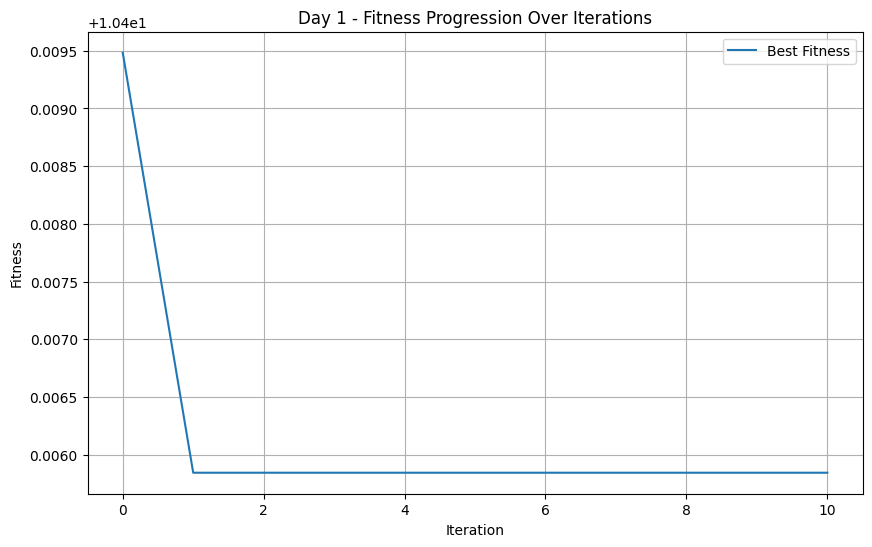

Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 10, Cost = 0.9999992566402426
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 18, Cost = 0.8005288597992837
===== Optimized Day 1 Schedule =====
Appliance 1: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0

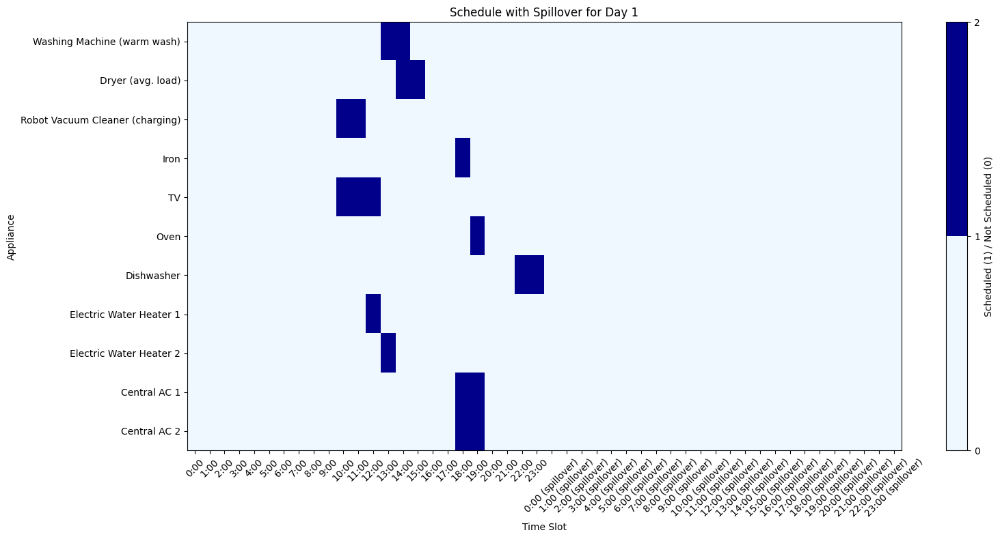

Best Fitness: 10.405844165502653
Updated Fitness: 10.405844165502653

===== Hourly Breakdown for Day 1 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              0.00
 1     0.00              0.00              0.00
 2     0.00              0.00              0.00
 3     0.00              0.00              0.00
 4     0.00              0.00              0.00
 5     0.00              0.00              0.00
 6     1.61              0.00              1.61
 7     3.97              0.00              5.58
 8     4.99              0.00              10.57
 9     5.12              0.00              15.68
10     4.25              0.16              19.78
11     4.21              0.16              23.83
12     3.99              0.85              26.97
13     3.16              2.70              27.43
14     3.11              5.00              25.54
15     2.15              3.00       

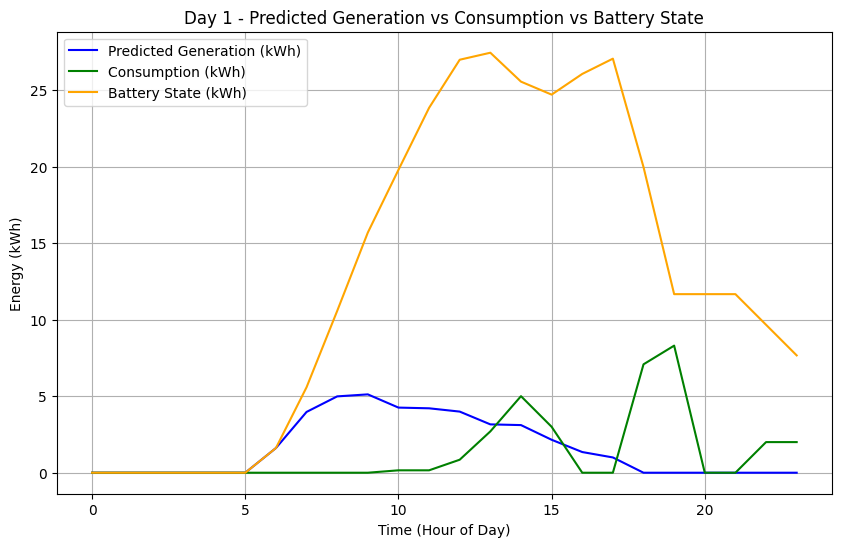

Simulating Day 2
[✔️] Appliance 0 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 11 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 7 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

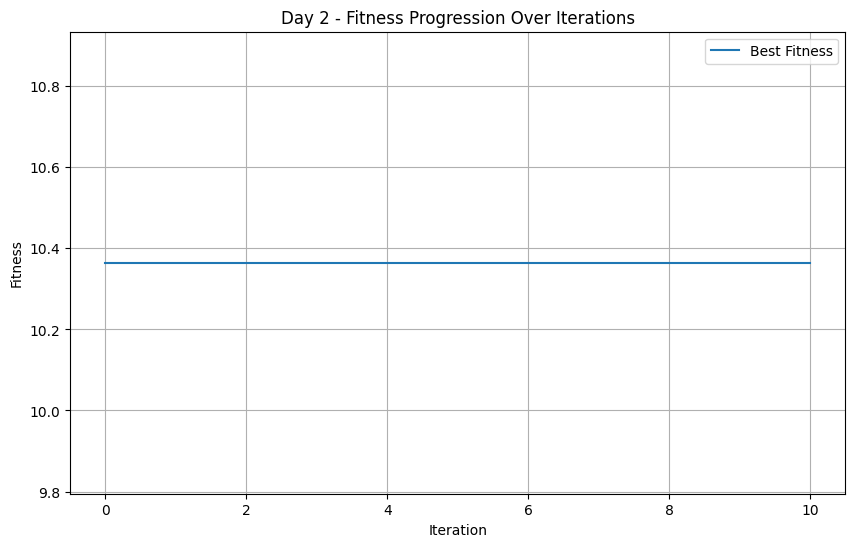

Appliance 0: Start Time = 19, Cost = 0.9999975179847098
Appliance 1: Start Time = 11, Cost = 0.9453299751080021
Appliance 2: Start Time = 3, Cost = 0.9202115439197135
Appliance 3: Start Time = 11, Cost = 0.995568151588062
Appliance 4: Start Time = 19, Cost = 0.8239673366178503
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 11, Cost = 0.9999985132804853
Appliance 8: Start Time = 5, Cost = 1.0
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 7, Cost = 0.9999999461511998
===== Optimized Day 2 Schedule =====
Appliance 1: Start Time 19, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 

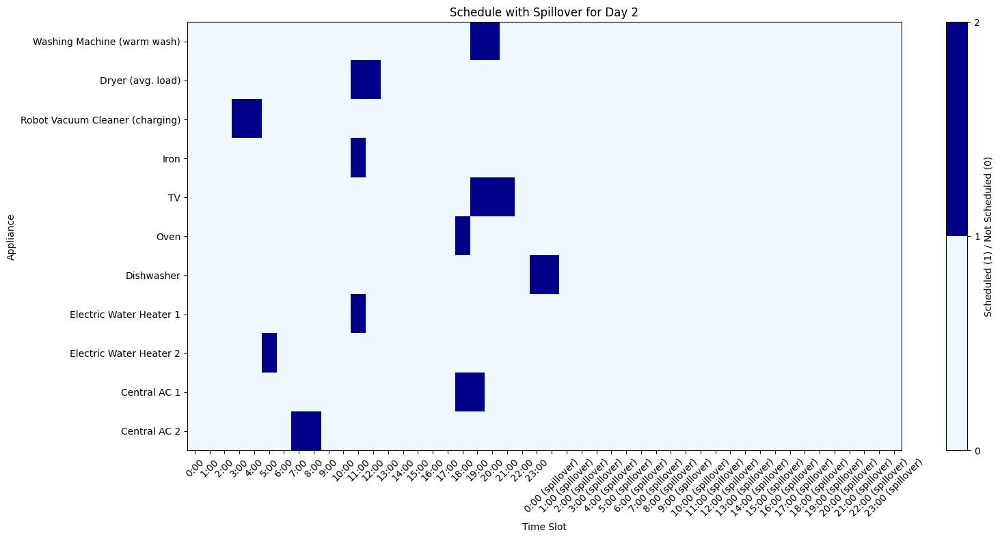

Best Fitness: 10.364616479151792
Updated Fitness: 10.364616479151792

===== Hourly Breakdown for Day 2 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              7.66
 1     0.00              0.00              7.66
 2     0.00              0.00              7.66
 3     0.00              0.01              7.66
 4     0.00              0.01              7.65
 5     0.00              0.70              6.95
 6     2.34              0.00              9.29
 7     3.79              3.00              10.08
 8     4.55              3.00              11.63
 9     5.37              0.00              17.01
10     3.86              0.00              20.87
11     3.35              4.78              19.44
12     3.77              3.00              20.21
13     1.93              0.00              22.14
14     1.91              0.00              24.05
15     1.30              0.00      

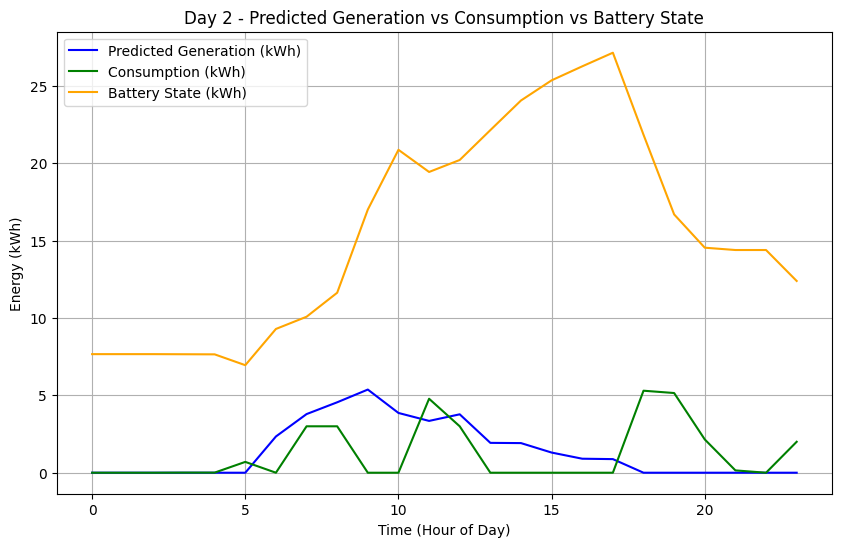

Simulating Day 3
[✔️] Appliance 0 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 13 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

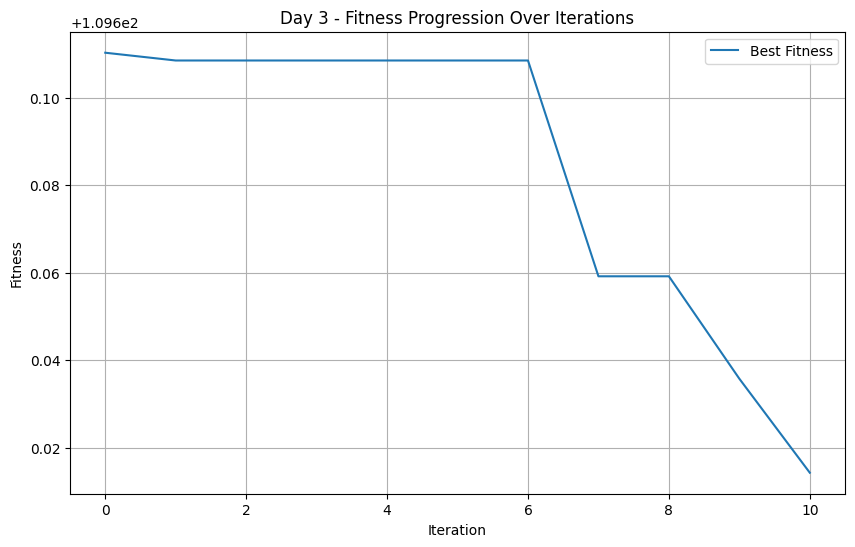

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 11, Cost = 0.9453299751080021
Appliance 2: Start Time = 6, Cost = 0.9333550794216401
Appliance 3: Start Time = 6, Cost = 0.946009033486812
Appliance 4: Start Time = 14, Cost = 0.997784075794031
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 1, Cost = 0.9999985132804853
Appliance 8: Start Time = 10, Cost = 0.9999999999908653
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 13, Cost = 0.9912358497532158
===== Optimized Day 3 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 

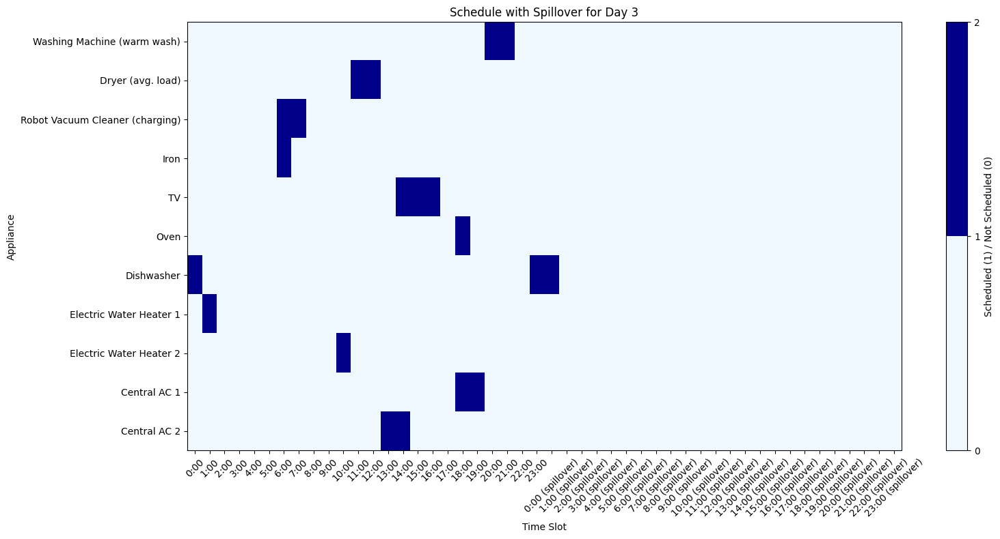

Best Fitness: 109.61424088802322
Updated Fitness: 109.61424088802322

===== Hourly Breakdown for Day 3 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              10.39
 1     0.00              0.70              9.69
 2     0.00              0.00              9.69
 3     0.00              0.00              9.69
 4     0.00              0.00              9.69
 5     0.00              0.00              9.69
 6     1.25              1.09              9.86
 7     2.16              0.01              12.01
 8     3.39              0.00              15.40
 9     3.90              0.00              19.30
10     4.01              0.70              22.62
11     3.40              3.00              23.02
12     2.54              3.00              22.56
13     2.34              3.00              21.90
14     1.97              3.15              20.72
15     1.58              0.15     

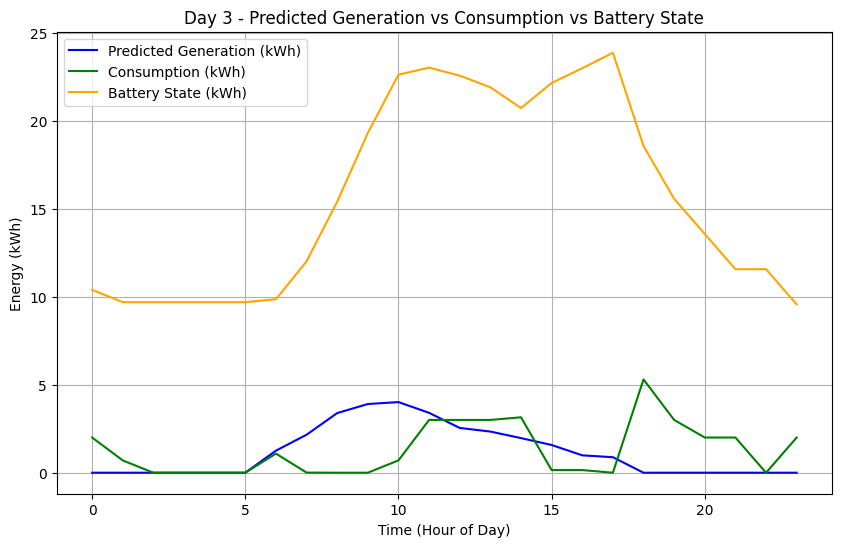

Simulating Day 4
[✔️] Appliance 0 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 23 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 12 (valid range: 0-23)
Initial_solution: [[0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

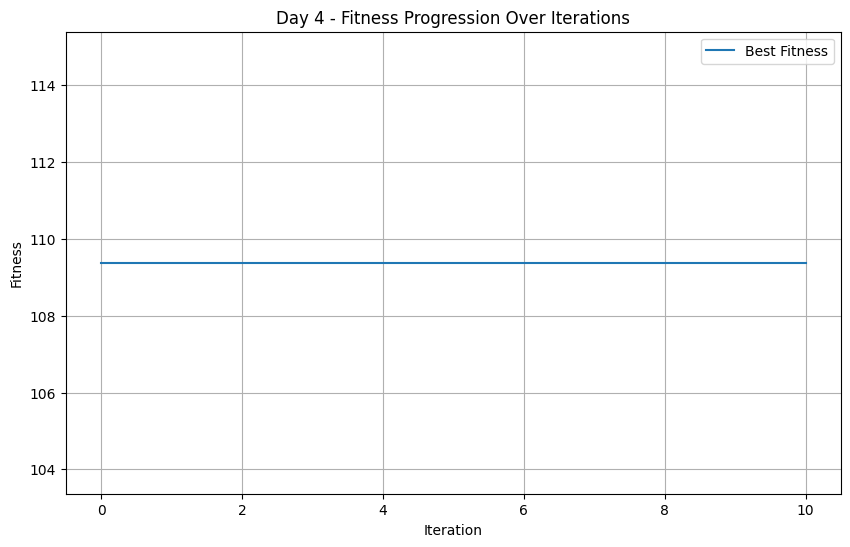

Appliance 0: Start Time = 3, Cost = 0.8935173314925493
Appliance 1: Start Time = 23, Cost = 0.999999911456603
Appliance 2: Start Time = 8, Cost = 0.9516058550961713
Appliance 3: Start Time = 22, Cost = 1.0
Appliance 4: Start Time = 11, Cost = 0.9999920081294466
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 18, Cost = 1.0
Appliance 8: Start Time = 19, Cost = 0.946009033486812
Appliance 9: Start Time = 6, Cost = 0.8005288597992837
Appliance 10: Start Time = 12, Cost = 0.997784075794031
===== Optimized Day 4 Schedule =====
Appliance 1: Start Time 3, Duration 2
Time Slots (first 24): [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 23, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
App

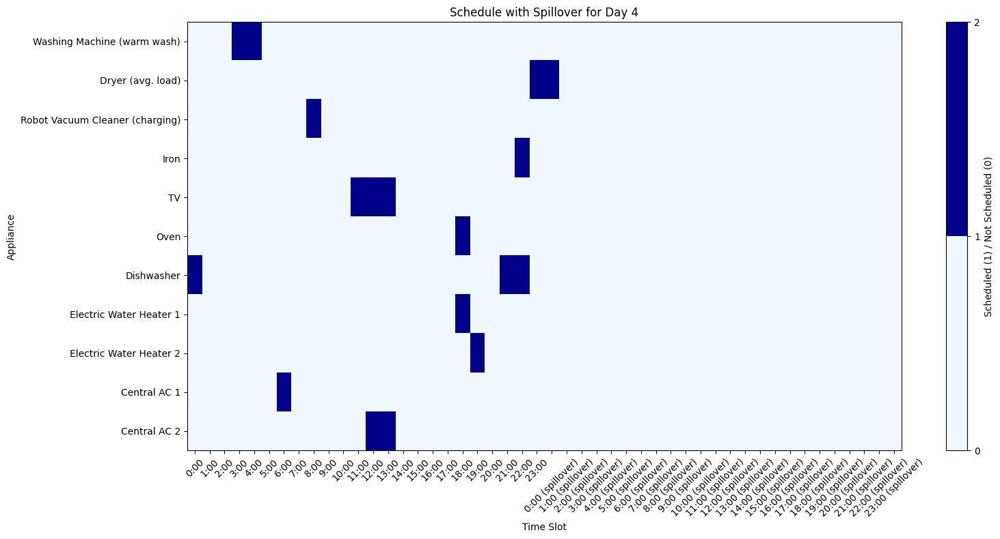

Best Fitness: 109.38042176940571
Updated Fitness: 109.38996593505419

===== Hourly Breakdown for Day 4 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              7.57
 1     0.00              0.00              7.57
 2     0.00              0.00              7.57
 3     0.00              2.00              5.57
 4     0.00              2.00              3.57
 5     0.00              0.00              3.57
 6     1.46              3.00              2.02
 7     3.20              0.00              3.20
 8     5.36              0.01              8.56
 9     5.06              0.00              13.61
10     5.39              0.00              19.00
11     4.55              0.15              23.41
12     2.69              3.15              22.94
13     1.84              3.15              21.63
14     1.94              0.00              23.57
15     1.66              0.00        

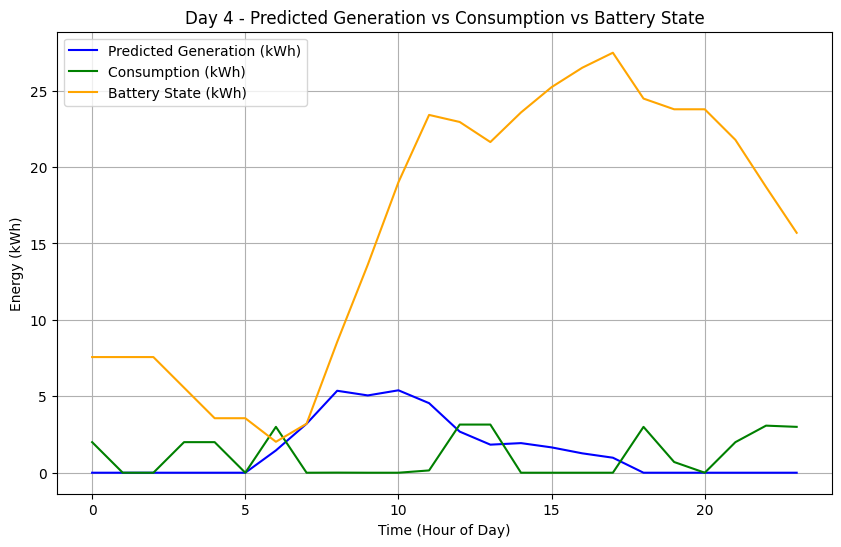

Simulating Day 5
[✔️] Appliance 0 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

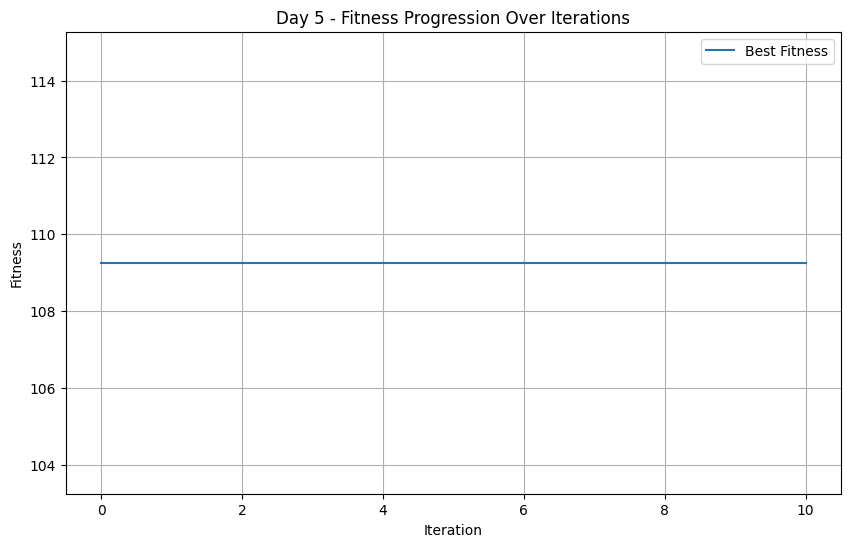

Appliance 0: Start Time = 5, Cost = 0.8670192398661891
Appliance 1: Start Time = 0, Cost = 100.0
Appliance 2: Start Time = 17, Cost = 0.998416909683404
Appliance 3: Start Time = 10, Cost = 0.946009033486812
Appliance 4: Start Time = 8, Cost = 0.9999999969620585
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 23, Cost = 1.0
Appliance 8: Start Time = 2, Cost = 1.0
Appliance 9: Start Time = 5, Cost = 0.8239673366178503
Appliance 10: Start Time = 4, Cost = 0.9999999999954327
===== Optimized Day 5 Schedule =====
Appliance 1: Start Time 5, Duration 2
Time Slots (first 24): [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appli

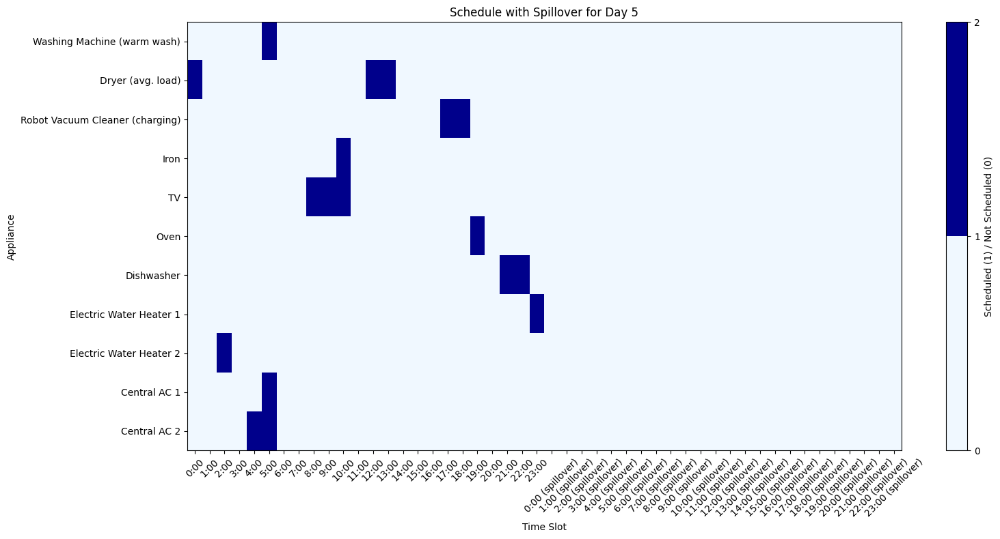

Best Fitness: 109.2599087130289
Updated Fitness: 109.2599087130289

===== Hourly Breakdown for Day 5 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              12.69
 1     0.00              0.00              12.69
 2     0.00              0.70              11.99
 3     0.00              0.00              11.99
 4     0.00              3.00              8.99
 5     0.00              8.00              0.99
 6     1.97              0.00              1.97
 7     4.00              0.00              5.97
 8     5.77              0.15              11.59
 9     4.95              0.15              16.38
10     5.00              1.23              20.15
11     4.59              0.00              24.74
12     4.06              3.00              25.81
13     3.88              3.00              26.68
14     2.71              0.00              29.39
15     2.95              0.00     

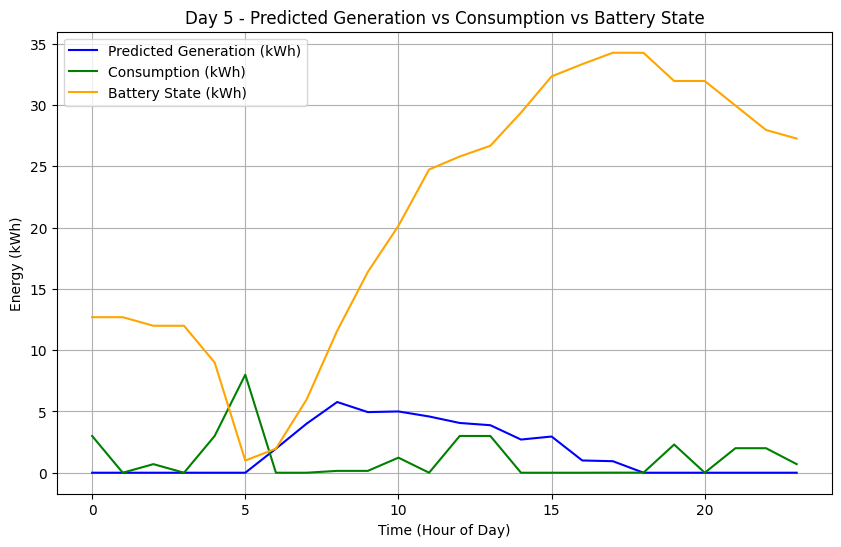

Simulating Day 6
[✔️] Appliance 0 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 22 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 0 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

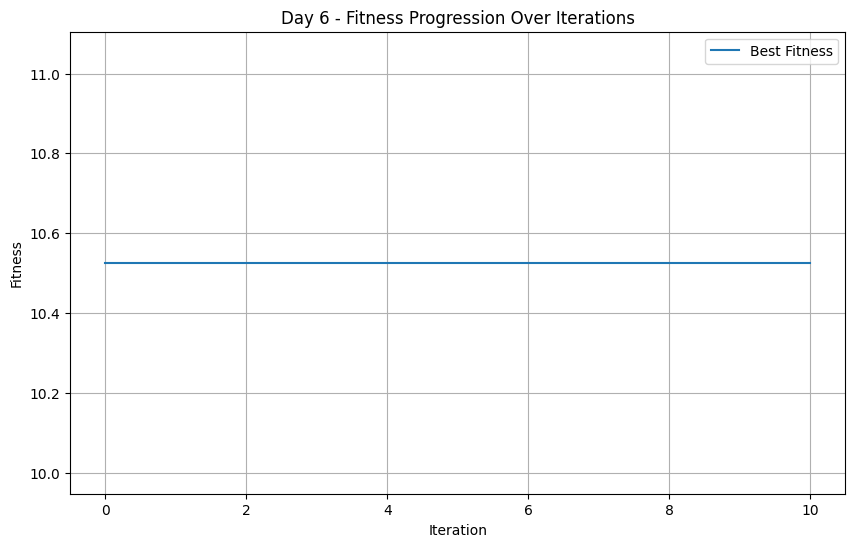

Appliance 0: Start Time = 14, Cost = 0.9985227171960207
Appliance 1: Start Time = 22, Cost = 0.9999995044268284
Appliance 2: Start Time = 6, Cost = 0.9333550794216401
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 2, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 4, Cost = 0.946009033486812
Appliance 8: Start Time = 23, Cost = 0.9999999939241172
Appliance 9: Start Time = 21, Cost = 0.9999999999998783
Appliance 10: Start Time = 0, Cost = 1.0
===== Optimized Day 6 Schedule =====
Appliance 1: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Ap

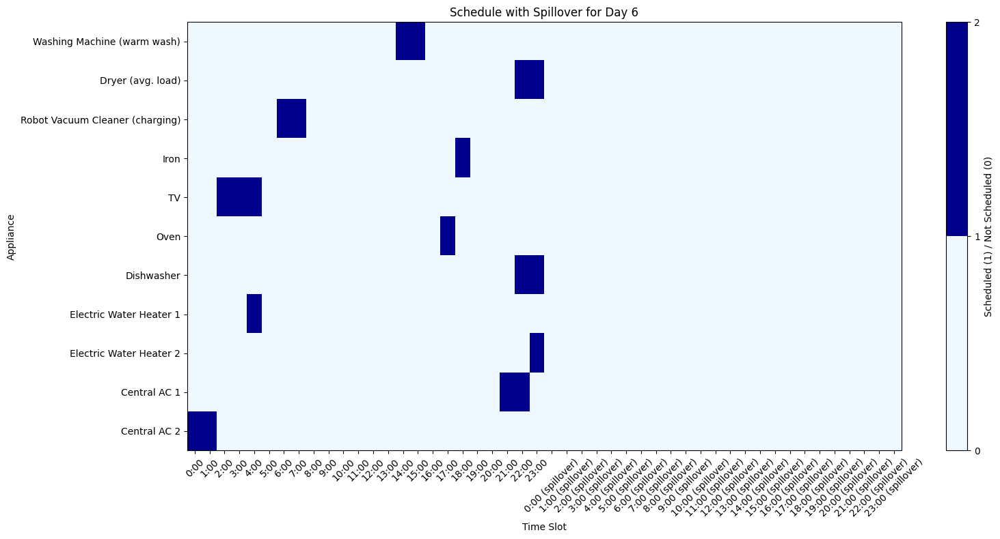

Best Fitness: 10.525821001690996
Updated Fitness: 10.525821001690996

===== Hourly Breakdown for Day 6 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              24.27
 1     0.00              3.00              21.27
 2     0.00              0.15              21.12
 3     0.00              0.15              20.97
 4     0.00              0.85              20.12
 5     0.00              0.00              20.12
 6     1.72              0.01              21.84
 7     4.39              0.01              26.22
 8     5.38              0.00              31.60
 9     5.49              0.00              37.09
10     5.72              0.00              42.81
11     5.97              0.00              48.78
12     6.03              0.00              54.81
13     5.07              0.00              59.88
14     3.85              2.00              61.72
15     3.15              2.0

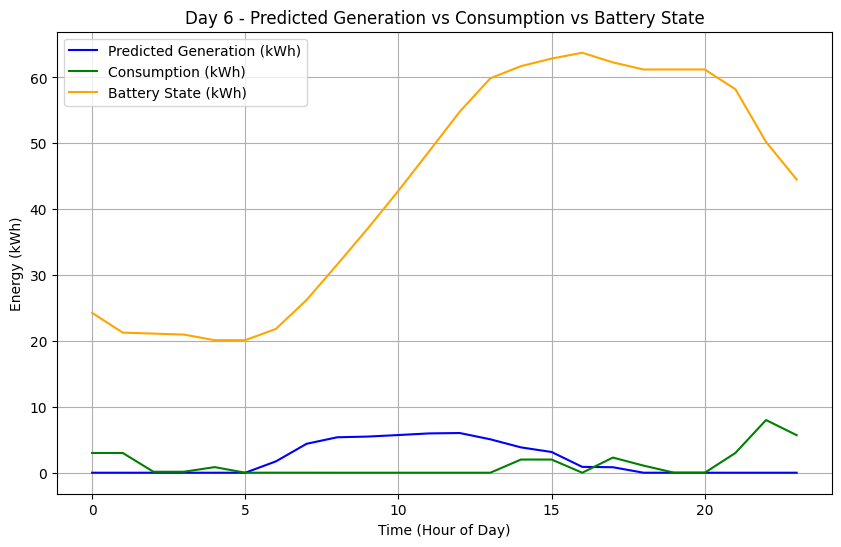

Simulating Day 7
[✔️] Appliance 0 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 18 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

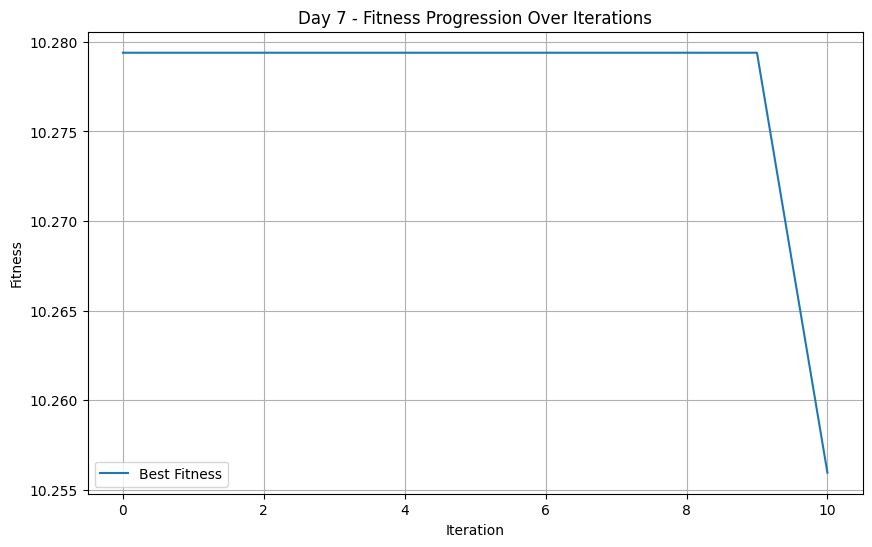

Appliance 0: Start Time = 8, Cost = 0.9193430918269522
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 15, Cost = 0.9999999999908653
Appliance 4: Start Time = 9, Cost = 0.9999999461511998
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 6, Cost = 1.0
Appliance 9: Start Time = 9, Cost = 0.9352412021670541
Appliance 10: Start Time = 18, Cost = 0.8005288597992837
===== Optimized Day 7 Schedule =====
Appliance 1: Start Time 8, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 

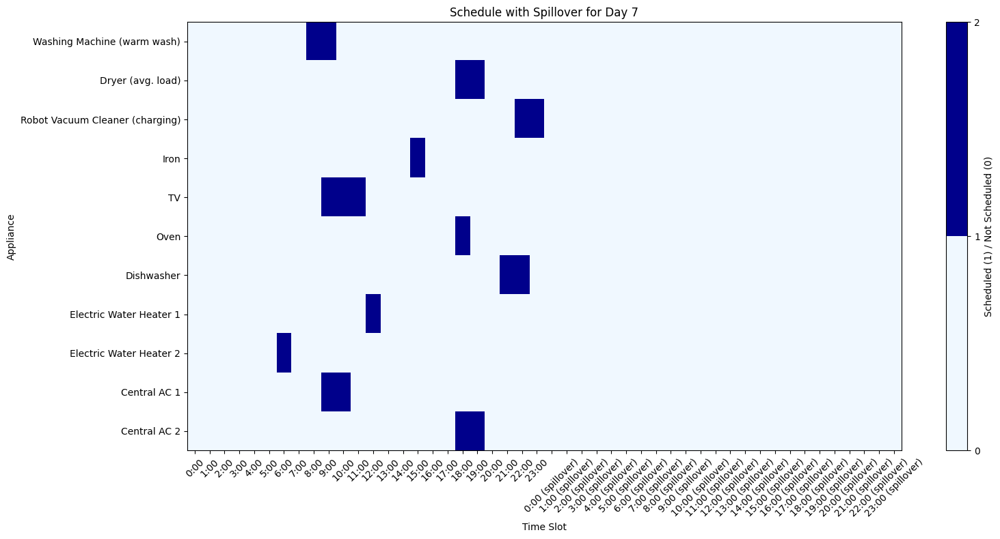

Best Fitness: 10.255952333855674
Updated Fitness: 10.255952333855674

===== Hourly Breakdown for Day 7 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              44.51
 1     0.00              0.00              44.51
 2     0.00              0.00              44.51
 3     0.00              0.00              44.51
 4     0.00              0.00              44.51
 5     0.00              0.00              44.51
 6     2.11              0.70              45.93
 7     3.66              0.00              49.58
 8     4.88              2.00              52.46
 9     5.52              5.15              52.83
10     4.75              3.15              54.44
11     4.59              0.15              58.88
12     4.77              0.70              62.95
13     3.92              0.00              66.87
14     3.28              0.00              70.15
15     2.03              1.0

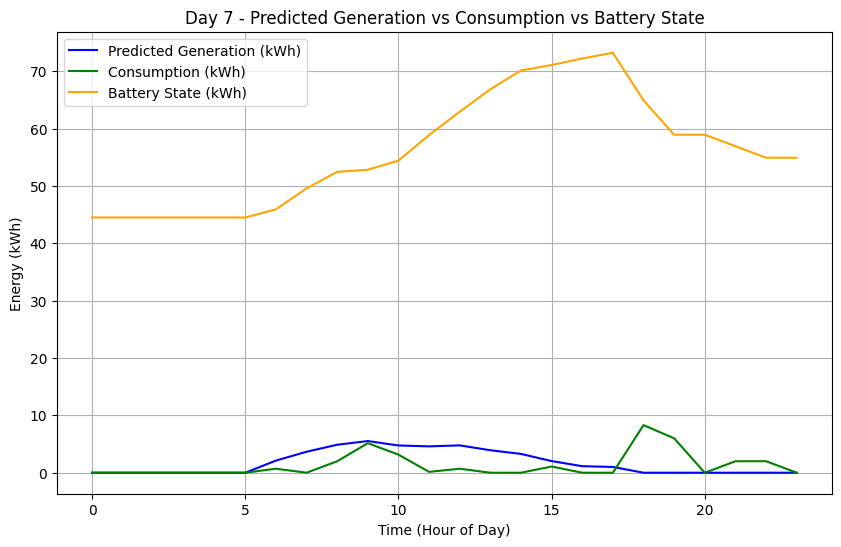

Simulating Day 8
[✔️] Appliance 0 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 22 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 16 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

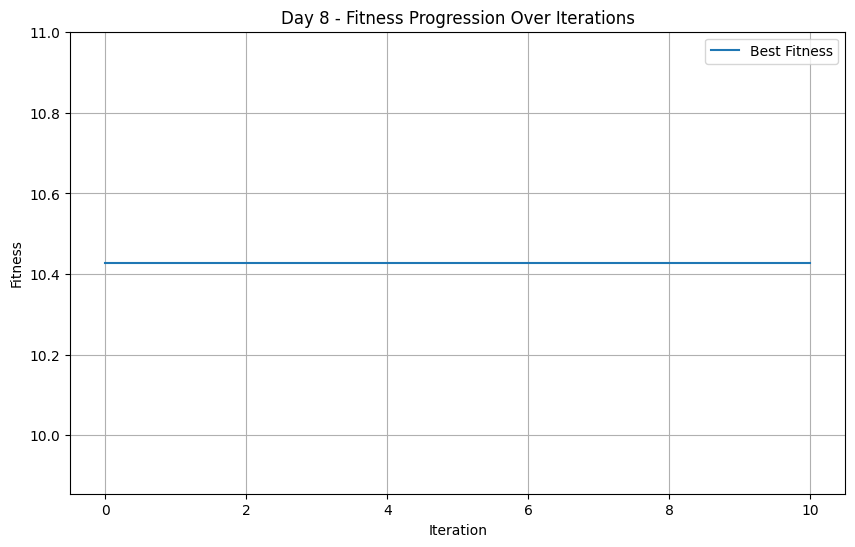

Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 22, Cost = 0.9999995044268284
Appliance 2: Start Time = 8, Cost = 0.9516058550961713
Appliance 3: Start Time = 3, Cost = 0.9999985132804853
Appliance 4: Start Time = 8, Cost = 0.9999999969620585
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 1, Cost = 0.9999985132804853
Appliance 8: Start Time = 3, Cost = 1.0
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 16, Cost = 0.8790146377404283
===== Optimized Day 8 Schedule =====
Appliance 1: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0

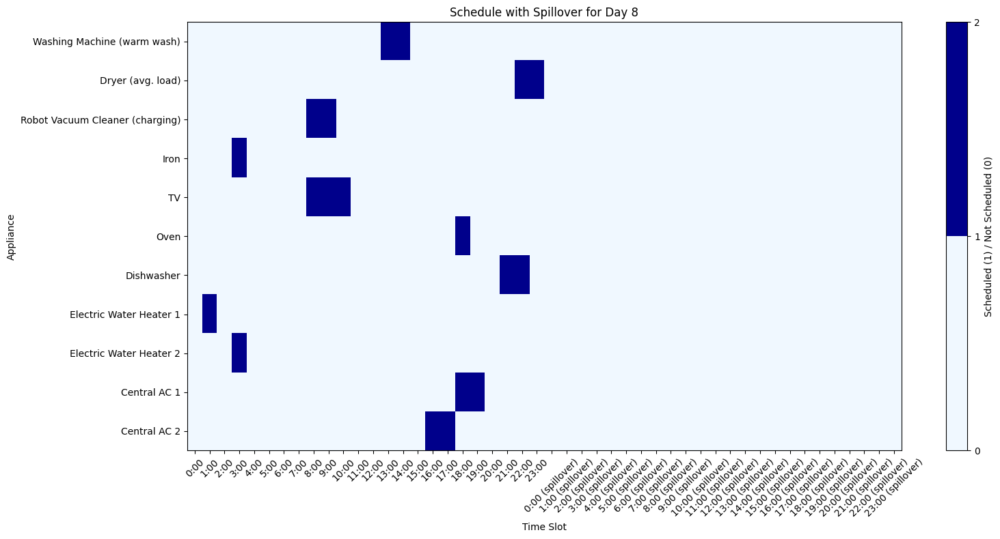

Best Fitness: 10.427876075339151
Updated Fitness: 10.427876075339151

===== Hourly Breakdown for Day 8 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              54.93
 1     0.00              0.70              54.23
 2     0.00              0.00              54.23
 3     0.00              1.78              52.45
 4     0.00              0.00              52.45
 5     0.00              0.00              52.45
 6     2.32              0.00              54.77
 7     4.22              0.00              58.99
 8     4.50              0.16              63.33
 9     5.05              0.16              68.23
10     4.41              0.15              72.49
11     4.28              0.00              76.76
12     4.71              0.00              81.48
13     4.60              2.00              84.08
14     3.10              2.00              85.17
15     2.68              0.0

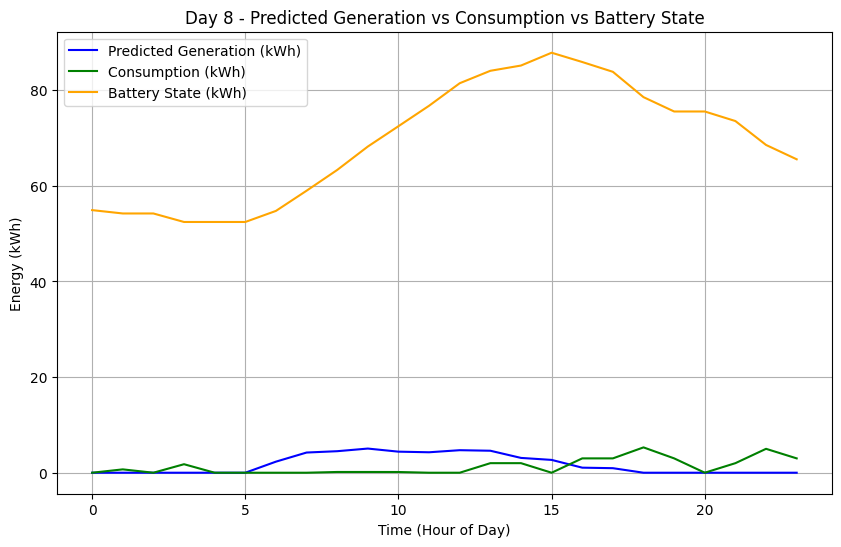

Simulating Day 9
[✔️] Appliance 0 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 19 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 0 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

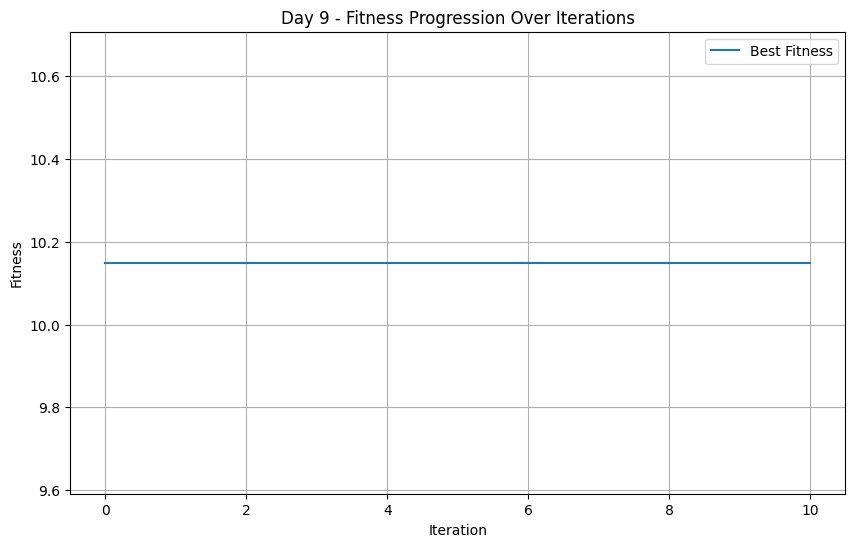

Appliance 0: Start Time = 7, Cost = 0.8935173314925493
Appliance 1: Start Time = 19, Cost = 0.9999553899247451
Appliance 2: Start Time = 9, Cost = 0.9611627890033574
Appliance 3: Start Time = 8, Cost = 0.6010577195985674
Appliance 4: Start Time = 13, Cost = 0.9995636586524771
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 14, Cost = 0.9999999999999949
Appliance 8: Start Time = 21, Cost = 0.9998661697742351
Appliance 9: Start Time = 1, Cost = 0.9912358497532158
Appliance 10: Start Time = 0, Cost = 1.0
===== Optimized Day 9 Schedule =====
Appliance 1: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 19, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 

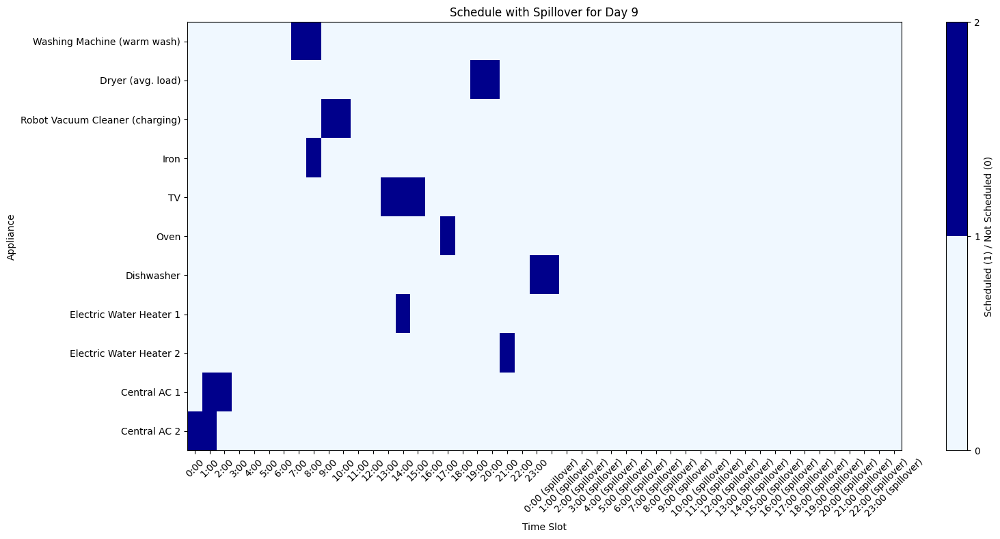

Best Fitness: 10.14934088255742
Updated Fitness: 10.14934088255742

===== Hourly Breakdown for Day 9 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              62.56
 1     0.00              6.00              56.56
 2     0.00              3.00              53.56
 3     0.00              0.00              53.56
 4     0.00              0.00              53.56
 5     0.00              0.00              53.56
 6     2.91              0.00              56.48
 7     4.05              2.00              58.53
 8     4.07              3.08              59.52
 9     4.65              0.01              64.16
10     4.79              0.01              68.95
11     4.92              0.00              73.86
12     4.77              0.00              78.63
13     3.78              0.15              82.27
14     2.49              0.85              83.91
15     1.77              0.15 

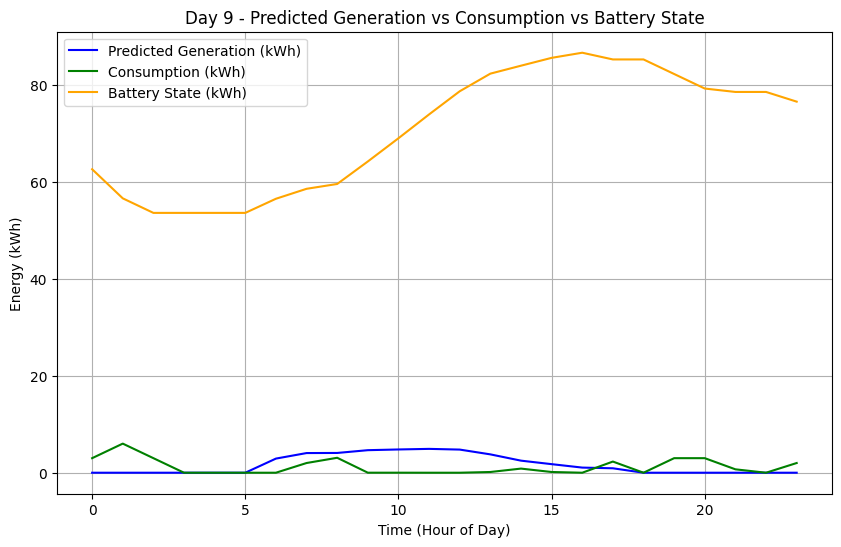

Simulating Day 10
[✔️] Appliance 0 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 8 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 14 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

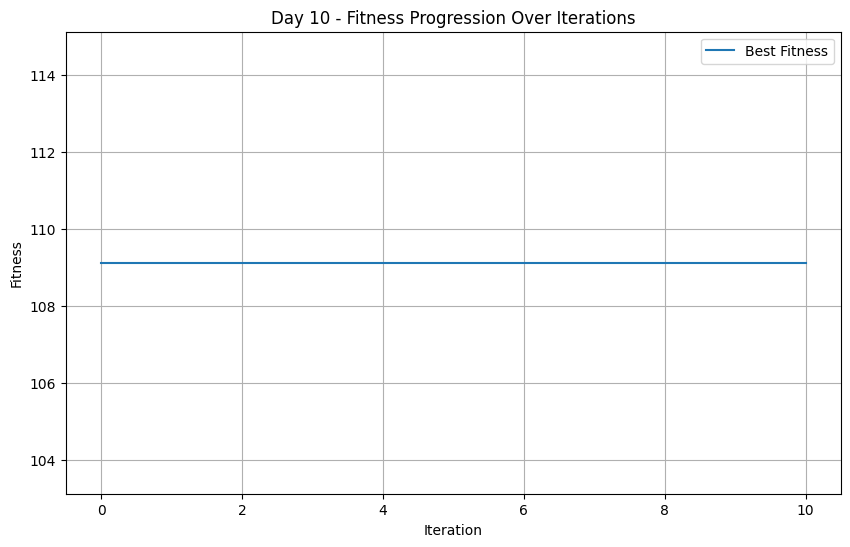

Appliance 0: Start Time = 7, Cost = 0.8935173314925493
Appliance 1: Start Time = 8, Cost = 0.8742055907690023
Appliance 2: Start Time = 4, Cost = 0.9217914612049088
Appliance 3: Start Time = 13, Cost = 0.9999985132804853
Appliance 4: Start Time = 16, Cost = 0.9730045167434059
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 7, Cost = 0.7580292754808566
Appliance 8: Start Time = 2, Cost = 1.0
Appliance 9: Start Time = 9, Cost = 0.9352412021670541
Appliance 10: Start Time = 14, Cost = 0.9730045167434059
===== Optimized Day 10 Schedule =====
Appliance 1: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 8, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

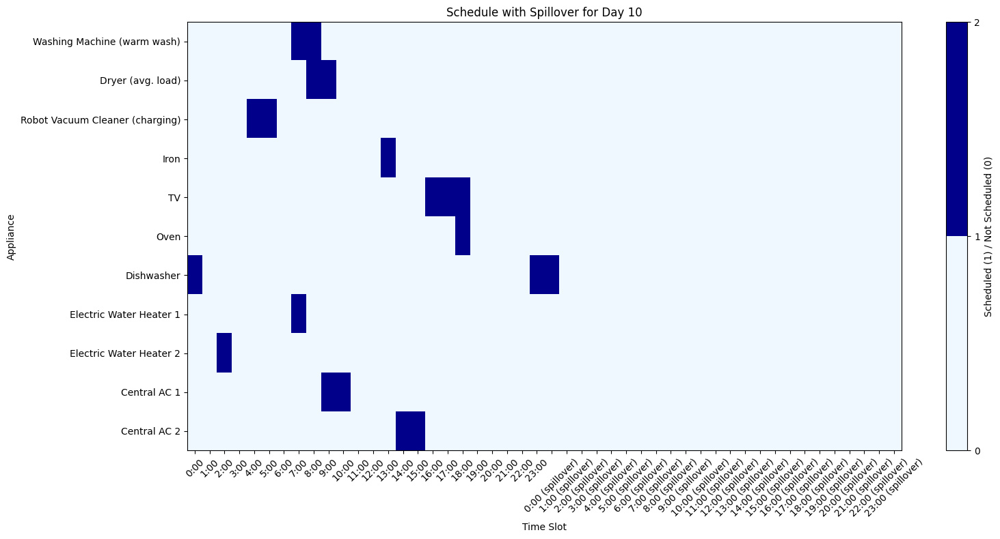

Best Fitness: 109.12932126768094
Updated Fitness: 109.12932126768094

===== Hourly Breakdown for Day 10 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              74.50
 1     0.00              0.00              74.50
 2     0.00              0.70              73.80
 3     0.00              0.00              73.80
 4     0.00              0.01              73.79
 5     0.00              0.01              73.78
 6     2.48              0.00              76.27
 7     4.67              2.70              78.24
 8     5.32              5.00              78.56
 9     5.61              6.00              78.17
10     5.72              3.00              80.89
11     5.59              0.00              86.48
12     5.56              0.00              92.04
13     3.49              1.08              94.44
14     4.06              3.00              95.50
15     2.21              3.

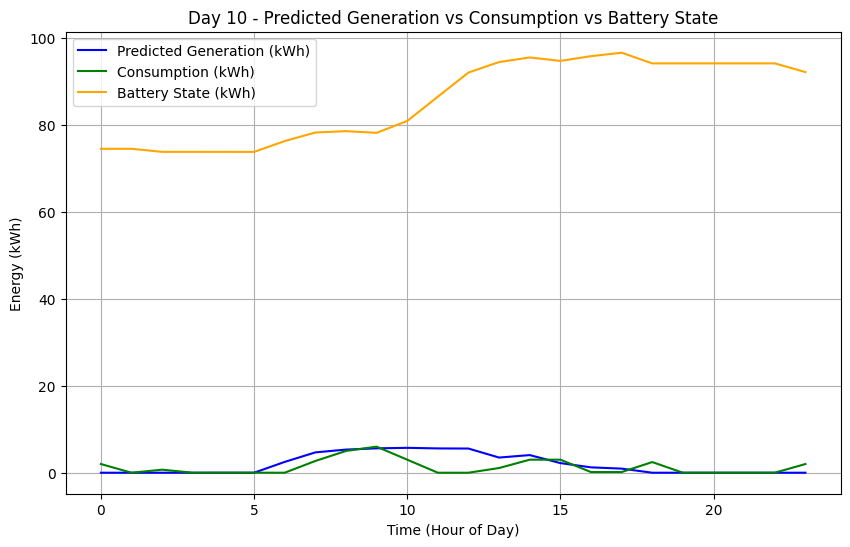

Simulating Day 11
[✔️] Appliance 0 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 13 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 8 (valid range: 0-23)
Initial_solution: [[0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

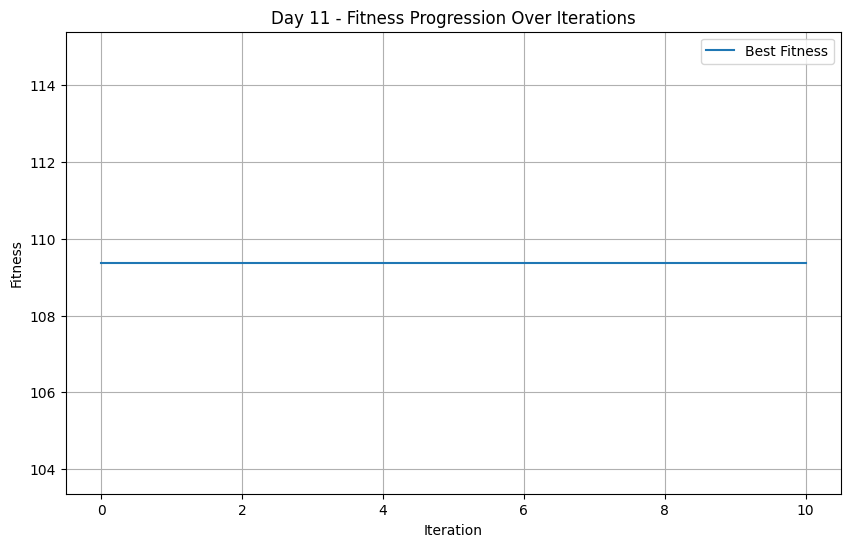

Appliance 0: Start Time = 2, Cost = 0.9193430918269522
Appliance 1: Start Time = 13, Cost = 0.9820030111622706
Appliance 2: Start Time = 3, Cost = 0.9202115439197135
Appliance 3: Start Time = 17, Cost = 1.0
Appliance 4: Start Time = 16, Cost = 0.9730045167434059
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 7, Cost = 0.7580292754808566
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 19, Cost = 0.9999999998665222
Appliance 10: Start Time = 8, Cost = 0.9999992566402426
===== Optimized Day 11 Schedule =====
Appliance 1: Start Time 2, Duration 2
Time Slots (first 24): [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

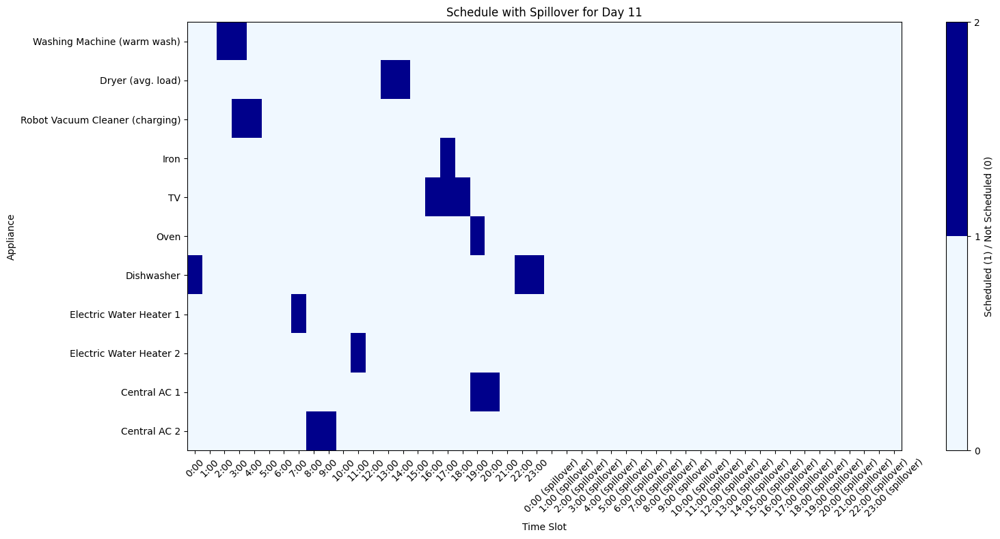

Best Fitness: 109.37655802618193
Updated Fitness: 109.37655802618193

===== Hourly Breakdown for Day 11 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              90.14
 1     0.00              0.00              90.14
 2     0.00              2.00              88.14
 3     0.00              2.01              86.13
 4     0.00              0.01              86.13
 5     0.00              0.00              86.13
 6     2.54              0.00              88.66
 7     5.24              0.70              93.20
 8     5.63              3.00              95.84
 9     5.79              3.00              98.62
10     5.79              0.00              100.00
11     5.91              0.70              100.00
12     5.68              0.00              100.00
13     5.11              3.00              100.00
14     4.99              3.00              100.00
15     3.12           

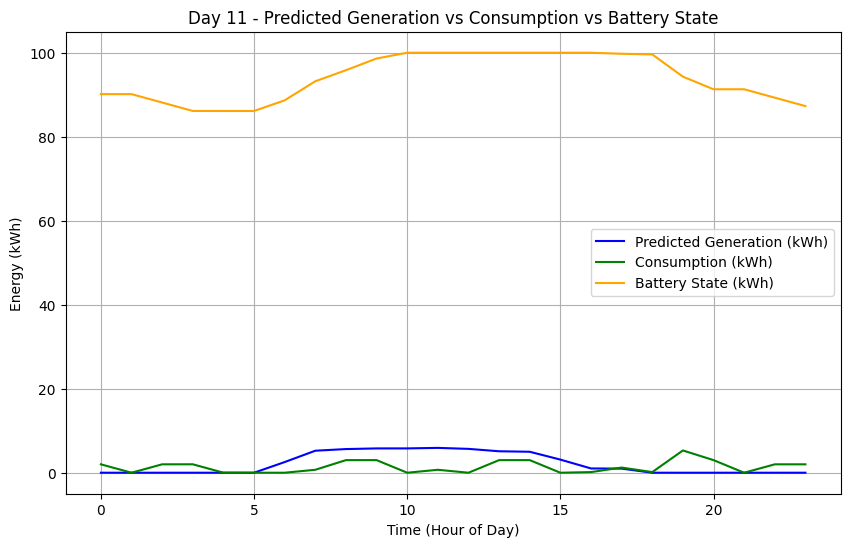

Simulating Day 12
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 14 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 21 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  

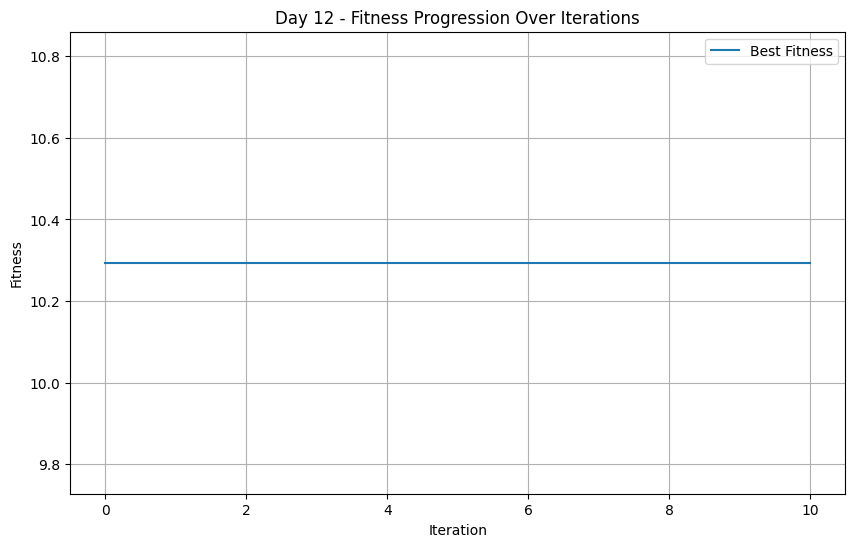

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 16, Cost = 0.9730045167434059
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 13, Cost = 0.9999999999908653
Appliance 8: Start Time = 15, Cost = 0.946009033486812
Appliance 9: Start Time = 6, Cost = 0.8005288597992837
Appliance 10: Start Time = 21, Cost = 0.9352412021670541
===== Optimized Day 12 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 

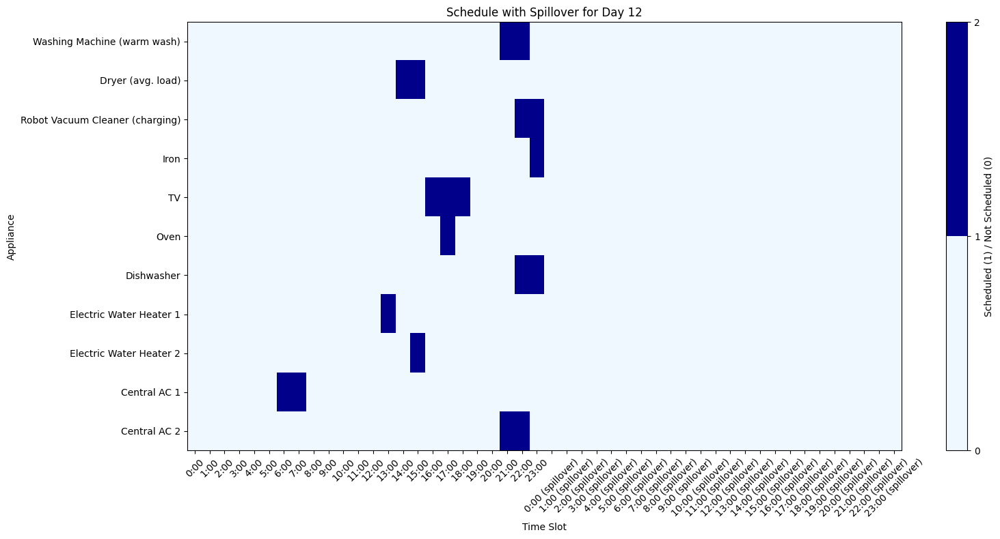

Best Fitness: 10.293919177796663
Updated Fitness: 10.293919177796663

===== Hourly Breakdown for Day 12 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              87.30
 1     0.00              0.00              87.30
 2     0.00              0.00              87.30
 3     0.00              0.00              87.30
 4     0.00              0.00              87.30
 5     0.00              0.00              87.30
 6     2.42              3.00              86.72
 7     5.09              3.00              88.81
 8     5.72              0.00              94.53
 9     6.02              0.00              100.00
10     5.79              0.00              100.00
11     5.74              0.00              100.00
12     5.69              0.00              100.00
13     4.29              0.70              100.00
14     4.87              3.00              100.00
15     3.02          

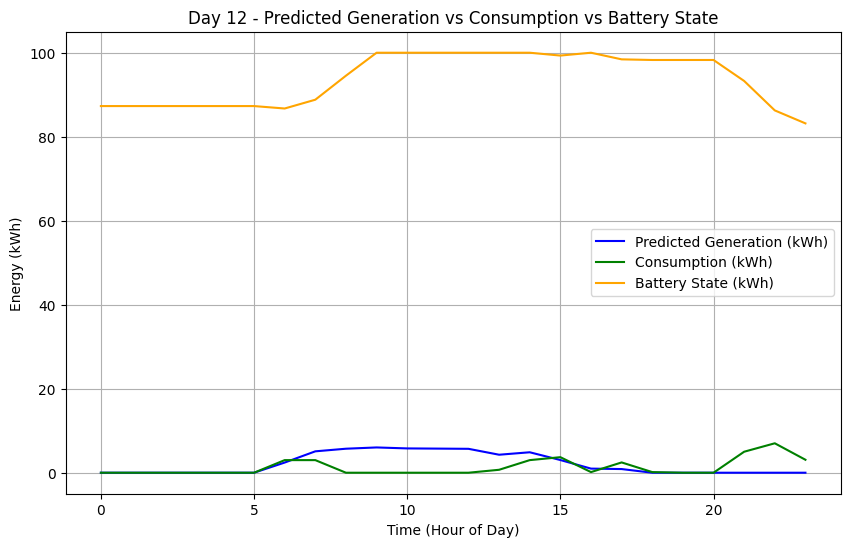

Simulating Day 13
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 17 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 19 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

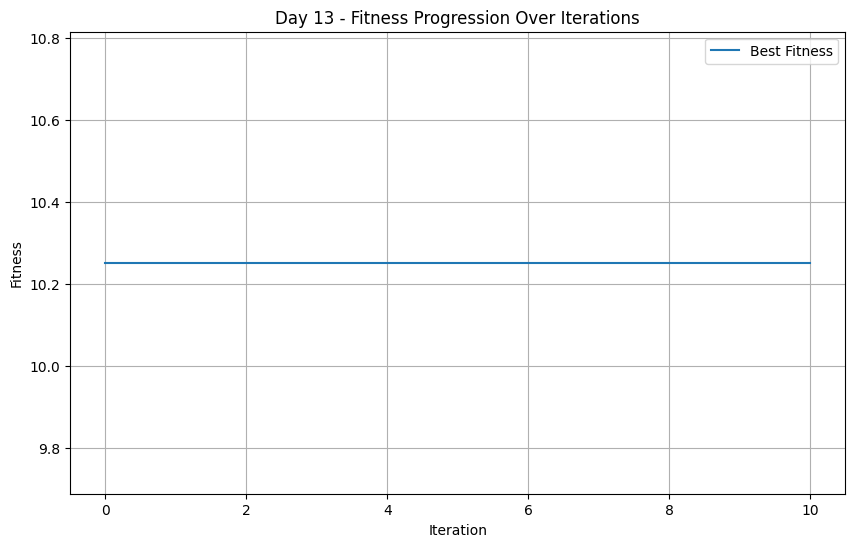

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 0, Cost = 0.9333550794216401
Appliance 3: Start Time = 14, Cost = 0.9999999939241172
Appliance 4: Start Time = 15, Cost = 0.9912358497532158
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 9, Cost = 0.9999999999999949
Appliance 9: Start Time = 4, Cost = 0.8790146377404283
Appliance 10: Start Time = 19, Cost = 0.8239673366178503
===== Optimized Day 13 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

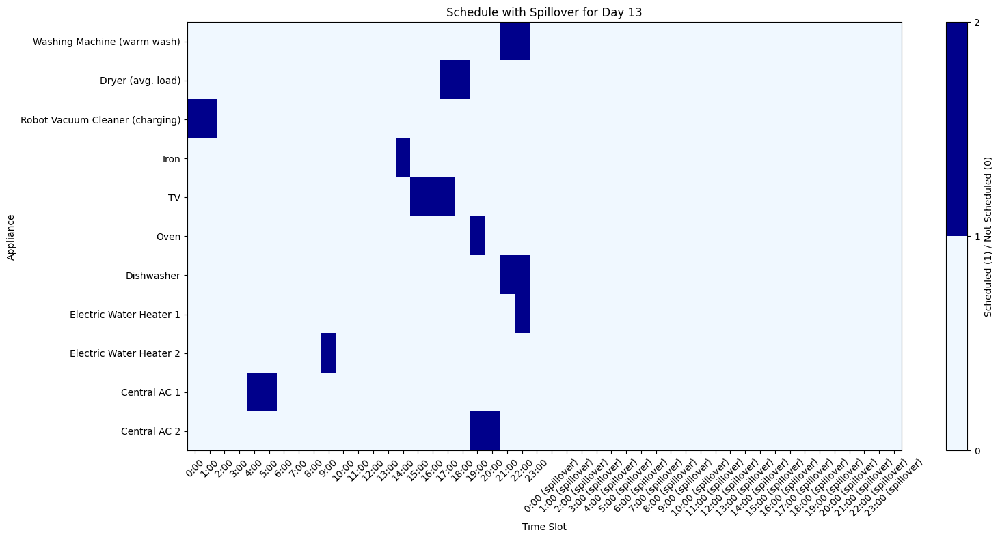

Best Fitness: 10.25155491233222
Updated Fitness: 10.25155491233222

===== Hourly Breakdown for Day 13 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.01              83.17
 1     0.00              0.01              83.16
 2     0.00              0.00              83.16
 3     0.00              0.00              83.16
 4     0.00              3.00              80.16
 5     0.00              3.00              77.16
 6     2.79              0.00              79.96
 7     5.27              0.00              85.23
 8     5.54              0.00              90.77
 9     5.76              0.70              95.83
10     6.04              0.00              100.00
11     6.03              0.00              100.00
12     5.93              0.00              100.00
13     5.03              0.00              100.00
14     5.37              1.08              100.00
15     3.66             

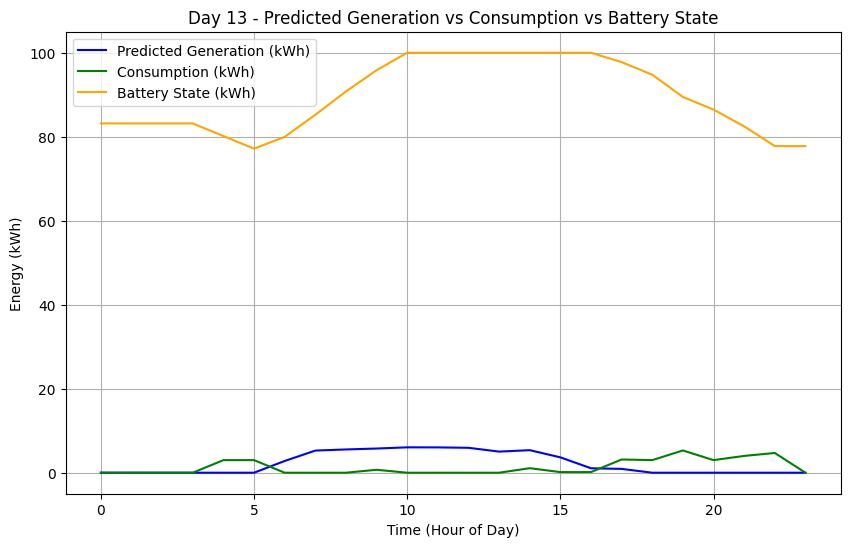

Simulating Day 14
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 10 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 17 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0

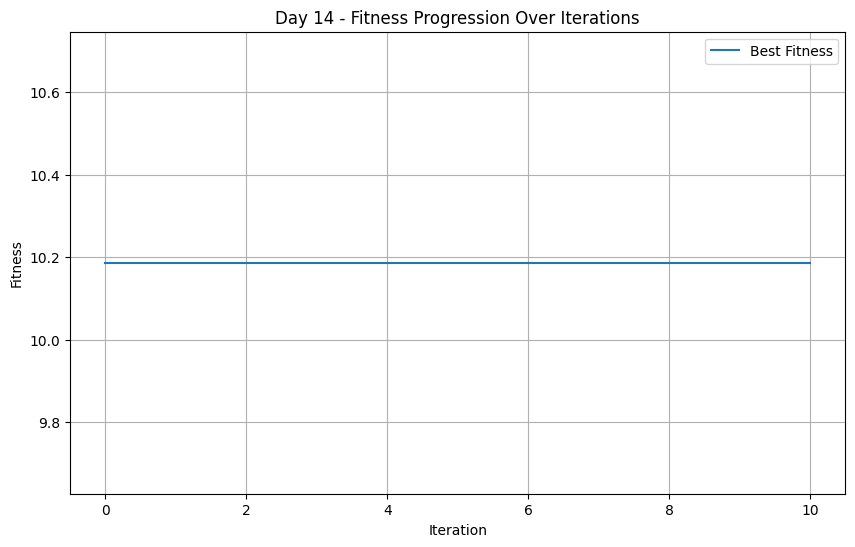

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 10, Cost = 0.9193430918269522
Appliance 2: Start Time = 18, Cost = 0.9991136303176124
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 20, Cost = 0.8005288597992837
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 9, Cost = 0.995568151588062
Appliance 8: Start Time = 4, Cost = 1.0
Appliance 9: Start Time = 14, Cost = 0.9999330848871175
Appliance 10: Start Time = 17, Cost = 0.8239673366178503
===== Optimized Day 14 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

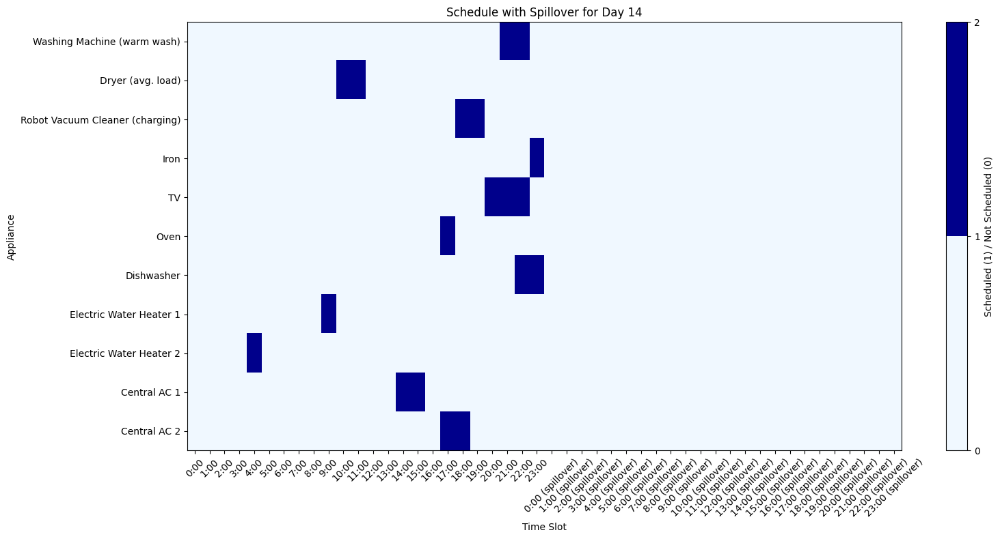

Best Fitness: 10.186388739729182
Updated Fitness: 10.186388739729182

===== Hourly Breakdown for Day 14 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              77.76
 1     0.00              0.00              77.76
 2     0.00              0.00              77.76
 3     0.00              0.00              77.76
 4     0.00              0.70              77.06
 5     0.00              0.00              77.06
 6     2.41              0.00              79.47
 7     5.17              0.00              84.64
 8     5.56              0.00              90.21
 9     5.90              0.70              95.41
10     5.91              3.00              98.31
11     6.03              3.00              100.00
12     6.00              0.00              100.00
13     4.51              0.00              100.00
14     3.76              3.00              100.00
15     2.29            

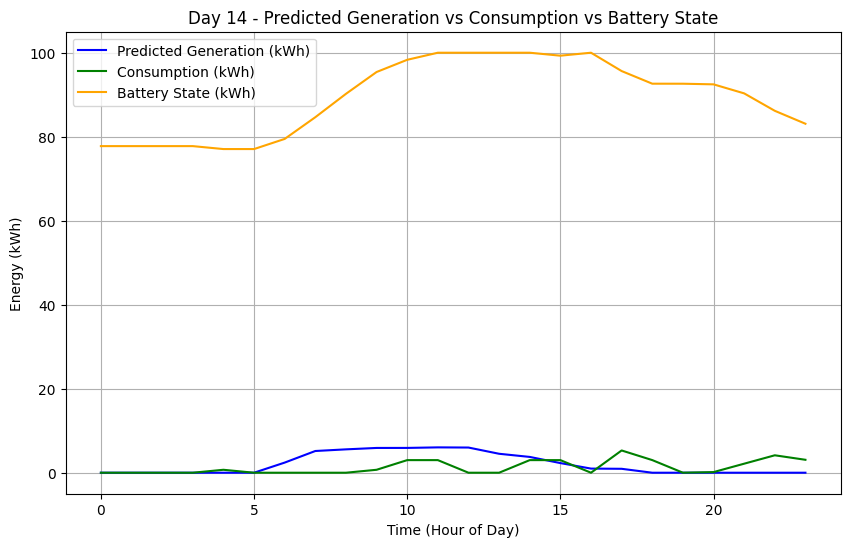

Simulating Day 15
[✔️] Appliance 0 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 23 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 10 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

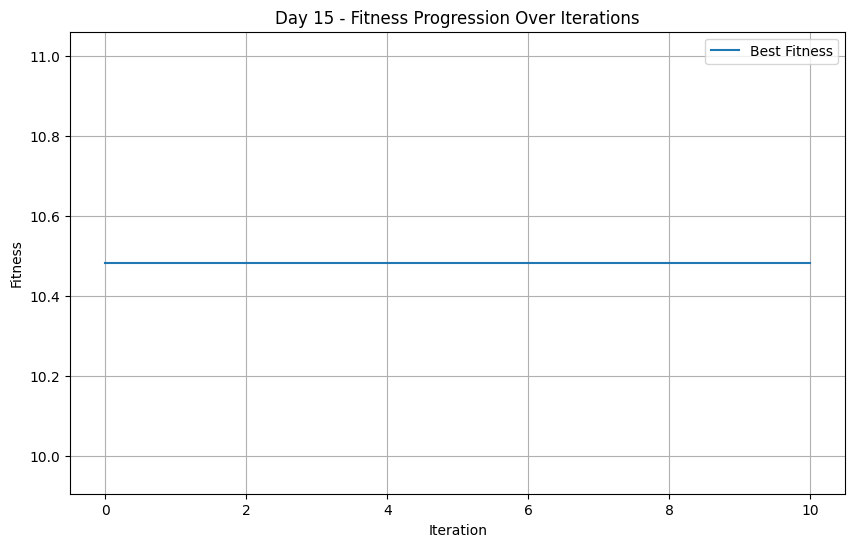

Appliance 0: Start Time = 6, Cost = 0.8742055907690023
Appliance 1: Start Time = 23, Cost = 0.999999911456603
Appliance 2: Start Time = 9, Cost = 0.9611627890033574
Appliance 3: Start Time = 1, Cost = 0.9999999999908653
Appliance 4: Start Time = 9, Cost = 0.9999999461511998
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 13, Cost = 0.9999999999908653
Appliance 8: Start Time = 10, Cost = 0.9999999999908653
Appliance 9: Start Time = 17, Cost = 0.9999999461511998
Appliance 10: Start Time = 10, Cost = 0.9999330848871175
===== Optimized Day 15 Schedule =====
Appliance 1: Start Time 6, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 23, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 

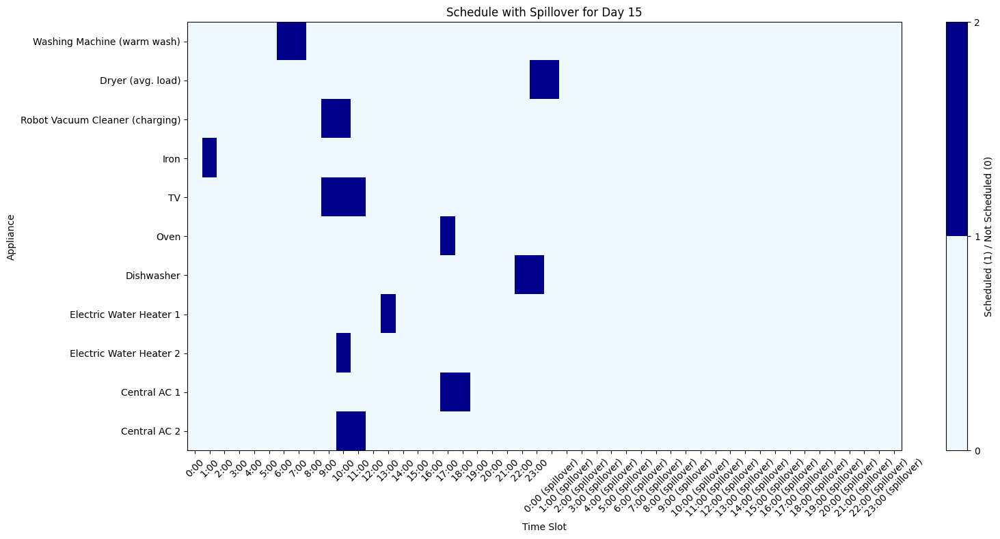

Best Fitness: 10.483235941626777
Updated Fitness: 10.483235941626777

===== Hourly Breakdown for Day 15 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              83.09
 1     0.00              1.08              82.01
 2     0.00              0.00              82.01
 3     0.00              0.00              82.01
 4     0.00              0.00              82.01
 5     0.00              0.00              82.01
 6     2.03              2.00              82.04
 7     4.66              2.00              84.69
 8     5.36              0.00              90.05
 9     5.39              0.16              95.28
10     5.27              3.86              96.69
11     5.26              3.15              98.80
12     5.03              0.00              100.00
13     4.19              0.70              100.00
14     3.60              0.00              100.00
15     2.25             

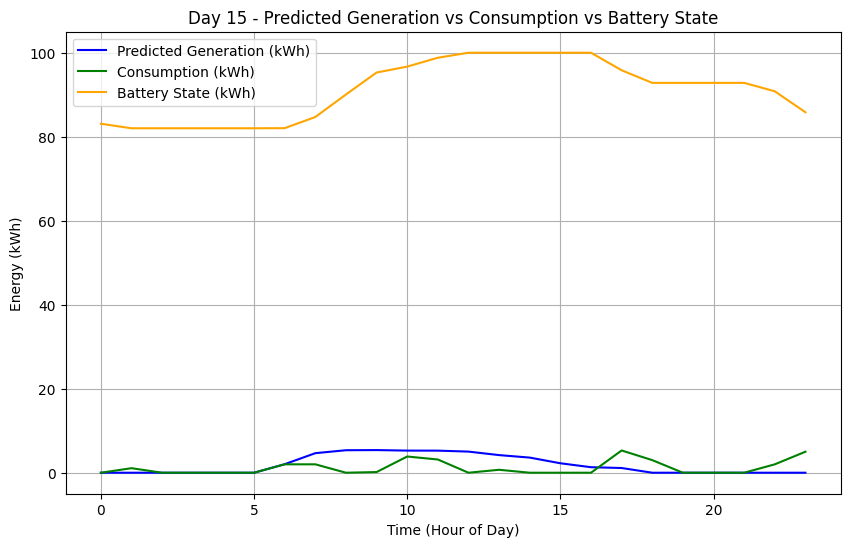

Simulating Day 16
[✔️] Appliance 0 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 10 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 7 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

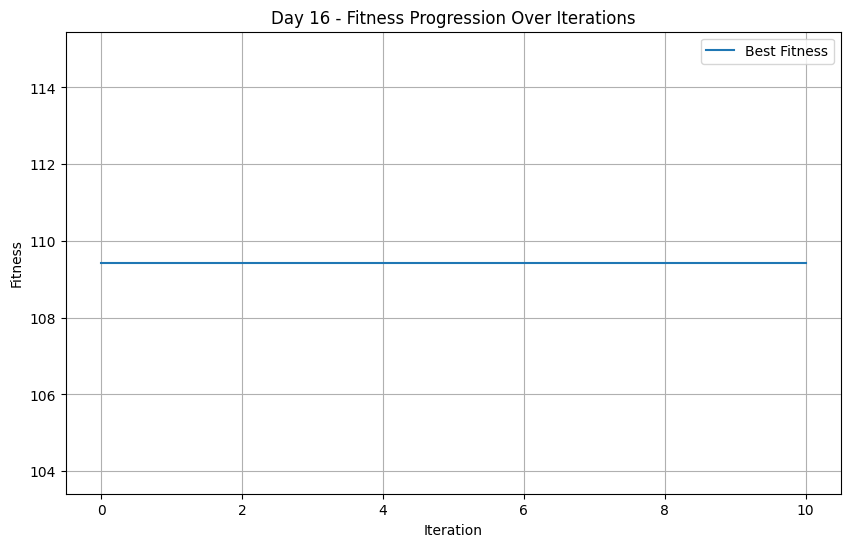

Appliance 0: Start Time = 5, Cost = 0.8670192398661891
Appliance 1: Start Time = 0, Cost = 100.0
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 2, Cost = 0.9999999939241172
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 4, Cost = 0.946009033486812
Appliance 8: Start Time = 20, Cost = 0.995568151588062
Appliance 9: Start Time = 15, Cost = 0.9999920081294466
Appliance 10: Start Time = 7, Cost = 0.9999999461511998
===== Optimized Day 16 Schedule =====
Appliance 1: Start Time 5, Duration 2
Time Slots (first 24): [0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

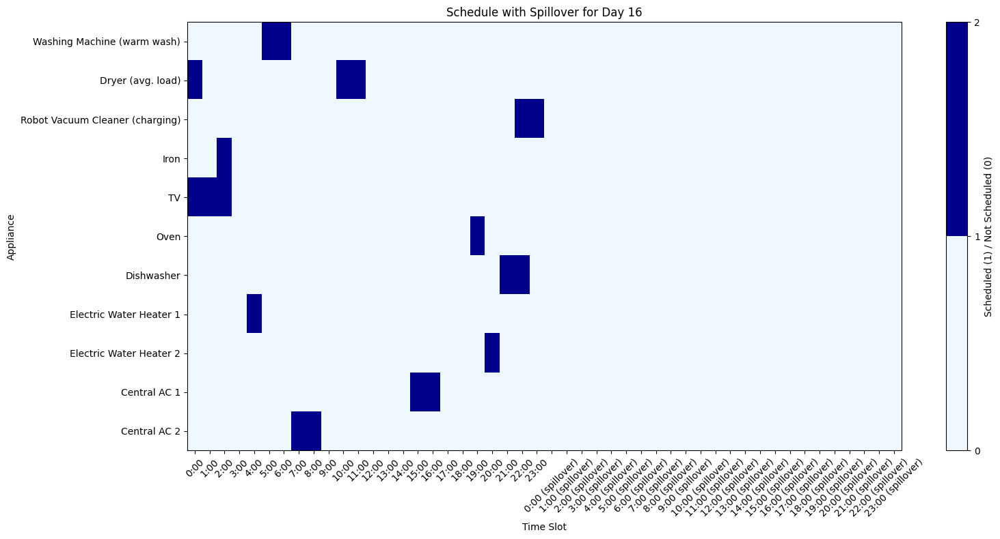

Best Fitness: 109.43302618017783
Updated Fitness: 109.43302618017783

===== Hourly Breakdown for Day 16 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.15              82.67
 1     0.00              0.15              82.52
 2     0.00              1.23              81.29
 3     0.00              0.00              81.29
 4     0.00              0.70              80.59
 5     0.00              2.00              78.59
 6     2.04              2.00              78.63
 7     3.10              3.00              78.73
 8     4.27              3.00              80.00
 9     4.23              0.00              84.23
10     4.22              3.00              85.45
11     4.36              3.00              86.81
12     4.06              0.00              90.87
13     3.51              0.00              94.38
14     3.17              0.00              97.55
15     1.96              3.

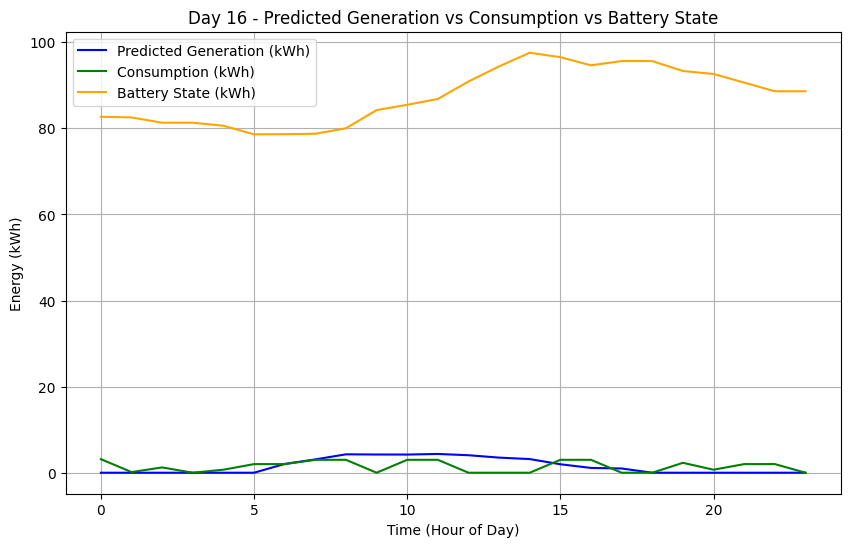

Simulating Day 17
[✔️] Appliance 0 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 8 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 11 (valid range: 0-23)
Initial_solution: [[0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

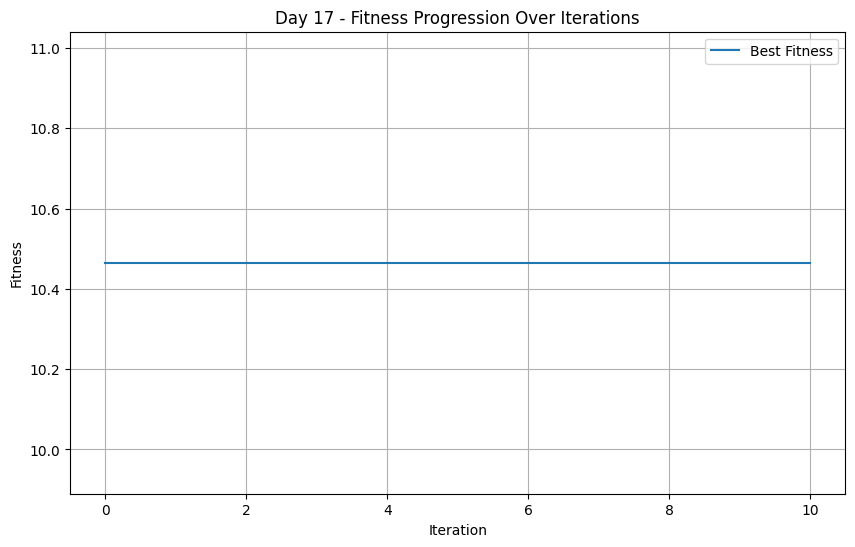

Appliance 0: Start Time = 1, Cost = 0.9453299751080021
Appliance 1: Start Time = 8, Cost = 0.8742055907690023
Appliance 2: Start Time = 17, Cost = 0.998416909683404
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 8, Cost = 0.9999999969620585
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 11, Cost = 0.9999985132804853
Appliance 8: Start Time = 21, Cost = 0.9998661697742351
Appliance 9: Start Time = 19, Cost = 0.9999999998665222
Appliance 10: Start Time = 11, Cost = 0.9995636586524771
===== Optimized Day 17 Schedule =====
Appliance 1: Start Time 1, Duration 2
Time Slots (first 24): [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 8, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 

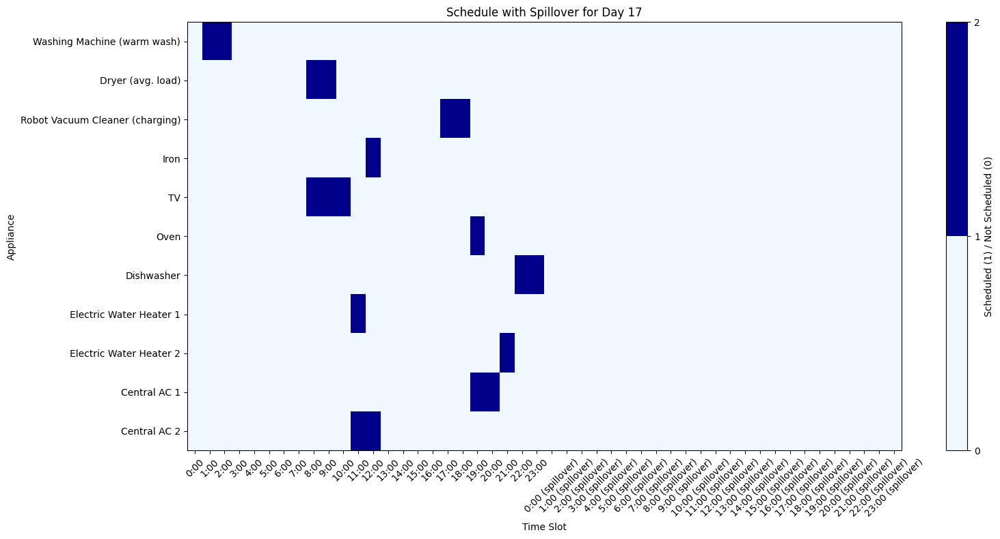

Best Fitness: 10.465181657106124
Updated Fitness: 10.465181657106124

===== Hourly Breakdown for Day 17 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              88.59
 1     0.00              2.00              86.59
 2     0.00              2.00              84.59
 3     0.00              0.00              84.59
 4     0.00              0.00              84.59
 5     0.00              0.00              84.59
 6     1.96              0.00              86.55
 7     3.34              0.00              89.90
 8     3.90              3.15              90.64
 9     4.15              3.15              91.64
10     5.13              0.15              96.63
11     5.23              3.70              98.16
12     5.15              4.08              99.23
13     4.09              0.00              100.00
14     3.03              0.00              100.00
15     2.29              

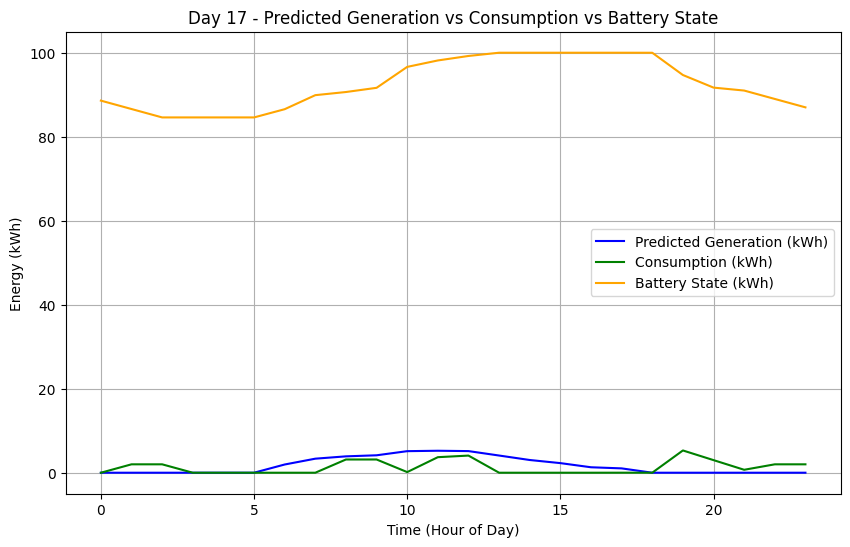

Simulating Day 18
[✔️] Appliance 0 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 20 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 14 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 

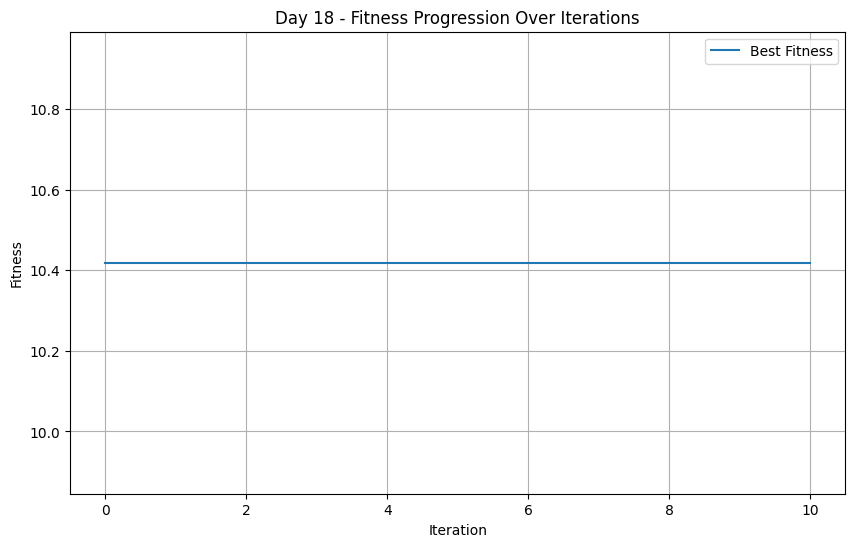

Appliance 0: Start Time = 16, Cost = 0.999839909782793
Appliance 1: Start Time = 20, Cost = 0.9999888763792014
Appliance 2: Start Time = 16, Cost = 0.9972834061532628
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 4, Cost = 0.9999999999999974
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 1, Cost = 1.0
Appliance 9: Start Time = 5, Cost = 0.8239673366178503
Appliance 10: Start Time = 14, Cost = 0.9730045167434059
===== Optimized Day 18 Schedule =====
Appliance 1: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

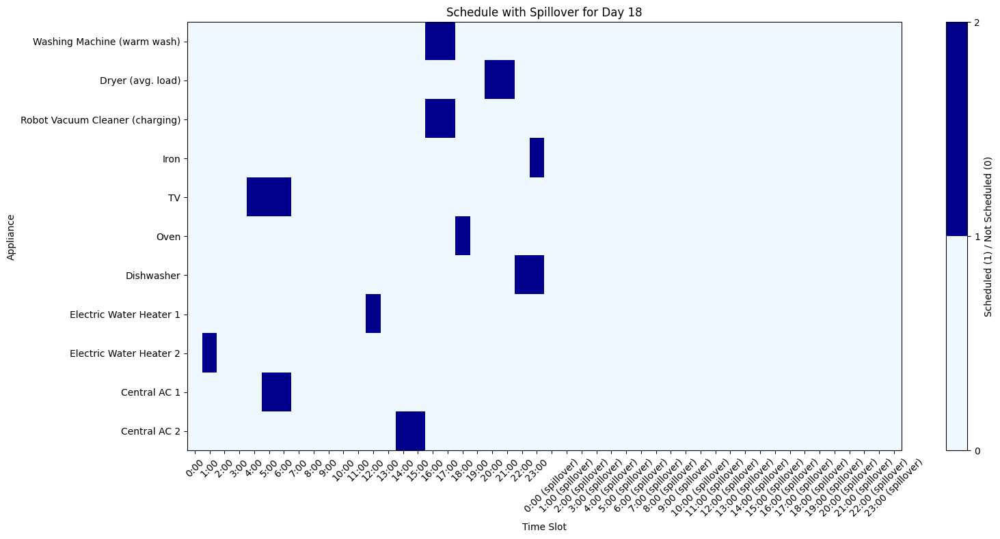

Best Fitness: 10.418580236017764
Updated Fitness: 10.418580236017764

===== Hourly Breakdown for Day 18 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              86.99
 1     0.00              0.70              86.29
 2     0.00              0.00              86.29
 3     0.00              0.00              86.29
 4     0.00              0.15              86.14
 5     0.00              3.15              82.99
 6     2.49              3.15              82.33
 7     4.54              0.00              86.87
 8     5.39              0.00              92.26
 9     5.60              0.00              97.86
10     5.63              0.00              100.00
11     5.59              0.00              100.00
12     5.58              0.70              100.00
13     4.80              0.00              100.00
14     4.10              3.00              100.00
15     2.91           

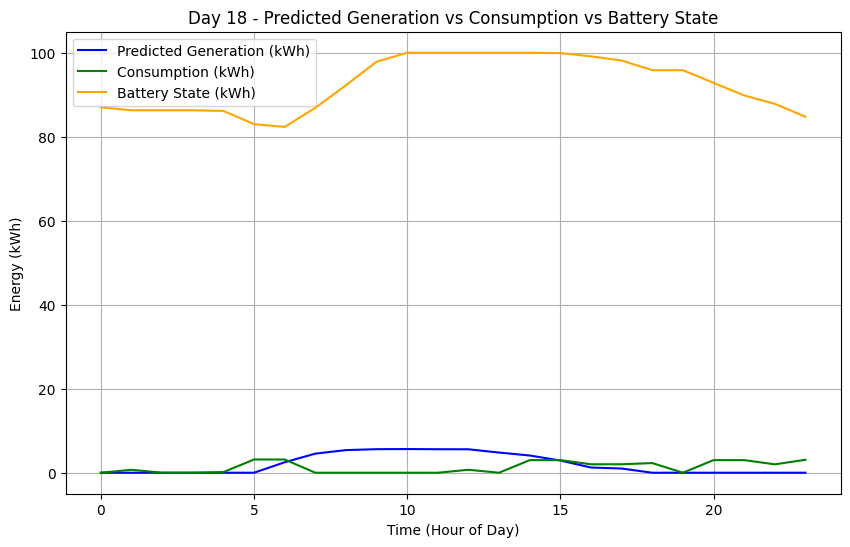

Simulating Day 19
[✔️] Appliance 0 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 22 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 22 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0

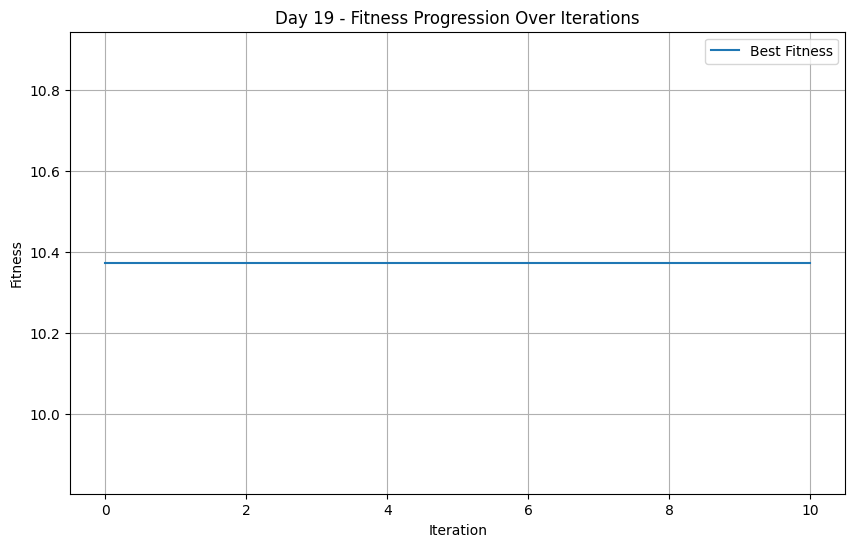

Appliance 0: Start Time = 10, Cost = 0.9668409537357504
Appliance 1: Start Time = 22, Cost = 0.9999995044268284
Appliance 2: Start Time = 14, Cost = 0.9929050814307537
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 19, Cost = 0.8239673366178503
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 4, Cost = 0.946009033486812
Appliance 8: Start Time = 20, Cost = 0.995568151588062
Appliance 9: Start Time = 2, Cost = 0.9730045167434059
Appliance 10: Start Time = 22, Cost = 0.9730045167434059
===== Optimized Day 19 Schedule =====
Appliance 1: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

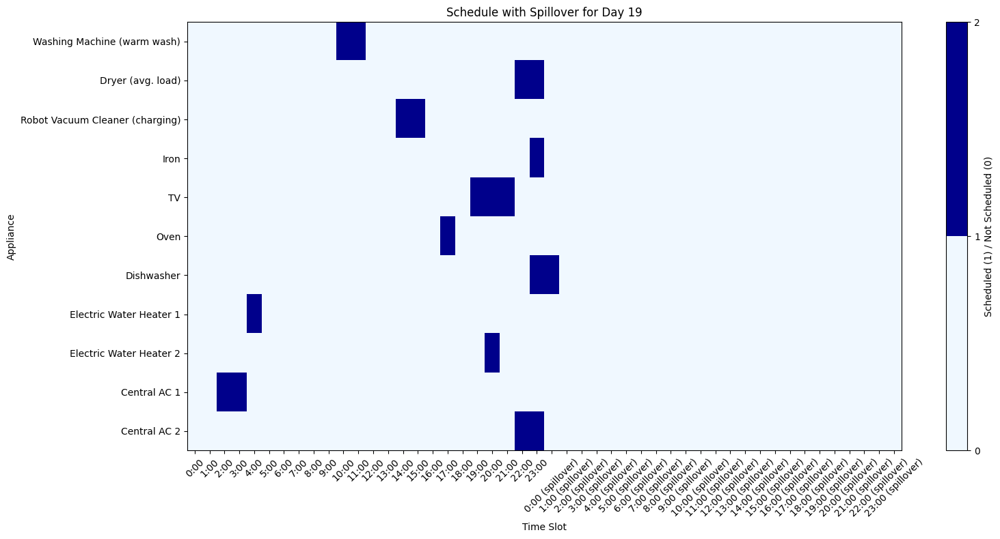

Best Fitness: 10.374281069131149
Updated Fitness: 10.374281069131149

===== Hourly Breakdown for Day 19 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              84.76
 1     0.00              0.00              84.76
 2     0.00              3.00              81.76
 3     0.00              3.00              78.76
 4     0.00              0.70              78.06
 5     0.00              0.00              78.06
 6     2.47              0.00              80.53
 7     4.53              0.00              85.06
 8     4.54              0.00              89.60
 9     5.35              0.00              94.95
10     4.39              2.00              97.34
11     4.64              2.00              99.98
12     4.74              0.00              100.00
13     3.60              0.00              100.00
14     3.21              0.01              100.00
15     2.42             

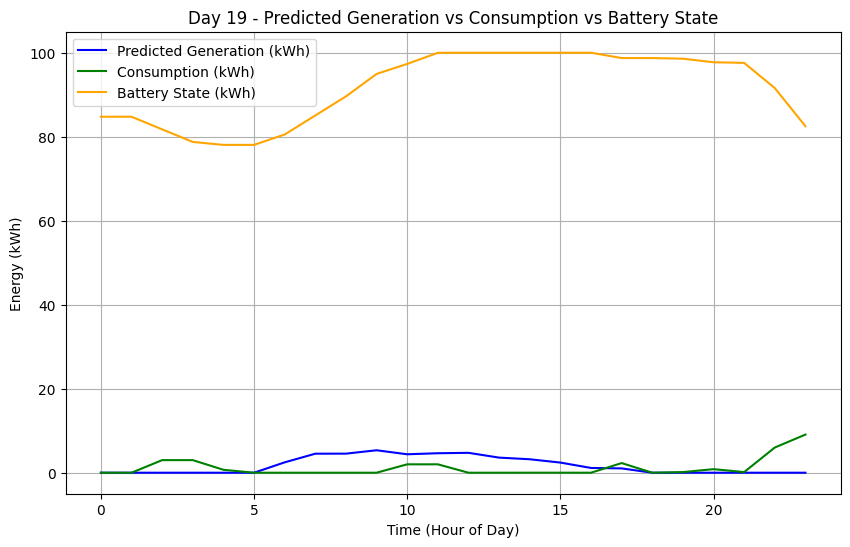

Simulating Day 20
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 19 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 19 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

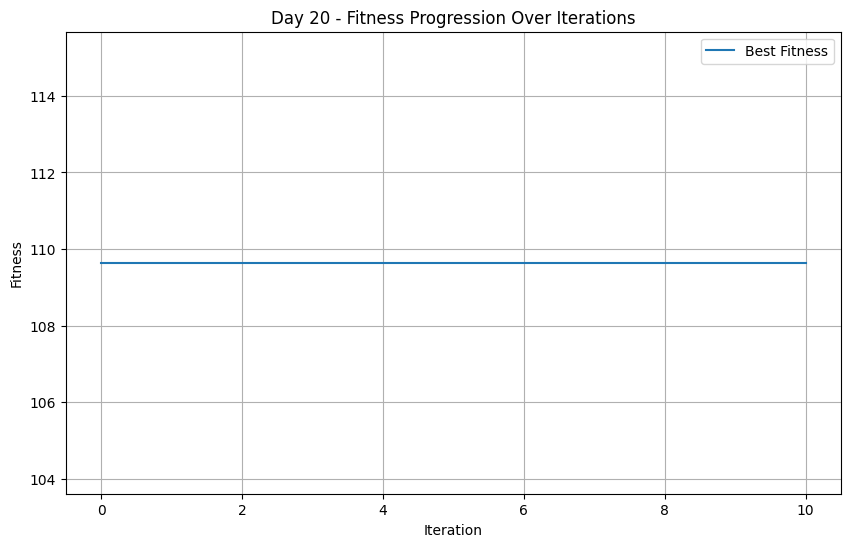

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 19, Cost = 0.9999553899247451
Appliance 2: Start Time = 16, Cost = 0.9972834061532628
Appliance 3: Start Time = 13, Cost = 0.9999985132804853
Appliance 4: Start Time = 6, Cost = 0.9999999999954327
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 17, Cost = 1.0
Appliance 8: Start Time = 2, Cost = 1.0
Appliance 9: Start Time = 0, Cost = 0.997784075794031
Appliance 10: Start Time = 19, Cost = 0.8239673366178503
===== Optimized Day 20 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 19, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

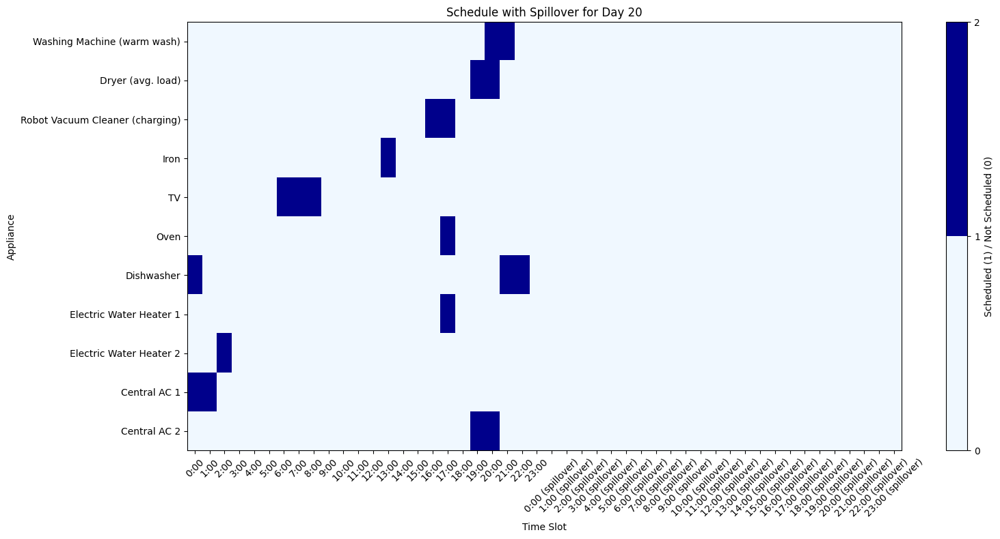

Best Fitness: 109.64295556281049
Updated Fitness: 109.64295556281049

===== Hourly Breakdown for Day 20 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              5.00              77.50
 1     0.00              3.00              74.50
 2     0.00              0.70              73.80
 3     0.00              0.00              73.80
 4     0.00              0.00              73.80
 5     0.00              0.00              73.80
 6     3.01              0.15              76.66
 7     5.03              0.15              81.54
 8     5.07              0.15              86.46
 9     5.86              0.00              92.32
10     5.69              0.00              98.01
11     5.87              0.00              100.00
12     5.84              0.00              100.00
13     4.53              1.08              100.00
14     3.91              0.00              100.00
15     2.88            

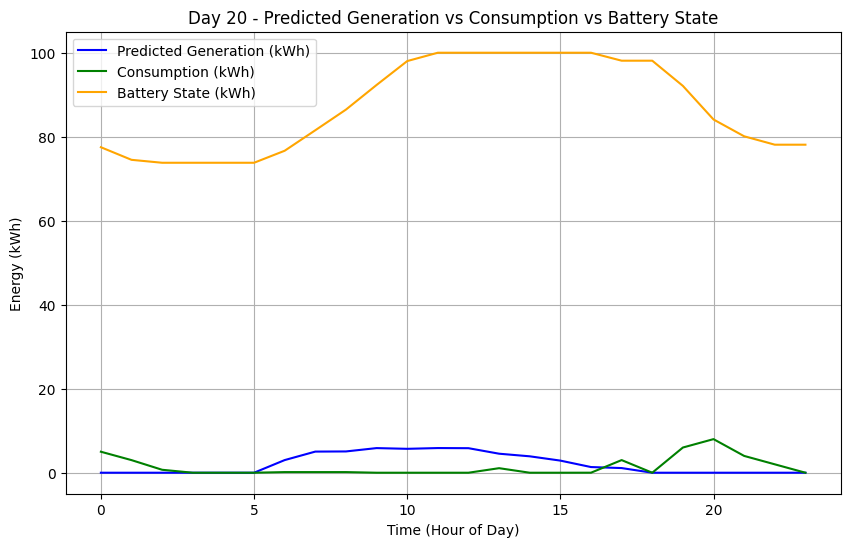

Simulating Day 21
[✔️] Appliance 0 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 14 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 23 (valid range: 0-23)
Initial_solution: [[0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

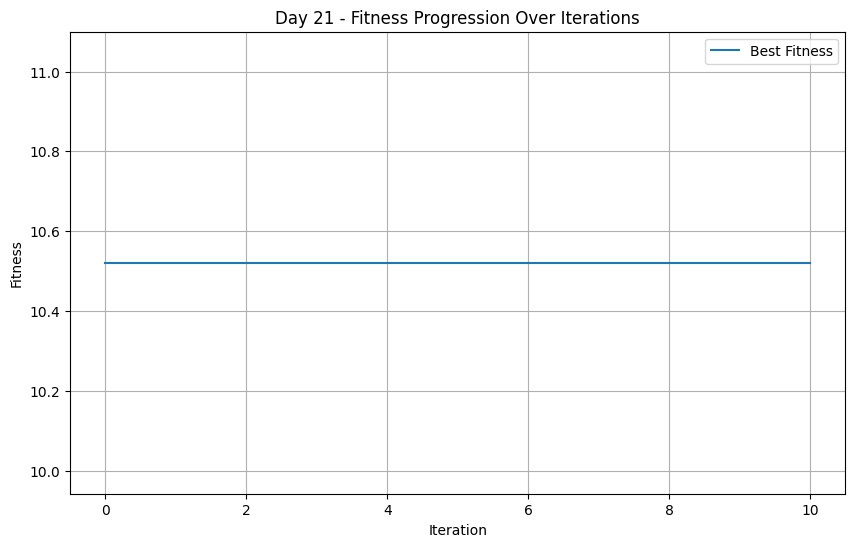

Appliance 0: Start Time = 4, Cost = 0.8742055907690023
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 13, Cost = 0.9892018066973624
Appliance 3: Start Time = 20, Cost = 1.0
Appliance 4: Start Time = 1, Cost = 1.0
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 9, Cost = 0.995568151588062
Appliance 8: Start Time = 6, Cost = 1.0
Appliance 9: Start Time = 19, Cost = 0.9999999998665222
Appliance 10: Start Time = 23, Cost = 0.9912358497532158
===== Optimized Day 21 Schedule =====
Appliance 1: Start Time 4, Duration 2
Time Slots (first 24): [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Ap

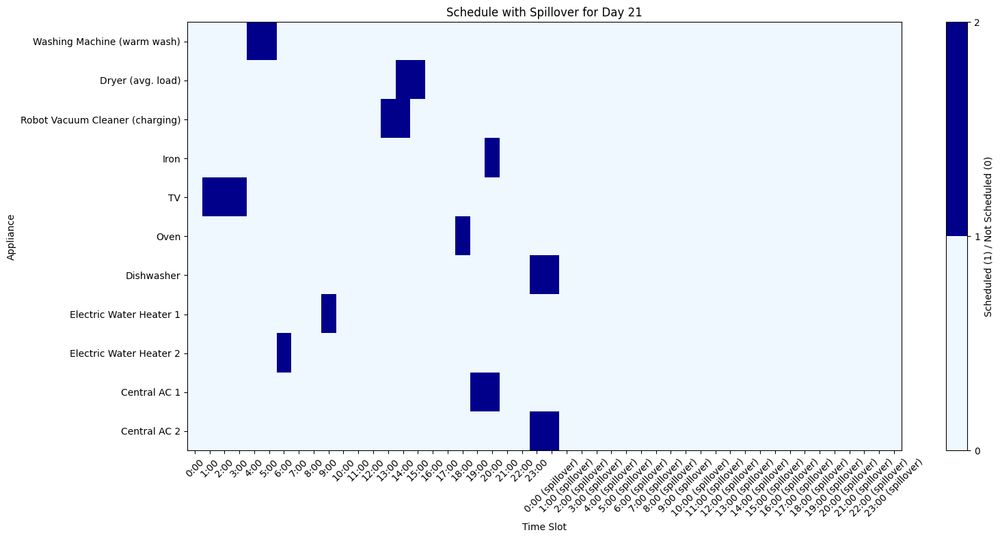

Best Fitness: 10.521014266515973
Updated Fitness: 10.521014266515973

===== Hourly Breakdown for Day 21 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              78.10
 1     0.00              0.15              77.95
 2     0.00              0.15              77.80
 3     0.00              0.15              77.65
 4     0.00              2.00              75.65
 5     0.00              2.00              73.65
 6     1.93              0.70              74.88
 7     3.79              0.00              78.67
 8     4.65              0.00              83.32
 9     4.96              0.70              87.59
10     4.66              0.00              92.25
11     4.63              0.00              96.88
12     4.23              0.00              100.00
13     5.60              0.01              100.00
14     5.13              3.01              100.00
15     4.27             

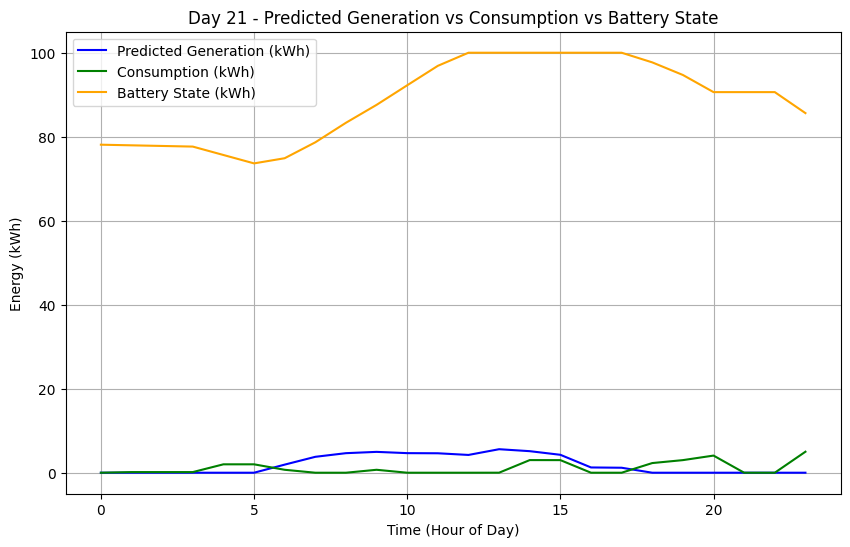

Simulating Day 22
[✔️] Appliance 0 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 12 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0

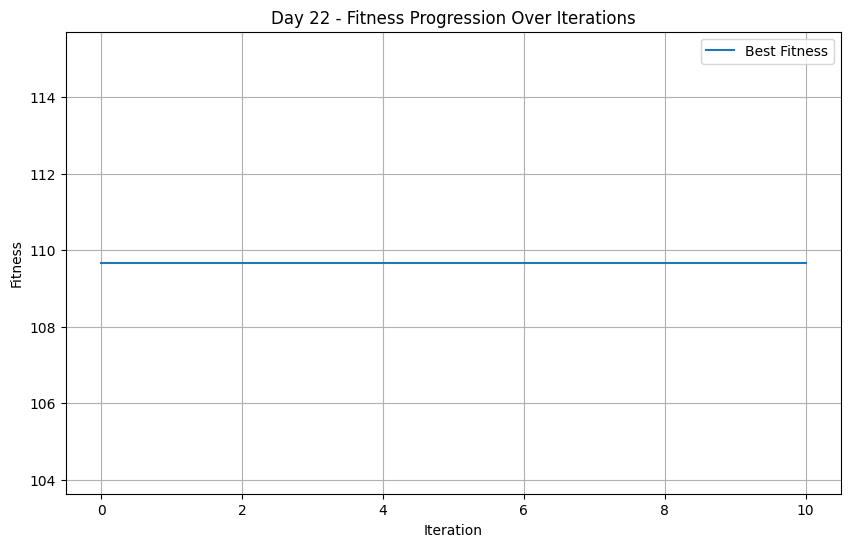

Appliance 0: Start Time = 9, Cost = 0.9453299751080021
Appliance 1: Start Time = 16, Cost = 0.9985227171960207
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 17, Cost = 0.9352412021670541
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 17, Cost = 1.0
Appliance 8: Start Time = 4, Cost = 1.0
Appliance 9: Start Time = 13, Cost = 0.9995636586524771
Appliance 10: Start Time = 0, Cost = 1.0
===== Optimized Day 22 Schedule =====
Appliance 1: Start Time 9, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: Start Time 10, Du

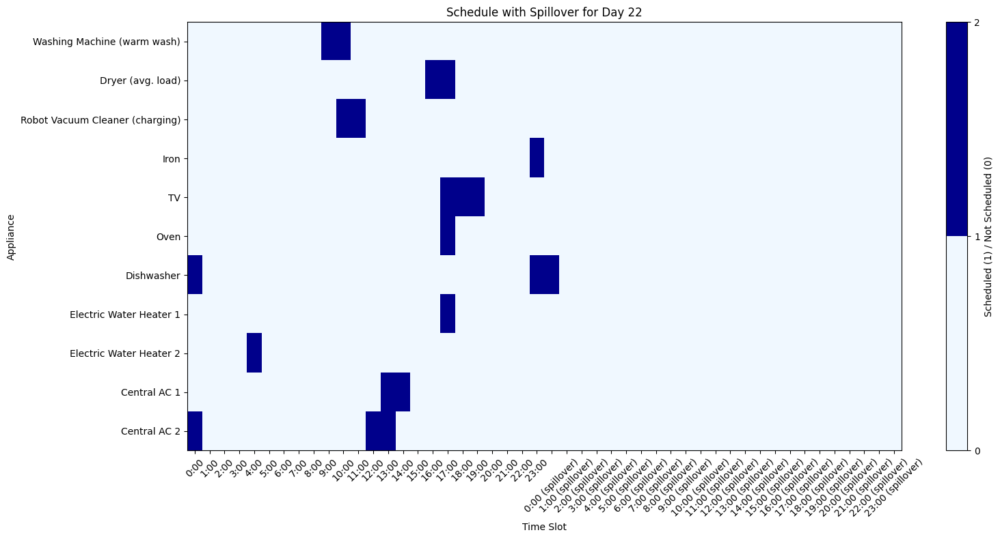

Best Fitness: 109.67267939661426
Updated Fitness: 109.67267939661426

===== Hourly Breakdown for Day 22 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              5.00              80.62
 1     0.00              0.00              80.62
 2     0.00              0.00              80.62
 3     0.00              0.00              80.62
 4     0.00              0.70              79.92
 5     0.00              0.00              79.92
 6     2.08              0.00              82.00
 7     4.68              0.00              86.68
 8     5.16              0.00              91.84
 9     5.60              2.00              95.44
10     4.09              2.01              97.52
11     4.84              0.01              100.00
12     3.70              3.00              100.00
13     3.52              6.00              97.52
14     3.34              3.00              97.85
15     1.61              

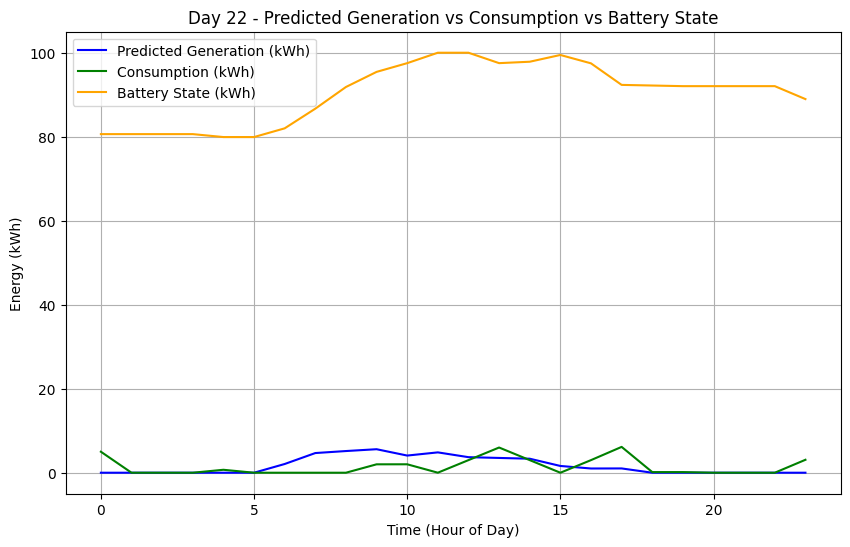

Simulating Day 23
[✔️] Appliance 0 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 23 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 3 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

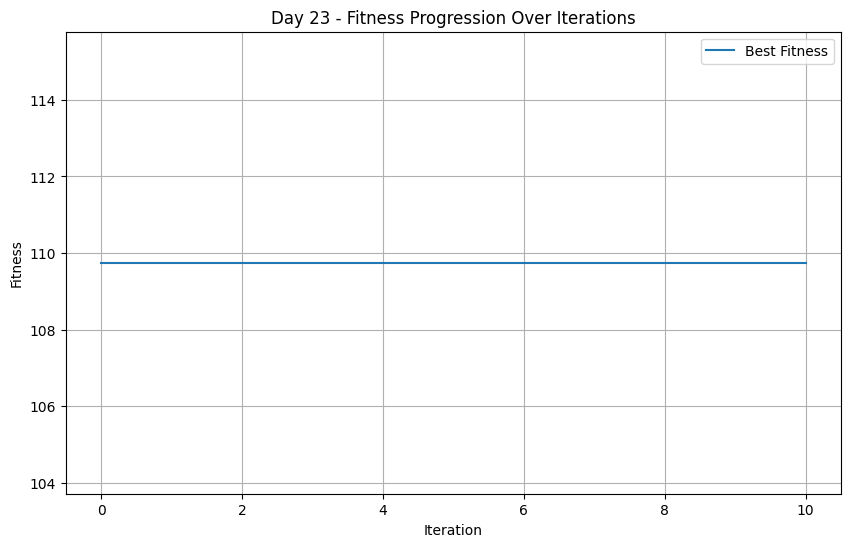

Appliance 0: Start Time = 17, Cost = 0.9999553899247451
Appliance 1: Start Time = 23, Cost = 0.999999911456603
Appliance 2: Start Time = 2, Cost = 0.9217914612049088
Appliance 3: Start Time = 16, Cost = 0.9999999999999949
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 0, Cost = 1.0
Appliance 9: Start Time = 23, Cost = 1.0
Appliance 10: Start Time = 3, Cost = 0.9999999999998783
===== Optimized Day 23 Schedule =====
Appliance 1: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 23, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: Start Time 2, Dur

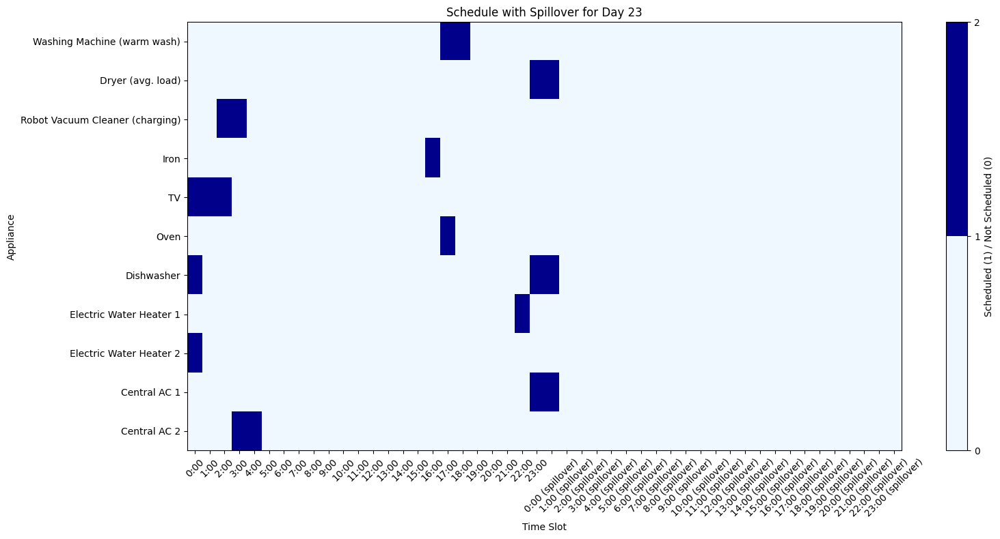

Best Fitness: 109.74571409920398
Updated Fitness: 109.74571409920398

===== Hourly Breakdown for Day 23 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.85              86.11
 1     0.00              0.15              85.96
 2     0.00              0.16              85.80
 3     0.00              3.01              82.80
 4     0.00              3.00              79.80
 5     0.00              0.00              79.80
 6     1.34              0.00              81.14
 7     2.57              0.00              83.71
 8     3.37              0.00              87.08
 9     3.77              0.00              90.86
10     3.93              0.00              94.79
11     4.22              0.00              99.01
12     2.97              0.00              100.00
13     2.79              0.00              100.00
14     2.02              0.00              100.00
15     1.43             

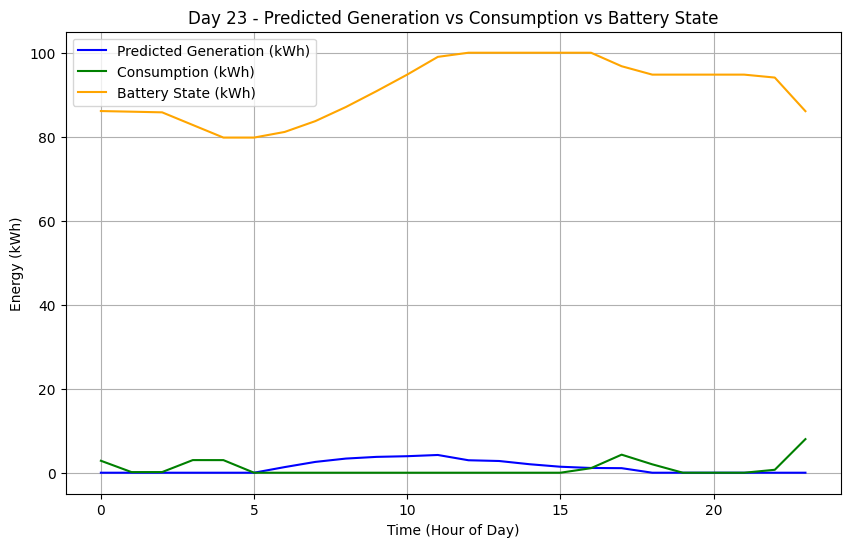

Simulating Day 24
[✔️] Appliance 0 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 9 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 7 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

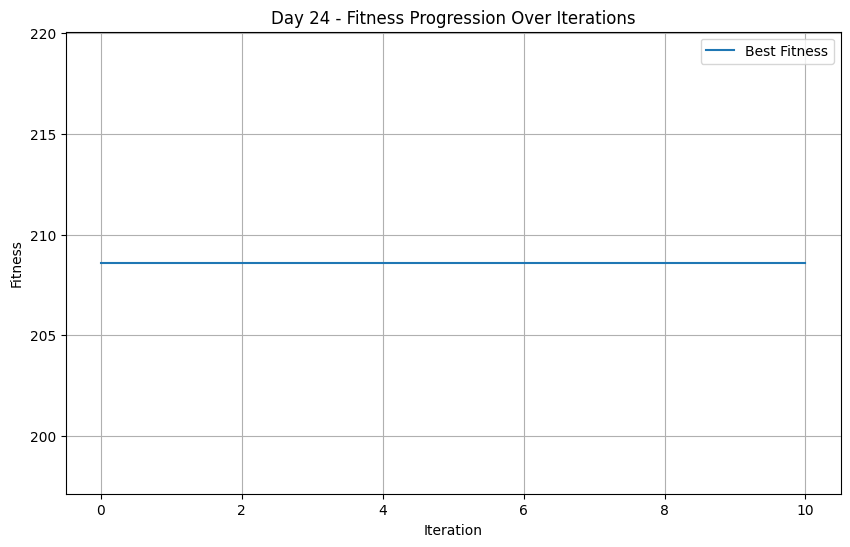

Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 0, Cost = 100.0
Appliance 2: Start Time = 9, Cost = 0.9611627890033574
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 19, Cost = 0.8239673366178503
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 9, Cost = 0.9999999999999949
Appliance 9: Start Time = 0, Cost = 0.997784075794031
Appliance 10: Start Time = 7, Cost = 0.9999999461511998
===== Optimized Day 24 Schedule =====
Appliance 1: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: St

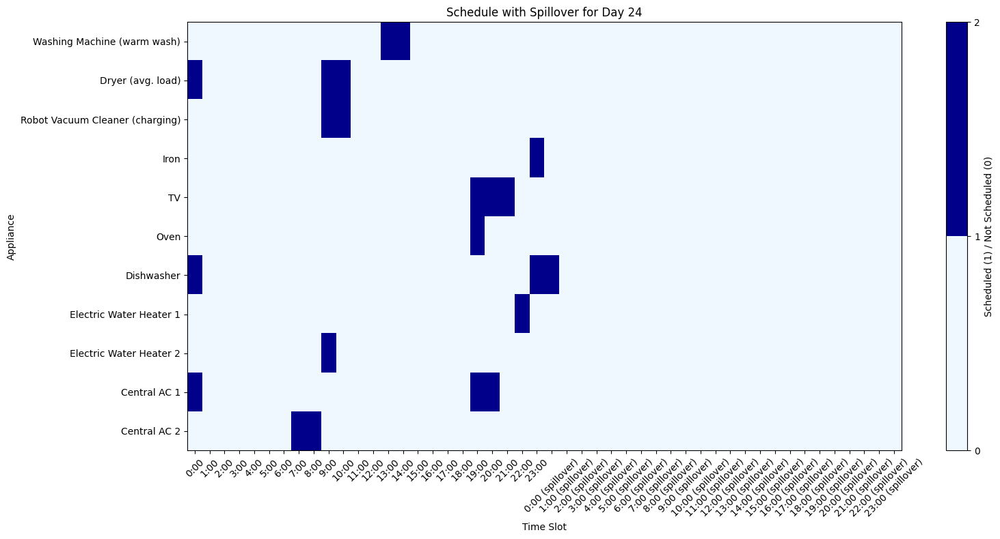

Best Fitness: 208.6030828221764
Updated Fitness: 208.6030828221764

===== Hourly Breakdown for Day 24 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              8.00              78.08
 1     0.00              0.00              78.08
 2     0.00              0.00              78.08
 3     0.00              0.00              78.08
 4     0.00              0.00              78.08
 5     0.00              0.00              78.08
 6     1.46              0.00              79.54
 7     3.35              3.00              79.89
 8     4.04              3.00              80.93
 9     4.63              3.71              81.86
10     4.97              3.01              83.82
11     5.46              0.00              89.28
12     4.35              0.00              93.62
13     3.31              2.00              94.93
14     2.58              2.00              95.51
15     1.68              0.00

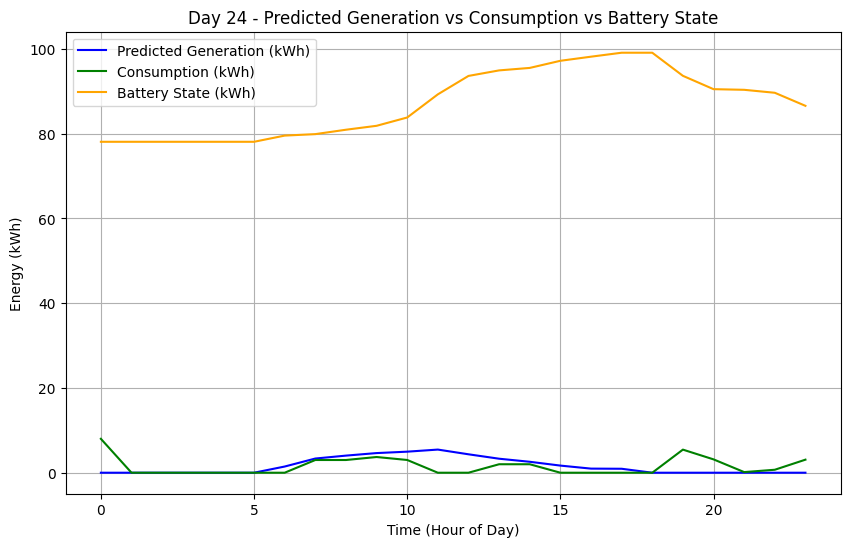

Simulating Day 25
[✔️] Appliance 0 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 11 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 9 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

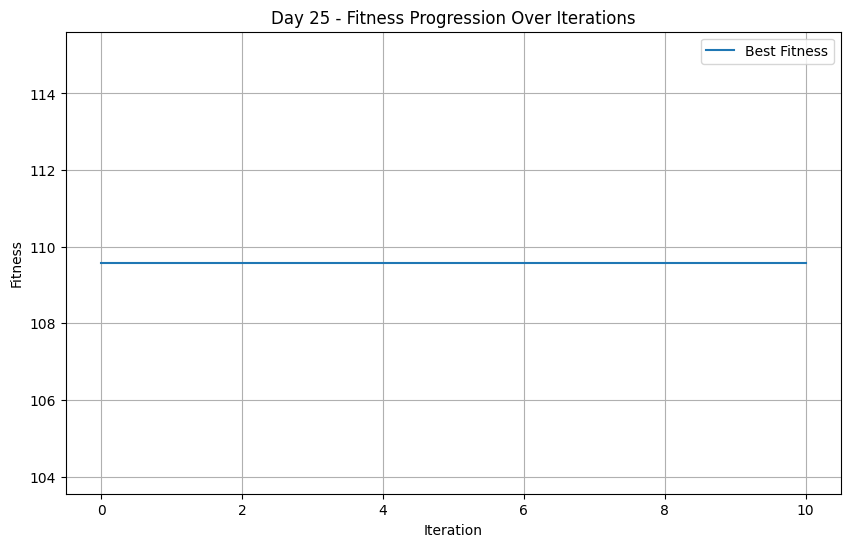

Appliance 0: Start Time = 7, Cost = 0.8935173314925493
Appliance 1: Start Time = 11, Cost = 0.9453299751080021
Appliance 2: Start Time = 12, Cost = 0.9842099683398212
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 6, Cost = 0.9999999999954327
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 18, Cost = 1.0
Appliance 8: Start Time = 1, Cost = 1.0
Appliance 9: Start Time = 9, Cost = 0.9352412021670541
Appliance 10: Start Time = 9, Cost = 0.9999920081294466
===== Optimized Day 25 Schedule =====
Appliance 1: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
A

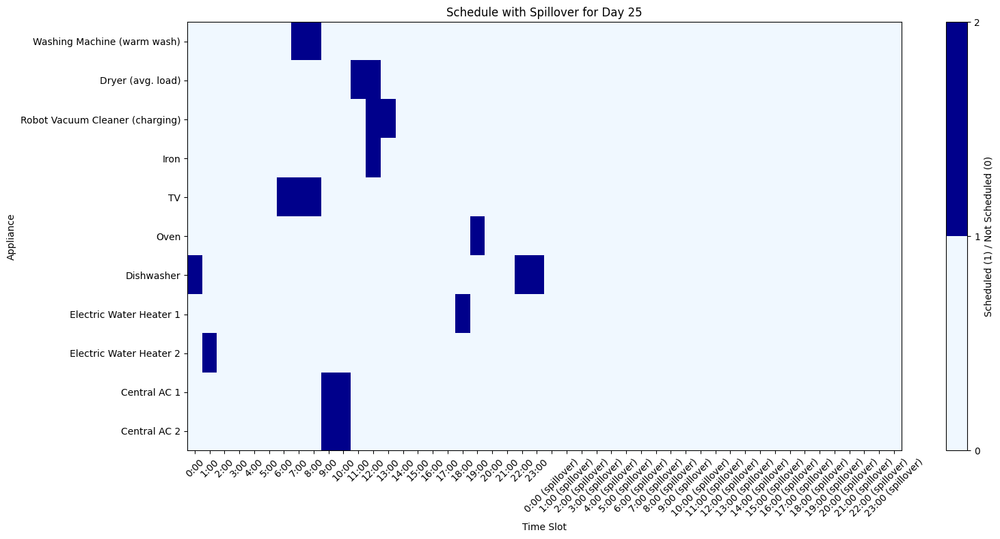

Best Fitness: 109.5821239916244
Updated Fitness: 109.5821239916244

===== Hourly Breakdown for Day 25 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              84.57
 1     0.00              0.70              83.87
 2     0.00              0.00              83.87
 3     0.00              0.00              83.87
 4     0.00              0.00              83.87
 5     0.00              0.00              83.87
 6     1.63              0.15              85.35
 7     3.36              2.15              86.56
 8     4.22              2.15              88.63
 9     5.38              6.00              88.01
10     5.57              6.00              87.58
11     5.84              3.00              90.42
12     5.18              4.09              91.51
13     3.22              0.01              94.72
14     2.68              0.00              97.40
15     1.90              0.00

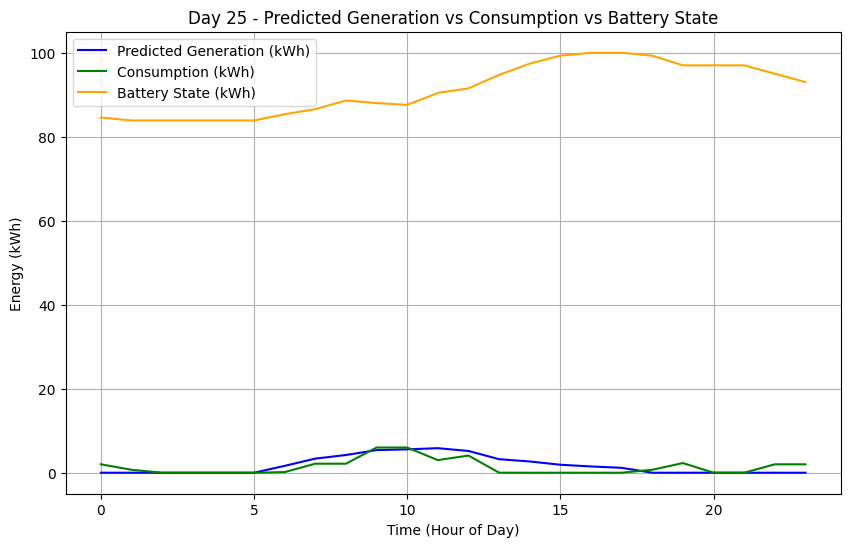

Simulating Day 26
[✔️] Appliance 0 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 17 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 1 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

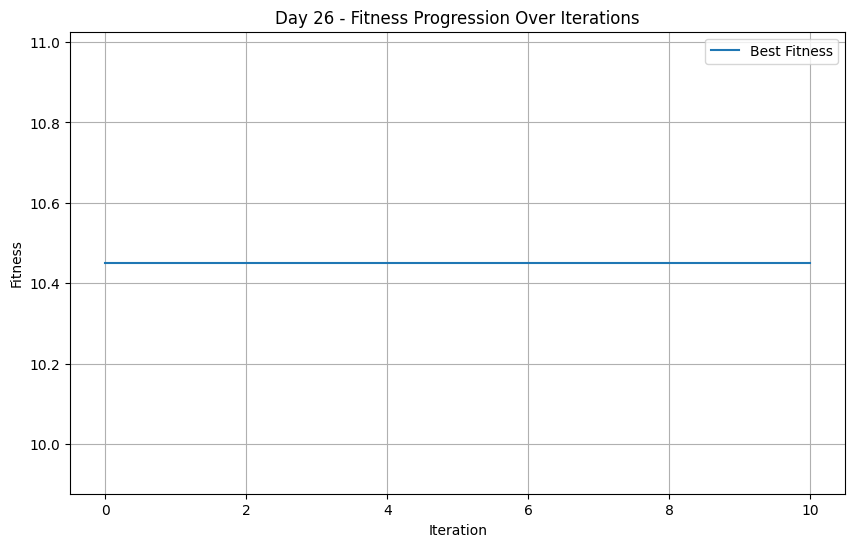

Appliance 0: Start Time = 9, Cost = 0.9453299751080021
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 4, Cost = 0.9217914612049088
Appliance 3: Start Time = 20, Cost = 1.0
Appliance 4: Start Time = 23, Cost = 0.9352412021670541
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 16, Cost = 1.0
Appliance 8: Start Time = 19, Cost = 0.946009033486812
Appliance 9: Start Time = 21, Cost = 0.9999999999998783
Appliance 10: Start Time = 1, Cost = 1.0
===== Optimized Day 26 Schedule =====
Appliance 1: Start Time 9, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
A

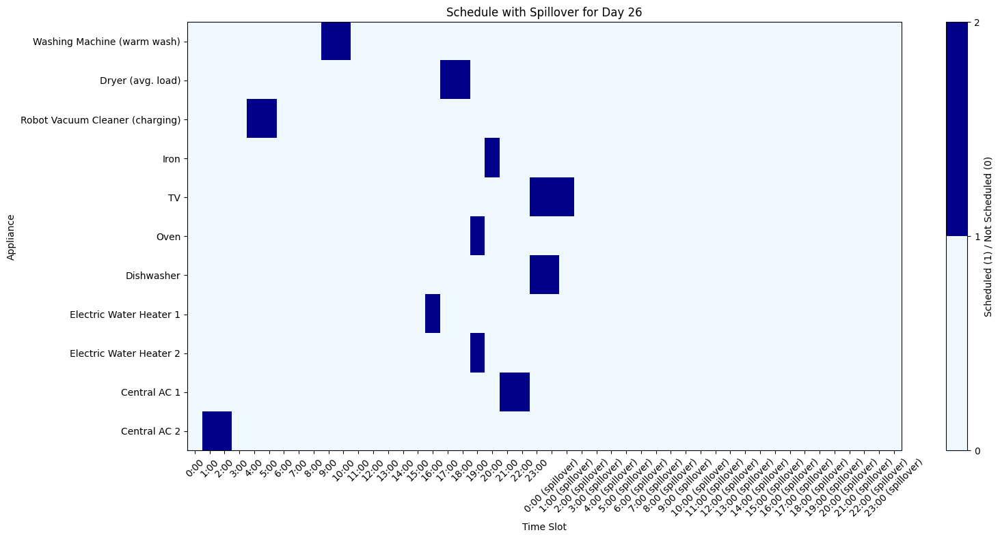

Best Fitness: 10.450839553326169
Updated Fitness: 10.450839553326169

===== Hourly Breakdown for Day 26 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              93.00
 1     0.00              3.00              90.00
 2     0.00              3.00              87.00
 3     0.00              0.00              87.00
 4     0.00              0.01              86.99
 5     0.00              0.01              86.99
 6     1.86              0.00              88.85
 7     2.98              0.00              91.83
 8     3.63              0.00              95.46
 9     4.01              2.00              97.47
10     3.63              2.00              99.10
11     4.21              0.00              100.00
12     3.04              0.00              100.00
13     1.72              0.00              100.00
14     1.34              0.00              100.00
15     1.10            

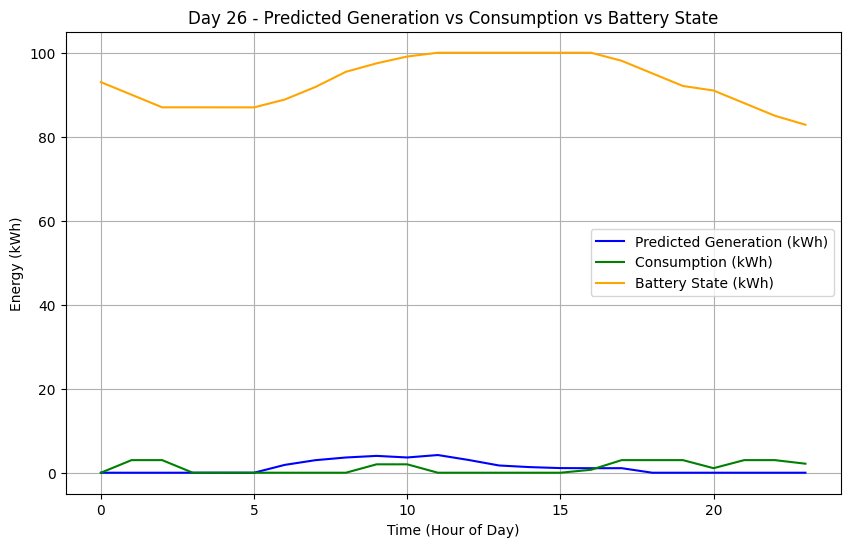

Simulating Day 27
[✔️] Appliance 0 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 11 (valid range: 0-23)
Initial_solution: [[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

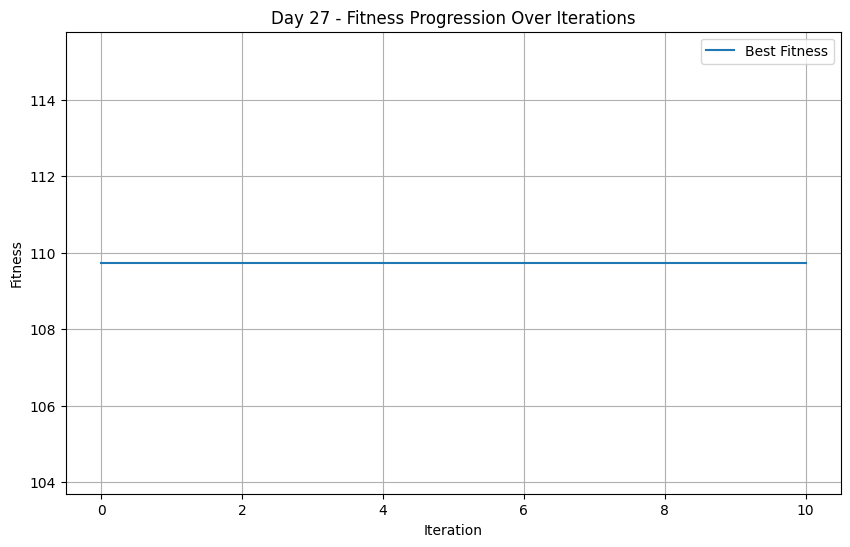

Appliance 0: Start Time = 0, Cost = 0.9668409537357504
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 8, Cost = 0.9516058550961713
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 3, Cost = 0.995568151588062
Appliance 8: Start Time = 1, Cost = 1.0
Appliance 9: Start Time = 17, Cost = 0.9999999461511998
Appliance 10: Start Time = 11, Cost = 0.9995636586524771
===== Optimized Day 27 Schedule =====
Appliance 1: Start Time 0, Duration 2
Time Slots (first 24): [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: Start

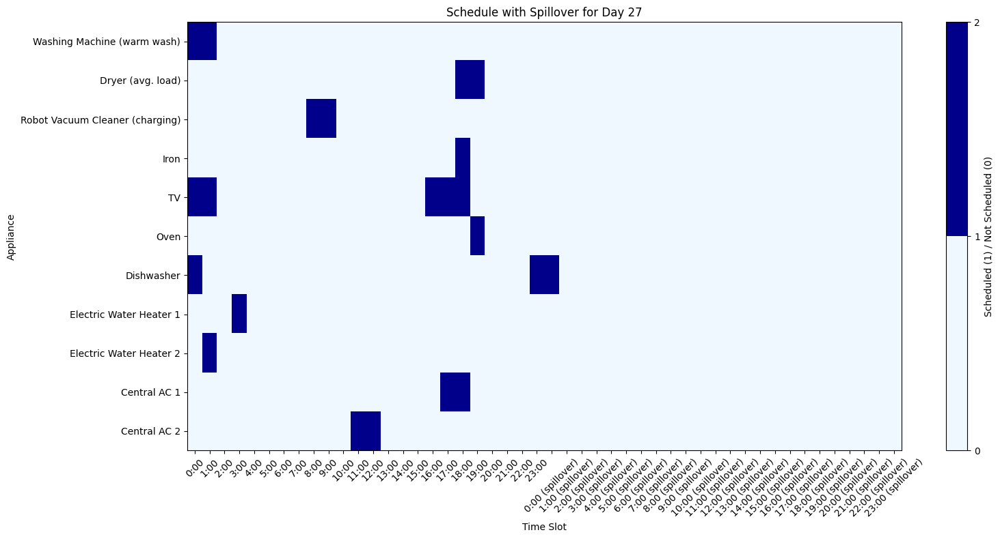

Best Fitness: 109.7373858116243
Updated Fitness: 109.7373858116243

===== Hourly Breakdown for Day 27 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              4.15              78.70
 1     0.00              2.85              75.85
 2     0.00              0.00              75.85
 3     0.00              0.70              75.15
 4     0.00              0.00              75.15
 5     0.00              0.00              75.15
 6     1.25              0.00              76.40
 7     1.86              0.00              78.26
 8     2.58              0.01              80.84
 9     2.88              0.01              83.71
10     4.77              0.00              88.48
11     4.77              3.00              90.24
12     4.78              3.00              92.02
13     3.23              0.00              95.25
14     3.57              0.00              98.82
15     3.78              0.00

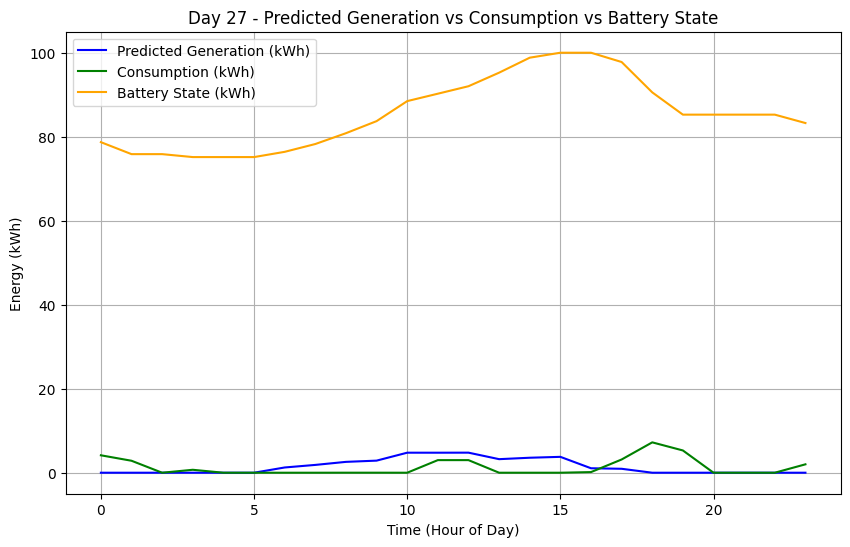

Simulating Day 28
[✔️] Appliance 0 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 8 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 5 (valid range: 0-23)
Initial_solution: [[0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

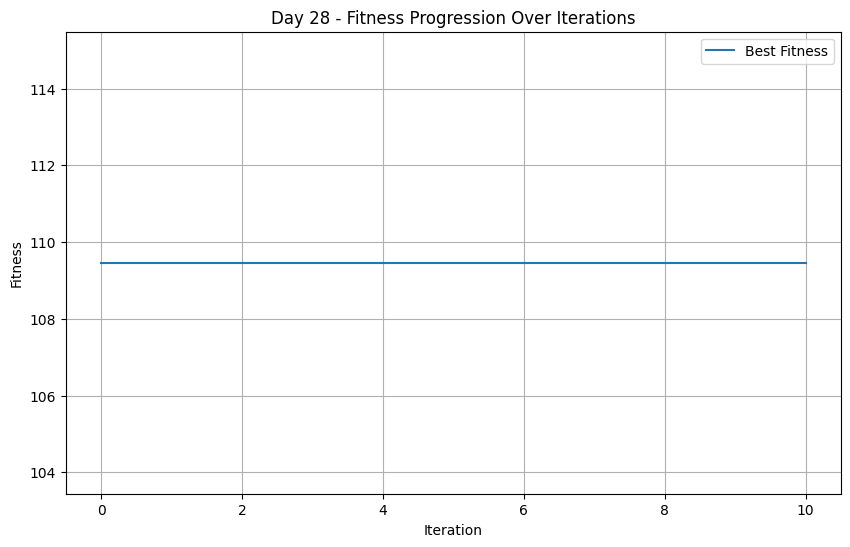

Appliance 0: Start Time = 1, Cost = 0.9453299751080021
Appliance 1: Start Time = 8, Cost = 0.8742055907690023
Appliance 2: Start Time = 23, Cost = 0.999973233954847
Appliance 3: Start Time = 5, Cost = 0.995568151588062
Appliance 4: Start Time = 21, Cost = 0.8239673366178503
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 13, Cost = 0.9999999999908653
Appliance 8: Start Time = 7, Cost = 1.0
Appliance 9: Start Time = 20, Cost = 0.9999999999954327
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 28 Schedule =====
Appliance 1: Start Time 1, Duration 2
Time Slots (first 24): [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 8, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

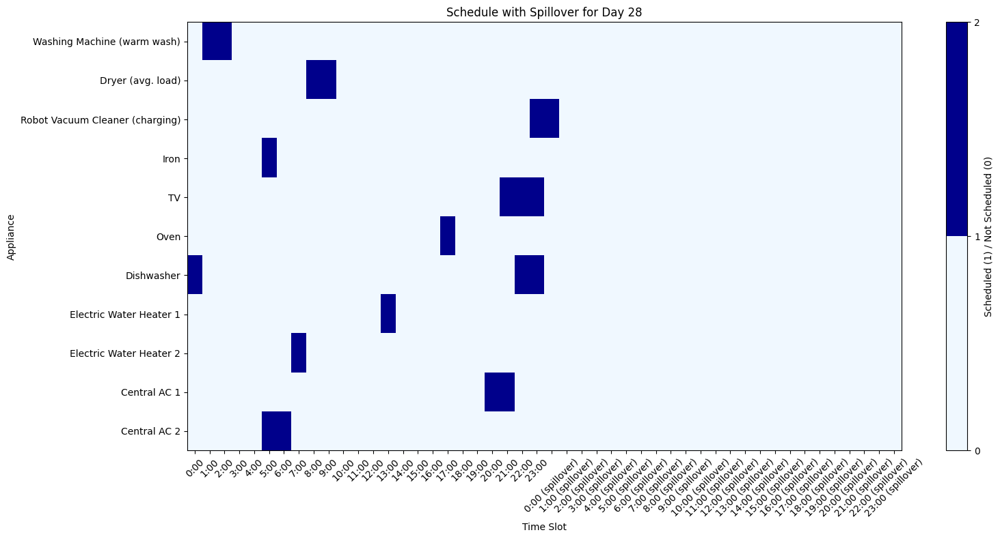

Best Fitness: 109.46301162450844
Updated Fitness: 109.46301162450844

===== Hourly Breakdown for Day 28 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              81.26
 1     0.00              2.00              79.26
 2     0.00              2.00              77.26
 3     0.00              0.00              77.26
 4     0.00              0.00              77.26
 5     0.00              4.08              73.18
 6     0.98              3.00              71.16
 7     2.09              0.70              72.55
 8     2.54              3.00              72.09
 9     3.41              3.00              72.50
10     3.34              0.00              75.85
11     2.30              0.00              78.15
12     1.93              0.00              80.08
13     1.94              0.70              81.31
14     1.42              0.00              82.73
15     1.56              0.

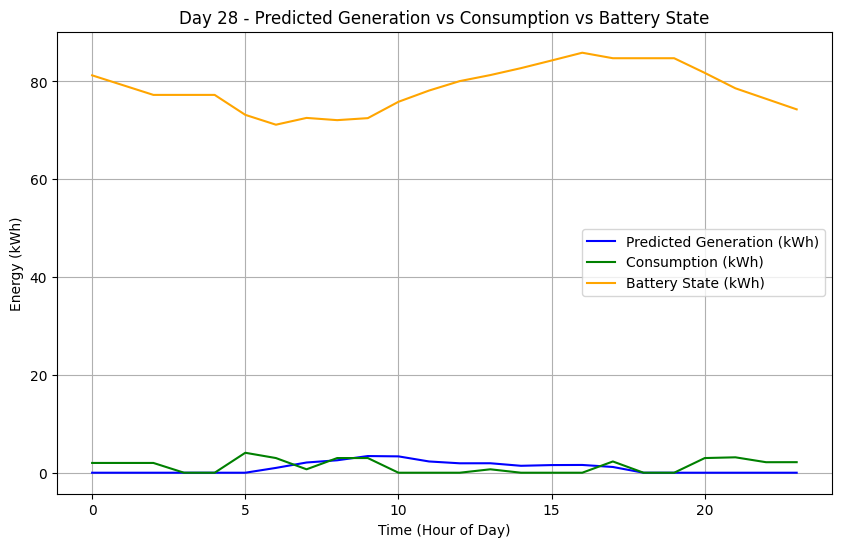

Simulating Day 29
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 11 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 21 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

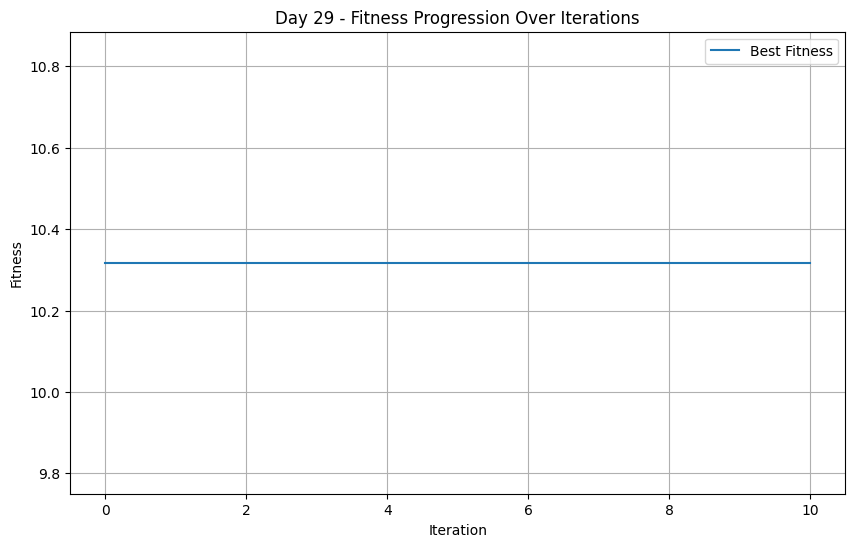

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 11, Cost = 0.9453299751080021
Appliance 2: Start Time = 0, Cost = 0.9333550794216401
Appliance 3: Start Time = 0, Cost = 0.9999999999999949
Appliance 4: Start Time = 12, Cost = 0.9999330848871175
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 17, Cost = 1.0
Appliance 8: Start Time = 0, Cost = 1.0
Appliance 9: Start Time = 4, Cost = 0.8790146377404283
Appliance 10: Start Time = 21, Cost = 0.9352412021670541
===== Optimized Day 29 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

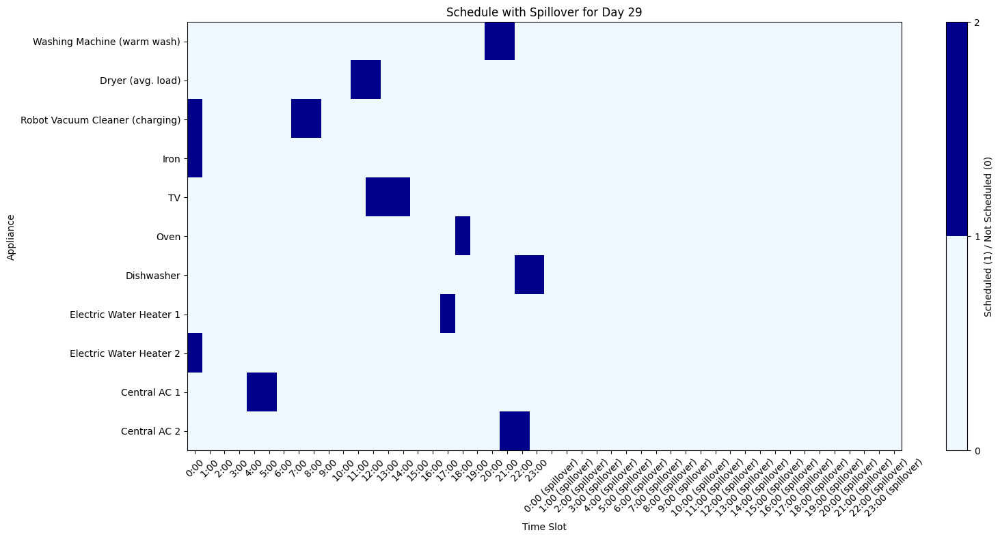

Best Fitness: 10.3173696801682
Updated Fitness: 10.3173696801682

===== Hourly Breakdown for Day 29 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              1.79              72.51
 1     0.00              0.00              72.51
 2     0.00              0.00              72.51
 3     0.00              0.00              72.51
 4     0.00              3.00              69.51
 5     0.00              3.00              66.51
 6     1.45              0.00              67.96
 7     2.08              0.01              70.04
 8     3.02              0.01              73.05
 9     3.42              0.00              76.48
10     4.03              0.00              80.50
11     3.80              3.00              81.30
12     3.21              3.15              81.36
13     3.61              0.15              84.82
14     2.28              0.15              86.94
15     2.72              0.00  

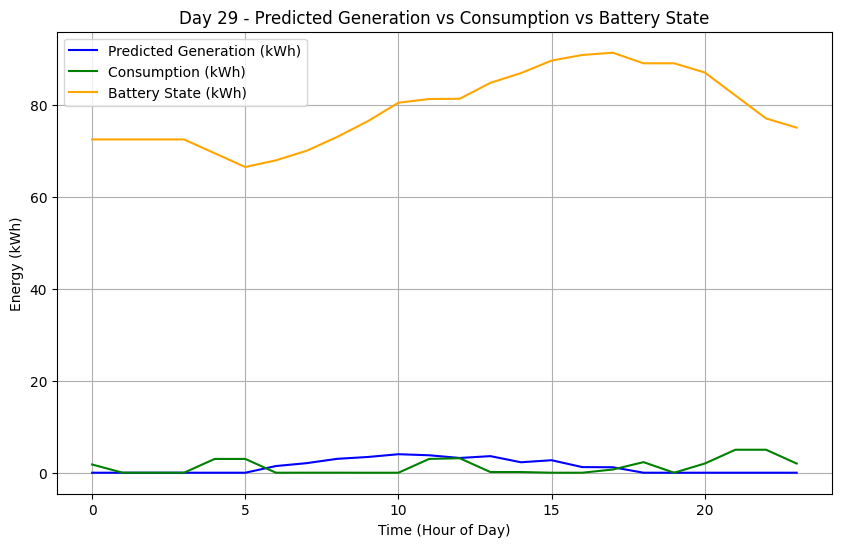

Simulating Day 30
[✔️] Appliance 0 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 7 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 3 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

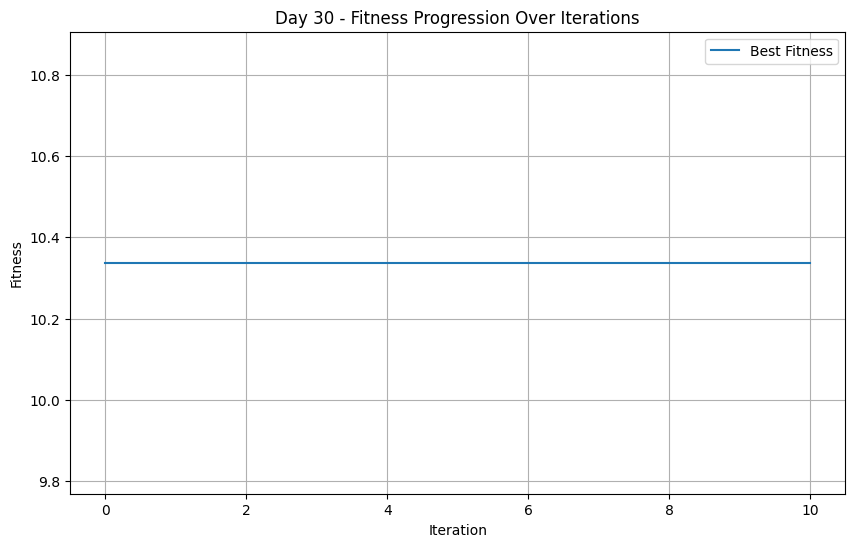

Appliance 0: Start Time = 15, Cost = 0.9994859070012363
Appliance 1: Start Time = 7, Cost = 0.8670192398661891
Appliance 2: Start Time = 7, Cost = 0.9420616894477034
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 2, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 8, Cost = 0.946009033486812
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 9, Cost = 0.9352412021670541
Appliance 10: Start Time = 3, Cost = 0.9999999999998783
===== Optimized Day 30 Schedule =====
Appliance 1: Start Time 15, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0

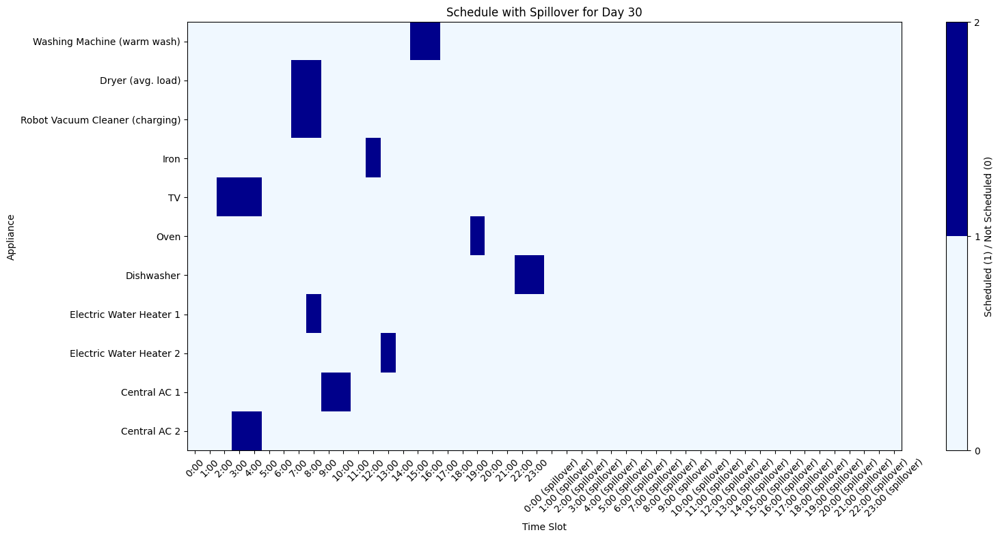

Best Fitness: 10.337484084753044
Updated Fitness: 10.337484084753044

===== Hourly Breakdown for Day 30 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              75.08
 1     0.00              0.00              75.08
 2     0.00              0.15              74.93
 3     0.00              3.15              71.78
 4     0.00              3.15              68.63
 5     0.00              0.00              68.63
 6     1.53              0.00              70.15
 7     3.06              3.01              70.21
 8     3.37              3.71              69.87
 9     3.50              3.00              70.37
10     1.95              3.00              69.32
11     2.42              0.00              71.75
12     2.37              1.08              73.04
13     2.57              0.70              74.91
14     1.45              0.00              76.36
15     1.21              2.

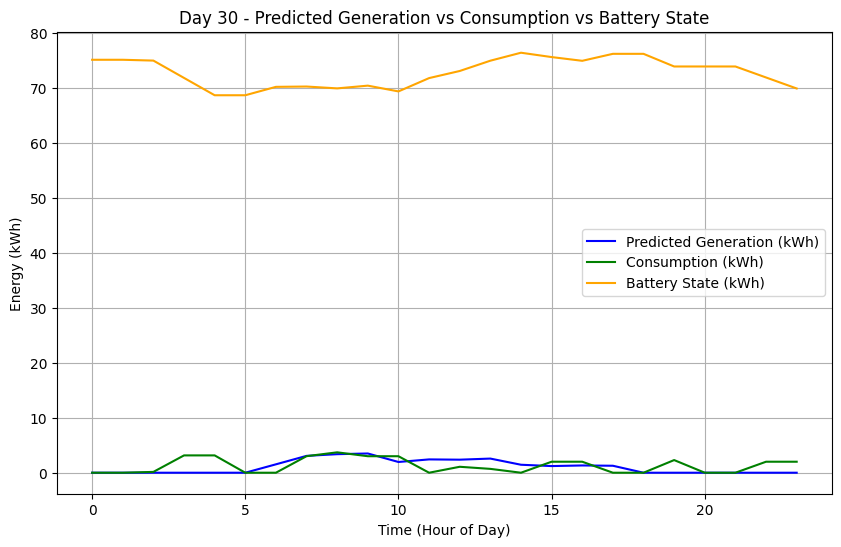

Simulating Day 31
[✔️] Appliance 0 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 23 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 3 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

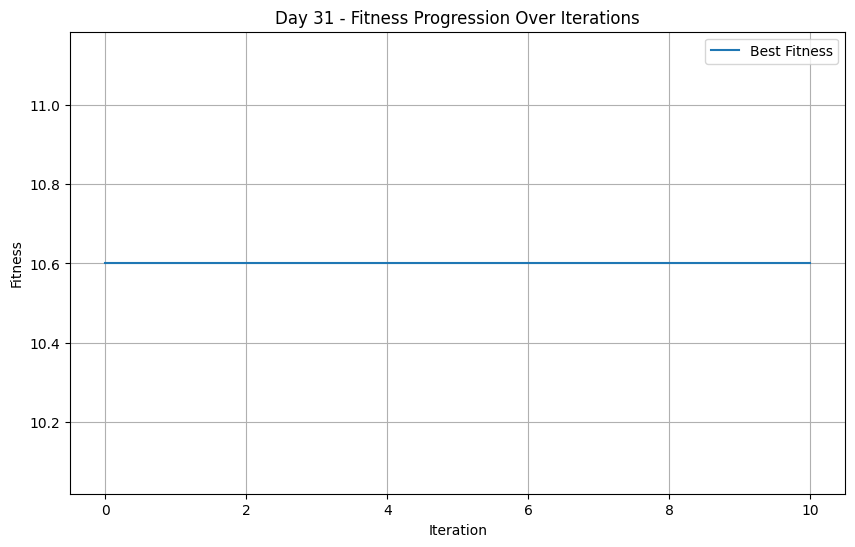

Appliance 0: Start Time = 17, Cost = 0.9999553899247451
Appliance 1: Start Time = 23, Cost = 0.999999911456603
Appliance 2: Start Time = 11, Cost = 0.9778158330641089
Appliance 3: Start Time = 20, Cost = 1.0
Appliance 4: Start Time = 11, Cost = 0.9999920081294466
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 1, Cost = 0.9999985132804853
Appliance 8: Start Time = 5, Cost = 1.0
Appliance 9: Start Time = 13, Cost = 0.9995636586524771
Appliance 10: Start Time = 3, Cost = 0.9999999999998783
===== Optimized Day 31 Schedule =====
Appliance 1: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 23, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

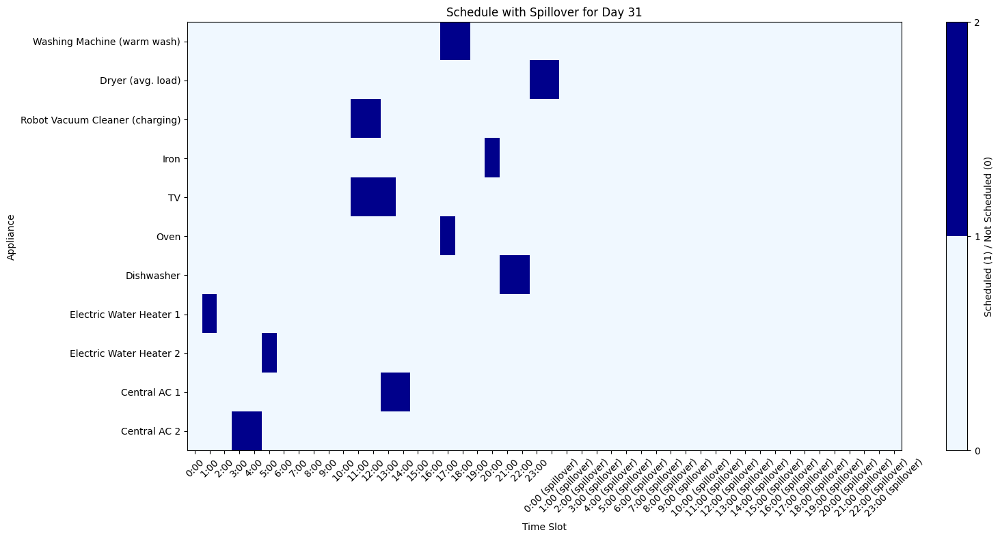

Best Fitness: 10.601821510924879
Updated Fitness: 10.601821510924879

===== Hourly Breakdown for Day 31 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              69.86
 1     0.00              0.70              69.16
 2     0.00              0.00              69.16
 3     0.00              3.00              66.16
 4     0.00              3.00              63.16
 5     0.00              0.70              62.46
 6     1.30              0.00              63.75
 7     2.54              0.00              66.30
 8     3.75              0.00              70.05
 9     3.24              0.00              73.29
10     4.40              0.00              77.69
11     3.22              0.16              80.75
12     3.55              0.16              84.15
13     2.95              3.15              83.94
14     2.57              3.00              83.51
15     1.96              0.

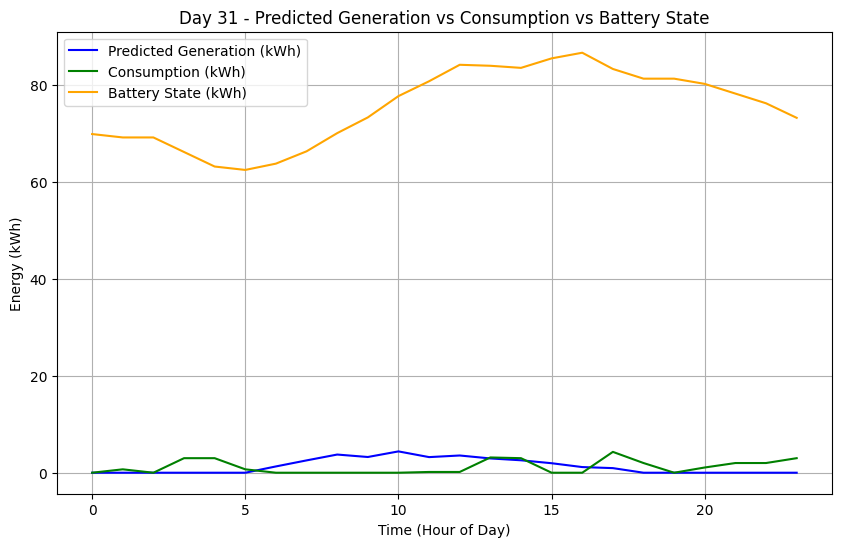

Simulating Day 32
[✔️] Appliance 0 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 23 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 17 (valid range: 0-23)
Initial_solution: [[0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

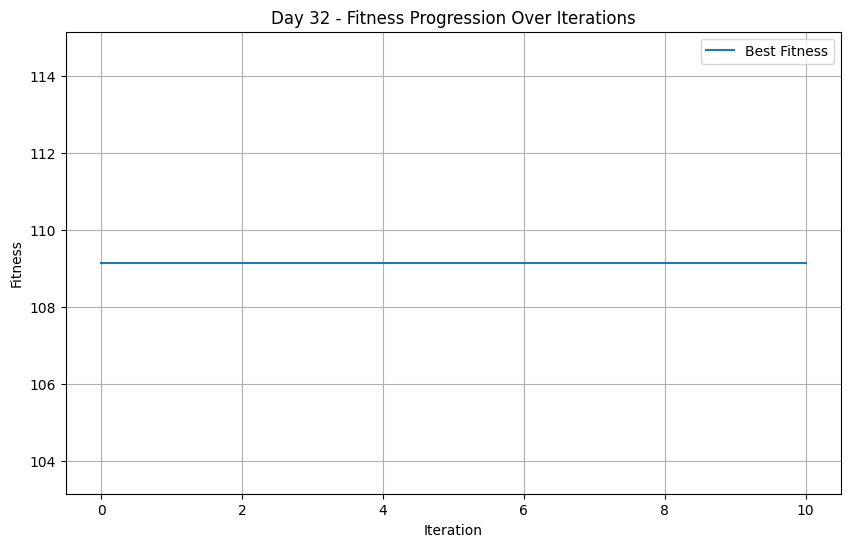

Appliance 0: Start Time = 3, Cost = 0.8935173314925493
Appliance 1: Start Time = 0, Cost = 100.0
Appliance 2: Start Time = 16, Cost = 0.9972834061532628
Appliance 3: Start Time = 9, Cost = 0.7580292754808566
Appliance 4: Start Time = 12, Cost = 0.9999330848871175
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 13, Cost = 0.9999999999908653
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 2, Cost = 0.9730045167434059
Appliance 10: Start Time = 17, Cost = 0.8239673366178503
===== Optimized Day 32 Schedule =====
Appliance 1: Start Time 3, Duration 2
Time Slots (first 24): [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 0 0 0 0 0 0 0

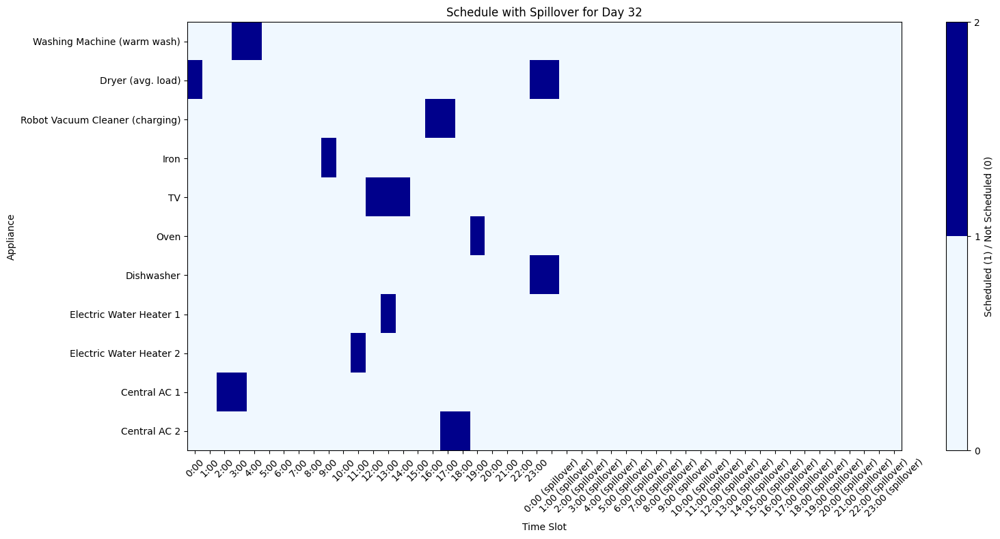

Best Fitness: 109.1487169196483
Updated Fitness: 109.1487169196483

===== Hourly Breakdown for Day 32 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              70.20
 1     0.00              0.00              70.20
 2     0.00              3.00              67.20
 3     0.00              5.00              62.20
 4     0.00              2.00              60.20
 5     0.00              0.00              60.20
 6     2.31              0.00              62.51
 7     5.27              0.00              67.78
 8     5.75              0.00              73.53
 9     5.91              1.08              78.36
10     5.30              0.00              83.66
11     4.72              0.70              87.68
12     4.12              0.15              91.65
13     3.56              0.85              94.36
14     2.15              0.15              96.36
15     2.65              0.00

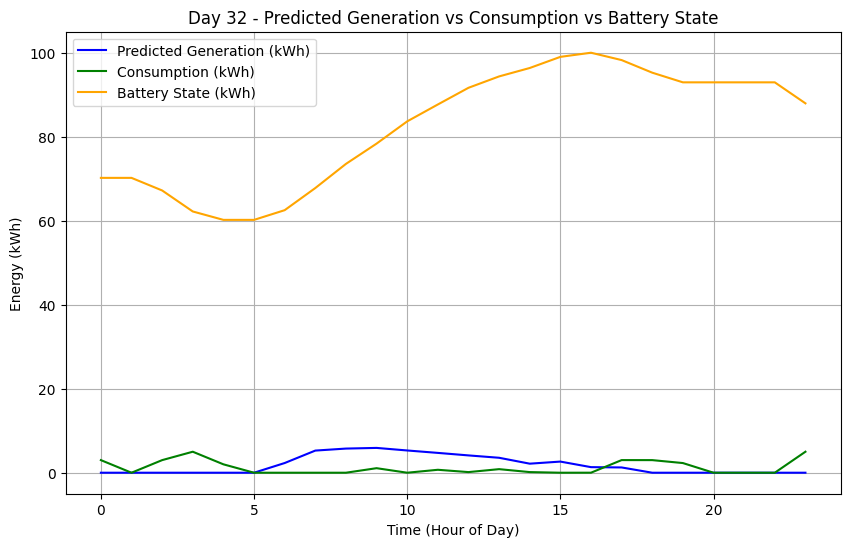

Simulating Day 33
[✔️] Appliance 0 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 19 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 9 (valid range: 0-23)
Initial_solution: [[0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

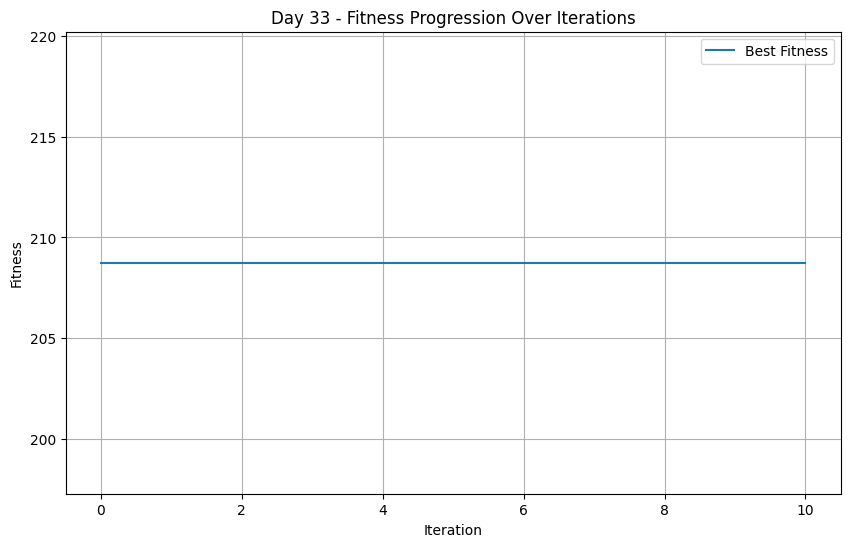

Appliance 0: Start Time = 2, Cost = 0.9193430918269522
Appliance 1: Start Time = 0, Cost = 100.0
Appliance 2: Start Time = 21, Cost = 0.9998776196139773
Appliance 3: Start Time = 2, Cost = 0.9999999939241172
Appliance 4: Start Time = 11, Cost = 0.9999920081294466
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 23, Cost = 1.0
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 9, Cost = 0.9999920081294466
===== Optimized Day 33 Schedule =====
Appliance 1: Start Time 2, Duration 2
Time Slots (first 24): [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

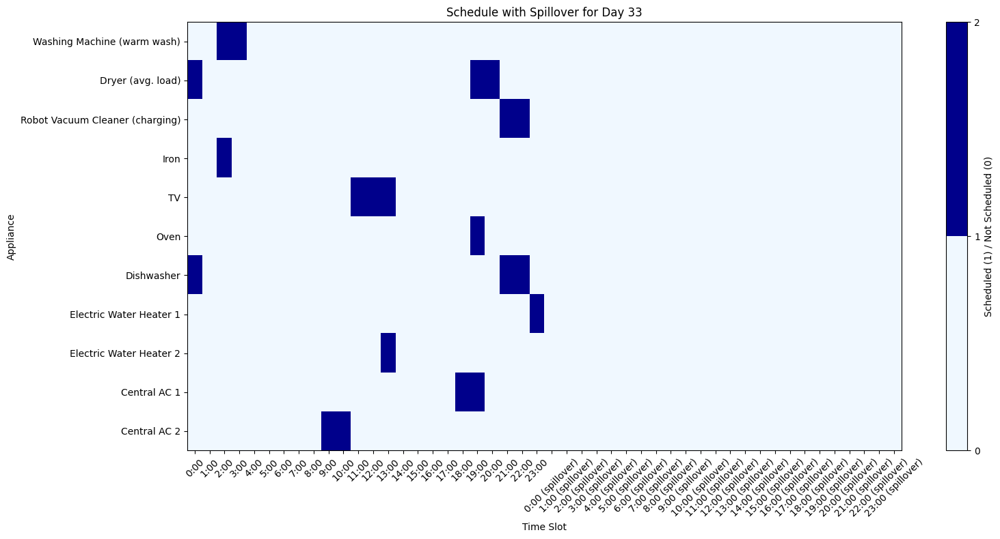

Best Fitness: 208.7430382249781
Updated Fitness: 208.7430382249781

===== Hourly Breakdown for Day 33 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              5.00              82.95
 1     0.00              0.00              82.95
 2     0.00              3.08              79.87
 3     0.00              2.00              77.87
 4     0.00              0.00              77.87
 5     0.00              0.00              77.87
 6     3.34              0.00              81.21
 7     5.41              0.00              86.62
 8     6.04              0.00              92.66
 9     6.08              3.00              95.73
10     5.54              3.00              98.28
11     5.43              0.15              100.00
12     5.30              0.15              100.00
13     4.68              0.85              100.00
14     3.24              0.00              100.00
15     2.93              

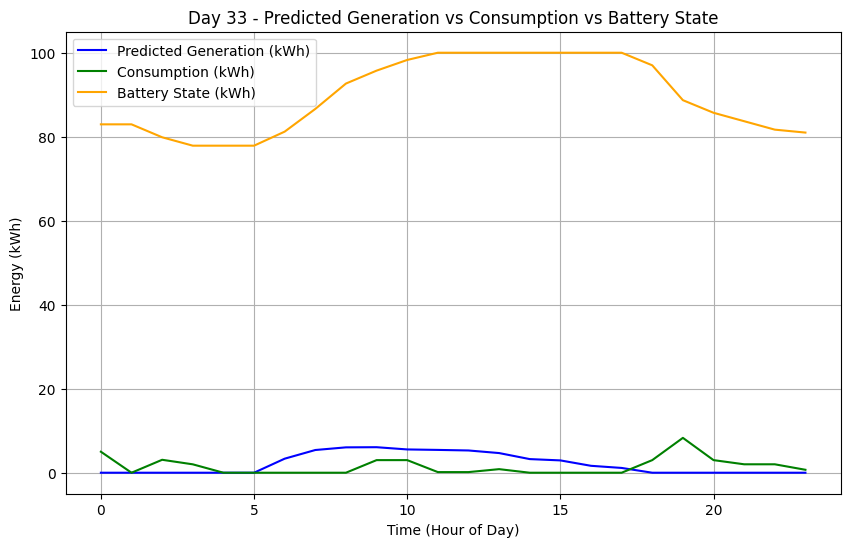

Simulating Day 34
[✔️] Appliance 0 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 10 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 20 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 

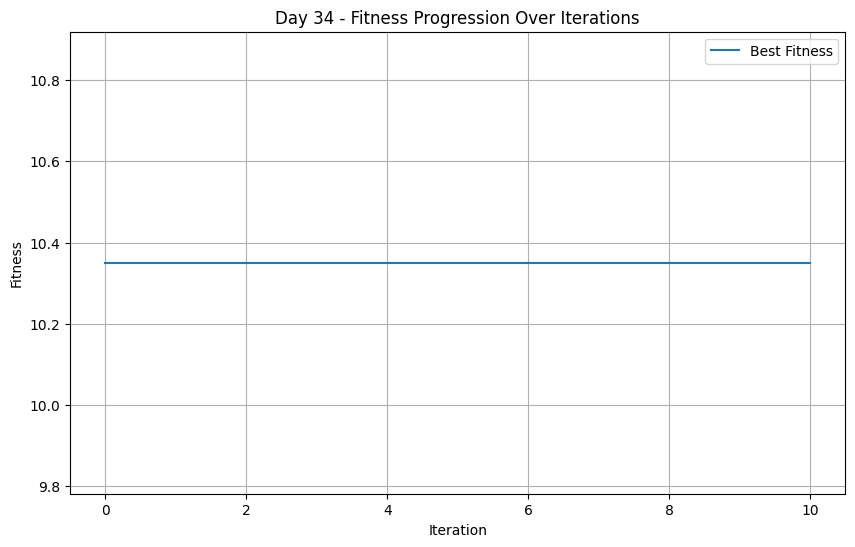

Appliance 0: Start Time = 18, Cost = 0.9999888763792014
Appliance 1: Start Time = 10, Cost = 0.9193430918269522
Appliance 2: Start Time = 15, Cost = 0.9955210939410314
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 14, Cost = 0.997784075794031
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 1, Cost = 0.9999985132804853
Appliance 8: Start Time = 9, Cost = 0.9999999999999949
Appliance 9: Start Time = 8, Cost = 0.8790146377404283
Appliance 10: Start Time = 20, Cost = 0.8790146377404283
===== Optimized Day 34 Schedule =====
Appliance 1: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

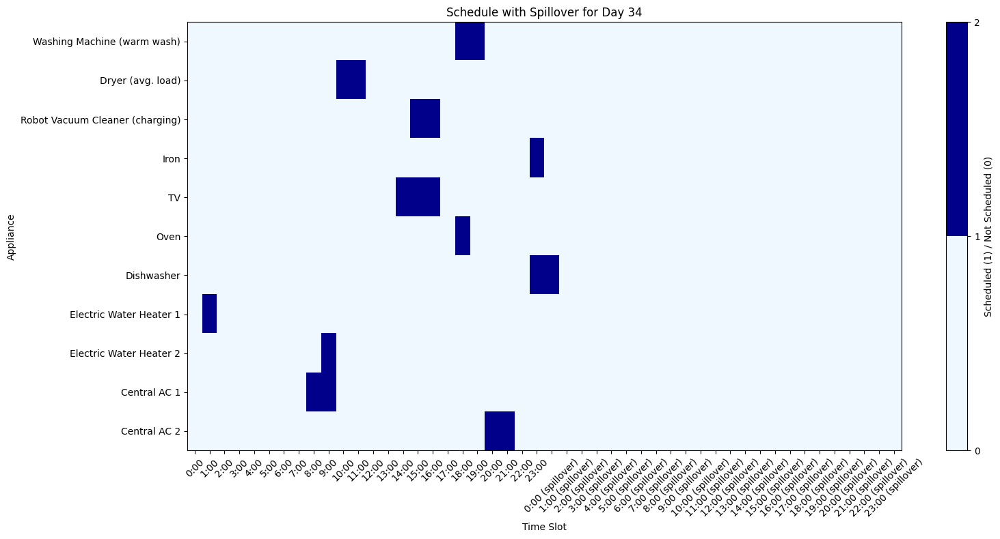

Best Fitness: 10.350208424242267
Updated Fitness: 10.350208424242267

===== Hourly Breakdown for Day 34 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              80.99
 1     0.00              0.70              80.29
 2     0.00              0.00              80.29
 3     0.00              0.00              80.29
 4     0.00              0.00              80.29
 5     0.00              0.00              80.29
 6     3.38              0.00              83.67
 7     4.58              0.00              88.25
 8     5.37              3.00              90.62
 9     5.55              3.70              92.47
10     5.96              3.00              95.43
11     5.97              3.00              98.41
12     5.67              0.00              100.00
13     5.40              0.00              100.00
14     4.86              0.15              100.00
15     3.77             

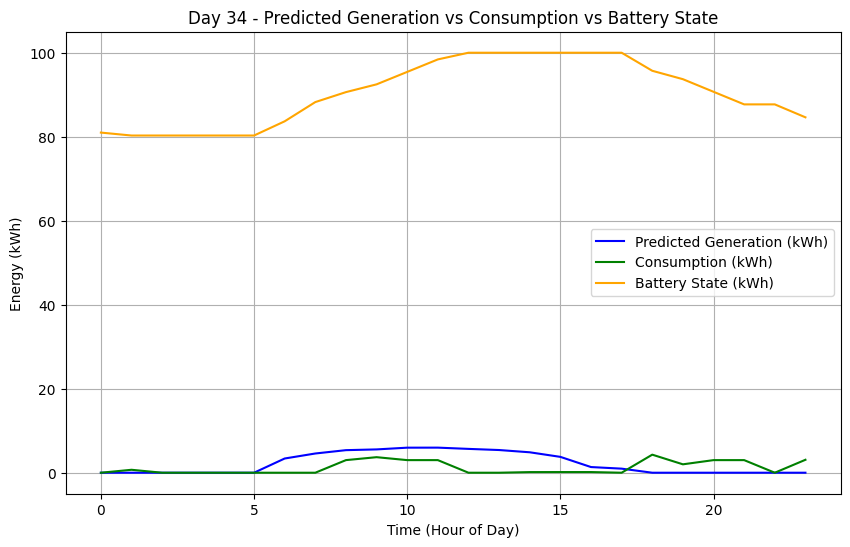

Simulating Day 35
[✔️] Appliance 0 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 7 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

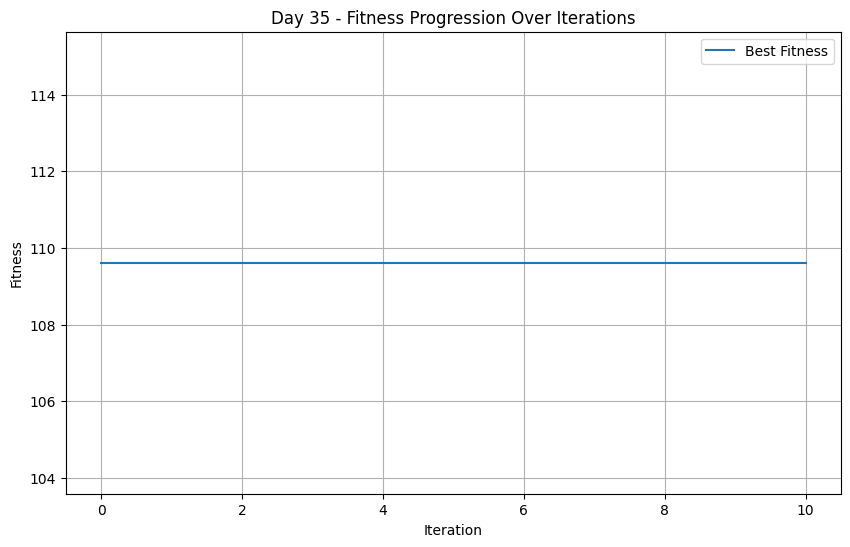

Appliance 0: Start Time = 16, Cost = 0.999839909782793
Appliance 1: Start Time = 7, Cost = 0.8670192398661891
Appliance 2: Start Time = 13, Cost = 0.9892018066973624
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 8, Cost = 0.9999999969620585
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 14, Cost = 0.9999999999999949
Appliance 8: Start Time = 9, Cost = 0.9999999999999949
Appliance 9: Start Time = 3, Cost = 0.9352412021670541
Appliance 10: Start Time = 4, Cost = 0.9999999999954327
===== Optimized Day 35 Schedule =====
Appliance 1: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0

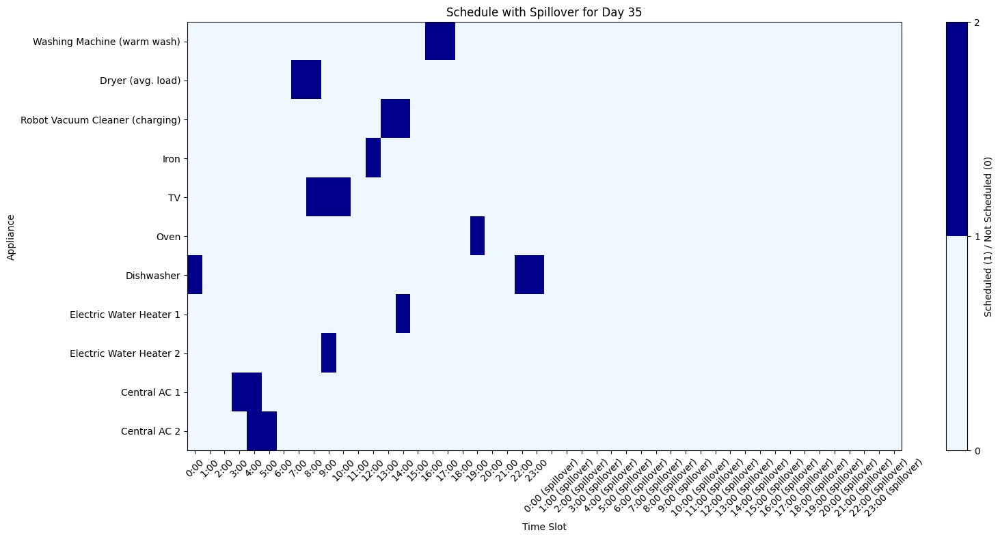

Best Fitness: 109.61513566186298
Updated Fitness: 109.61513566186298

===== Hourly Breakdown for Day 35 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              82.62
 1     0.00              0.00              82.62
 2     0.00              0.00              82.62
 3     0.00              3.00              79.62
 4     0.00              6.00              73.62
 5     0.00              3.00              70.62
 6     2.95              0.00              73.57
 7     4.59              3.00              75.16
 8     5.39              3.15              77.40
 9     5.68              0.85              82.23
10     5.08              0.15              87.17
11     5.33              0.00              92.50
12     4.57              1.08              95.99
13     4.01              0.01              99.99
14     3.63              0.71              100.00
15     1.58              0

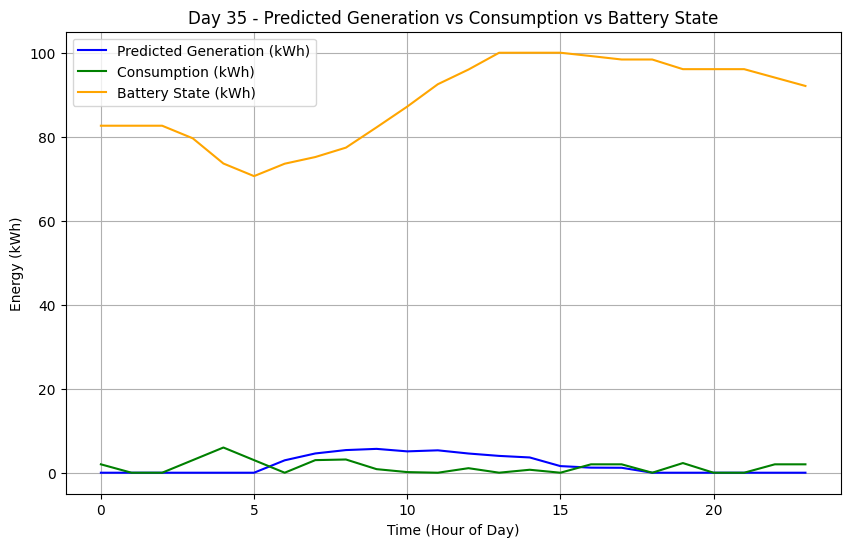

Simulating Day 36
[✔️] Appliance 0 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 15 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

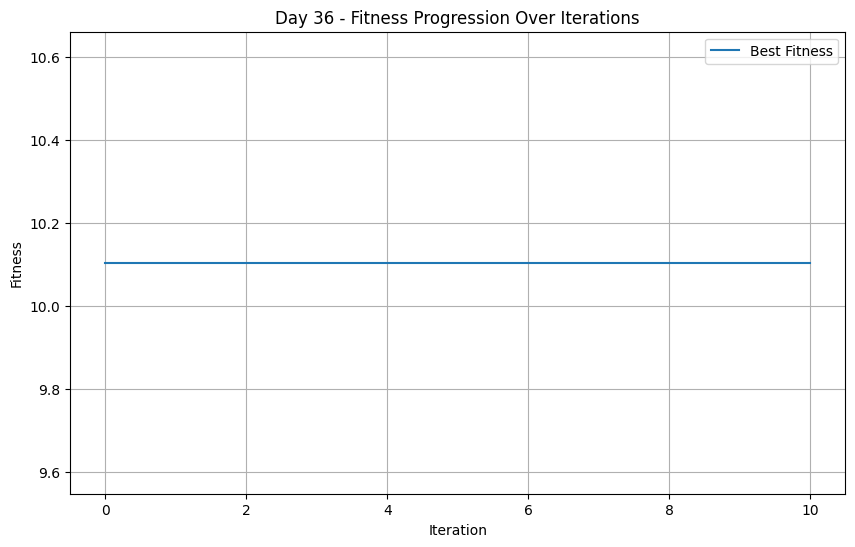

Appliance 0: Start Time = 7, Cost = 0.8935173314925493
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 8, Cost = 0.6010577195985674
Appliance 4: Start Time = 13, Cost = 0.9995636586524771
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 14, Cost = 0.995568151588062
Appliance 9: Start Time = 21, Cost = 0.9999999999998783
Appliance 10: Start Time = 15, Cost = 0.9352412021670541
===== Optimized Day 36 Schedule =====
Appliance 1: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0

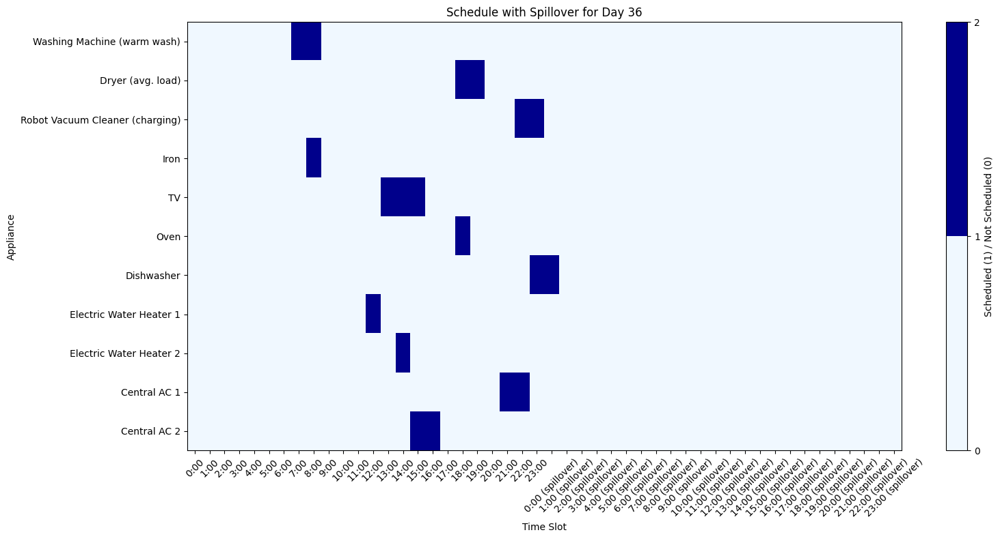

Best Fitness: 10.104273075360053
Updated Fitness: 10.104273075360053

===== Hourly Breakdown for Day 36 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              92.09
 1     0.00              0.00              92.09
 2     0.00              0.00              92.09
 3     0.00              0.00              92.09
 4     0.00              0.00              92.09
 5     0.00              0.00              92.09
 6     2.11              0.00              94.20
 7     4.59              2.00              96.78
 8     4.85              3.08              98.56
 9     5.44              0.00              100.00
10     4.94              0.00              100.00
11     4.57              0.00              100.00
12     5.79              0.70              100.00
13     3.83              0.15              100.00
14     4.07              0.85              100.00
15     2.85          

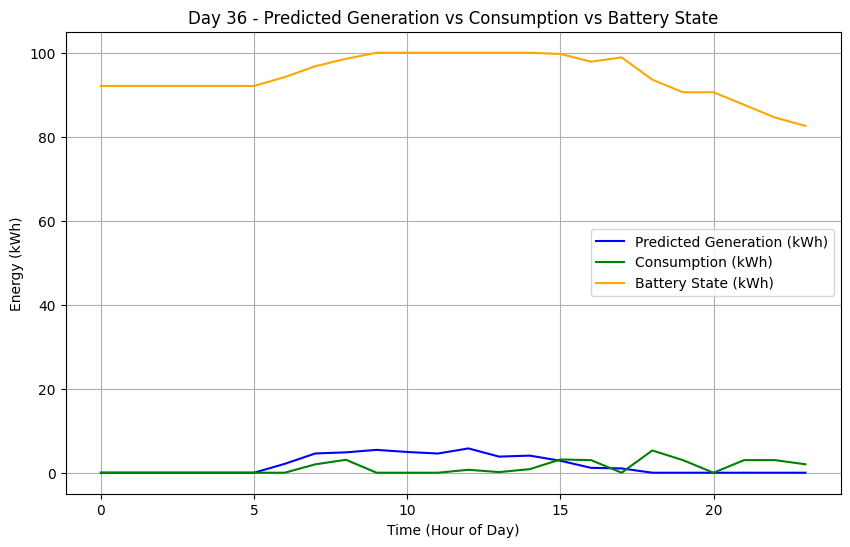

Simulating Day 37
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 12 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

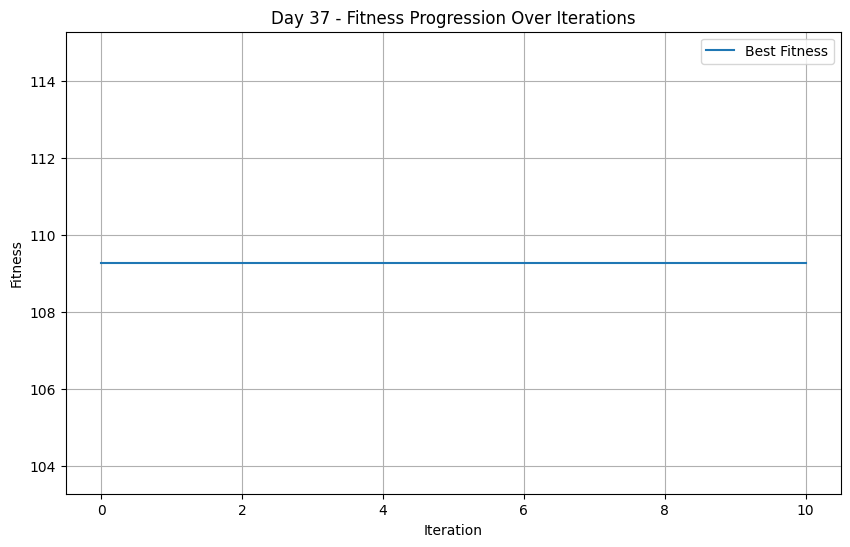

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 15, Cost = 0.9955210939410314
Appliance 3: Start Time = 9, Cost = 0.7580292754808566
Appliance 4: Start Time = 20, Cost = 0.8005288597992837
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 19, Cost = 1.0
Appliance 8: Start Time = 22, Cost = 0.9999985132804853
Appliance 9: Start Time = 3, Cost = 0.9352412021670541
Appliance 10: Start Time = 12, Cost = 0.997784075794031
===== Optimized Day 37 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

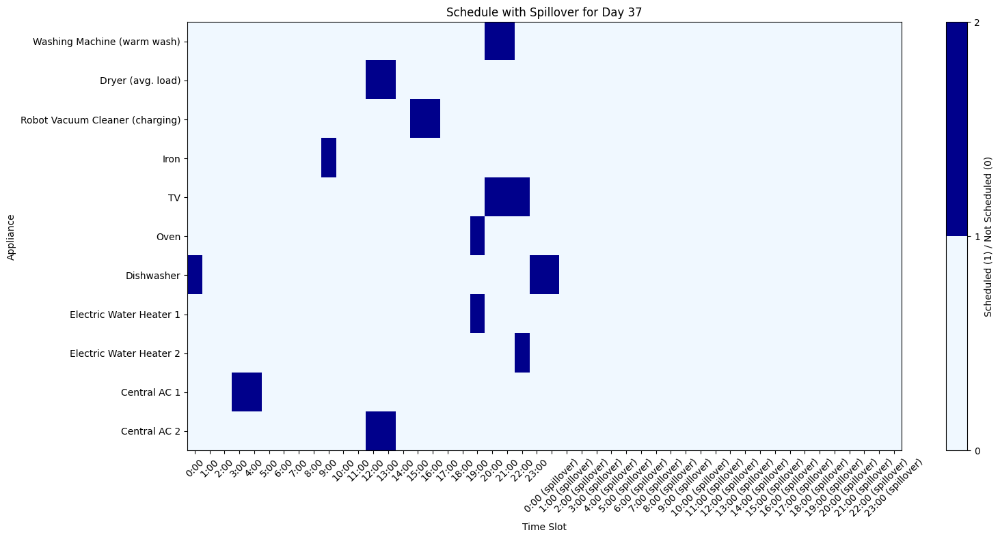

Best Fitness: 109.27791081524317
Updated Fitness: 109.27791081524317

===== Hourly Breakdown for Day 37 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              80.57
 1     0.00              0.00              80.57
 2     0.00              0.00              80.57
 3     0.00              3.00              77.57
 4     0.00              3.00              74.57
 5     0.00              0.00              74.57
 6     3.11              0.00              77.69
 7     4.04              0.00              81.73
 8     4.57              0.00              86.30
 9     5.34              1.08              90.56
10     5.48              0.00              96.04
11     5.37              0.00              100.00
12     5.88              6.00              99.88
13     4.28              6.00              98.16
14     4.48              0.00              100.00
15     3.69              

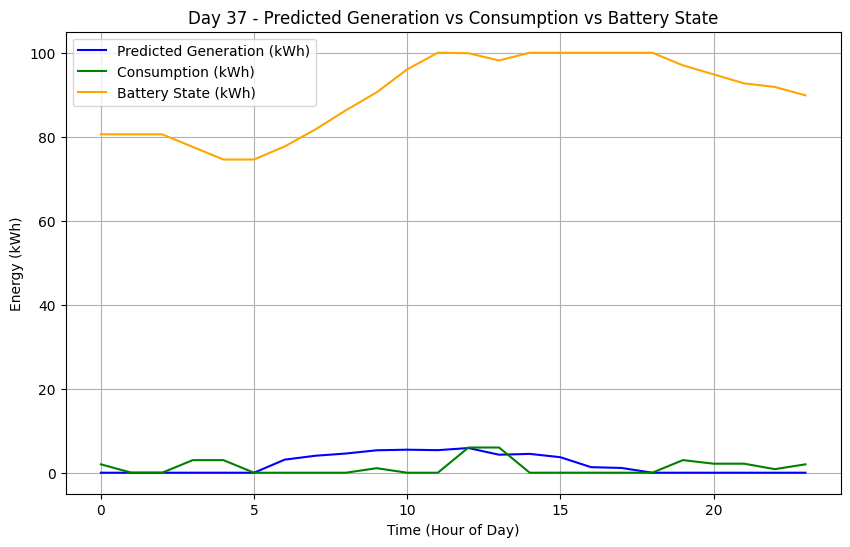

Simulating Day 38
[✔️] Appliance 0 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 5 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

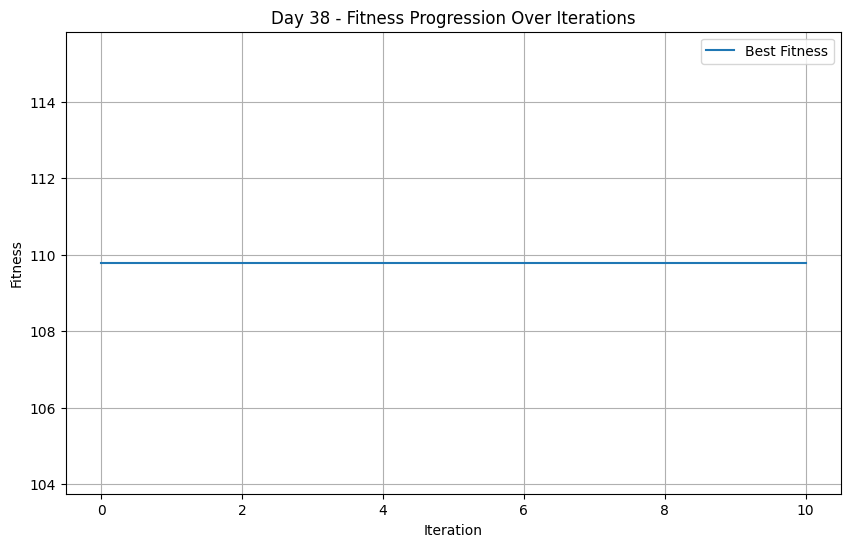

Appliance 0: Start Time = 18, Cost = 0.9999888763792014
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 23, Cost = 0.999973233954847
Appliance 3: Start Time = 3, Cost = 0.9999985132804853
Appliance 4: Start Time = 5, Cost = 0.9999999999998783
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 23, Cost = 1.0
Appliance 8: Start Time = 8, Cost = 1.0
Appliance 9: Start Time = 22, Cost = 0.9999999999999974
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 38 Schedule =====
Appliance 1: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


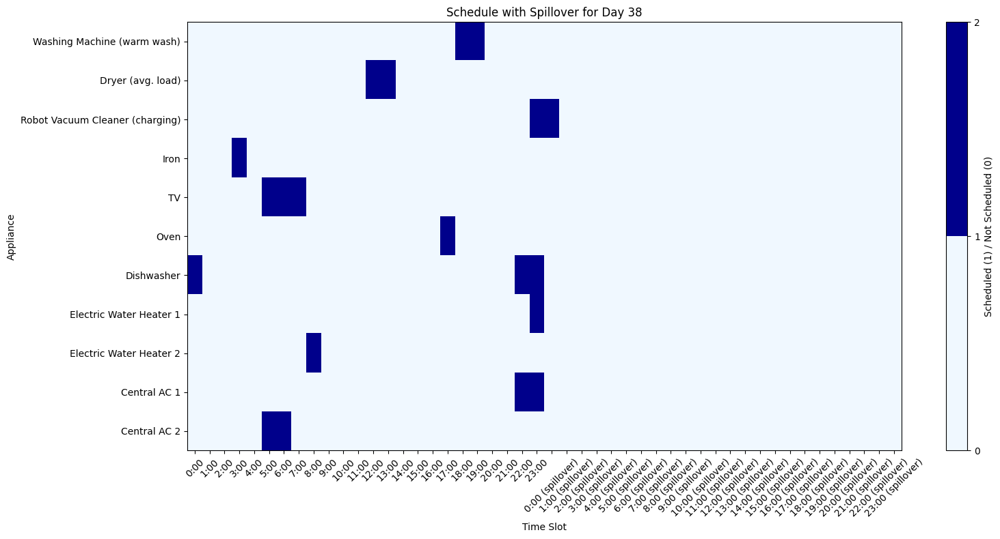

Best Fitness: 109.79076891383453
Updated Fitness: 109.79076891383453

===== Hourly Breakdown for Day 38 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              87.85
 1     0.00              0.00              87.85
 2     0.00              0.00              87.85
 3     0.00              1.08              86.77
 4     0.00              0.00              86.77
 5     0.00              3.15              83.62
 6     2.80              3.15              83.27
 7     4.22              0.15              87.33
 8     5.26              0.70              91.89
 9     5.87              0.00              97.76
10     5.78              0.00              100.00
11     5.87              0.00              100.00
12     5.80              3.00              100.00
13     5.16              3.00              100.00
14     4.64              0.00              100.00
15     3.86           

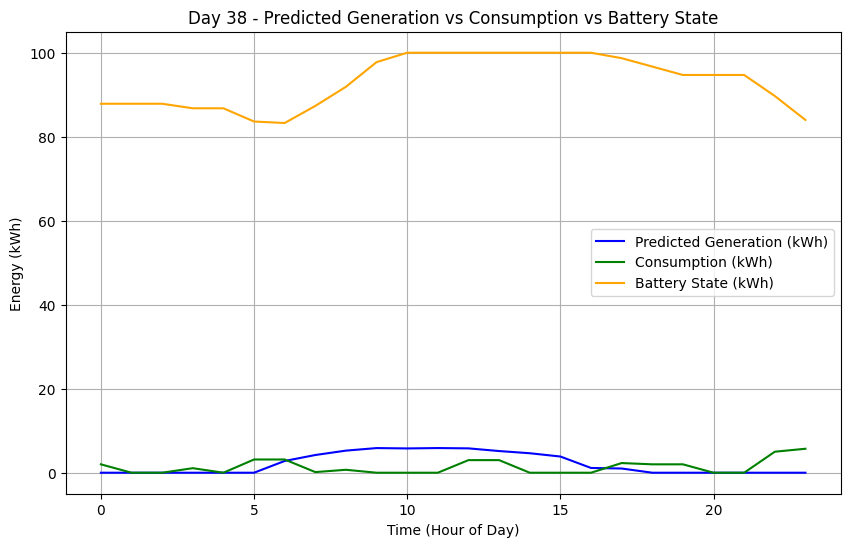

Simulating Day 39
[✔️] Appliance 0 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

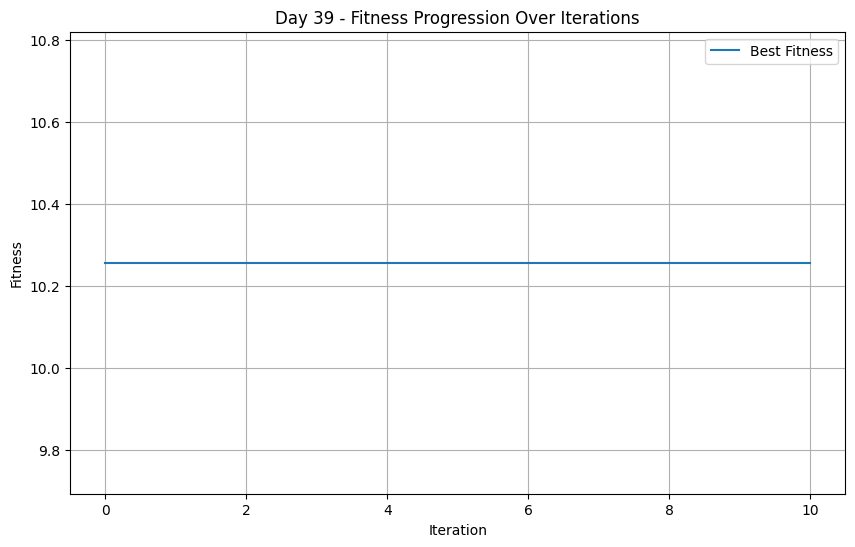

Appliance 0: Start Time = 23, Cost = 0.9999999979747057
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 0, Cost = 0.9333550794216401
Appliance 3: Start Time = 1, Cost = 0.9999999999908653
Appliance 4: Start Time = 22, Cost = 0.8790146377404283
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 9, Cost = 0.995568151588062
Appliance 8: Start Time = 4, Cost = 1.0
Appliance 9: Start Time = 7, Cost = 0.8239673366178503
Appliance 10: Start Time = 4, Cost = 0.9999999999954327
===== Optimized Day 39 Schedule =====
Appliance 1: Start Time 23, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0

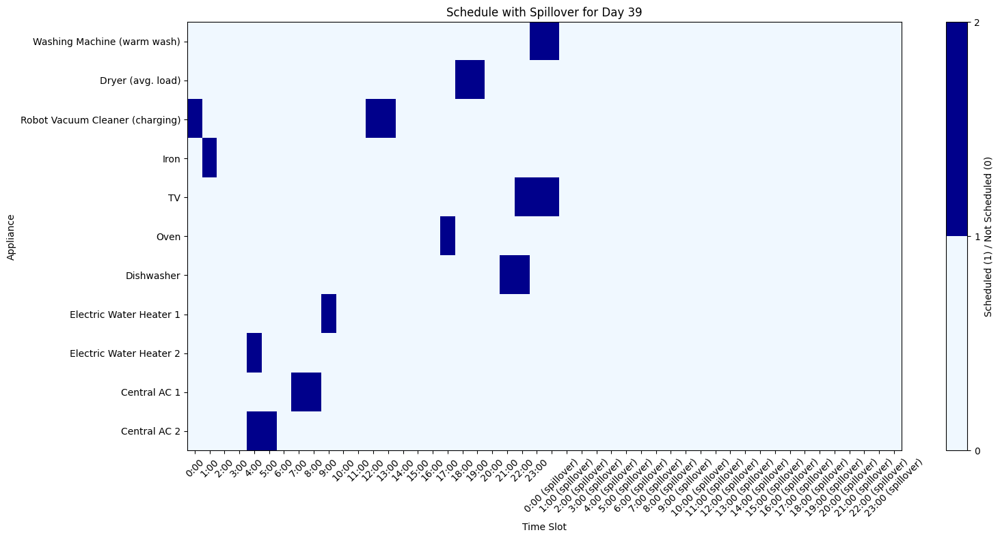

Best Fitness: 10.25624130952891
Updated Fitness: 10.25624130952891

===== Hourly Breakdown for Day 39 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.01              83.99
 1     0.00              1.08              82.91
 2     0.00              0.00              82.91
 3     0.00              0.00              82.91
 4     0.00              3.70              79.21
 5     0.00              3.00              76.21
 6     2.46              0.00              78.67
 7     4.37              3.00              80.04
 8     5.44              3.00              82.49
 9     5.73              0.70              87.52
10     6.04              0.00              93.55
11     5.94              0.00              99.50
12     6.02              0.01              100.00
13     5.16              0.01              100.00
14     5.00              0.00              100.00
15     3.88              0

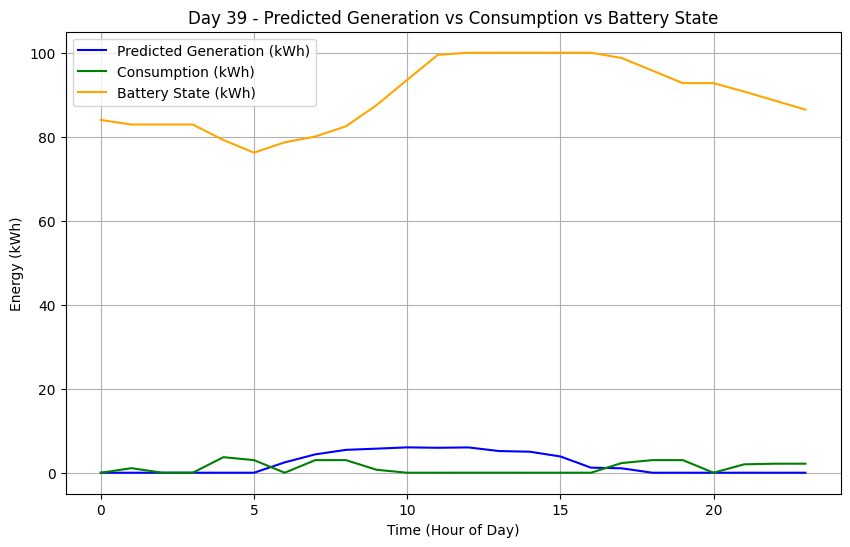

Simulating Day 40
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 22 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 11 (valid range: 0-23)
Initial_solution: [[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

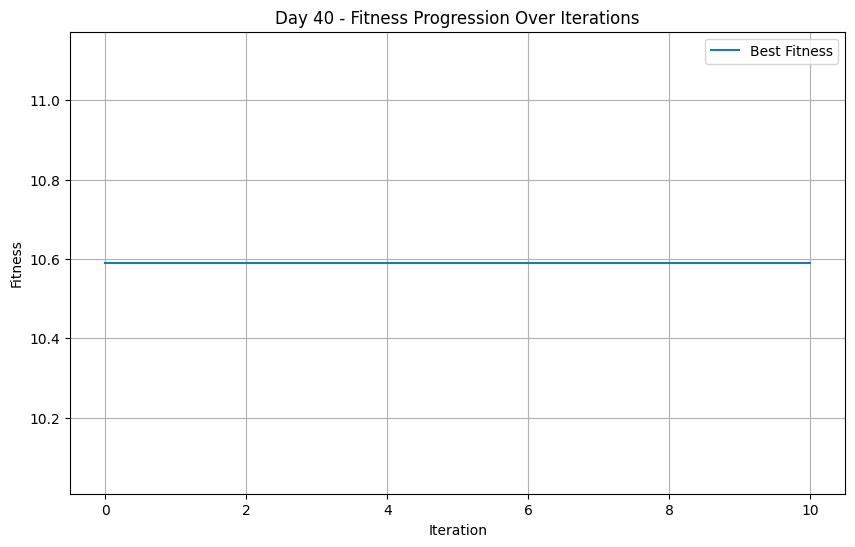

Appliance 0: Start Time = 0, Cost = 0.9668409537357504
Appliance 1: Start Time = 22, Cost = 0.9999995044268284
Appliance 2: Start Time = 19, Cost = 0.999523182359707
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 0, Cost = 1.0
Appliance 9: Start Time = 22, Cost = 0.9999999999999974
Appliance 10: Start Time = 11, Cost = 0.9995636586524771
===== Optimized Day 40 Schedule =====
Appliance 1: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: Sta

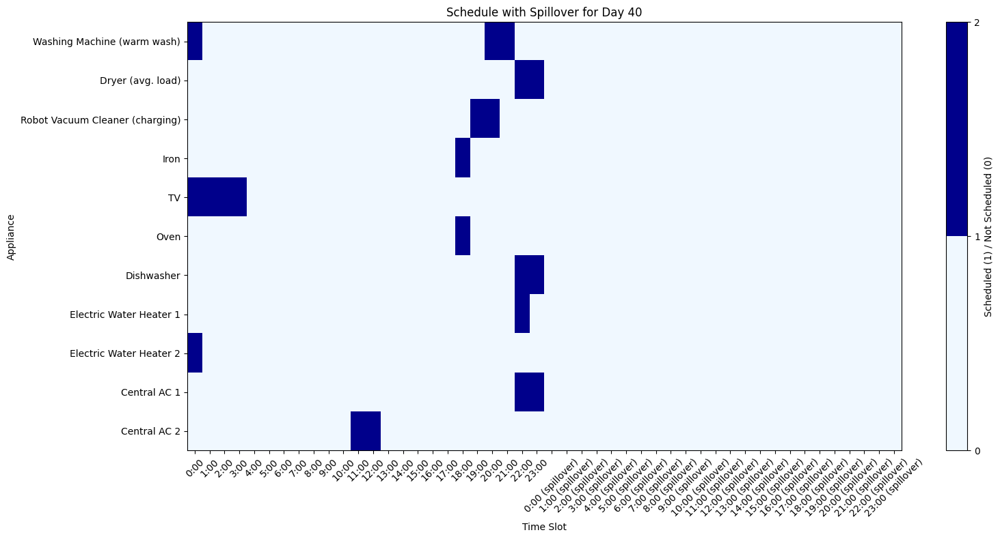

Best Fitness: 10.590423495591894
Updated Fitness: 10.590423495591894

===== Hourly Breakdown for Day 40 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.85              83.60
 1     0.00              0.15              83.45
 2     0.00              0.15              83.30
 3     0.00              0.15              83.15
 4     0.00              0.00              83.15
 5     0.00              0.00              83.15
 6     2.54              0.00              85.69
 7     5.30              0.00              90.99
 8     5.62              0.00              96.61
 9     5.98              0.00              100.00
10     6.05              0.00              100.00
11     5.99              3.00              100.00
12     6.09              3.00              100.00
13     5.71              0.00              100.00
14     5.27              0.00              100.00
15     4.10          

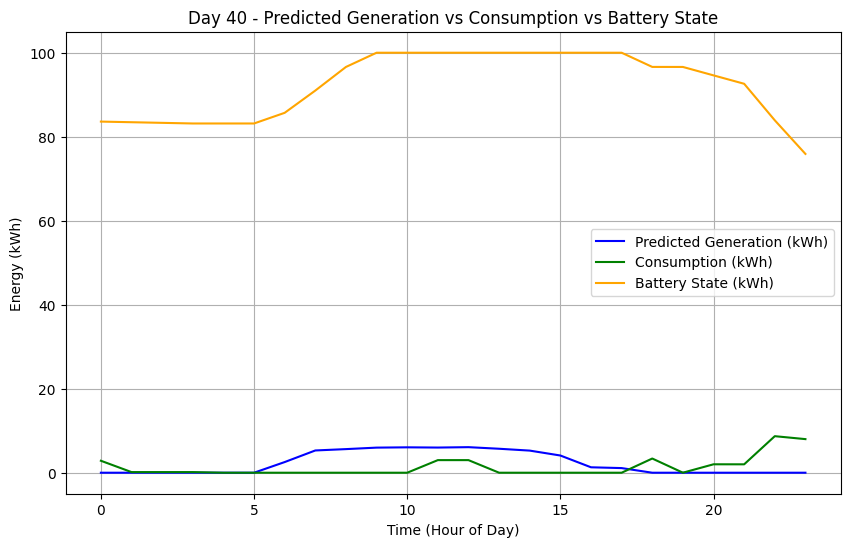

Simulating Day 41
[✔️] Appliance 0 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 10 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 21 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

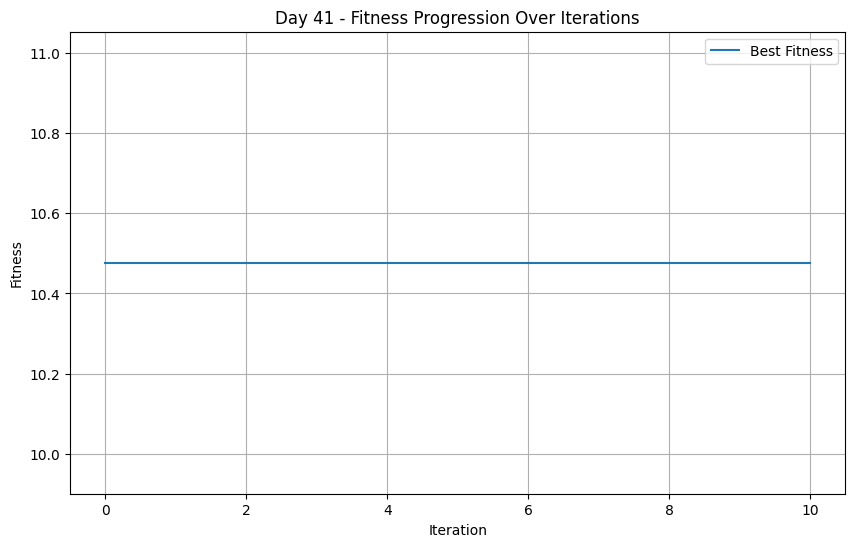

Appliance 0: Start Time = 15, Cost = 0.9994859070012363
Appliance 1: Start Time = 10, Cost = 0.9193430918269522
Appliance 2: Start Time = 2, Cost = 0.9217914612049088
Appliance 3: Start Time = 21, Cost = 1.0
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 12, Cost = 0.997784075794031
Appliance 10: Start Time = 21, Cost = 0.9352412021670541
===== Optimized Day 41 Schedule =====
Appliance 1: Start Time 15, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

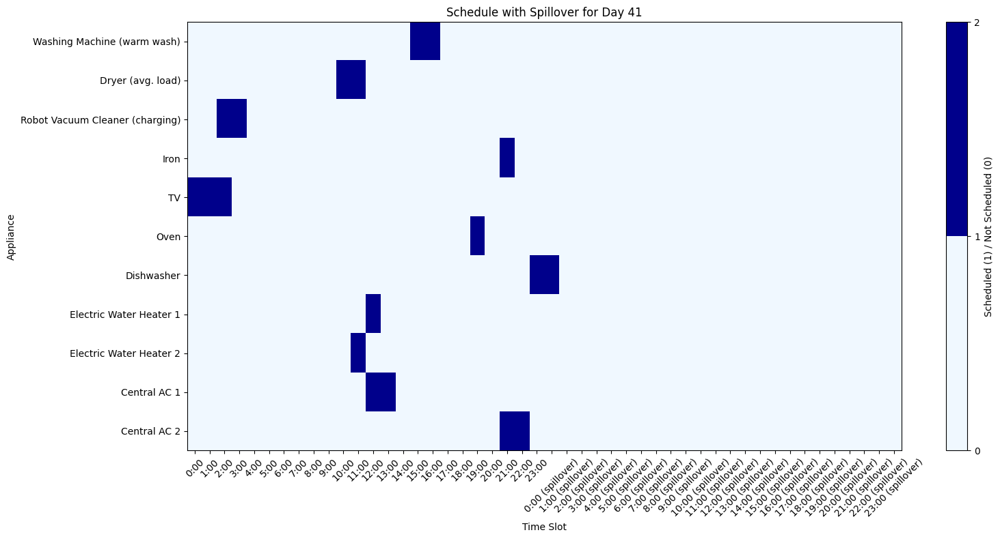

Best Fitness: 10.476627700200696
Updated Fitness: 10.476627700200696

===== Hourly Breakdown for Day 41 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              75.76
 1     0.00              0.15              75.61
 2     0.00              0.16              75.45
 3     0.00              0.01              75.44
 4     0.00              0.00              75.44
 5     0.00              0.00              75.44
 6     2.33              0.00              77.77
 7     4.72              0.00              82.49
 8     5.53              0.00              88.02
 9     5.67              0.00              93.68
10     5.95              3.00              96.63
11     6.05              3.70              98.99
12     6.00              3.70              100.00
13     5.61              3.00              100.00
14     5.41              0.00              100.00
15     4.51             

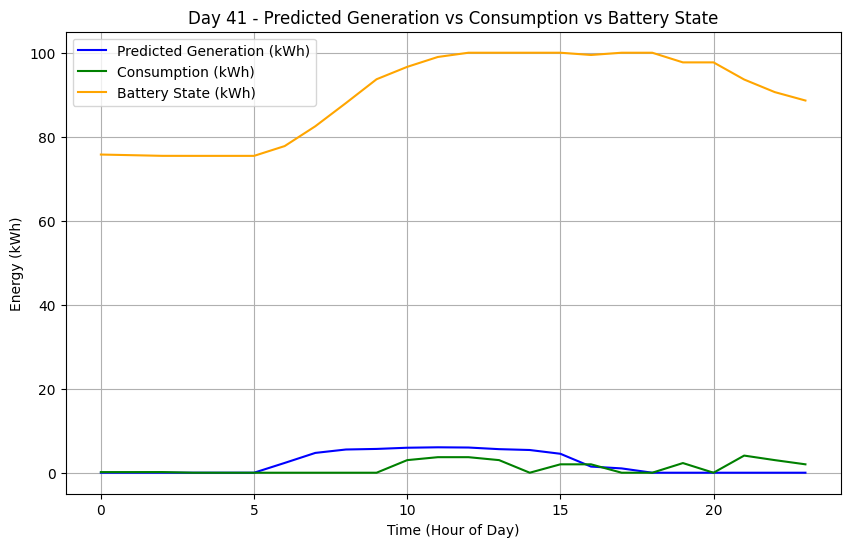

Simulating Day 42
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 10 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

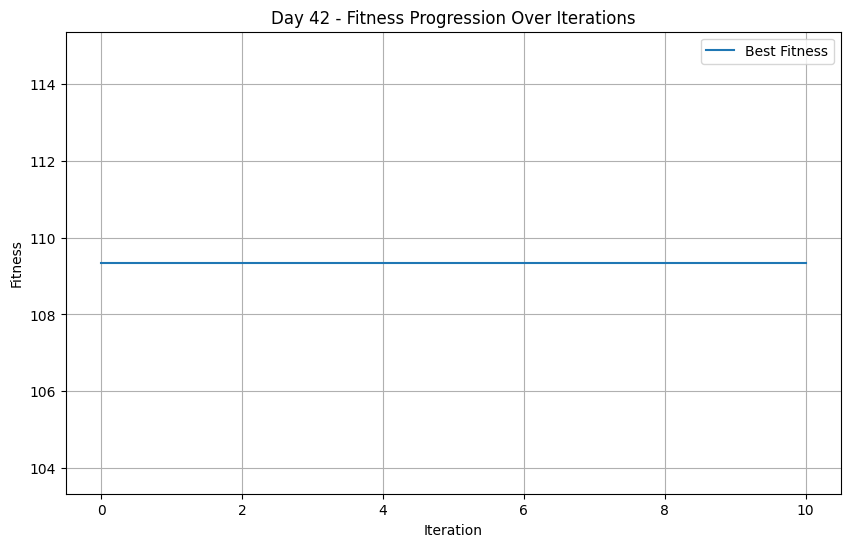

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 10, Cost = 0.9193430918269522
Appliance 2: Start Time = 1, Cost = 0.9263459719393353
Appliance 3: Start Time = 9, Cost = 0.7580292754808566
Appliance 4: Start Time = 11, Cost = 0.9999920081294466
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 23, Cost = 1.0
Appliance 8: Start Time = 15, Cost = 0.946009033486812
Appliance 9: Start Time = 10, Cost = 0.9730045167434059
Appliance 10: Start Time = 4, Cost = 0.9999999999954327
===== Optimized Day 42 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

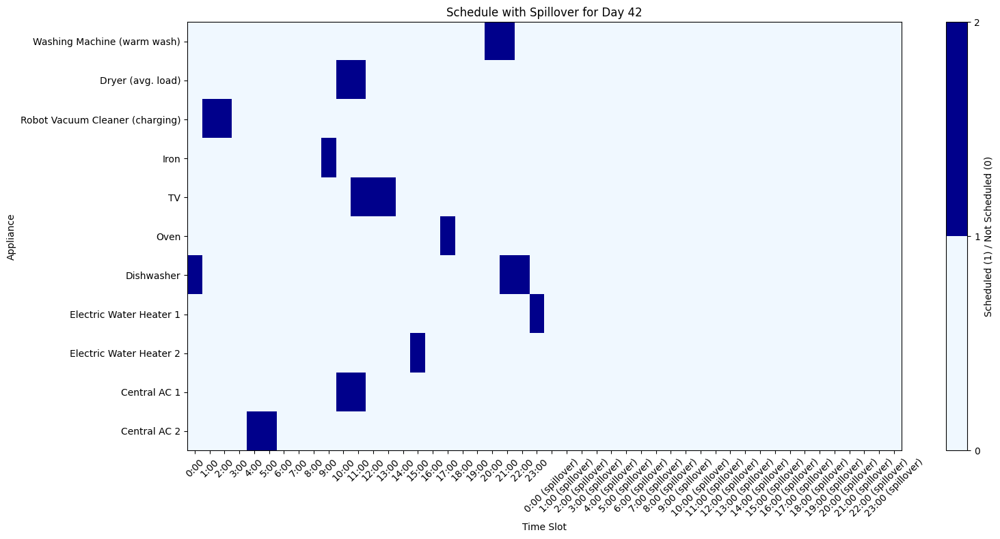

Best Fitness: 109.34669073864693
Updated Fitness: 109.34669073864693

===== Hourly Breakdown for Day 42 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              86.62
 1     0.00              0.01              86.61
 2     0.00              0.01              86.61
 3     0.00              0.00              86.61
 4     0.00              3.00              83.61
 5     0.00              3.00              80.61
 6     2.45              0.00              83.06
 7     5.04              0.00              88.09
 8     5.33              0.00              93.42
 9     5.88              1.08              98.22
10     5.91              6.00              98.13
11     5.97              6.15              97.94
12     5.95              0.15              100.00
13     5.49              0.15              100.00
14     5.00              0.00              100.00
15     3.76             

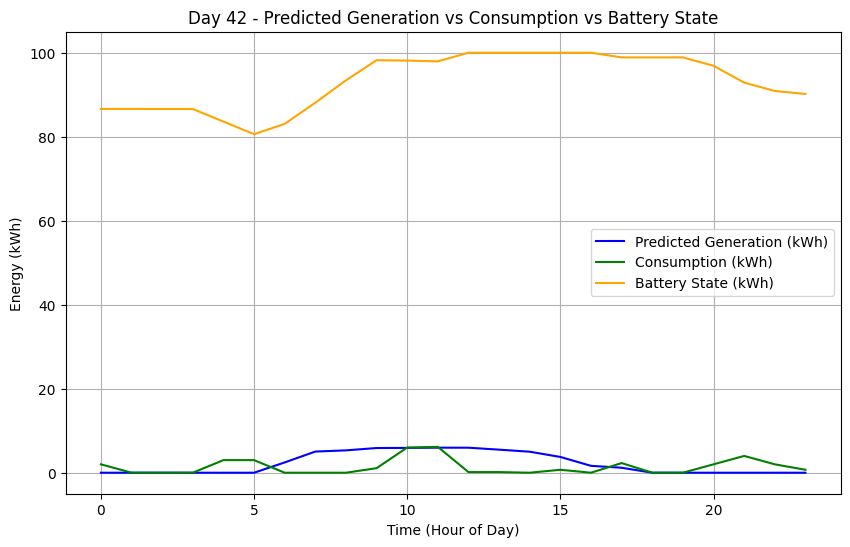

Simulating Day 43
[✔️] Appliance 0 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 21 (valid range: 0-23)
Initial_solution: [[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

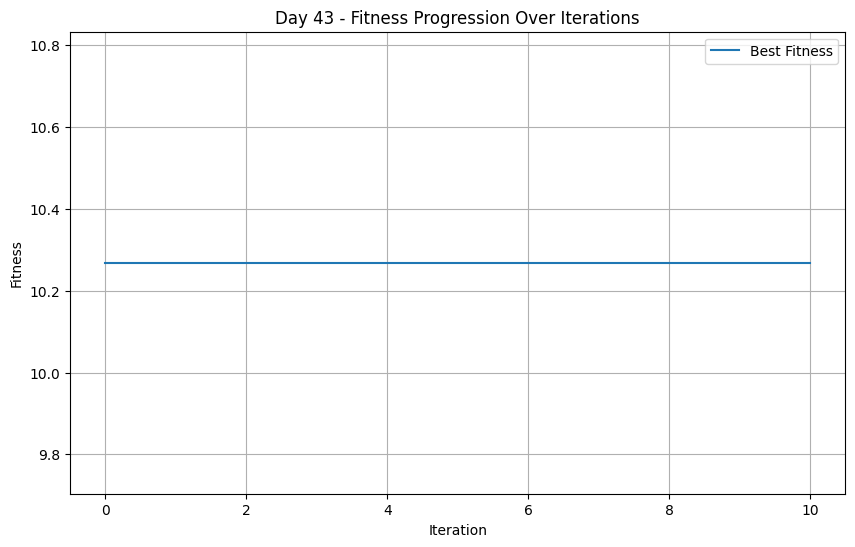

Appliance 0: Start Time = 0, Cost = 0.9668409537357504
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 15, Cost = 0.9955210939410314
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 4, Cost = 0.9999999999999974
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 14, Cost = 0.9999999999999949
Appliance 8: Start Time = 15, Cost = 0.946009033486812
Appliance 9: Start Time = 5, Cost = 0.8239673366178503
Appliance 10: Start Time = 21, Cost = 0.9352412021670541
===== Optimized Day 43 Schedule =====
Appliance 1: Start Time 0, Duration 2
Time Slots (first 24): [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0

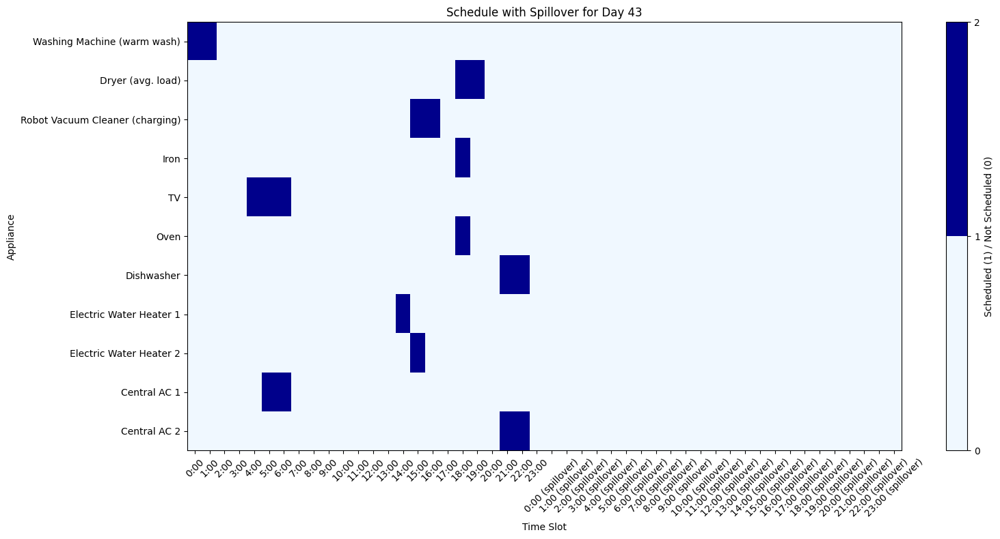

Best Fitness: 10.26847724932985
Updated Fitness: 10.26847724932985

===== Hourly Breakdown for Day 43 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              88.19
 1     0.00              2.00              86.19
 2     0.00              0.00              86.19
 3     0.00              0.00              86.19
 4     0.00              0.15              86.04
 5     0.00              3.15              82.89
 6     3.15              3.15              82.88
 7     5.03              0.00              87.91
 8     5.22              0.00              93.13
 9     5.79              0.00              98.91
10     6.04              0.00              100.00
11     6.01              0.00              100.00
12     6.03              0.00              100.00
13     5.54              0.00              100.00
14     4.90              0.70              100.00
15     3.70             

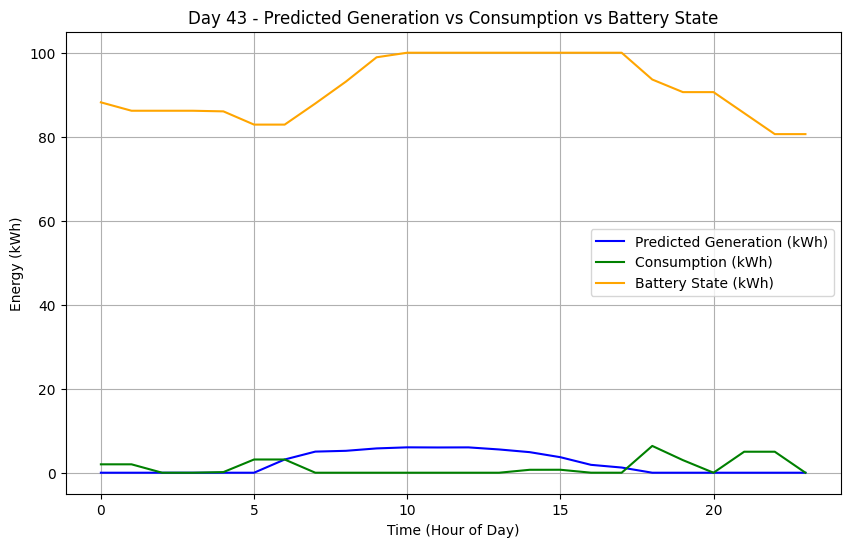

Simulating Day 44
[✔️] Appliance 0 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 9 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 5 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

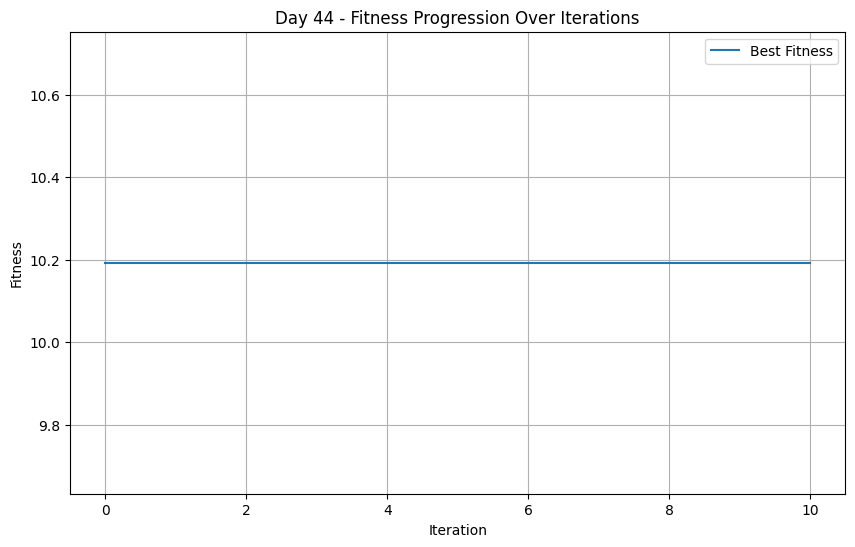

Appliance 0: Start Time = 22, Cost = 0.9999999858437042
Appliance 1: Start Time = 9, Cost = 0.8935173314925493
Appliance 2: Start Time = 20, Cost = 0.9997535561663053
Appliance 3: Start Time = 17, Cost = 1.0
Appliance 4: Start Time = 20, Cost = 0.8005288597992837
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 3, Cost = 0.995568151588062
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 8, Cost = 0.8790146377404283
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 44 Schedule =====
Appliance 1: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 9, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0

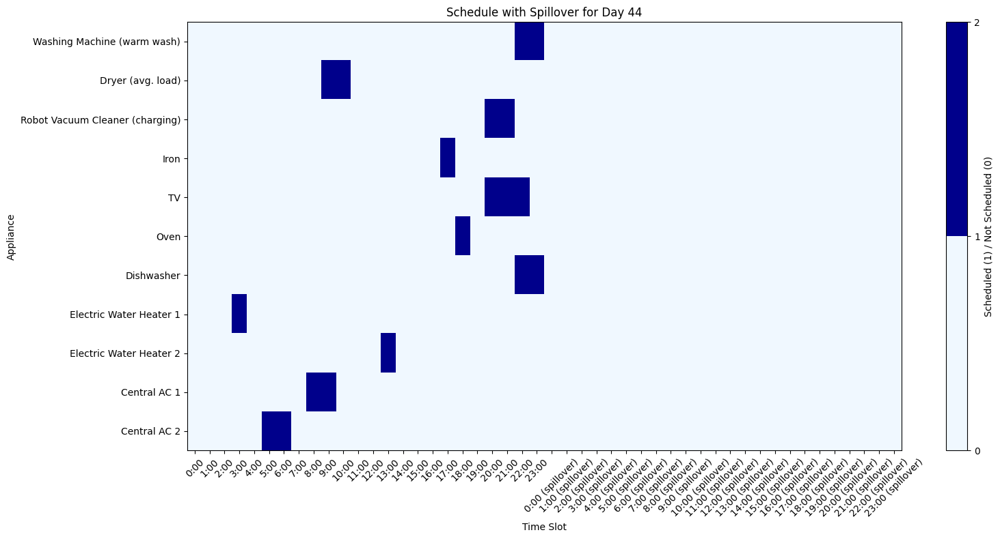

Best Fitness: 10.192744888688226
Updated Fitness: 10.192744888688226

===== Hourly Breakdown for Day 44 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              80.62
 1     0.00              0.00              80.62
 2     0.00              0.00              80.62
 3     0.00              0.70              79.92
 4     0.00              0.00              79.92
 5     0.00              3.00              76.92
 6     1.79              3.00              75.71
 7     4.43              0.00              80.13
 8     4.86              3.00              81.99
 9     5.34              6.00              81.33
10     5.66              3.00              84.00
11     5.71              0.00              89.71
12     5.81              0.00              95.52
13     4.96              0.70              99.78
14     4.11              0.00              100.00
15     3.33              0

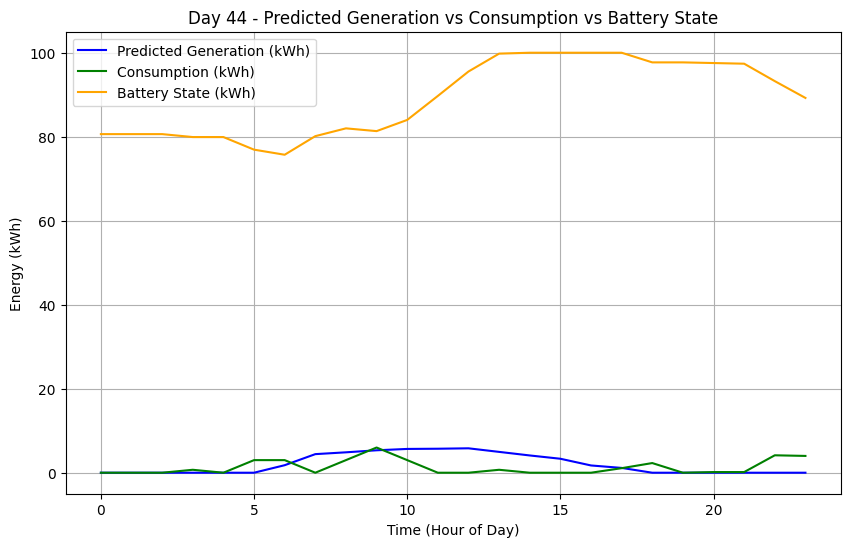

Simulating Day 45
[✔️] Appliance 0 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 8 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 13 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

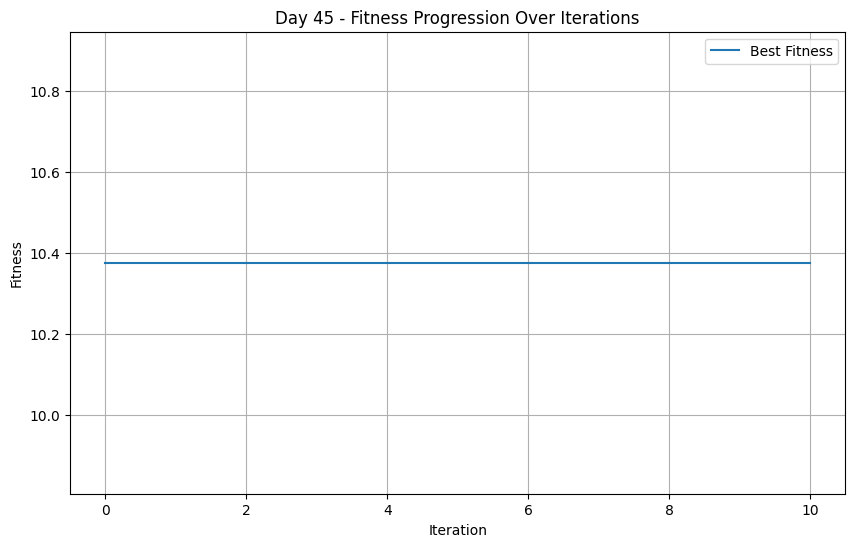

Appliance 0: Start Time = 6, Cost = 0.8742055907690023
Appliance 1: Start Time = 8, Cost = 0.8742055907690023
Appliance 2: Start Time = 0, Cost = 0.9333550794216401
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 1, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 19, Cost = 1.0
Appliance 8: Start Time = 23, Cost = 0.9999999939241172
Appliance 9: Start Time = 15, Cost = 0.9999920081294466
Appliance 10: Start Time = 13, Cost = 0.9912358497532158
===== Optimized Day 45 Schedule =====
Appliance 1: Start Time 6, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 8, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Ap

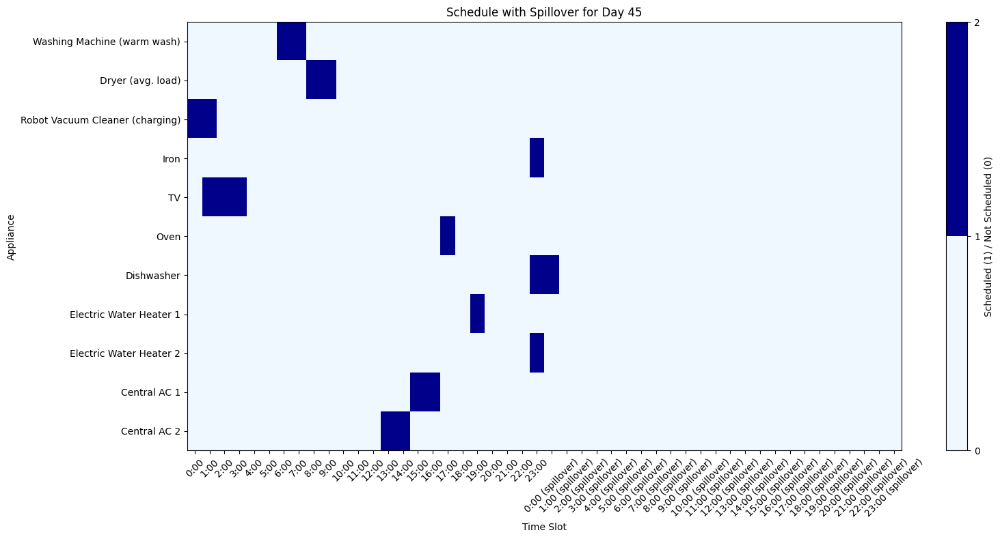

Best Fitness: 10.375976087124702
Updated Fitness: 10.375976087124702

===== Hourly Breakdown for Day 45 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.01              89.23
 1     0.00              0.16              89.07
 2     0.00              0.15              88.92
 3     0.00              0.15              88.77
 4     0.00              0.00              88.77
 5     0.00              0.00              88.77
 6     2.02              2.00              88.79
 7     4.21              2.00              91.00
 8     5.45              3.00              93.45
 9     5.74              3.00              96.19
10     6.11              0.00              100.00
11     6.14              0.00              100.00
12     6.19              0.00              100.00
13     4.92              3.00              100.00
14     4.37              3.00              100.00
15     2.78           

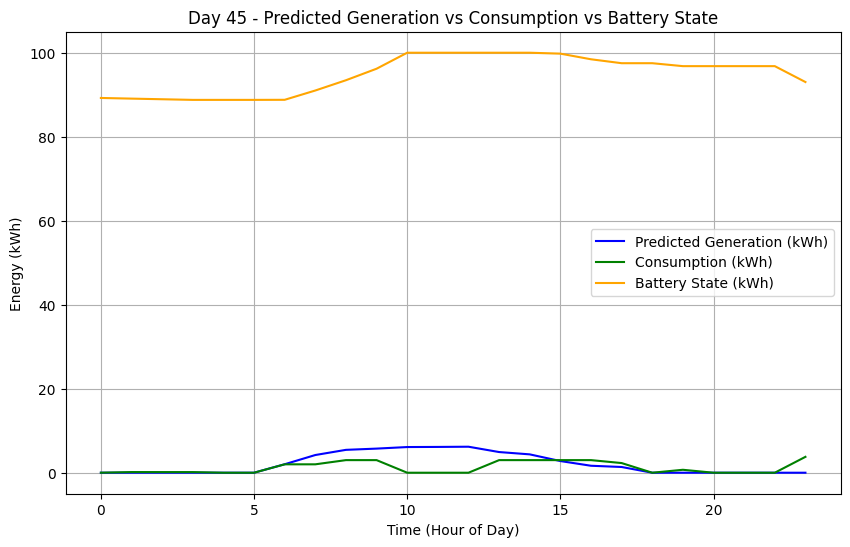

Simulating Day 46
[✔️] Appliance 0 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 21 (valid range: 0-23)
Initial_solution: [[0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

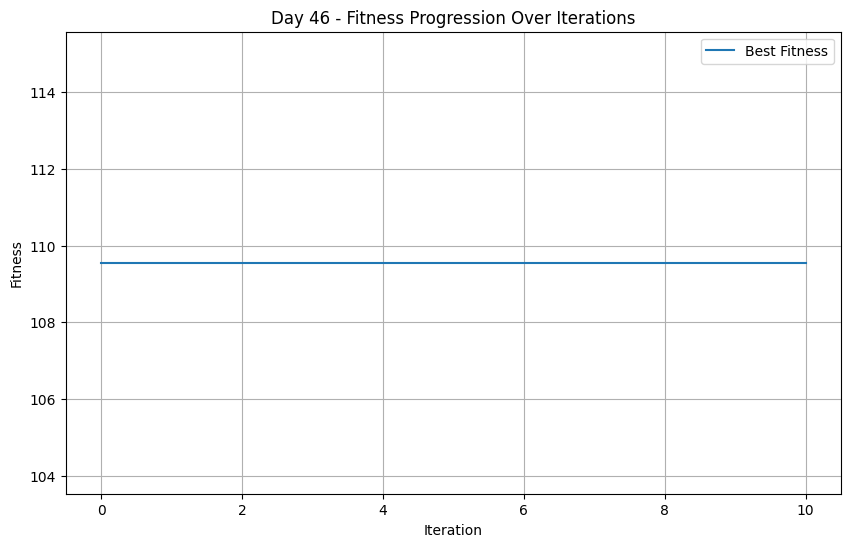

Appliance 0: Start Time = 3, Cost = 0.8935173314925493
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 6, Cost = 0.9333550794216401
Appliance 3: Start Time = 17, Cost = 1.0
Appliance 4: Start Time = 13, Cost = 0.9995636586524771
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 15, Cost = 1.0
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 21, Cost = 0.9999999999998783
Appliance 10: Start Time = 21, Cost = 0.9352412021670541
===== Optimized Day 46 Schedule =====
Appliance 1: Start Time 3, Duration 2
Time Slots (first 24): [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

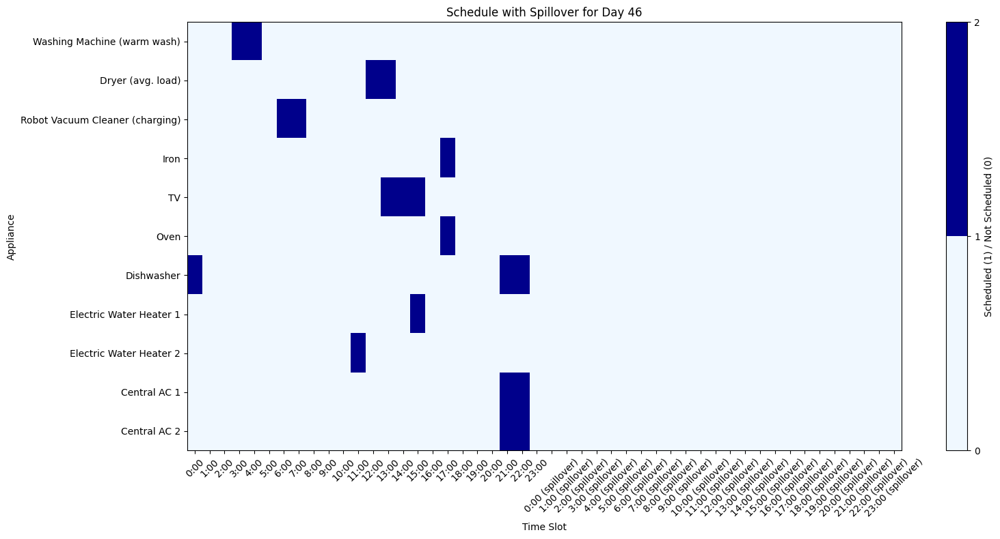

Best Fitness: 109.5524855560113
Updated Fitness: 109.5524855560113

===== Hourly Breakdown for Day 46 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              91.02
 1     0.00              0.00              91.02
 2     0.00              0.00              91.02
 3     0.00              2.00              89.02
 4     0.00              2.00              87.02
 5     0.00              0.00              87.02
 6     1.07              0.01              88.08
 7     2.56              0.01              90.63
 8     3.63              0.00              94.27
 9     4.21              0.00              98.48
10     4.86              0.00              100.00
11     4.68              0.70              100.00
12     5.11              3.00              100.00
13     4.67              3.15              100.00
14     4.48              0.15              100.00
15     3.38             

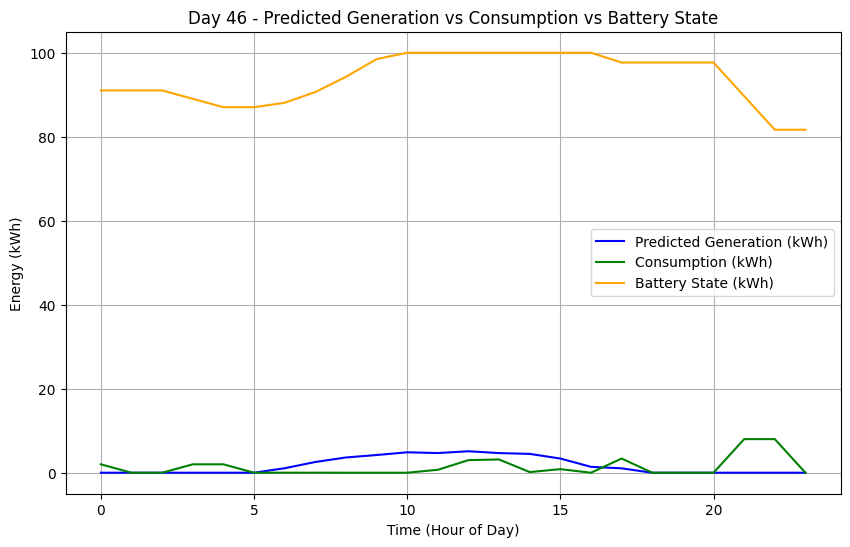

Simulating Day 47
[✔️] Appliance 0 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 9 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 15 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

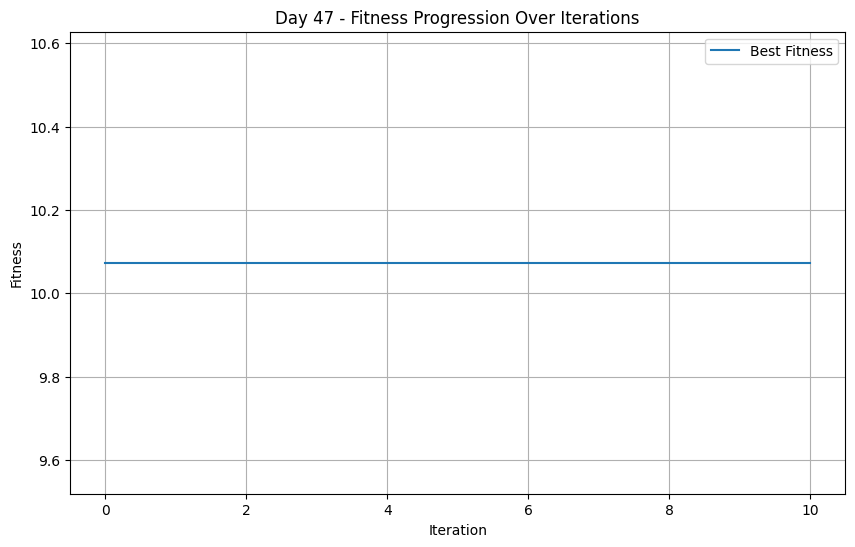

Appliance 0: Start Time = 22, Cost = 0.9999999858437042
Appliance 1: Start Time = 9, Cost = 0.8935173314925493
Appliance 2: Start Time = 23, Cost = 0.999973233954847
Appliance 3: Start Time = 5, Cost = 0.995568151588062
Appliance 4: Start Time = 9, Cost = 0.9999999461511998
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 6, Cost = 0.6010577195985674
Appliance 8: Start Time = 8, Cost = 1.0
Appliance 9: Start Time = 16, Cost = 0.9999992566402426
Appliance 10: Start Time = 15, Cost = 0.9352412021670541
===== Optimized Day 47 Schedule =====
Appliance 1: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 9, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0

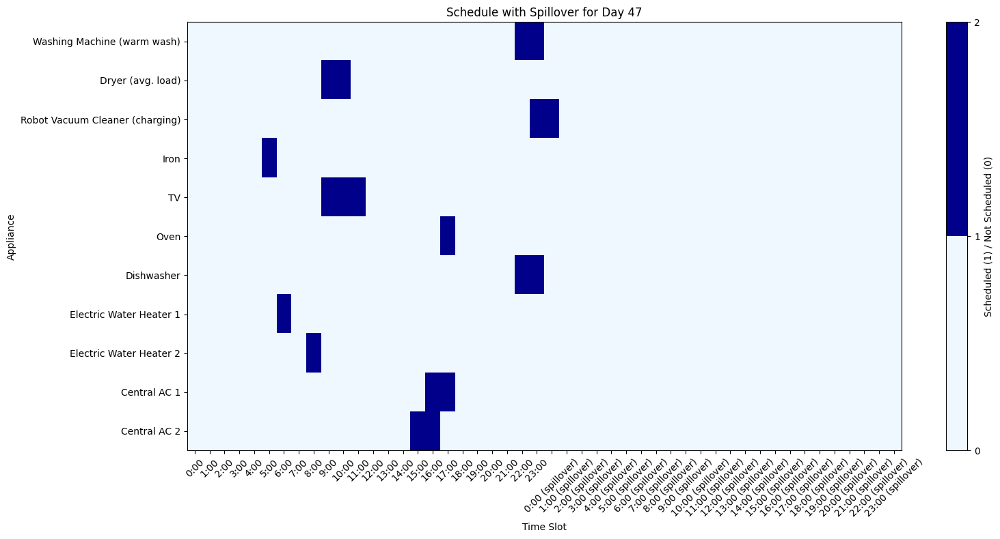

Best Fitness: 10.073291500671928
Updated Fitness: 10.073291500671928

===== Hourly Breakdown for Day 47 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              81.66
 1     0.00              0.00              81.66
 2     0.00              0.00              81.66
 3     0.00              0.00              81.66
 4     0.00              0.00              81.66
 5     0.00              1.08              80.58
 6     1.46              0.70              81.35
 7     2.98              0.00              84.33
 8     3.55              0.70              87.18
 9     3.96              3.15              87.99
10     4.11              3.15              88.95
11     4.81              0.15              93.61
12     4.46              0.00              98.07
13     4.25              0.00              100.00
14     4.69              0.00              100.00
15     3.14              

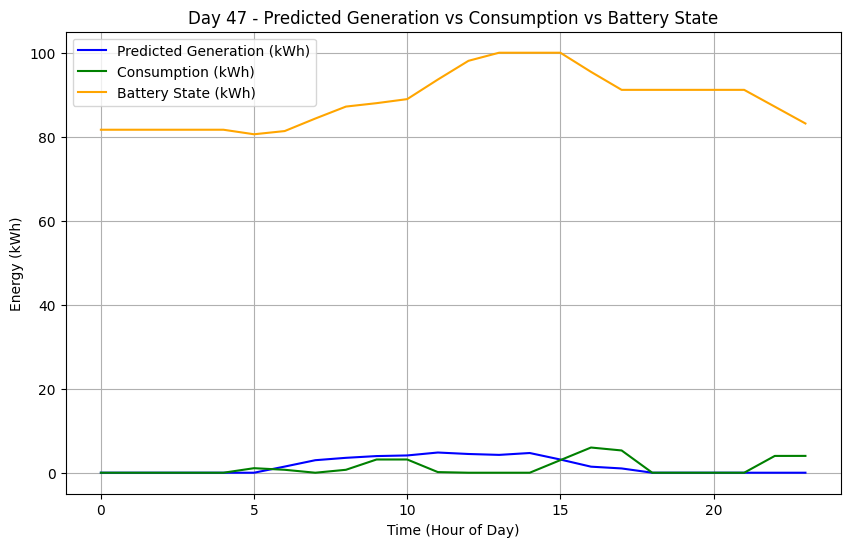

Simulating Day 48
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 11 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 5 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

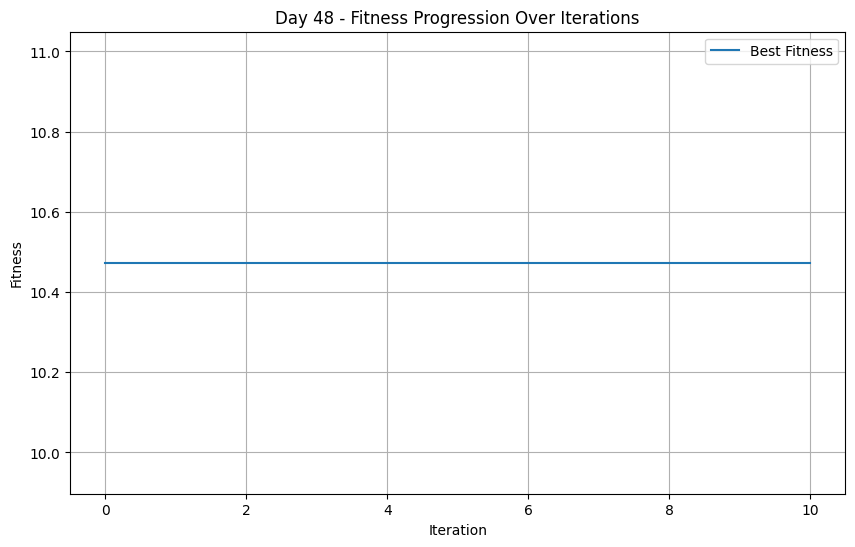

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 11, Cost = 0.9453299751080021
Appliance 2: Start Time = 0, Cost = 0.9333550794216401
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 12, Cost = 0.9999330848871175
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 11, Cost = 0.9999985132804853
Appliance 8: Start Time = 14, Cost = 0.995568151588062
Appliance 9: Start Time = 12, Cost = 0.997784075794031
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 48 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

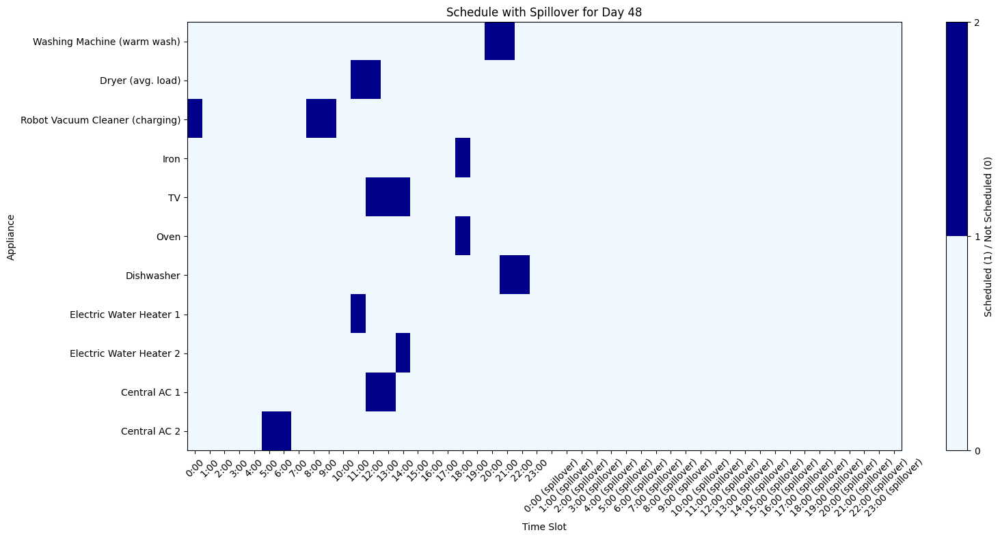

Best Fitness: 10.473026103971259
Updated Fitness: 10.473026103971259

===== Hourly Breakdown for Day 48 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.01              83.15
 1     0.00              0.00              83.15
 2     0.00              0.00              83.15
 3     0.00              0.00              83.15
 4     0.00              0.00              83.15
 5     0.00              3.00              80.15
 6     1.55              3.00              78.69
 7     3.40              0.00              82.10
 8     4.78              0.01              86.86
 9     5.15              0.01              92.00
10     4.13              0.00              96.13
11     5.49              3.70              97.92
12     4.72              6.15              96.48
13     3.74              3.15              97.07
14     5.19              0.85              100.00
15     3.48              0

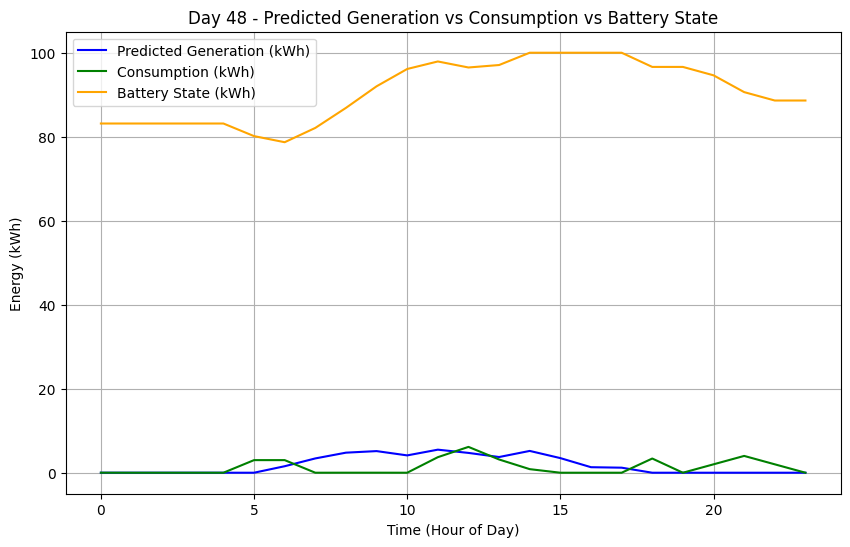

Simulating Day 49
[✔️] Appliance 0 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 14 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 7 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

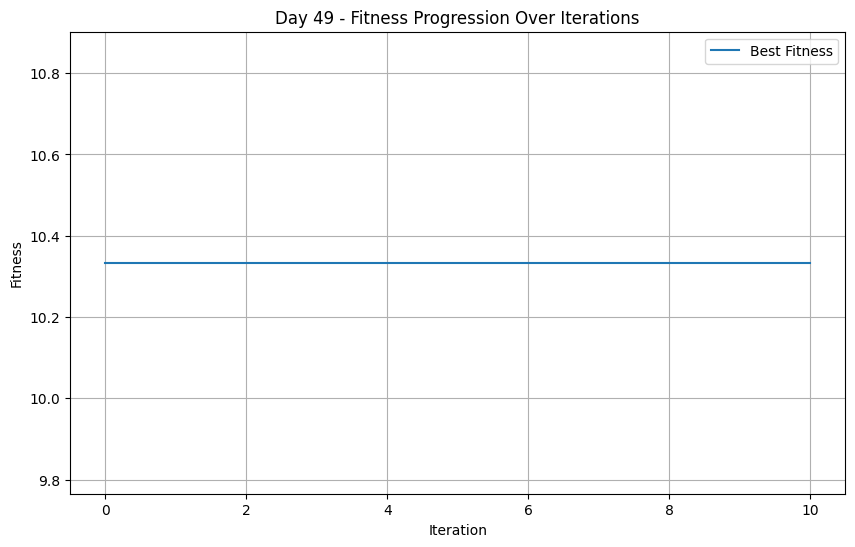

Appliance 0: Start Time = 7, Cost = 0.8935173314925493
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 4, Cost = 0.9217914612049088
Appliance 3: Start Time = 15, Cost = 0.9999999999908653
Appliance 4: Start Time = 21, Cost = 0.8239673366178503
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 20, Cost = 1.0
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 16, Cost = 0.9999992566402426
Appliance 10: Start Time = 7, Cost = 0.9999999461511998
===== Optimized Day 49 Schedule =====
Appliance 1: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

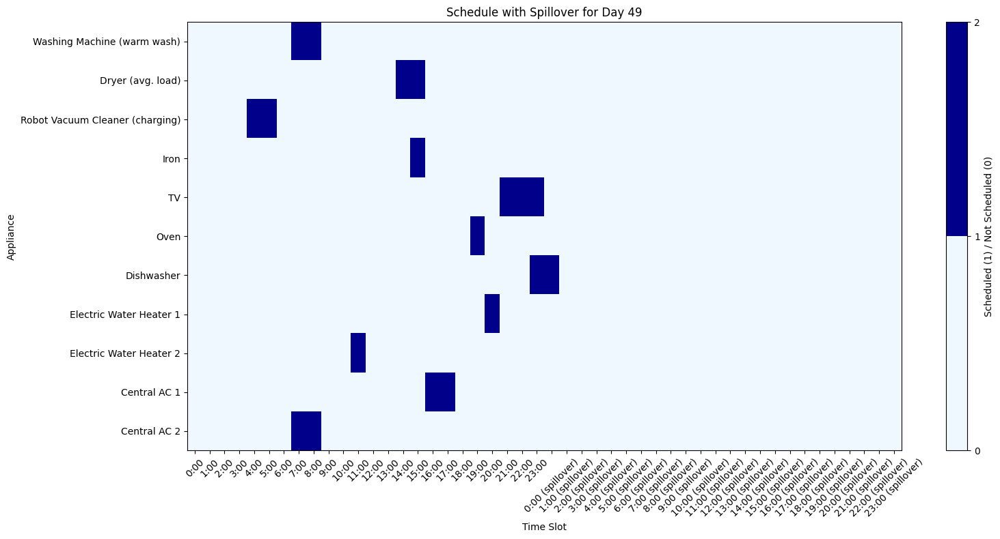

Best Fitness: 10.333516670682108
Updated Fitness: 10.333516670682108

===== Hourly Breakdown for Day 49 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              88.62
 1     0.00              0.00              88.62
 2     0.00              0.00              88.62
 3     0.00              0.00              88.62
 4     0.00              0.01              88.61
 5     0.00              0.01              88.61
 6     2.84              0.00              91.45
 7     4.88              5.00              91.33
 8     5.62              5.00              91.95
 9     5.80              0.00              97.75
10     5.35              0.00              100.00
11     5.83              0.70              100.00
12     5.70              0.00              100.00
13     4.53              0.00              100.00
14     4.77              3.00              100.00
15     3.84           

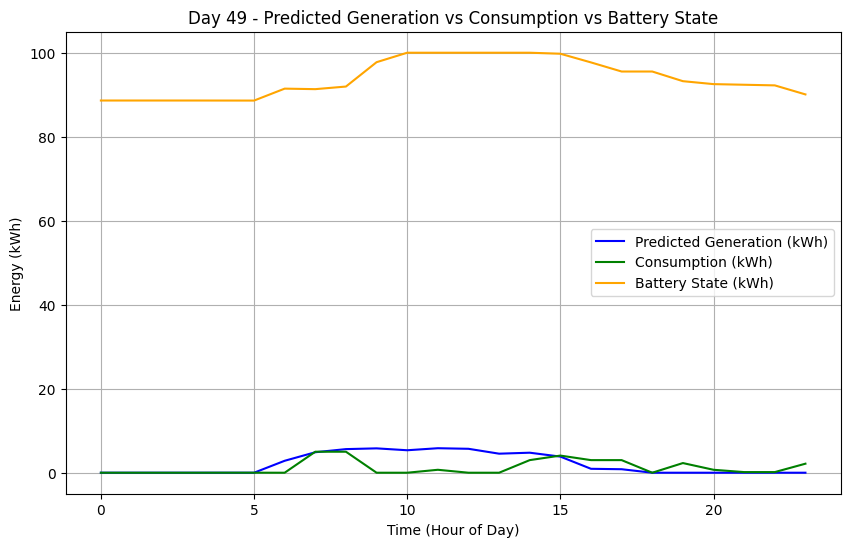

Simulating Day 50
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 19 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 19 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

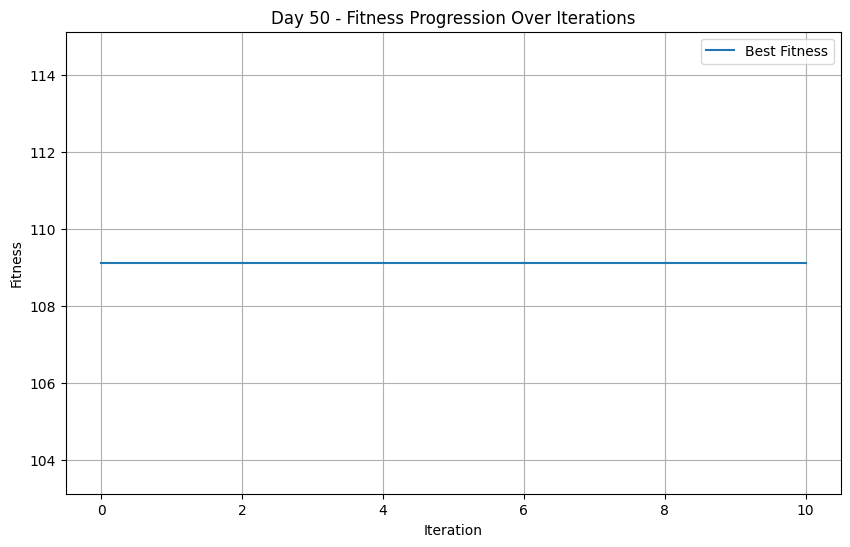

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 19, Cost = 0.9999553899247451
Appliance 2: Start Time = 14, Cost = 0.9929050814307537
Appliance 3: Start Time = 1, Cost = 0.9999999999908653
Appliance 4: Start Time = 16, Cost = 0.9730045167434059
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 7, Cost = 0.7580292754808566
Appliance 8: Start Time = 16, Cost = 0.7580292754808566
Appliance 9: Start Time = 15, Cost = 0.9999920081294466
Appliance 10: Start Time = 19, Cost = 0.8239673366178503
===== Optimized Day 50 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 19, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0

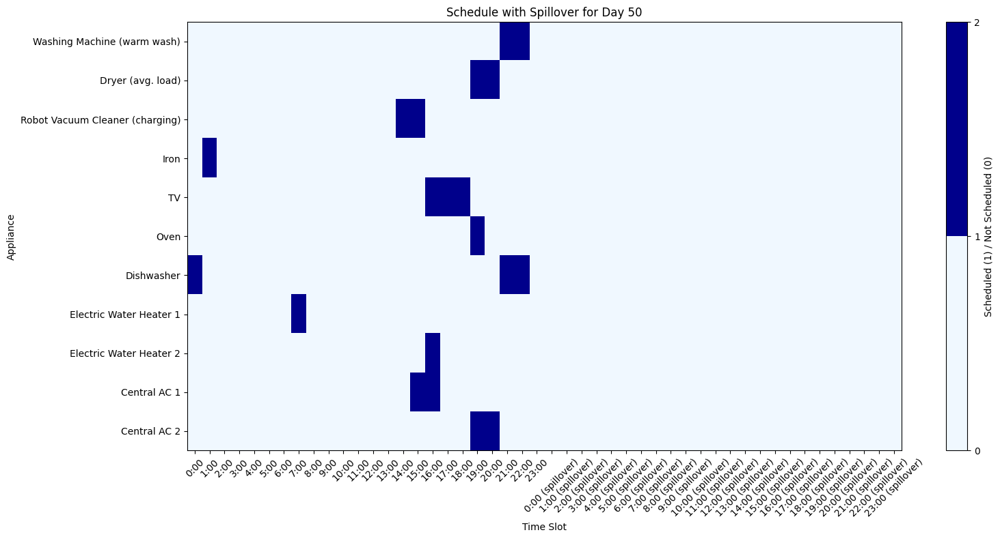

Best Fitness: 109.12985013187324
Updated Fitness: 109.12985013187324

===== Hourly Breakdown for Day 50 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              88.07
 1     0.00              1.08              86.99
 2     0.00              0.00              86.99
 3     0.00              0.00              86.99
 4     0.00              0.00              86.99
 5     0.00              0.00              86.99
 6     3.15              0.00              90.14
 7     4.86              0.70              94.30
 8     5.53              0.00              99.83
 9     5.76              0.00              100.00
10     5.80              0.00              100.00
11     5.79              0.00              100.00
12     5.64              0.00              100.00
13     5.57              0.00              100.00
14     5.05              0.01              100.00
15     3.84          

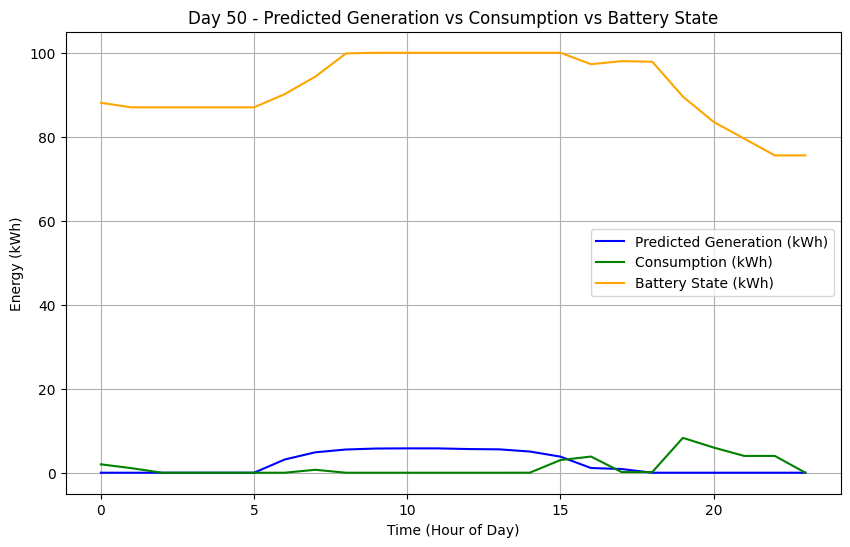

Simulating Day 51
[✔️] Appliance 0 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 23 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

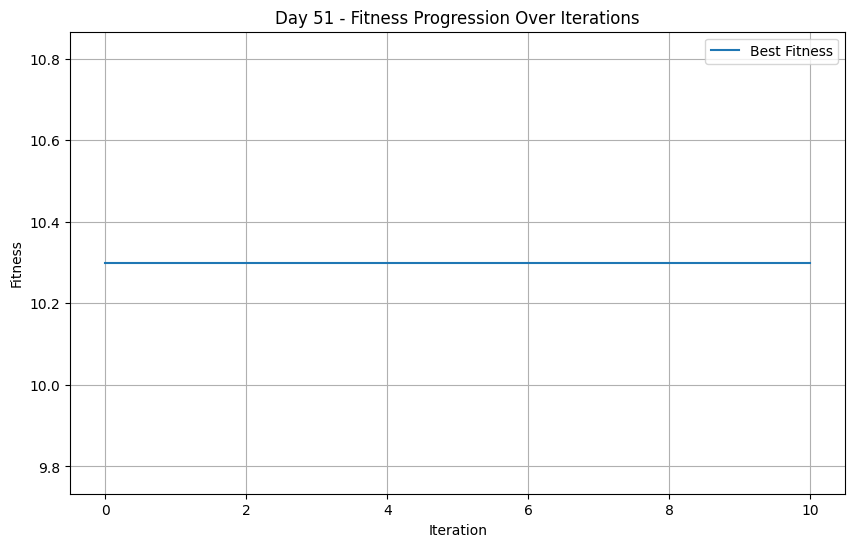

Appliance 0: Start Time = 12, Cost = 0.9912593703020969
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 17, Cost = 0.998416909683404
Appliance 3: Start Time = 10, Cost = 0.946009033486812
Appliance 4: Start Time = 6, Cost = 0.9999999999954327
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 7, Cost = 0.7580292754808566
Appliance 8: Start Time = 4, Cost = 1.0
Appliance 9: Start Time = 20, Cost = 0.9999999999954327
Appliance 10: Start Time = 23, Cost = 0.9912358497532158
===== Optimized Day 51 Schedule =====
Appliance 1: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 

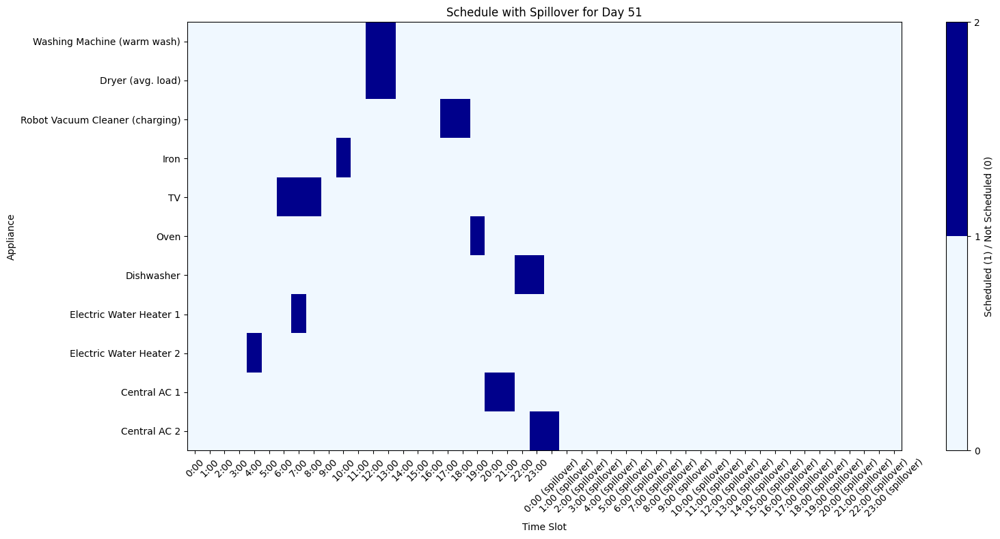

Best Fitness: 10.2997260656687
Updated Fitness: 10.2997260656687

===== Hourly Breakdown for Day 51 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              75.55
 1     0.00              0.00              75.55
 2     0.00              0.00              75.55
 3     0.00              0.00              75.55
 4     0.00              0.70              74.85
 5     0.00              0.00              74.85
 6     2.42              0.15              77.12
 7     5.18              0.85              81.45
 8     5.55              0.15              86.85
 9     5.87              0.00              92.72
10     5.69              1.08              97.33
11     5.36              0.00              100.00
12     5.36              5.00              100.00
13     4.74              5.00              99.74
14     4.14              0.00              100.00
15     3.43              0.0

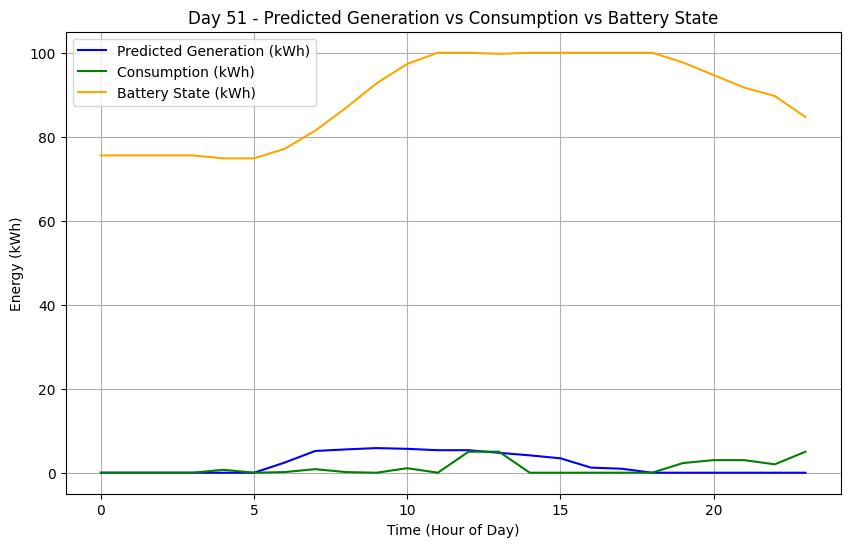

Simulating Day 52
[✔️] Appliance 0 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 7 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 17 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

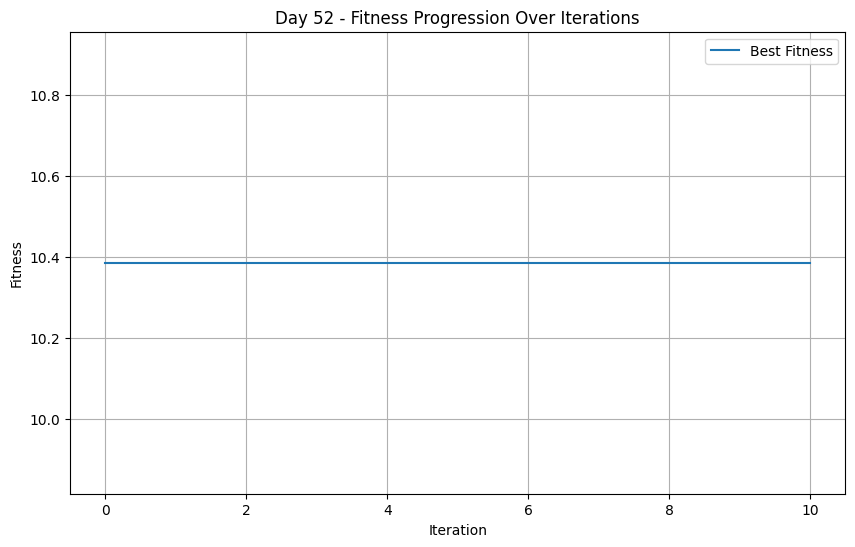

Appliance 0: Start Time = 11, Cost = 0.9820030111622706
Appliance 1: Start Time = 7, Cost = 0.8670192398661891
Appliance 2: Start Time = 2, Cost = 0.9217914612049088
Appliance 3: Start Time = 1, Cost = 0.9999999999908653
Appliance 4: Start Time = 4, Cost = 0.9999999999999974
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 12, Cost = 0.9999999939241172
Appliance 8: Start Time = 12, Cost = 0.9999985132804853
Appliance 9: Start Time = 3, Cost = 0.9352412021670541
Appliance 10: Start Time = 0, Cost = 1.0
===== Optimized Day 52 Schedule =====
Appliance 1: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 

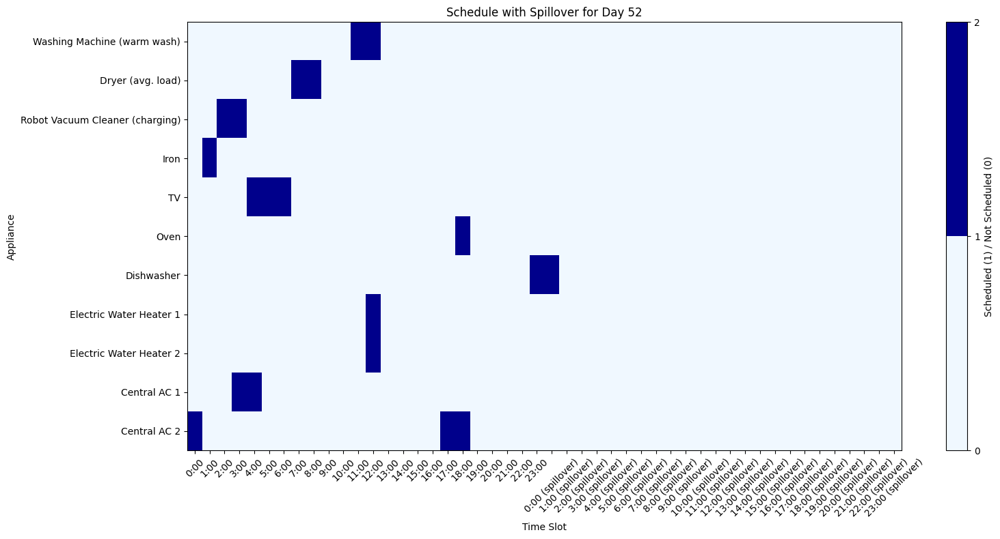

Best Fitness: 10.3855969191356
Updated Fitness: 10.3855969191356

===== Hourly Breakdown for Day 52 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              81.69
 1     0.00              1.08              80.61
 2     0.00              0.01              80.61
 3     0.00              3.01              77.60
 4     0.00              3.15              74.45
 5     0.00              0.15              74.30
 6     1.59              0.15              75.74
 7     3.90              3.00              76.64
 8     4.70              3.00              78.34
 9     5.03              0.00              83.37
10     4.97              0.00              88.34
11     4.57              2.00              90.91
12     4.01              3.40              91.51
13     3.83              0.00              95.34
14     4.40              0.00              99.74
15     3.35              0.00  

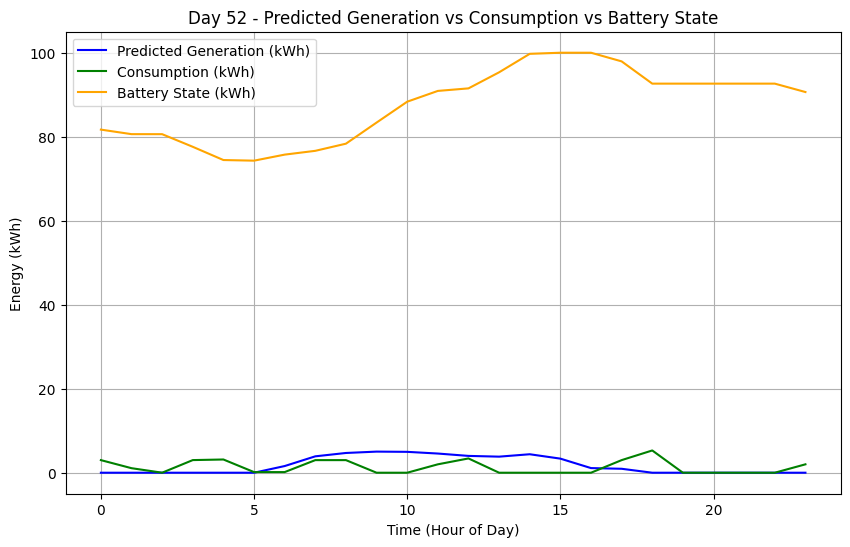

Simulating Day 53
[✔️] Appliance 0 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 12 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  

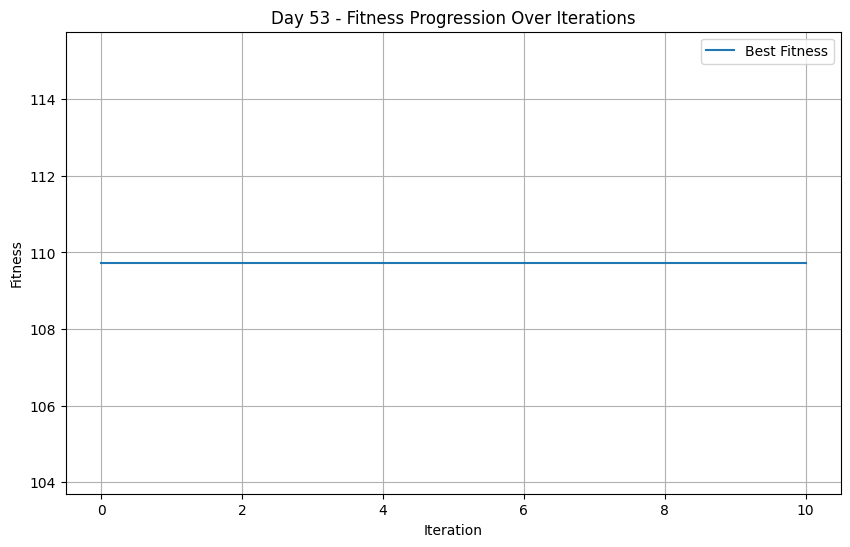

Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 16, Cost = 0.9985227171960207
Appliance 2: Start Time = 14, Cost = 0.9929050814307537
Appliance 3: Start Time = 10, Cost = 0.946009033486812
Appliance 4: Start Time = 8, Cost = 0.9999999969620585
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 20, Cost = 0.9999999999954327
Appliance 10: Start Time = 12, Cost = 0.997784075794031
===== Optimized Day 53 Schedule =====
Appliance 1: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

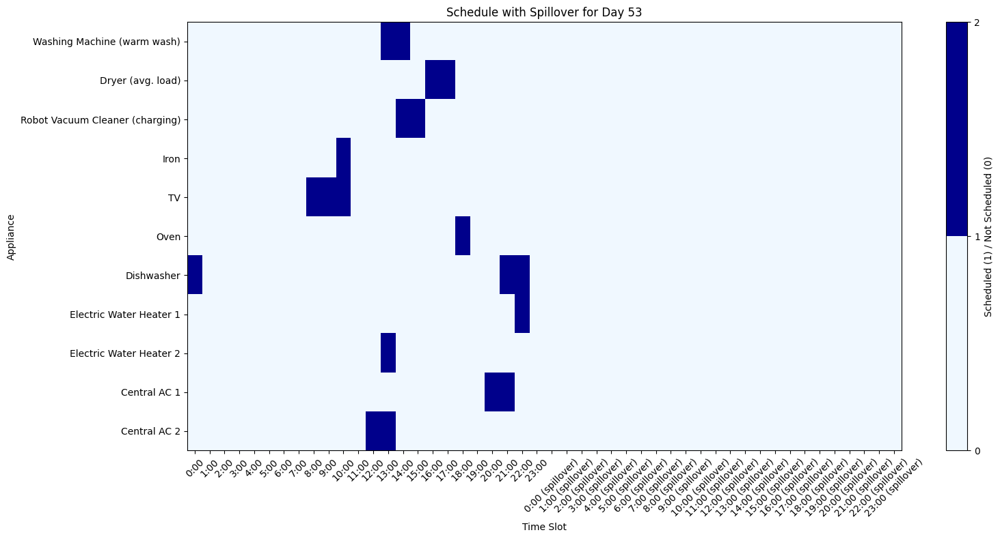

Best Fitness: 109.7318172724307
Updated Fitness: 109.7318172724307

===== Hourly Breakdown for Day 53 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              88.64
 1     0.00              0.00              88.64
 2     0.00              0.00              88.64
 3     0.00              0.00              88.64
 4     0.00              0.00              88.64
 5     0.00              0.00              88.64
 6     1.70              0.00              90.34
 7     5.02              0.00              95.36
 8     5.50              0.15              100.00
 9     5.93              0.15              100.00
10     5.06              1.23              100.00
11     5.44              0.00              100.00
12     4.71              3.00              100.00
13     3.33              5.70              97.63
14     2.92              2.01              98.54
15     2.35             

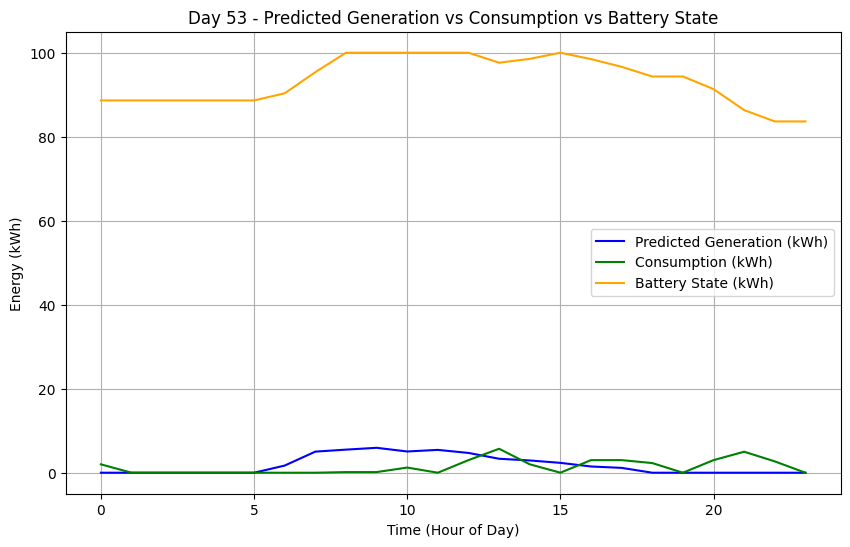

Simulating Day 54
[✔️] Appliance 0 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 22 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 5 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

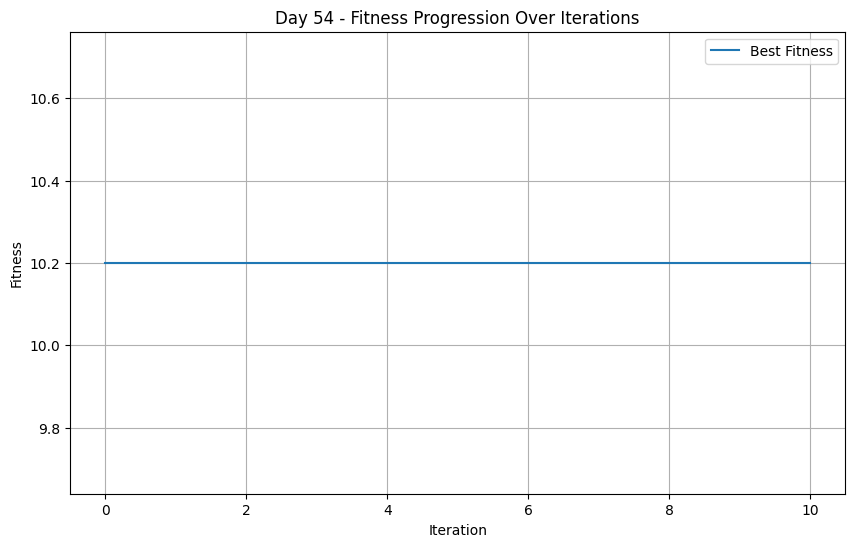

Appliance 0: Start Time = 7, Cost = 0.8935173314925493
Appliance 1: Start Time = 22, Cost = 0.9999995044268284
Appliance 2: Start Time = 13, Cost = 0.9892018066973624
Appliance 3: Start Time = 16, Cost = 0.9999999999999949
Appliance 4: Start Time = 23, Cost = 0.9352412021670541
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 7, Cost = 0.7580292754808566
Appliance 8: Start Time = 23, Cost = 0.9999999939241172
Appliance 9: Start Time = 21, Cost = 0.9999999999998783
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 54 Schedule =====
Appliance 1: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 

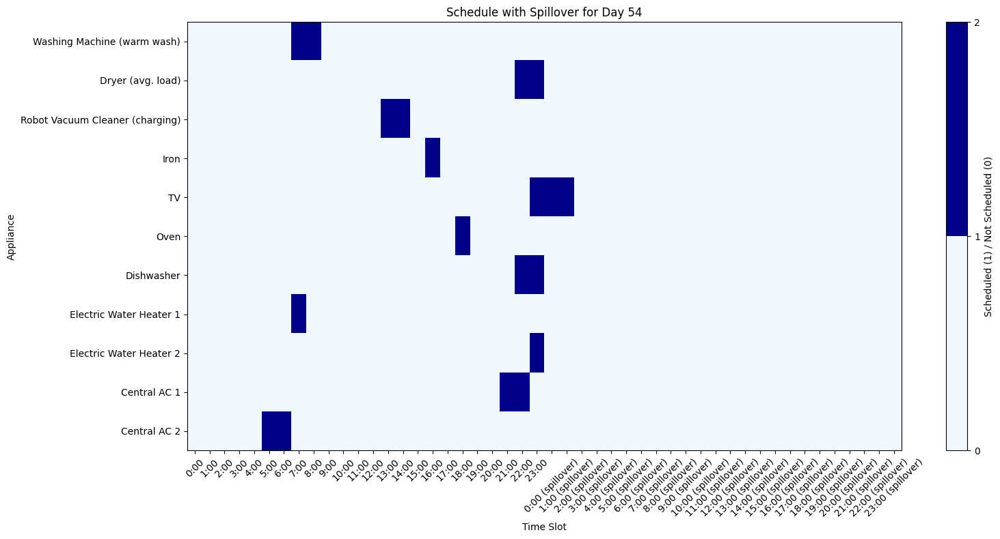

Best Fitness: 10.200485310472297
Updated Fitness: 10.200485310472297

===== Hourly Breakdown for Day 54 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              83.64
 1     0.00              0.00              83.64
 2     0.00              0.00              83.64
 3     0.00              0.00              83.64
 4     0.00              0.00              83.64
 5     0.00              3.00              80.64
 6     3.08              3.00              80.72
 7     4.79              2.70              82.81
 8     5.55              2.00              86.35
 9     5.78              0.00              92.13
10     5.88              0.00              98.00
11     5.99              0.00              100.00
12     5.92              0.00              100.00
13     5.70              0.01              100.00
14     5.06              0.01              100.00
15     3.98            

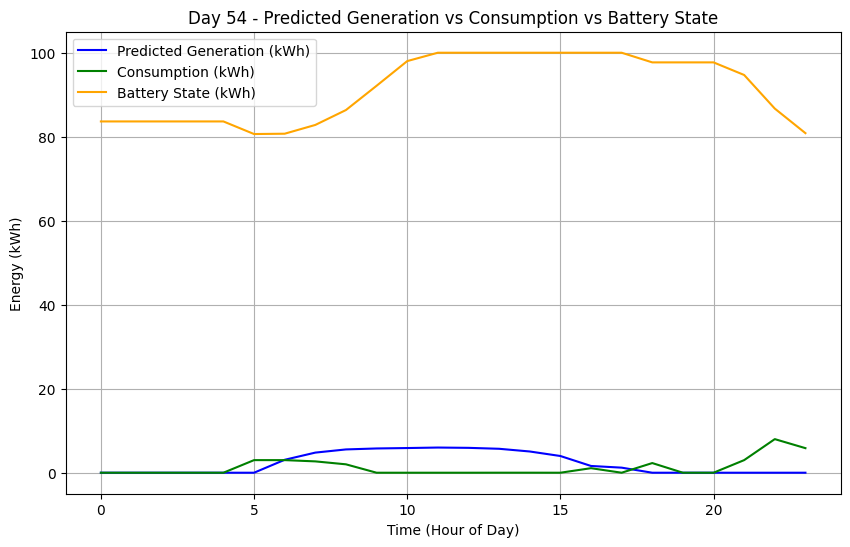

Simulating Day 55
[✔️] Appliance 0 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 21 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 3 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

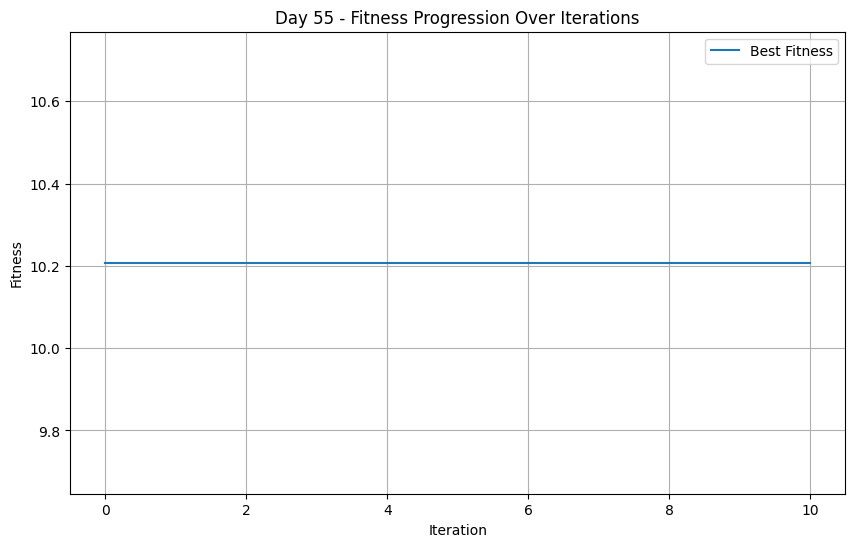

Appliance 0: Start Time = 6, Cost = 0.8742055907690023
Appliance 1: Start Time = 21, Cost = 0.9999975179847098
Appliance 2: Start Time = 1, Cost = 0.9263459719393353
Appliance 3: Start Time = 7, Cost = 0.7580292754808566
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 16, Cost = 1.0
Appliance 8: Start Time = 19, Cost = 0.946009033486812
Appliance 9: Start Time = 22, Cost = 0.9999999999999974
Appliance 10: Start Time = 3, Cost = 0.9999999999998783
===== Optimized Day 55 Schedule =====
Appliance 1: Start Time 6, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

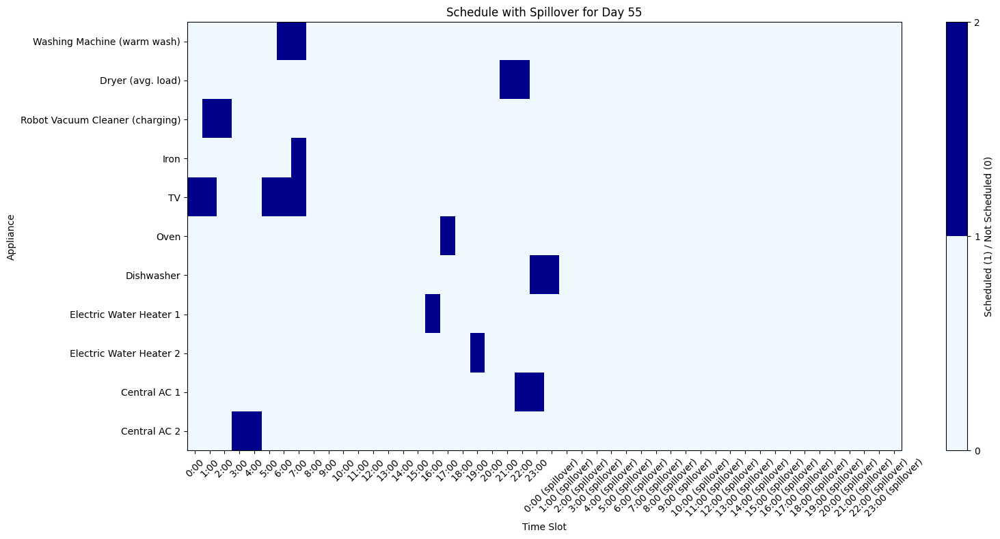

Best Fitness: 10.207569364018873
Updated Fitness: 10.207569364018873

===== Hourly Breakdown for Day 55 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              80.70
 1     0.00              0.16              80.54
 2     0.00              0.01              80.54
 3     0.00              3.00              77.54
 4     0.00              3.00              74.54
 5     0.00              0.15              74.39
 6     2.90              2.15              75.13
 7     4.77              3.23              76.67
 8     5.68              0.00              82.35
 9     5.72              0.00              88.07
10     5.99              0.00              94.07
11     6.05              0.00              100.00
12     6.03              0.00              100.00
13     5.40              0.00              100.00
14     4.75              0.00              100.00
15     3.49            

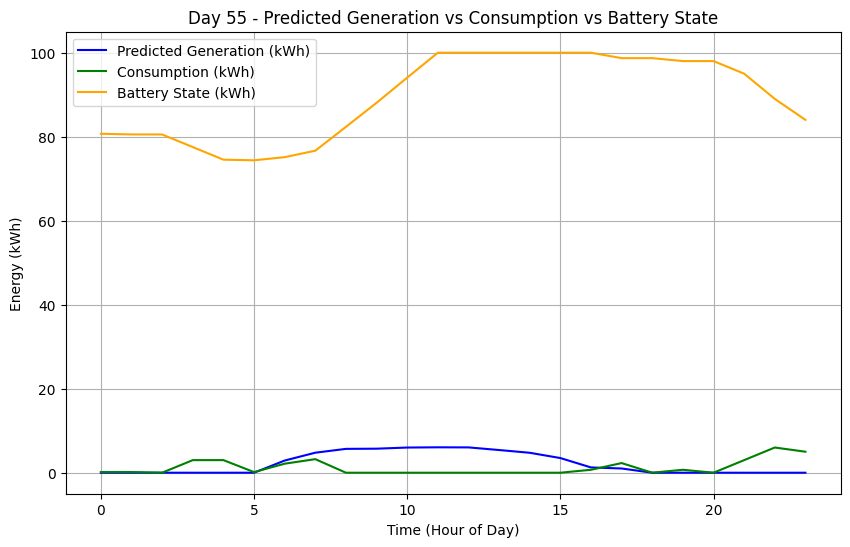

Simulating Day 56
[✔️] Appliance 0 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 7 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 20 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

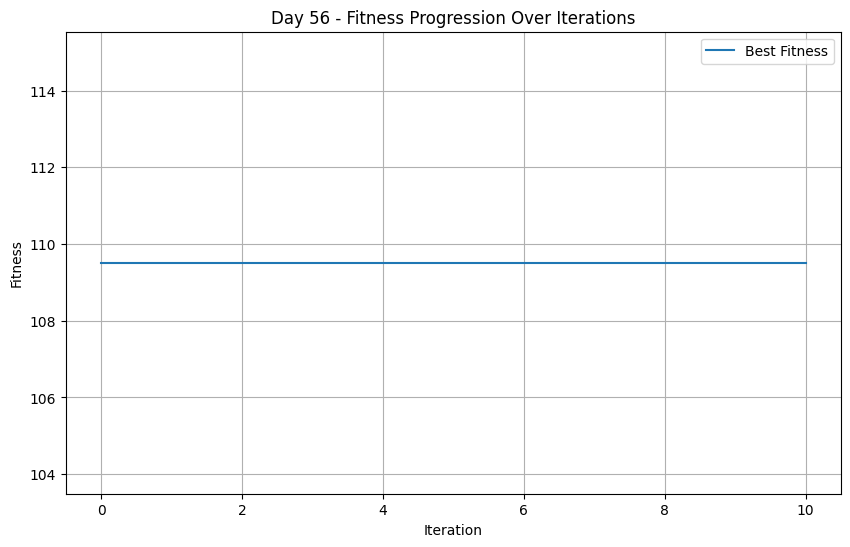

Appliance 0: Start Time = 19, Cost = 0.9999975179847098
Appliance 1: Start Time = 7, Cost = 0.8670192398661891
Appliance 2: Start Time = 7, Cost = 0.9420616894477034
Appliance 3: Start Time = 21, Cost = 1.0
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 6, Cost = 1.0
Appliance 9: Start Time = 20, Cost = 0.9999999999954327
Appliance 10: Start Time = 20, Cost = 0.8790146377404283
===== Optimized Day 56 Schedule =====
Appliance 1: Start Time 19, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 7, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: Start Time 7, Dur

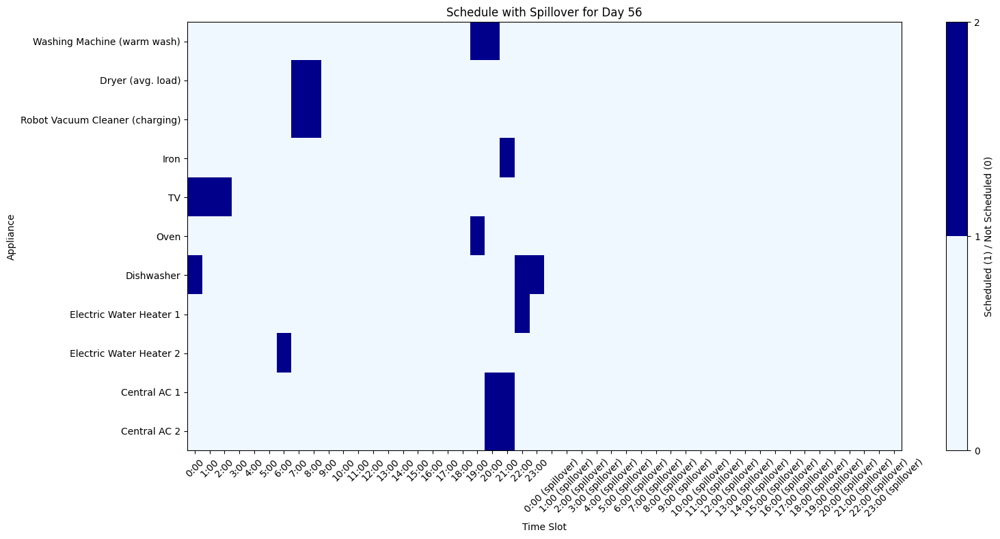

Best Fitness: 109.51206042165232
Updated Fitness: 109.51206042165232

===== Hourly Breakdown for Day 56 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.15              81.86
 1     0.00              0.15              81.71
 2     0.00              0.15              81.56
 3     0.00              0.00              81.56
 4     0.00              0.00              81.56
 5     0.00              0.00              81.56
 6     2.60              0.70              83.46
 7     4.97              3.01              85.42
 8     5.39              3.01              87.80
 9     5.64              0.00              93.44
10     5.66              0.00              99.10
11     5.78              0.00              100.00
12     5.50              0.00              100.00
13     4.96              0.00              100.00
14     2.67              0.00              100.00
15     2.12            

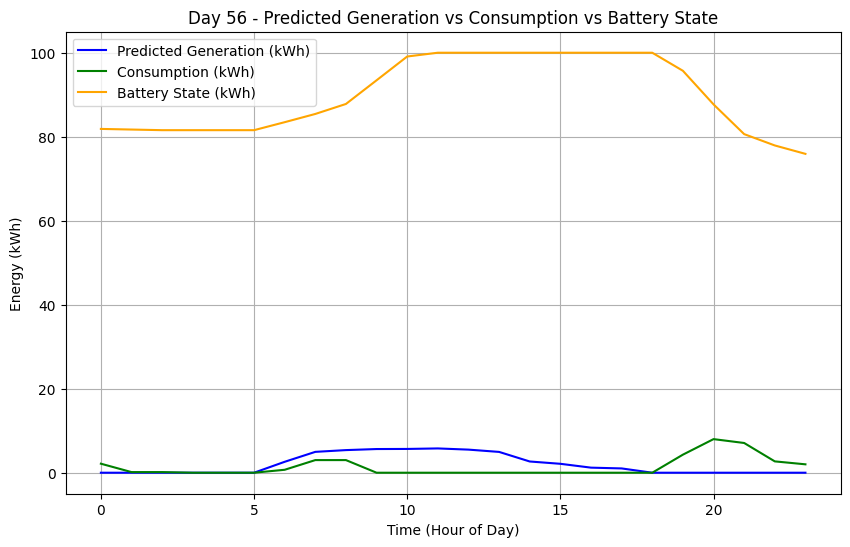

Simulating Day 57
[✔️] Appliance 0 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 17 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

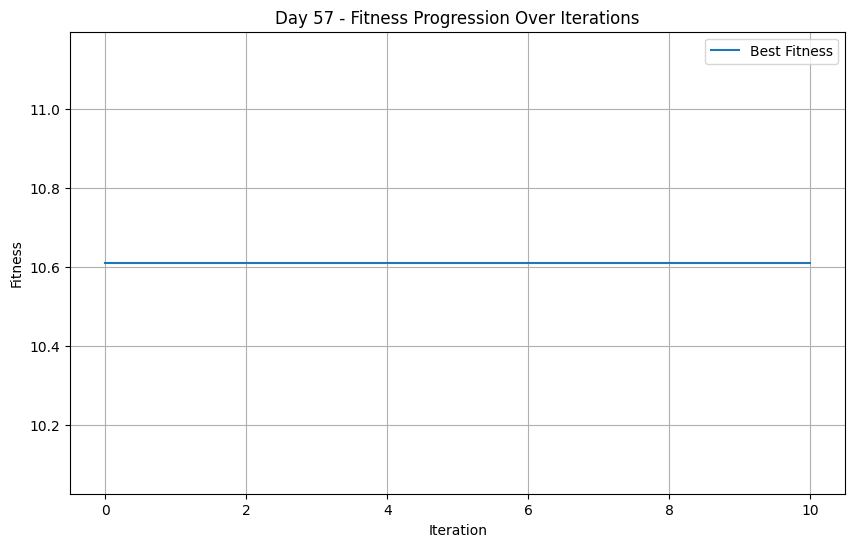

Appliance 0: Start Time = 17, Cost = 0.9999553899247451
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 13, Cost = 0.9892018066973624
Appliance 3: Start Time = 22, Cost = 1.0
Appliance 4: Start Time = 9, Cost = 0.9999999461511998
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 14, Cost = 0.9999999999999949
Appliance 8: Start Time = 13, Cost = 0.9998661697742351
Appliance 9: Start Time = 12, Cost = 0.997784075794031
Appliance 10: Start Time = 4, Cost = 0.9999999999954327
===== Optimized Day 57 Schedule =====
Appliance 1: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 

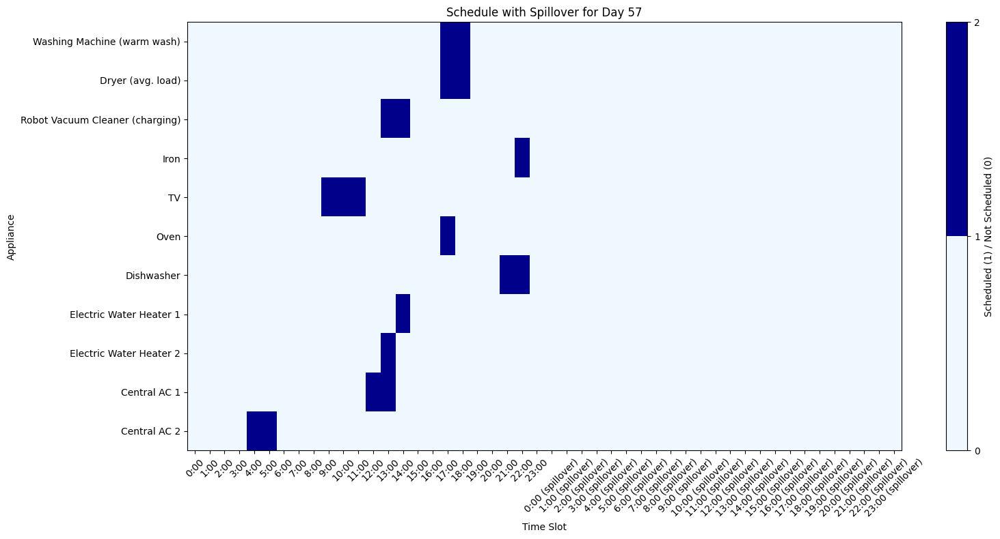

Best Fitness: 10.610789491755371
Updated Fitness: 10.610789491755371

===== Hourly Breakdown for Day 57 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              75.92
 1     0.00              0.00              75.92
 2     0.00              0.00              75.92
 3     0.00              0.00              75.92
 4     0.00              3.00              72.92
 5     0.00              3.00              69.92
 6     2.34              0.00              72.26
 7     4.18              0.00              76.44
 8     4.49              0.00              80.93
 9     4.47              0.15              85.26
10     5.16              0.15              90.26
11     4.71              0.15              94.83
12     5.37              3.00              97.20
13     3.14              3.71              96.63
14     3.03              0.71              98.95
15     1.91              0.

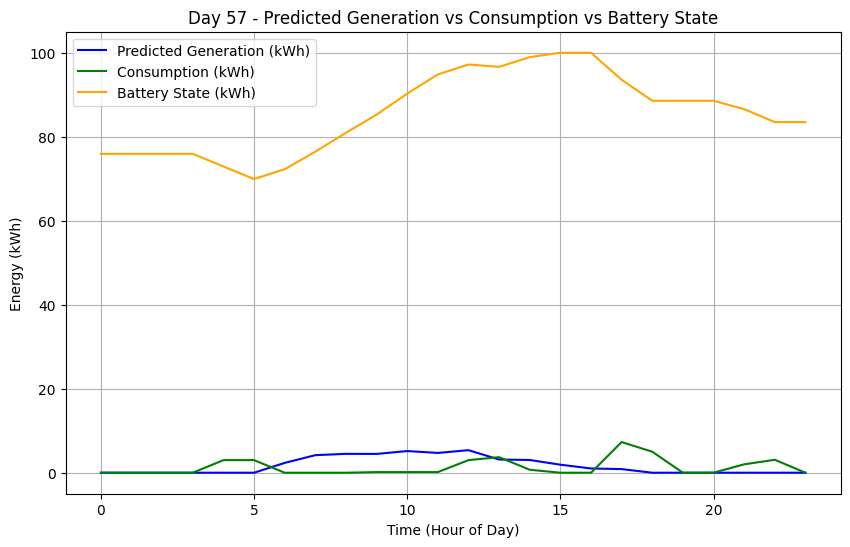

Simulating Day 58
[✔️] Appliance 0 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 14 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 5 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

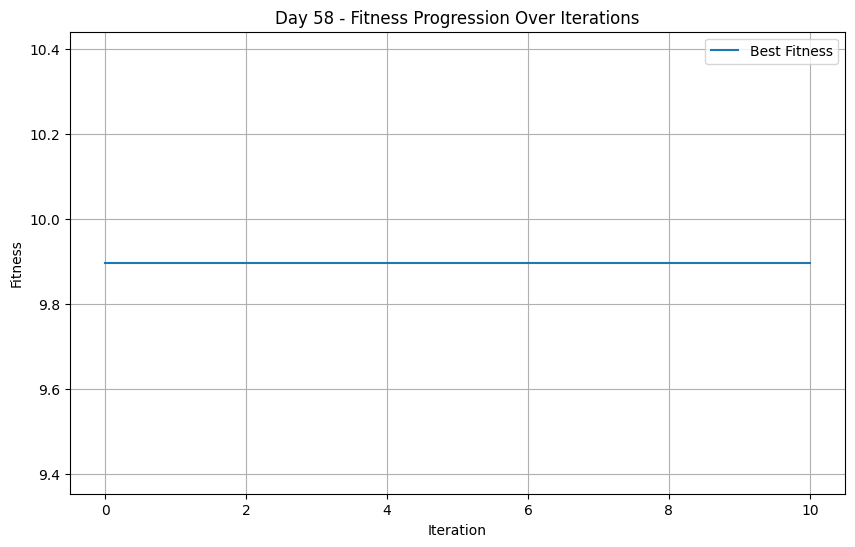

Appliance 0: Start Time = 11, Cost = 0.9820030111622706
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 14, Cost = 0.9929050814307537
Appliance 3: Start Time = 8, Cost = 0.6010577195985674
Appliance 4: Start Time = 21, Cost = 0.8239673366178503
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 23, Cost = 1.0
Appliance 8: Start Time = 19, Cost = 0.946009033486812
Appliance 9: Start Time = 9, Cost = 0.9352412021670541
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 58 Schedule =====
Appliance 1: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

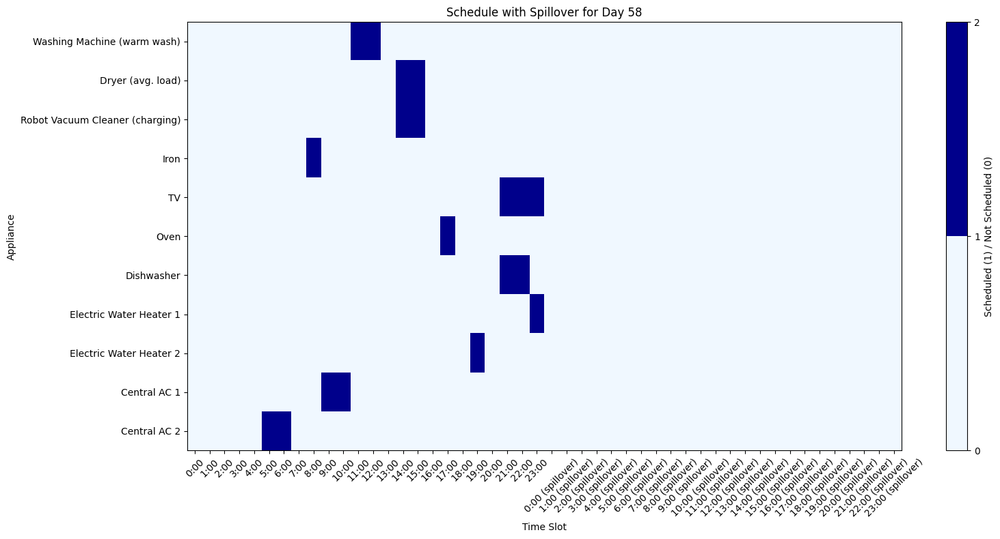

Best Fitness: 9.896938951049062
Updated Fitness: 9.896938951049062

===== Hourly Breakdown for Day 58 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              83.48
 1     0.00              0.00              83.48
 2     0.00              0.00              83.48
 3     0.00              0.00              83.48
 4     0.00              0.00              83.48
 5     0.00              3.00              80.48
 6     1.95              3.00              79.43
 7     3.84              0.00              83.27
 8     4.94              1.08              87.13
 9     4.95              3.00              89.07
10     4.31              3.00              90.38
11     4.08              2.00              92.46
12     4.82              2.00              95.28
13     4.44              0.00              99.72
14     4.58              3.01              100.00
15     3.07              3.0

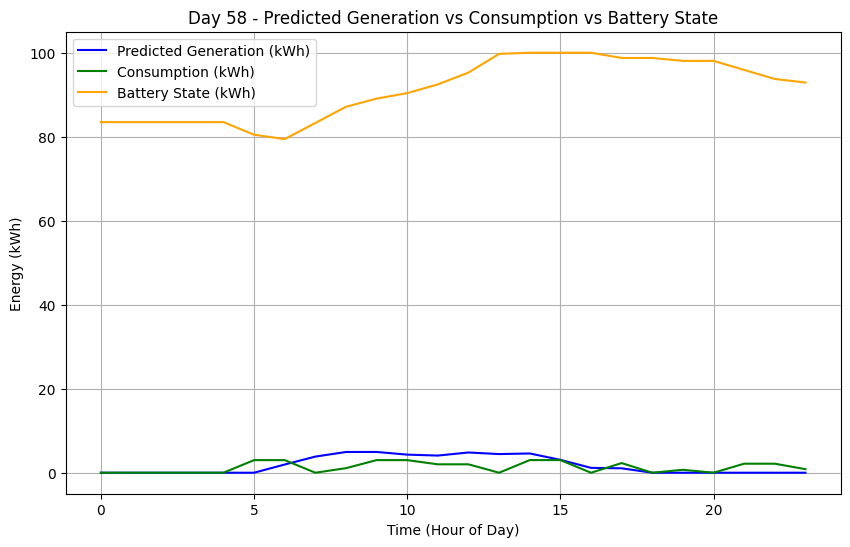

Simulating Day 59
[✔️] Appliance 0 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 17 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 16 (valid range: 0-23)
Initial_solution: [[0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  

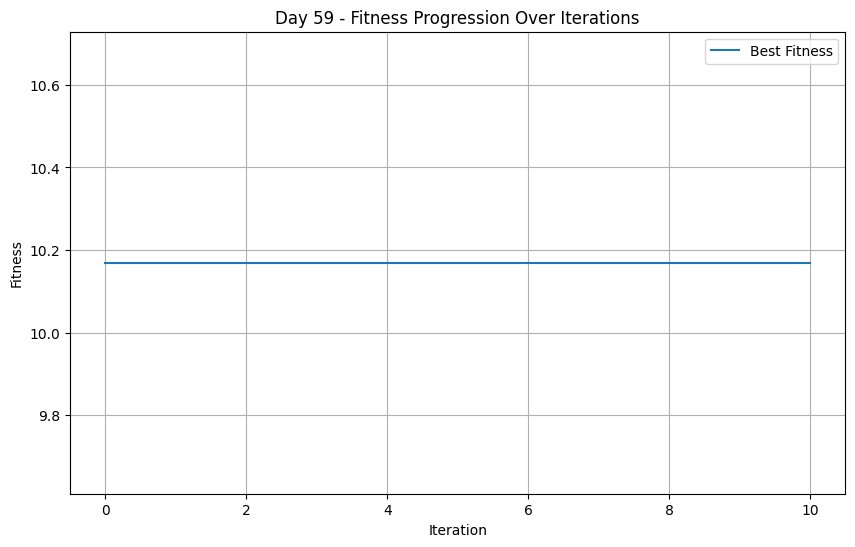

Appliance 0: Start Time = 2, Cost = 0.9193430918269522
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 13, Cost = 0.9892018066973624
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 12, Cost = 0.9999330848871175
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 14, Cost = 0.9999999999999949
Appliance 8: Start Time = 16, Cost = 0.7580292754808566
Appliance 9: Start Time = 14, Cost = 0.9999330848871175
Appliance 10: Start Time = 16, Cost = 0.8790146377404283
===== Optimized Day 59 Schedule =====
Appliance 1: Start Time 2, Duration 2
Time Slots (first 24): [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0

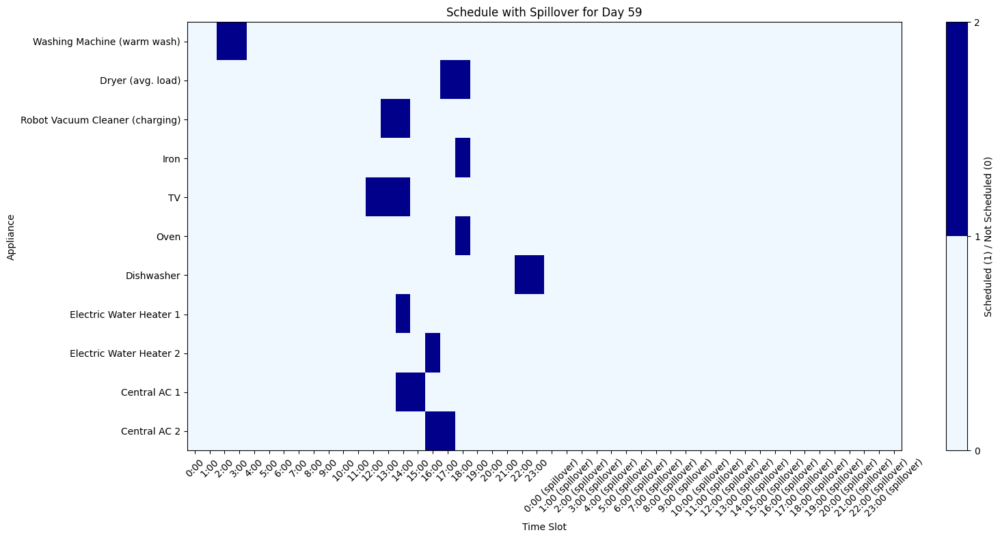

Best Fitness: 10.169437084938203
Updated Fitness: 10.169437084938203

===== Hourly Breakdown for Day 59 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              92.90
 1     0.00              0.00              92.90
 2     0.00              2.00              90.90
 3     0.00              2.00              88.90
 4     0.00              0.00              88.90
 5     0.00              0.00              88.90
 6     2.09              0.00              91.00
 7     5.24              0.00              96.24
 8     5.60              0.00              100.00
 9     5.72              0.00              100.00
10     5.28              0.00              100.00
11     5.64              0.00              100.00
12     5.64              0.15              100.00
13     4.94              0.16              100.00
14     4.17              3.86              100.00
15     2.72         

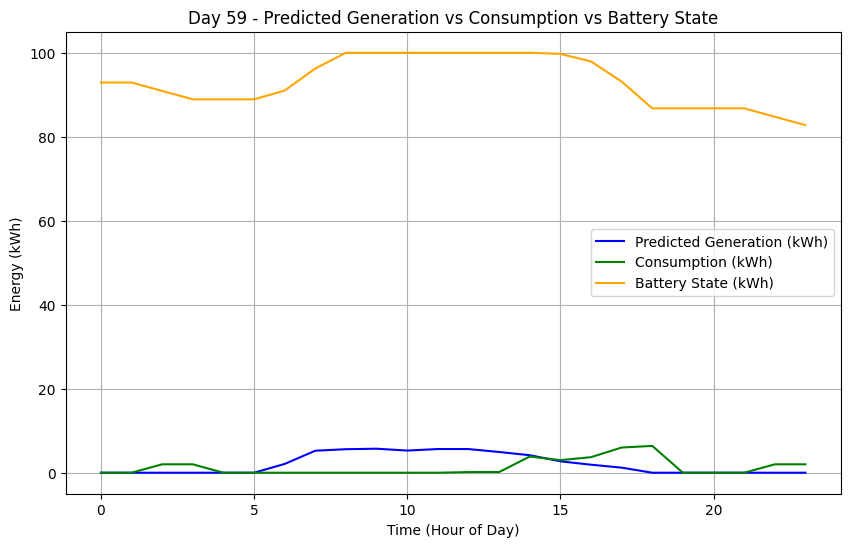

Simulating Day 60
[✔️] Appliance 0 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 17 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 23 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

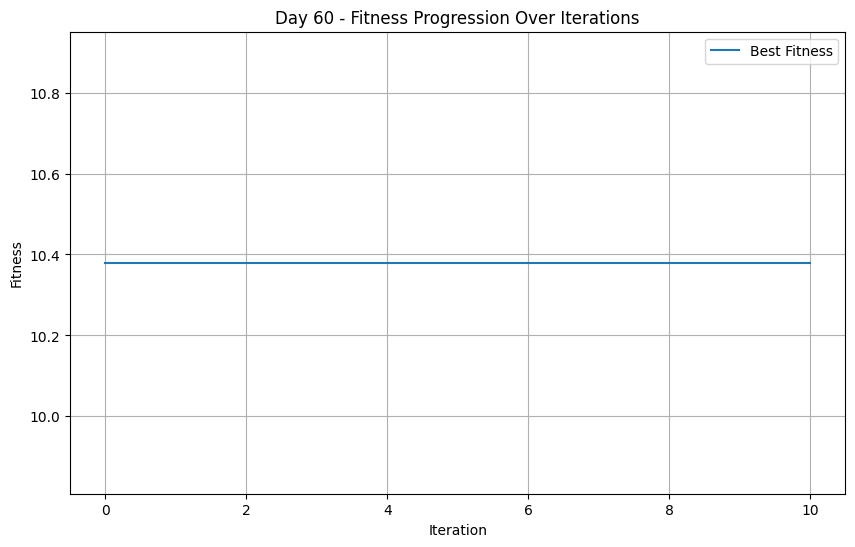

Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 17, Cost = 0.998416909683404
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 5, Cost = 0.9999999999998783
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 21, Cost = 1.0
Appliance 8: Start Time = 15, Cost = 0.946009033486812
Appliance 9: Start Time = 5, Cost = 0.8239673366178503
Appliance 10: Start Time = 23, Cost = 0.9912358497532158
===== Optimized Day 60 Schedule =====
Appliance 1: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

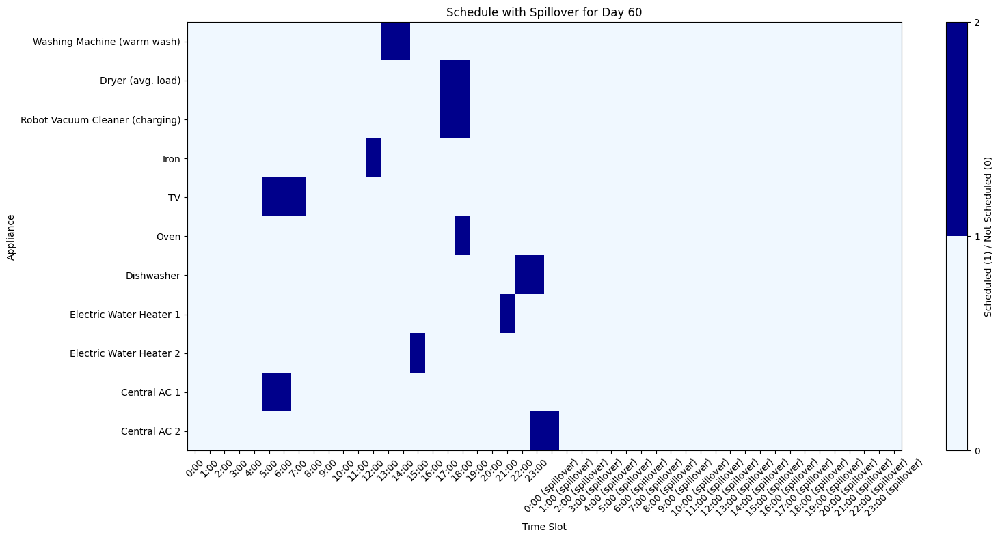

Best Fitness: 10.379678740725833
Updated Fitness: 10.379678740725833

===== Hourly Breakdown for Day 60 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              82.76
 1     0.00              0.00              82.76
 2     0.00              0.00              82.76
 3     0.00              0.00              82.76
 4     0.00              0.00              82.76
 5     0.00              3.15              79.61
 6     2.51              3.15              78.97
 7     4.84              0.15              83.66
 8     5.73              0.00              89.39
 9     5.73              0.00              95.13
10     6.02              0.00              100.00
11     6.06              0.00              100.00
12     5.89              1.08              100.00
13     5.64              2.00              100.00
14     5.06              2.00              100.00
15     4.42           

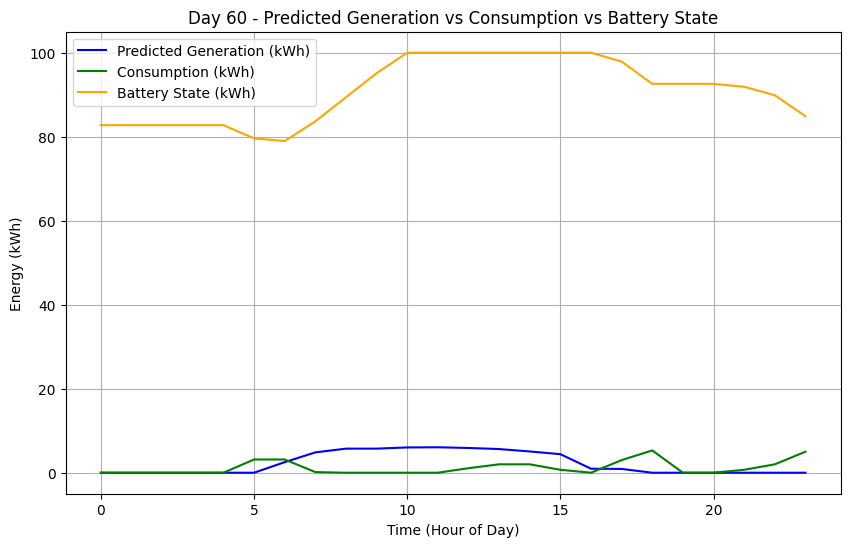

Simulating Day 61
[✔️] Appliance 0 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 13 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

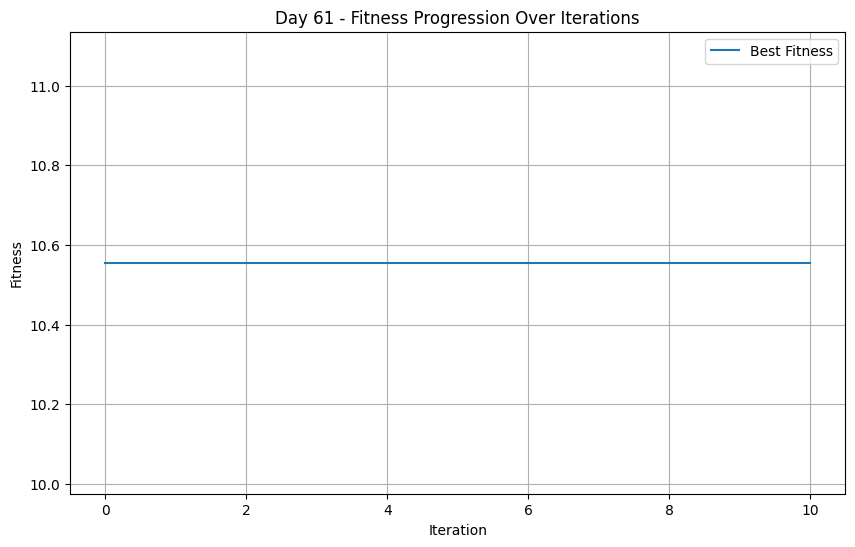

Appliance 0: Start Time = 20, Cost = 0.9999995044268284
Appliance 1: Start Time = 13, Cost = 0.9820030111622706
Appliance 2: Start Time = 12, Cost = 0.9842099683398212
Appliance 3: Start Time = 20, Cost = 1.0
Appliance 4: Start Time = 3, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 8, Cost = 0.946009033486812
Appliance 8: Start Time = 14, Cost = 0.995568151588062
Appliance 9: Start Time = 13, Cost = 0.9995636586524771
Appliance 10: Start Time = 0, Cost = 1.0
===== Optimized Day 61 Schedule =====
Appliance 1: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
A

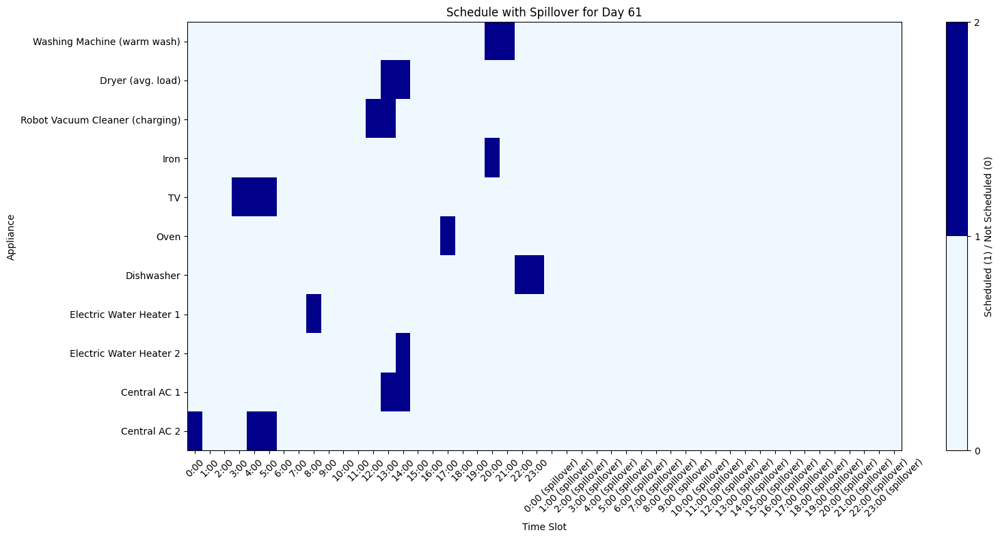

Best Fitness: 10.555288000891972
Updated Fitness: 10.555288000891972

===== Hourly Breakdown for Day 61 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              81.89
 1     0.00              0.00              81.89
 2     0.00              0.00              81.89
 3     0.00              0.15              81.74
 4     0.00              3.15              78.59
 5     0.00              3.15              75.44
 6     1.57              0.00              77.01
 7     3.17              0.00              80.18
 8     4.25              0.70              83.73
 9     4.47              0.00              88.21
10     5.74              0.00              93.95
11     5.90              0.00              99.84
12     5.91              0.01              100.00
13     5.40              6.01              99.40
14     4.49              6.70              97.19
15     3.59              0

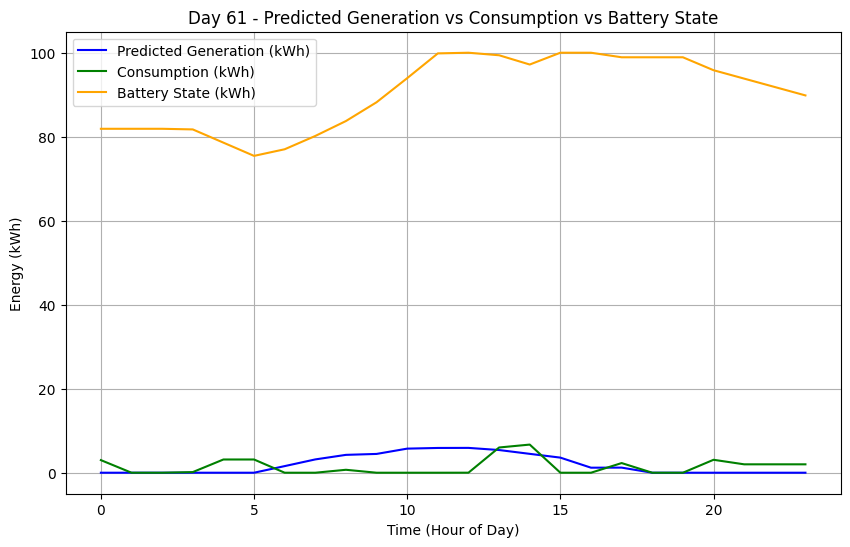

Simulating Day 62
[✔️] Appliance 0 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 15 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 9 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

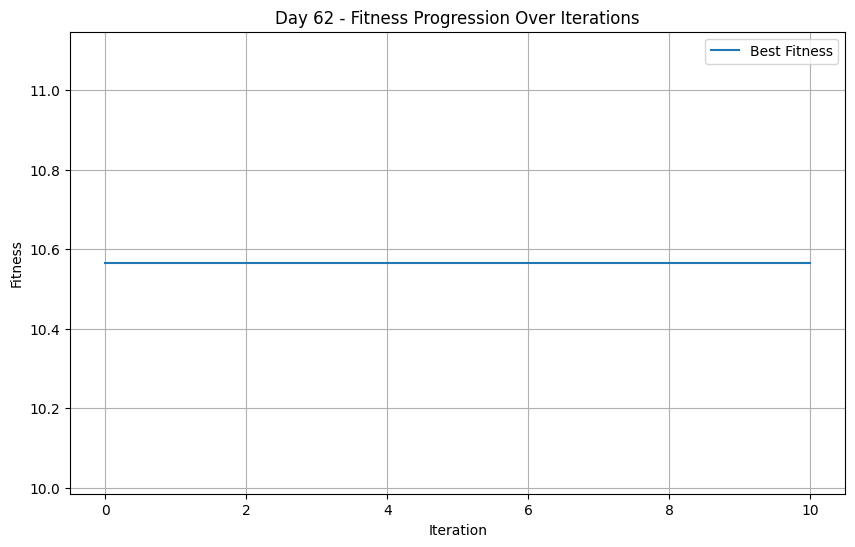

Appliance 0: Start Time = 13, Cost = 0.9962013379920676
Appliance 1: Start Time = 15, Cost = 0.9962013379920676
Appliance 2: Start Time = 1, Cost = 0.9263459719393353
Appliance 3: Start Time = 22, Cost = 1.0
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 18, Cost = 1.0
Appliance 8: Start Time = 10, Cost = 0.9999999999908653
Appliance 9: Start Time = 13, Cost = 0.9995636586524771
Appliance 10: Start Time = 9, Cost = 0.9999920081294466
===== Optimized Day 62 Schedule =====
Appliance 1: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 15, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

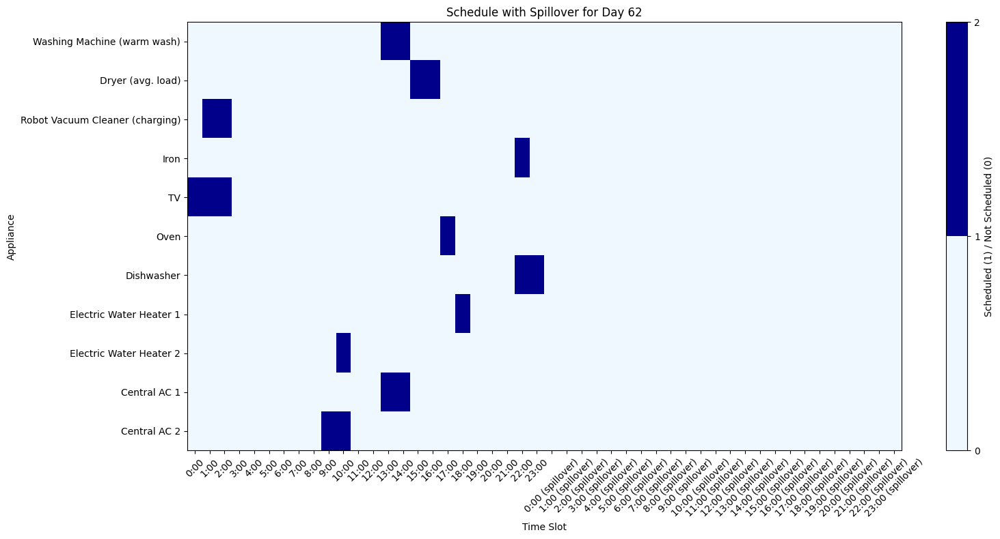

Best Fitness: 10.56623898793196
Updated Fitness: 10.56623898793196

===== Hourly Breakdown for Day 62 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              89.68
 1     0.00              0.16              89.53
 2     0.00              0.16              89.37
 3     0.00              0.00              89.37
 4     0.00              0.00              89.37
 5     0.00              0.00              89.37
 6     1.80              0.00              91.17
 7     4.17              0.00              95.34
 8     4.24              0.00              99.58
 9     4.81              3.00              100.00
10     4.44              3.70              100.00
11     5.12              0.00              100.00
12     5.29              0.00              100.00
13     4.74              5.00              99.74
14     4.63              5.00              99.37
15     2.82              

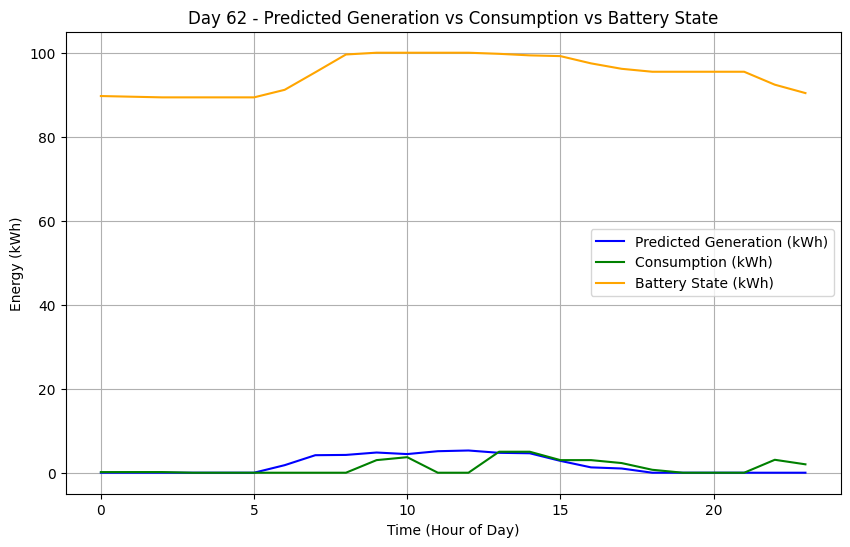

Simulating Day 63
[✔️] Appliance 0 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 15 (valid range: 0-23)
Initial_solution: [[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 

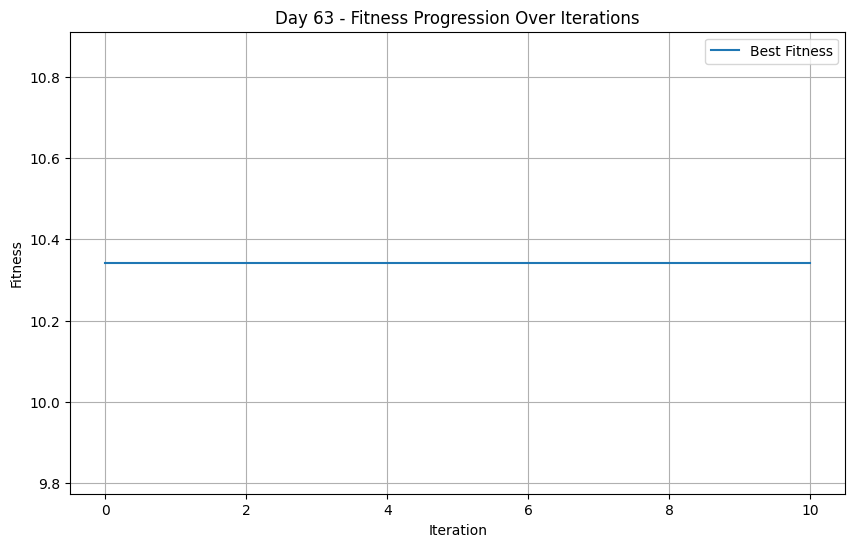

Appliance 0: Start Time = 0, Cost = 0.9668409537357504
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 23, Cost = 1.0
Appliance 4: Start Time = 14, Cost = 0.997784075794031
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 8, Cost = 0.946009033486812
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 9, Cost = 0.9352412021670541
Appliance 10: Start Time = 15, Cost = 0.9352412021670541
===== Optimized Day 63 Schedule =====
Appliance 1: Start Time 0, Duration 2
Time Slots (first 24): [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 

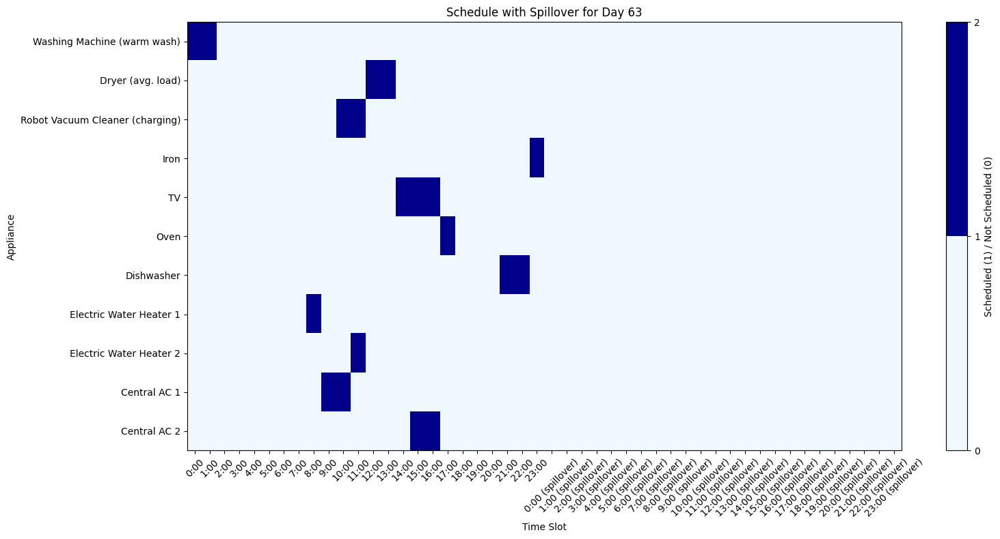

Best Fitness: 10.342508118300554
Updated Fitness: 10.342508118300554

===== Hourly Breakdown for Day 63 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              88.39
 1     0.00              2.00              86.39
 2     0.00              0.00              86.39
 3     0.00              0.00              86.39
 4     0.00              0.00              86.39
 5     0.00              0.00              86.39
 6     1.70              0.00              88.09
 7     2.62              0.00              90.71
 8     3.18              0.70              93.20
 9     3.81              3.00              94.00
10     4.64              3.01              95.64
11     4.89              0.71              99.83
12     5.00              3.00              100.00
13     4.38              3.00              100.00
14     4.00              0.15              100.00
15     3.03             

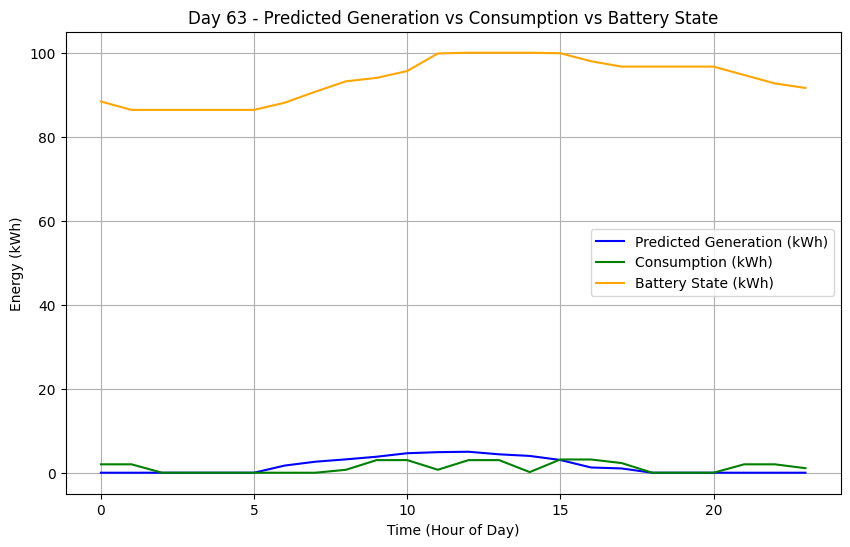

Simulating Day 64
[✔️] Appliance 0 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 15 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 12 (valid range: 0-23)
Initial_solution: [[0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

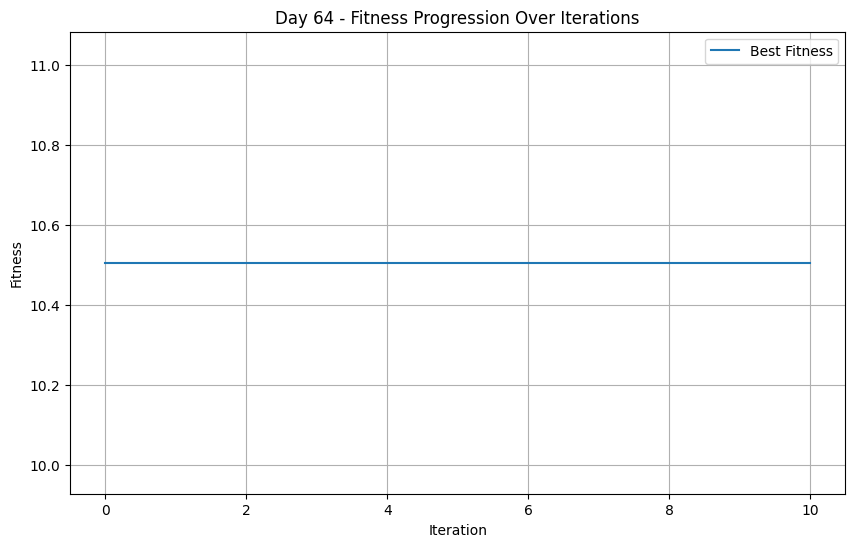

Appliance 0: Start Time = 3, Cost = 0.8935173314925493
Appliance 1: Start Time = 15, Cost = 0.9962013379920676
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 8, Cost = 0.9999999969620585
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 1, Cost = 0.9999985132804853
Appliance 8: Start Time = 23, Cost = 0.9999999939241172
Appliance 9: Start Time = 13, Cost = 0.9995636586524771
Appliance 10: Start Time = 12, Cost = 0.997784075794031
===== Optimized Day 64 Schedule =====
Appliance 1: Start Time 3, Duration 2
Time Slots (first 24): [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 15, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 

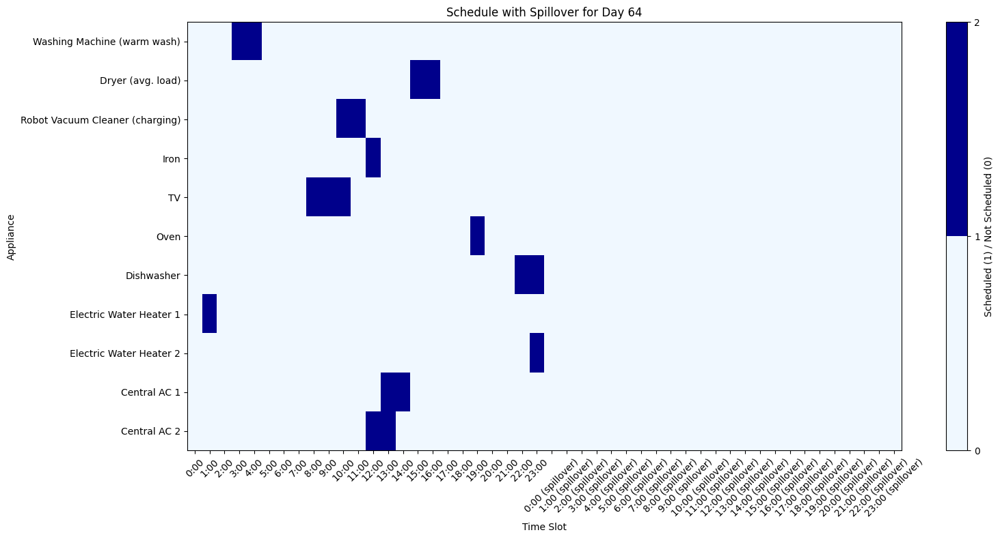

Best Fitness: 10.504920257980574
Updated Fitness: 10.504920257980574

===== Hourly Breakdown for Day 64 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              91.62
 1     0.00              0.70              90.92
 2     0.00              0.00              90.92
 3     0.00              2.00              88.92
 4     0.00              2.00              86.92
 5     0.00              0.00              86.92
 6     2.31              0.00              89.22
 7     4.83              0.00              94.05
 8     5.11              0.15              99.01
 9     6.06              0.15              100.00
10     5.98              0.16              100.00
11     6.00              0.01              100.00
12     5.96              4.08              100.00
13     4.82              6.00              98.82
14     4.02              3.00              99.84
15     4.07            

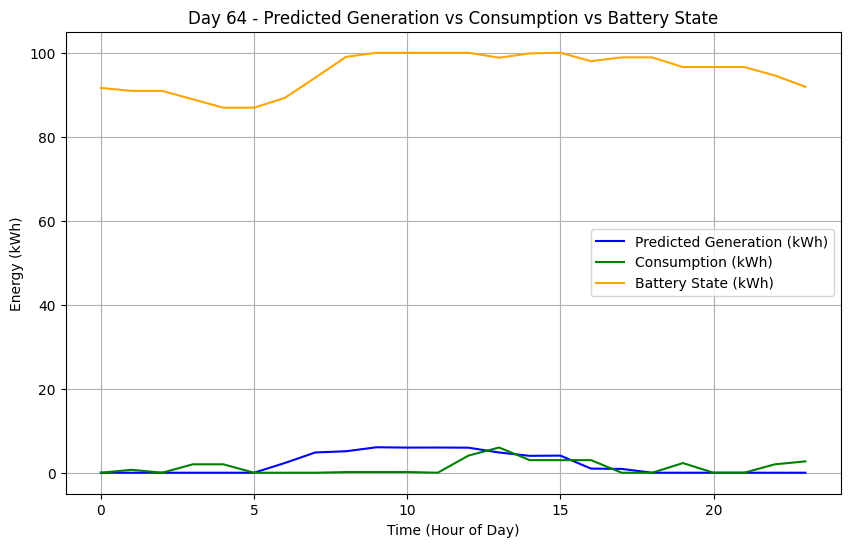

Simulating Day 65
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 20 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 10 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

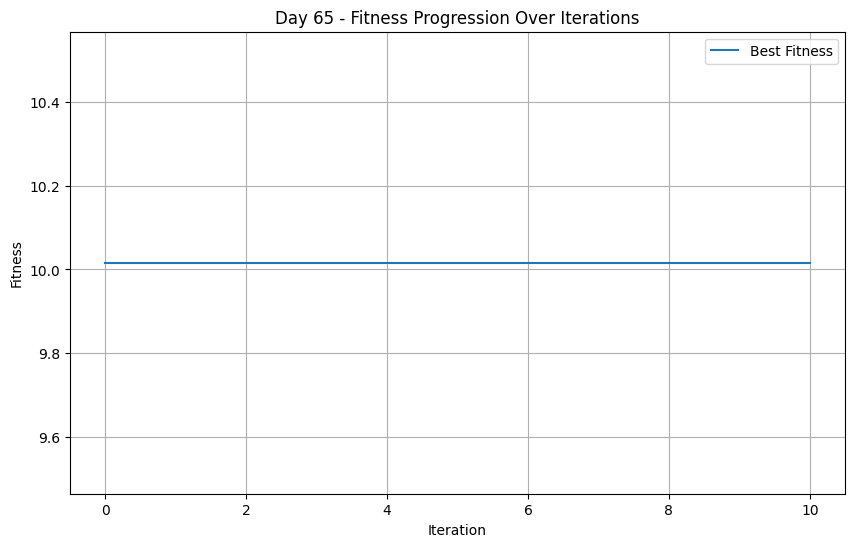

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 20, Cost = 0.9999888763792014
Appliance 2: Start Time = 7, Cost = 0.9420616894477034
Appliance 3: Start Time = 3, Cost = 0.9999985132804853
Appliance 4: Start Time = 22, Cost = 0.8790146377404283
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 8, Cost = 0.946009033486812
Appliance 8: Start Time = 17, Cost = 0.6010577195985674
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 10, Cost = 0.9999330848871175
===== Optimized Day 65 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 20, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0]
Spillover into next day (next 24): [0 0 0

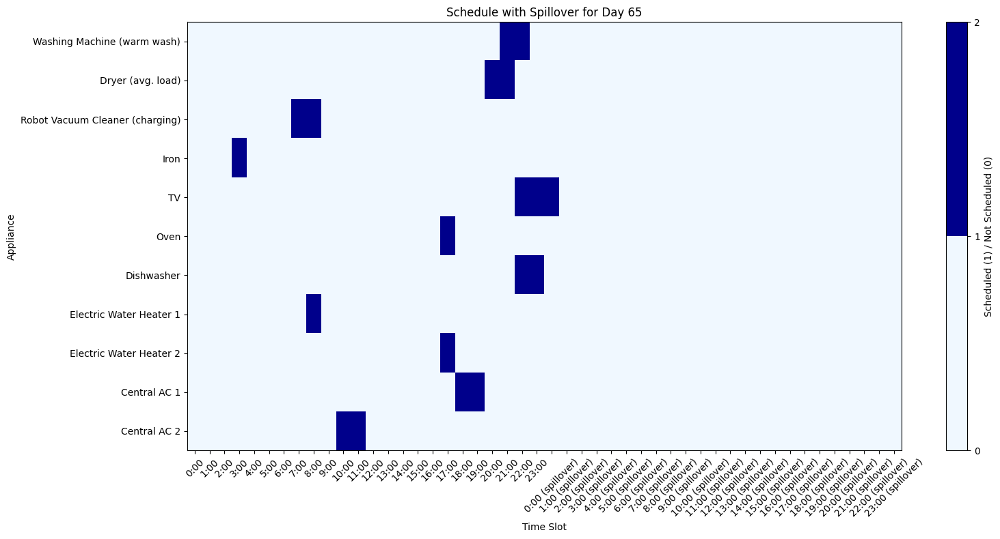

Best Fitness: 10.015998136474678
Updated Fitness: 10.015998136474678

===== Hourly Breakdown for Day 65 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              91.89
 1     0.00              0.00              91.89
 2     0.00              0.00              91.89
 3     0.00              1.08              90.81
 4     0.00              0.00              90.81
 5     0.00              0.00              90.81
 6     1.90              0.00              92.71
 7     4.27              0.01              96.97
 8     4.59              0.71              100.00
 9     5.19              0.00              100.00
10     4.76              3.00              100.00
11     5.01              3.00              100.00
12     4.69              0.00              100.00
13     3.38              0.00              100.00
14     2.40              0.00              100.00
15     2.50         

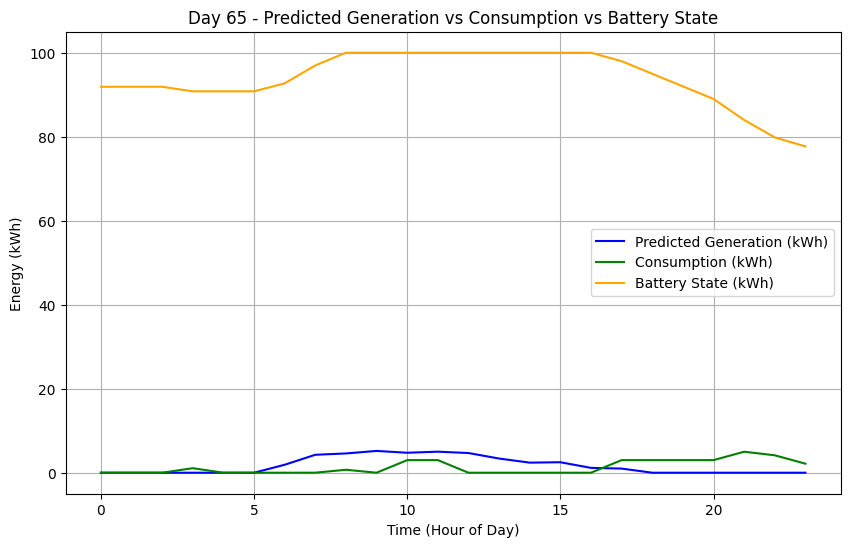

Simulating Day 66
[✔️] Appliance 0 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 21 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 8 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

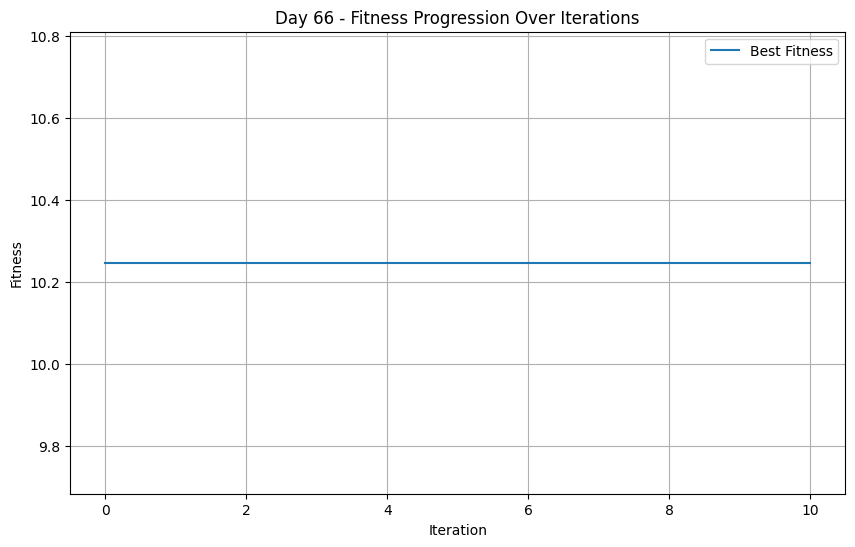

Appliance 0: Start Time = 22, Cost = 0.9999999858437042
Appliance 1: Start Time = 21, Cost = 0.9999975179847098
Appliance 2: Start Time = 17, Cost = 0.998416909683404
Appliance 3: Start Time = 4, Cost = 0.9998661697742351
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 6, Cost = 0.6010577195985674
Appliance 8: Start Time = 5, Cost = 1.0
Appliance 9: Start Time = 19, Cost = 0.9999999998665222
Appliance 10: Start Time = 8, Cost = 0.9999992566402426
===== Optimized Day 66 Schedule =====
Appliance 1: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

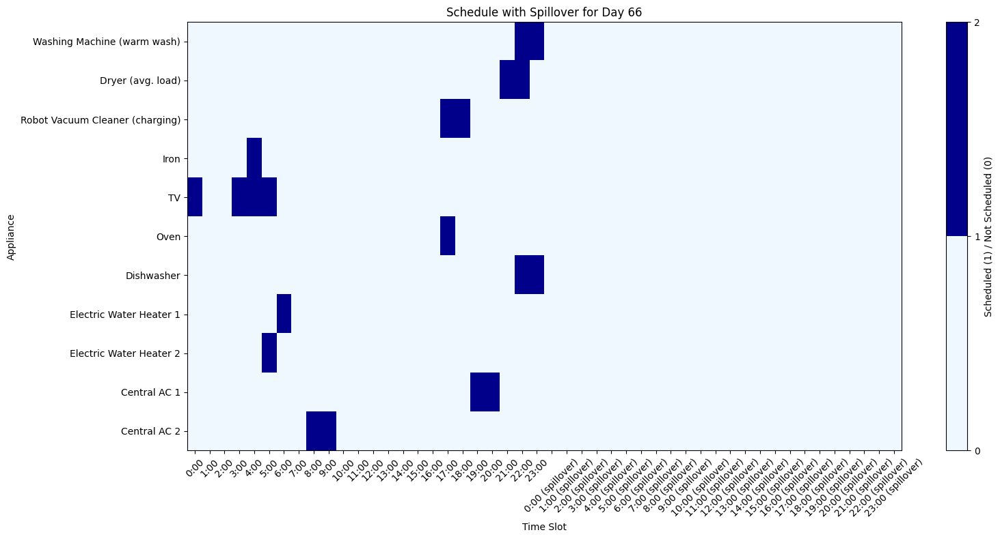

Best Fitness: 10.247272232627086
Updated Fitness: 10.247272232627086

===== Hourly Breakdown for Day 66 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              77.54
 1     0.00              0.00              77.54
 2     0.00              0.00              77.54
 3     0.00              0.15              77.39
 4     0.00              1.23              76.16
 5     0.00              0.85              75.31
 6     1.70              0.70              76.30
 7     4.17              0.00              80.47
 8     4.98              3.00              82.45
 9     4.73              3.00              84.17
10     5.16              0.00              89.34
11     4.66              0.00              93.99
12     4.67              0.00              98.66
13     4.80              0.00              100.00
14     4.03              0.00              100.00
15     2.89              

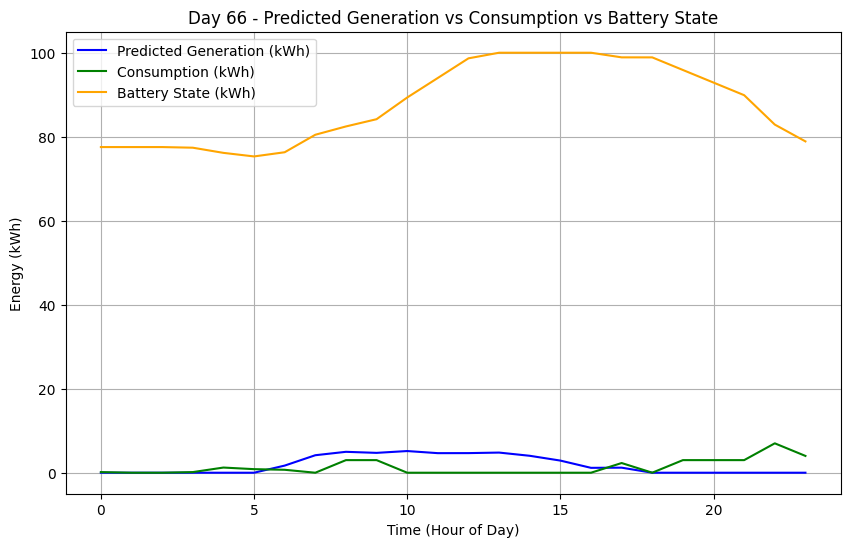

Simulating Day 67
[✔️] Appliance 0 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 9 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

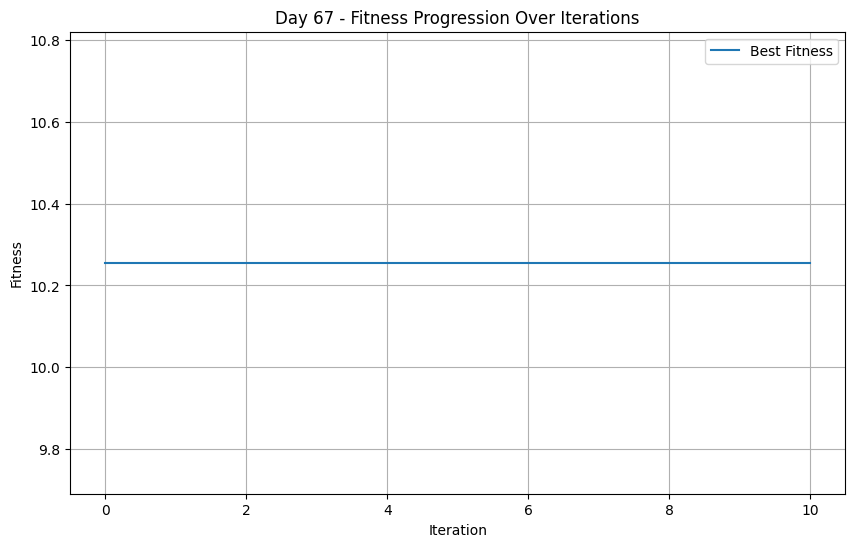

Appliance 0: Start Time = 17, Cost = 0.9999553899247451
Appliance 1: Start Time = 16, Cost = 0.9985227171960207
Appliance 2: Start Time = 15, Cost = 0.9955210939410314
Appliance 3: Start Time = 7, Cost = 0.7580292754808566
Appliance 4: Start Time = 22, Cost = 0.8790146377404283
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 11, Cost = 0.9999985132804853
Appliance 8: Start Time = 11, Cost = 0.9999999939241172
Appliance 9: Start Time = 15, Cost = 0.9999920081294466
Appliance 10: Start Time = 9, Cost = 0.9999920081294466
===== Optimized Day 67 Schedule =====
Appliance 1: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 

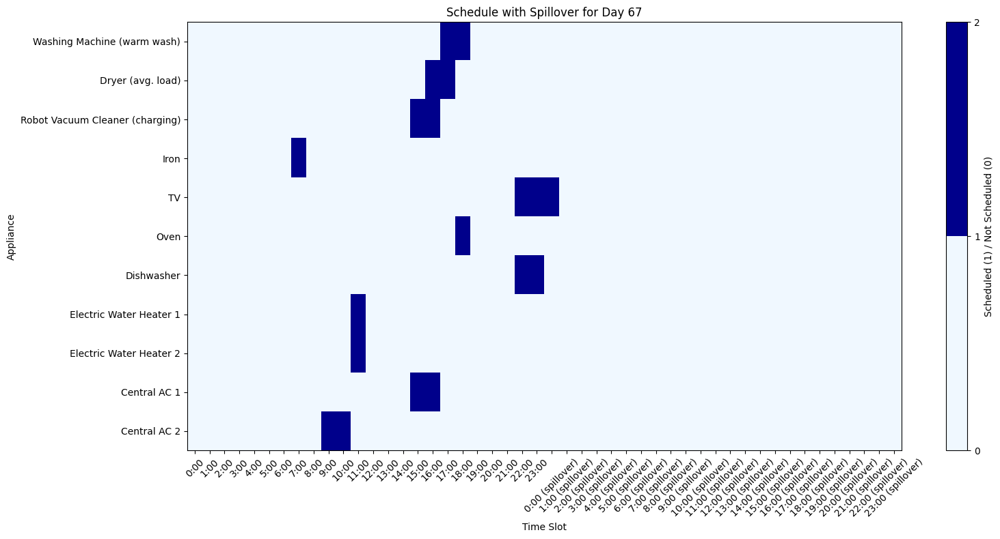

Best Fitness: 10.25552183416371
Updated Fitness: 10.25552183416371

===== Hourly Breakdown for Day 67 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              78.89
 1     0.00              0.00              78.89
 2     0.00              0.00              78.89
 3     0.00              0.00              78.89
 4     0.00              0.00              78.89
 5     0.00              0.00              78.89
 6     1.60              0.00              80.49
 7     3.07              1.08              82.48
 8     3.11              0.00              85.59
 9     3.77              3.00              86.35
10     4.21              3.00              87.57
11     3.21              1.40              89.38
12     3.29              0.00              92.66
13     2.01              0.00              94.68
14     1.47              0.00              96.15
15     1.20              3.01

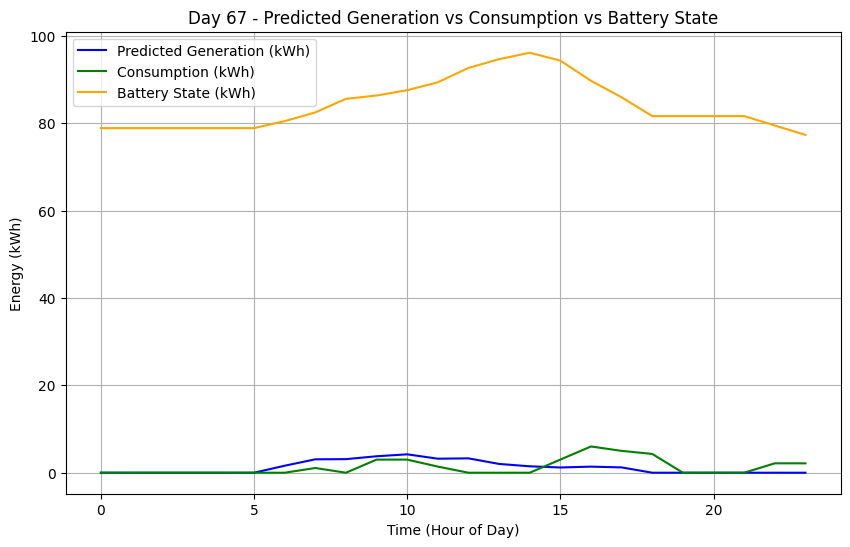

Simulating Day 68
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 10 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 15 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

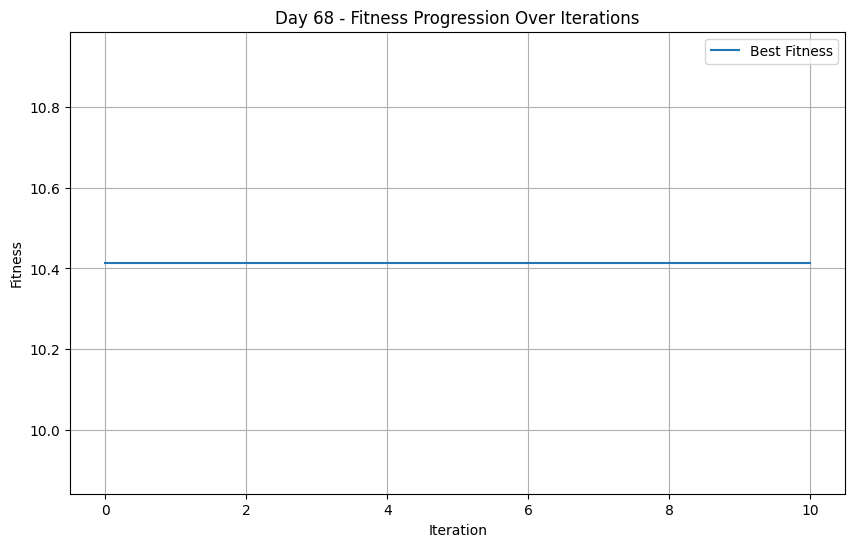

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 10, Cost = 0.9193430918269522
Appliance 2: Start Time = 7, Cost = 0.9420616894477034
Appliance 3: Start Time = 14, Cost = 0.9999999939241172
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 3, Cost = 0.995568151588062
Appliance 8: Start Time = 15, Cost = 0.946009033486812
Appliance 9: Start Time = 10, Cost = 0.9730045167434059
Appliance 10: Start Time = 15, Cost = 0.9352412021670541
===== Optimized Day 68 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0

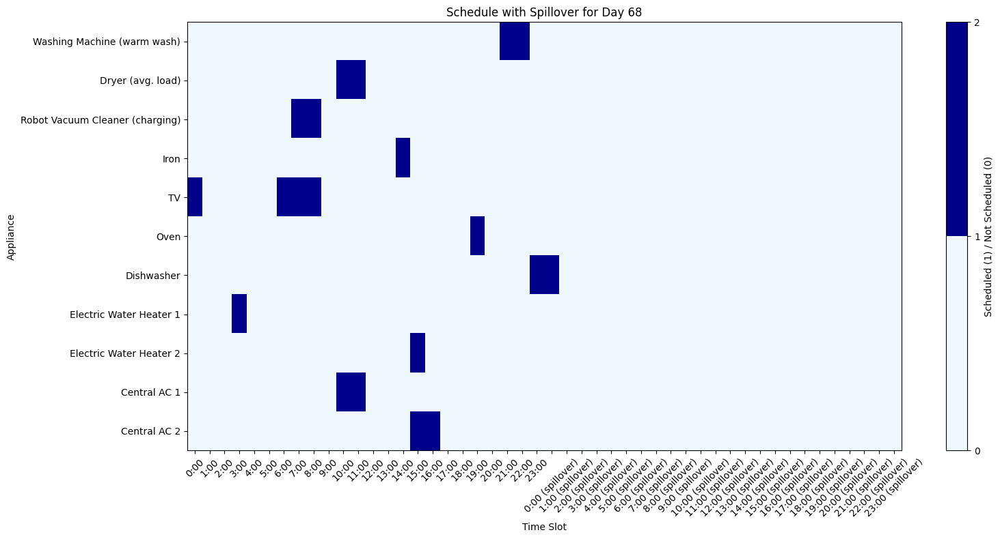

Best Fitness: 10.41420956499899
Updated Fitness: 10.41420956499899

===== Hourly Breakdown for Day 68 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              77.19
 1     0.00              0.00              77.19
 2     0.00              0.00              77.19
 3     0.00              0.70              76.49
 4     0.00              0.00              76.49
 5     0.00              0.00              76.49
 6     1.78              0.15              78.12
 7     3.46              0.16              81.42
 8     3.84              0.16              85.11
 9     4.54              0.00              89.65
10     3.69              6.00              87.34
11     4.51              6.00              85.84
12     4.49              0.00              90.34
13     3.27              0.00              93.61
14     3.11              1.08              95.64
15     2.65              3.70

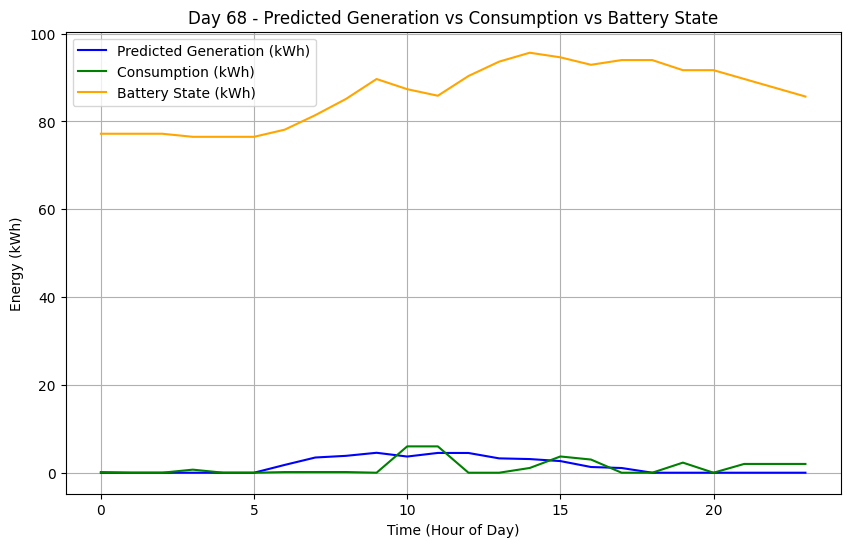

Simulating Day 69
[✔️] Appliance 0 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 17 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 19 (valid range: 0-23)
Initial_solution: [[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

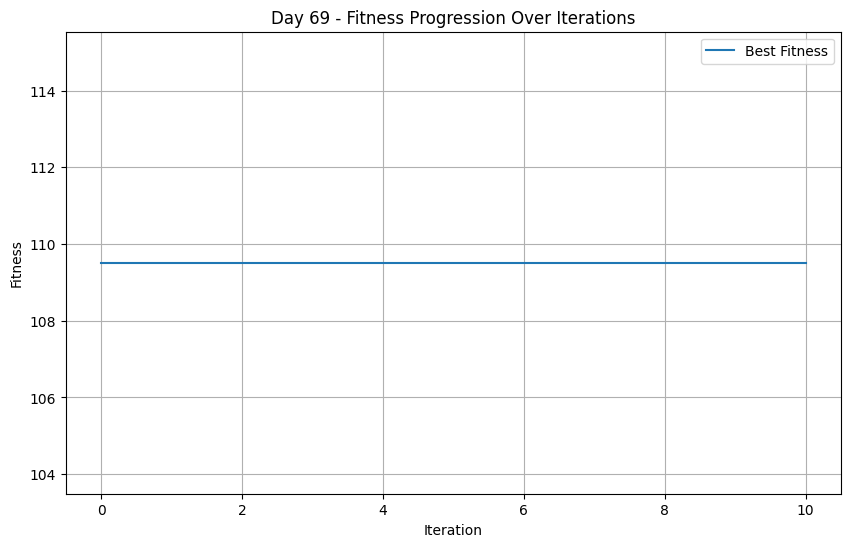

Appliance 0: Start Time = 0, Cost = 0.9668409537357504
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 2, Cost = 0.9217914612049088
Appliance 3: Start Time = 17, Cost = 1.0
Appliance 4: Start Time = 10, Cost = 0.9999992566402426
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 16, Cost = 1.0
Appliance 8: Start Time = 21, Cost = 0.9998661697742351
Appliance 9: Start Time = 23, Cost = 1.0
Appliance 10: Start Time = 19, Cost = 0.8239673366178503
===== Optimized Day 69 Schedule =====
Appliance 1: Start Time 0, Duration 2
Time Slots (first 24): [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: 

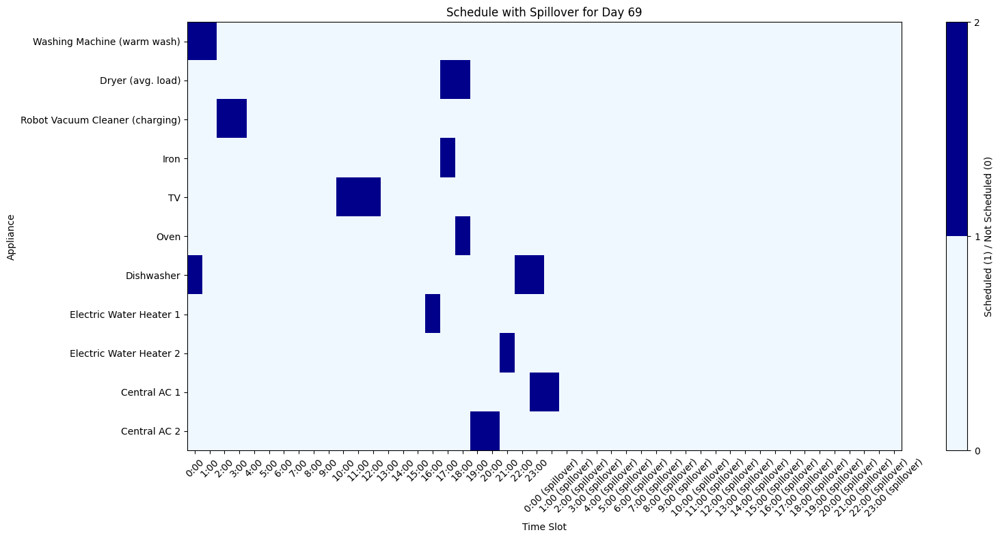

Best Fitness: 109.51247994477352
Updated Fitness: 109.51247994477352

===== Hourly Breakdown for Day 69 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              4.00              81.66
 1     0.00              2.00              79.66
 2     0.00              0.01              79.66
 3     0.00              0.01              79.65
 4     0.00              0.00              79.65
 5     0.00              0.00              79.65
 6     1.47              0.00              81.12
 7     4.51              0.00              85.64
 8     5.35              0.00              90.99
 9     5.71              0.00              96.69
10     5.34              0.15              100.00
11     5.51              0.15              100.00
12     5.39              0.15              100.00
13     4.82              0.00              100.00
14     3.74              0.00              100.00
15     2.60           

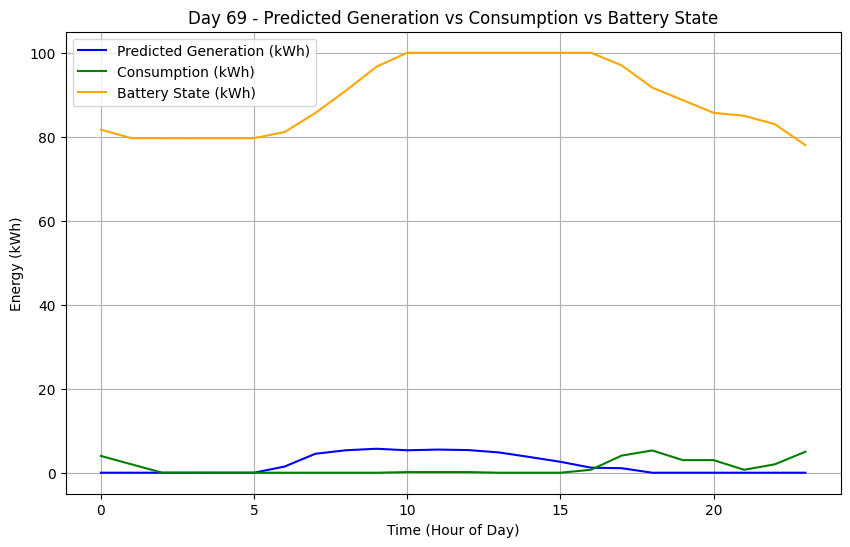

Simulating Day 70
[✔️] Appliance 0 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 18 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

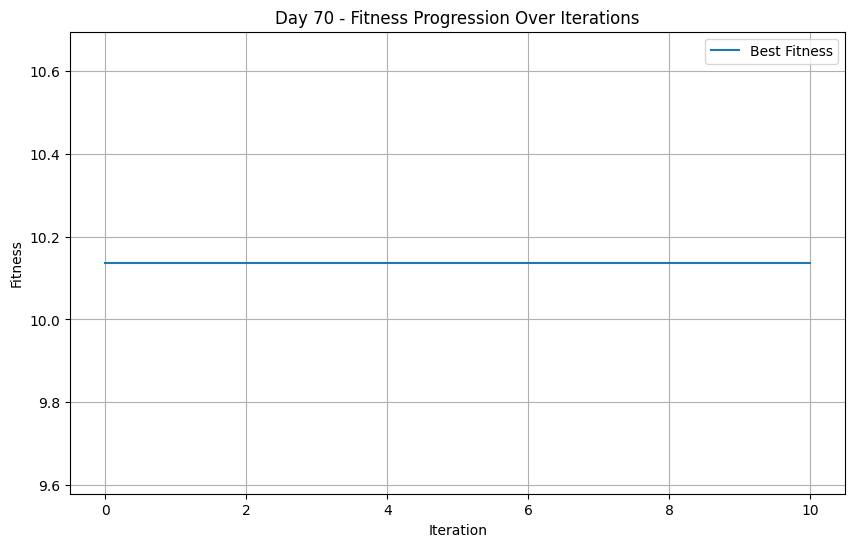

Appliance 0: Start Time = 16, Cost = 0.999839909782793
Appliance 1: Start Time = 16, Cost = 0.9985227171960207
Appliance 2: Start Time = 7, Cost = 0.9420616894477034
Appliance 3: Start Time = 3, Cost = 0.9999985132804853
Appliance 4: Start Time = 15, Cost = 0.9912358497532158
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 8, Cost = 0.946009033486812
Appliance 8: Start Time = 16, Cost = 0.7580292754808566
Appliance 9: Start Time = 0, Cost = 0.997784075794031
Appliance 10: Start Time = 18, Cost = 0.8005288597992837
===== Optimized Day 70 Schedule =====
Appliance 1: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0

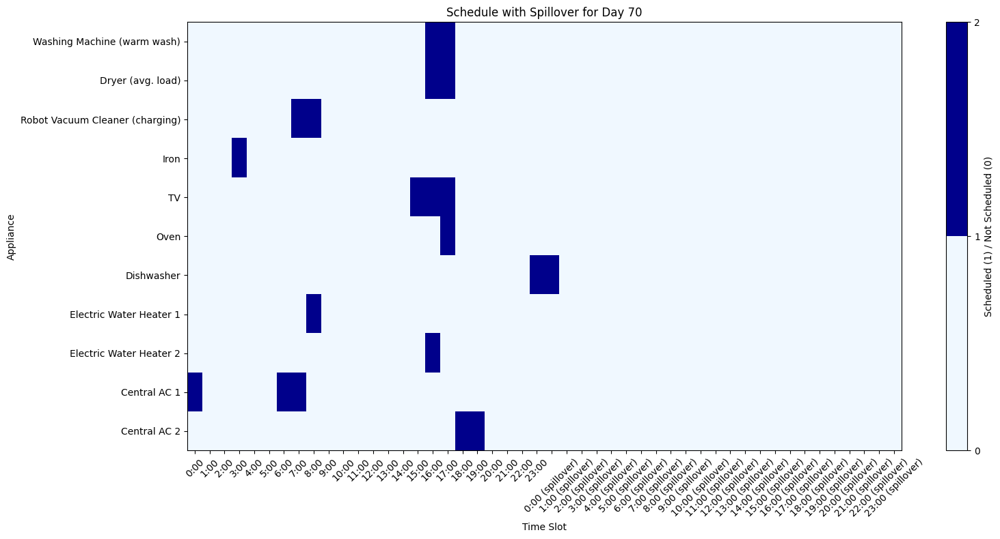

Best Fitness: 10.136991898379481
Updated Fitness: 10.136991898379481

===== Hourly Breakdown for Day 70 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              74.99
 1     0.00              0.00              74.99
 2     0.00              0.00              74.99
 3     0.00              1.08              73.91
 4     0.00              0.00              73.91
 5     0.00              0.00              73.91
 6     1.87              3.00              72.79
 7     2.83              3.01              72.61
 8     3.76              0.71              75.66
 9     4.02              0.00              79.69
10     6.01              0.00              85.69
11     6.09              0.00              91.79
12     6.18              0.00              97.96
13     4.87              0.00              100.00
14     3.63              0.00              100.00
15     2.24              

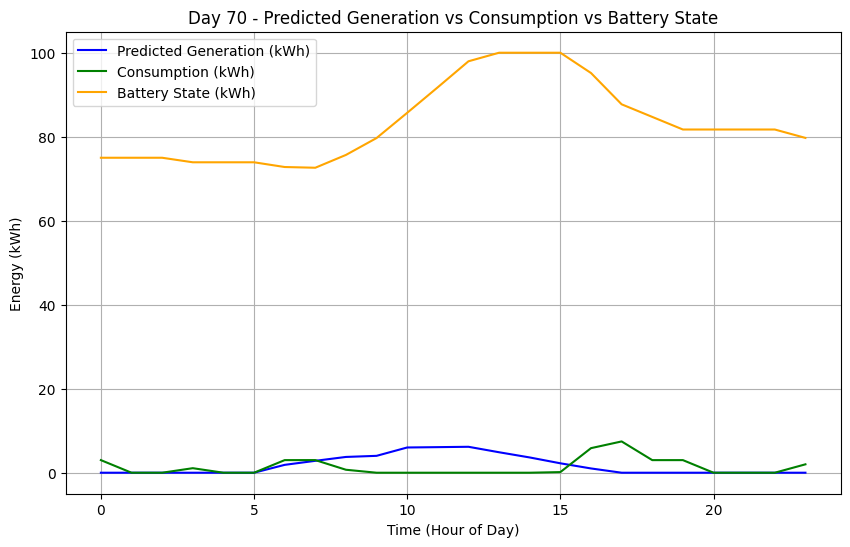

Simulating Day 71
[✔️] Appliance 0 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 21 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

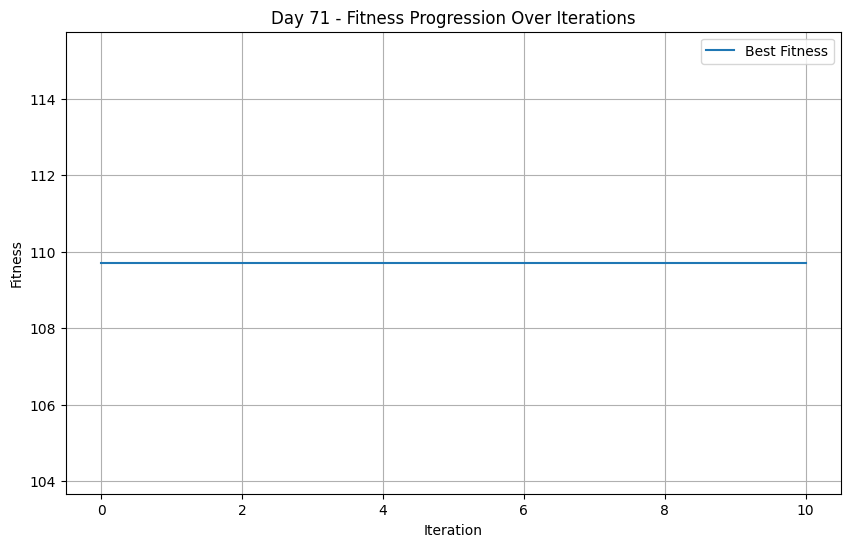

Appliance 0: Start Time = 10, Cost = 0.9668409537357504
Appliance 1: Start Time = 16, Cost = 0.9985227171960207
Appliance 2: Start Time = 13, Cost = 0.9892018066973624
Appliance 3: Start Time = 16, Cost = 0.9999999999999949
Appliance 4: Start Time = 2, Cost = 1.0
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 2, Cost = 0.9998661697742351
Appliance 8: Start Time = 0, Cost = 1.0
Appliance 9: Start Time = 12, Cost = 0.997784075794031
Appliance 10: Start Time = 21, Cost = 0.9352412021670541
===== Optimized Day 71 Schedule =====
Appliance 1: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

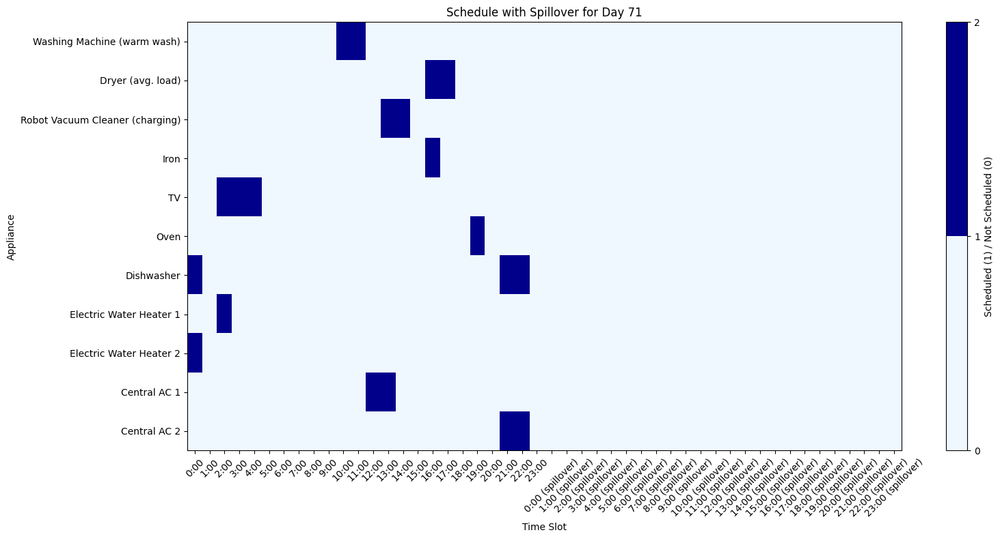

Best Fitness: 109.71142426198229
Updated Fitness: 109.71142426198229

===== Hourly Breakdown for Day 71 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.70              77.02
 1     0.00              0.00              77.02
 2     0.00              0.85              76.17
 3     0.00              0.15              76.02
 4     0.00              0.15              75.87
 5     0.00              0.00              75.87
 6     0.00              0.00              75.87
 7     2.73              0.00              78.60
 8     3.80              0.00              82.39
 9     4.43              0.00              86.82
10     4.95              2.00              89.77
11     5.21              2.00              92.98
12     5.49              3.00              95.47
13     4.28              3.01              96.74
14     2.93              0.01              99.66
15     2.77              0.

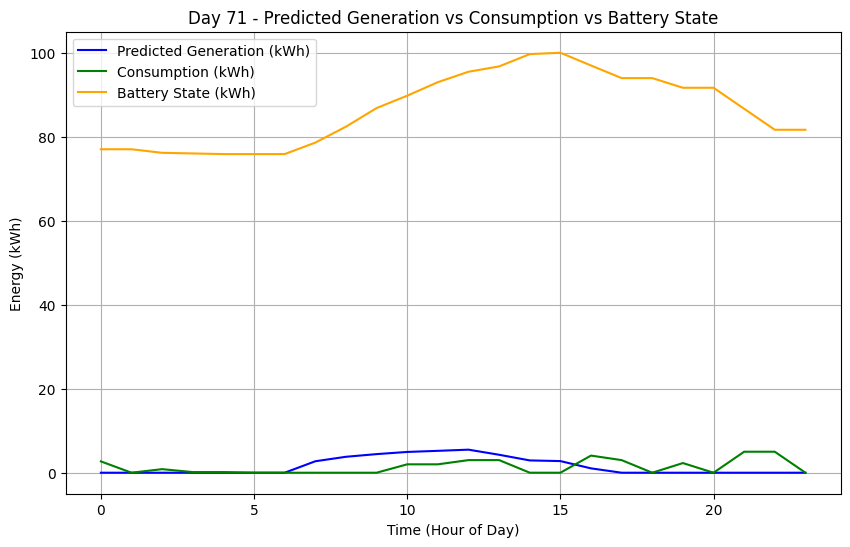

Simulating Day 72
[✔️] Appliance 0 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 8 (valid range: 0-23)
Initial_solution: [[0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

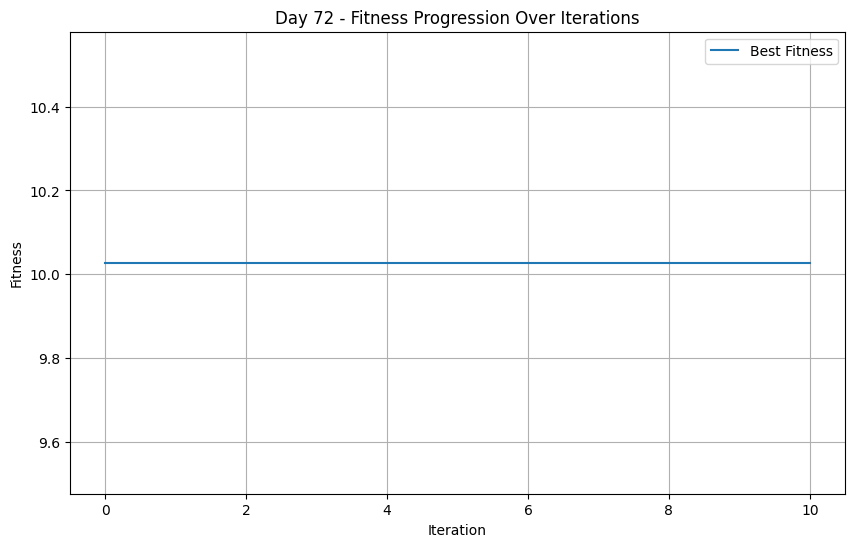

Appliance 0: Start Time = 4, Cost = 0.8742055907690023
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 12, Cost = 0.9842099683398212
Appliance 3: Start Time = 13, Cost = 0.9999985132804853
Appliance 4: Start Time = 9, Cost = 0.9999999461511998
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 14, Cost = 0.9999999999999949
Appliance 8: Start Time = 17, Cost = 0.6010577195985674
Appliance 9: Start Time = 23, Cost = 1.0
Appliance 10: Start Time = 8, Cost = 0.9999992566402426
===== Optimized Day 72 Schedule =====
Appliance 1: Start Time 4, Duration 2
Time Slots (first 24): [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0

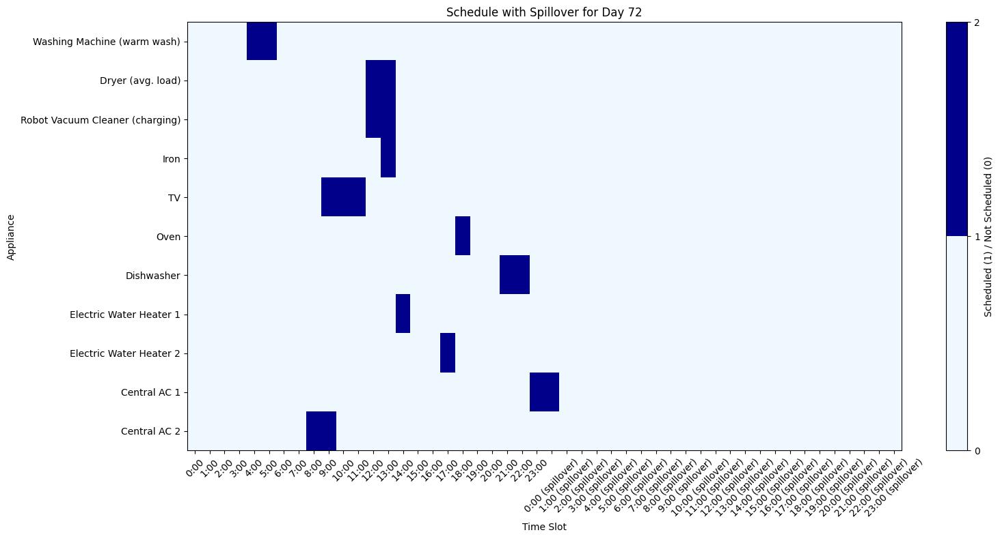

Best Fitness: 10.02736966811363
Updated Fitness: 10.02736966811363

===== Hourly Breakdown for Day 72 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              81.66
 1     0.00              0.00              81.66
 2     0.00              0.00              81.66
 3     0.00              0.00              81.66
 4     0.00              2.00              79.66
 5     0.00              2.00              77.66
 6     0.00              0.00              77.66
 7     2.19              0.00              79.85
 8     4.26              3.00              81.11
 9     4.96              3.15              82.92
10     5.46              0.15              88.23
11     5.54              0.15              93.62
12     5.43              3.01              96.04
13     4.73              4.09              96.68
14     3.68              0.70              99.66
15     2.87              0.00

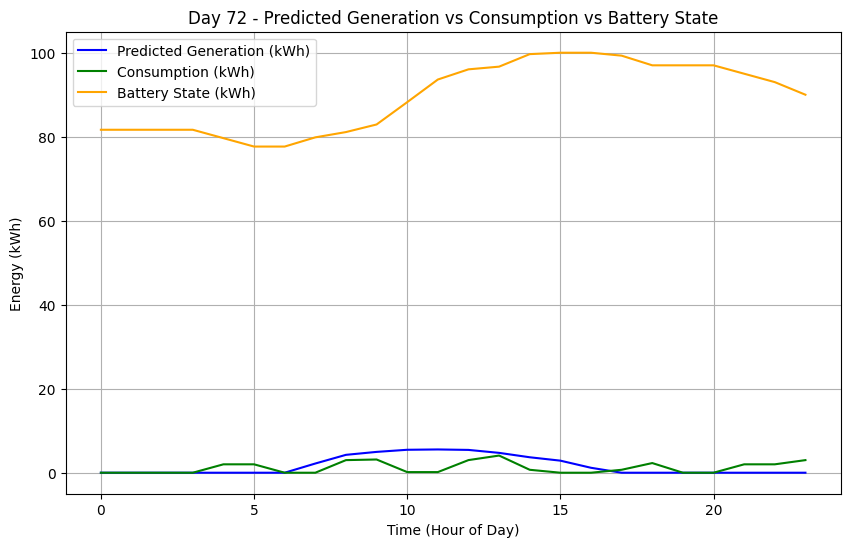

Simulating Day 73
[✔️] Appliance 0 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 15 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 7 (valid range: 0-23)
Initial_solution: [[0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

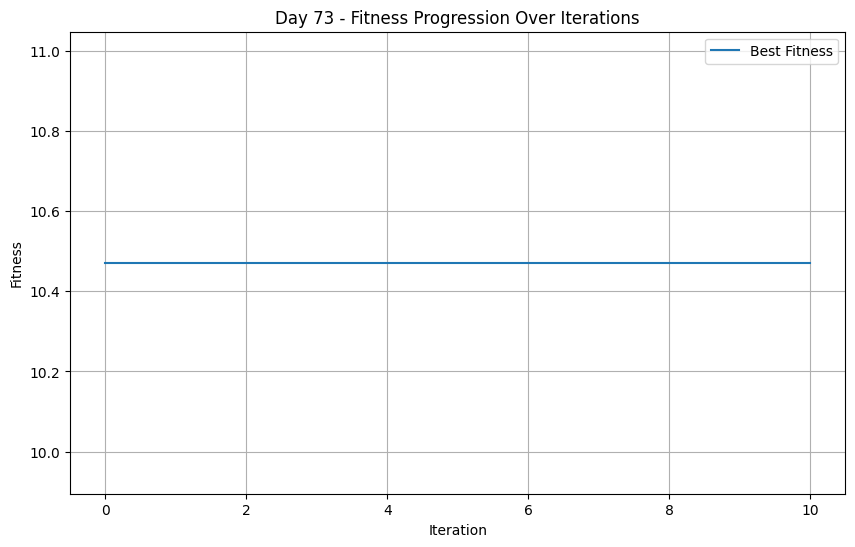

Appliance 0: Start Time = 2, Cost = 0.9193430918269522
Appliance 1: Start Time = 15, Cost = 0.9962013379920676
Appliance 2: Start Time = 0, Cost = 0.9333550794216401
Appliance 3: Start Time = 4, Cost = 0.9998661697742351
Appliance 4: Start Time = 5, Cost = 0.9999999999998783
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 16, Cost = 1.0
Appliance 8: Start Time = 7, Cost = 1.0
Appliance 9: Start Time = 0, Cost = 0.997784075794031
Appliance 10: Start Time = 7, Cost = 0.9999999461511998
===== Optimized Day 73 Schedule =====
Appliance 1: Start Time 2, Duration 2
Time Slots (first 24): [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 15, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

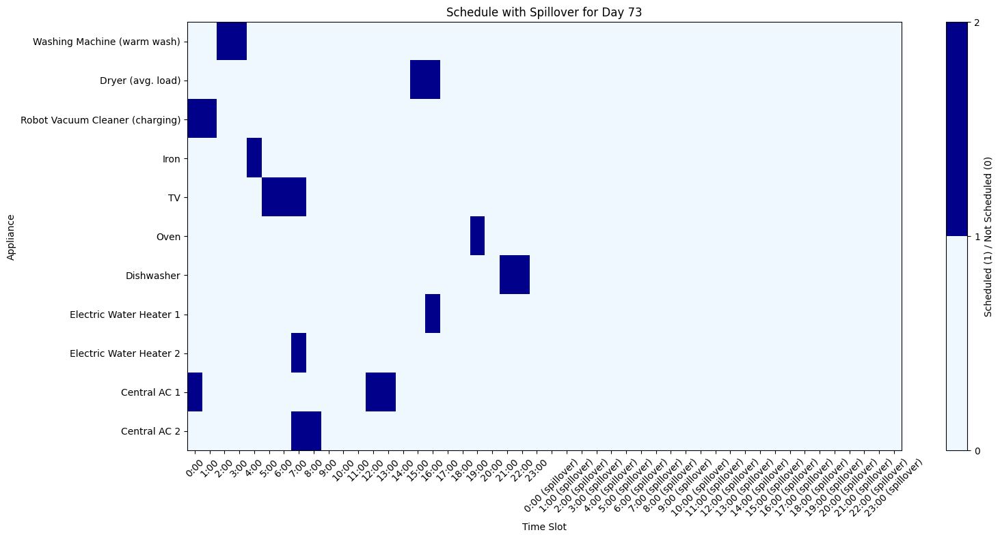

Best Fitness: 10.471045897377138
Updated Fitness: 10.471045897377138

===== Hourly Breakdown for Day 73 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.01              86.99
 1     0.00              0.01              86.99
 2     0.00              2.00              84.99
 3     0.00              2.00              82.99
 4     0.00              1.08              81.91
 5     0.00              0.15              81.76
 6     0.00              0.15              81.61
 7     4.11              3.85              81.87
 8     5.34              3.00              84.20
 9     5.91              0.00              90.11
10     5.65              0.00              95.76
11     5.79              0.00              100.00
12     5.71              3.00              100.00
13     3.36              3.00              100.00
14     2.24              0.00              100.00
15     1.32            

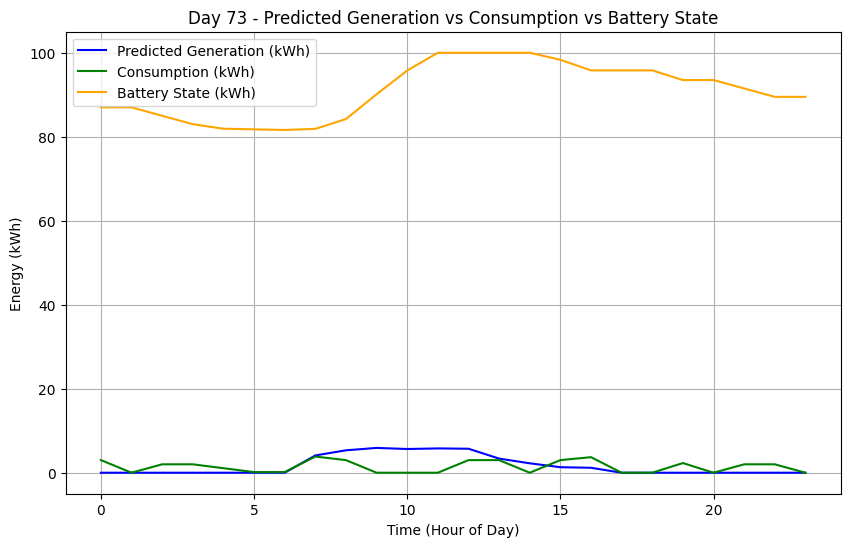

Simulating Day 74
[✔️] Appliance 0 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 12 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 6 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

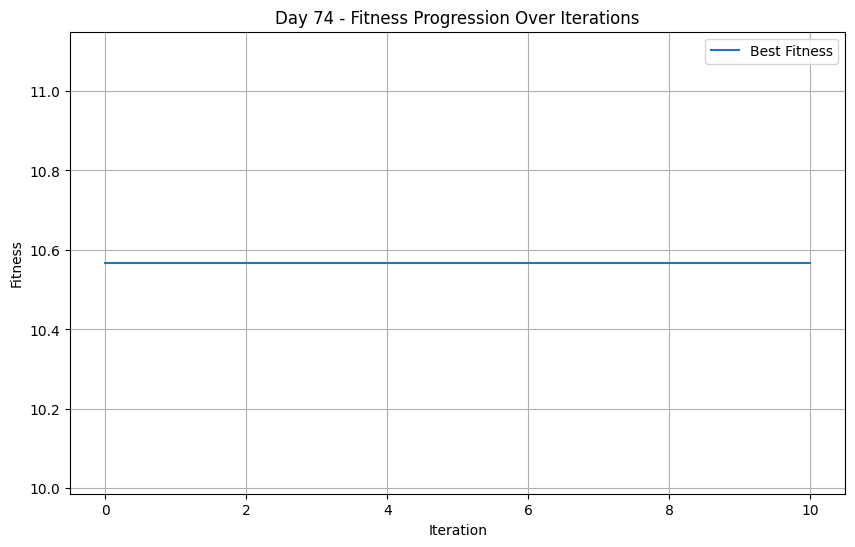

Appliance 0: Start Time = 12, Cost = 0.9912593703020969
Appliance 1: Start Time = 12, Cost = 0.9668409537357504
Appliance 2: Start Time = 19, Cost = 0.999523182359707
Appliance 3: Start Time = 17, Cost = 1.0
Appliance 4: Start Time = 15, Cost = 0.9912358497532158
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 3, Cost = 0.995568151588062
Appliance 8: Start Time = 15, Cost = 0.946009033486812
Appliance 9: Start Time = 0, Cost = 0.997784075794031
Appliance 10: Start Time = 6, Cost = 0.9999999969620585
===== Optimized Day 74 Schedule =====
Appliance 1: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 12, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 

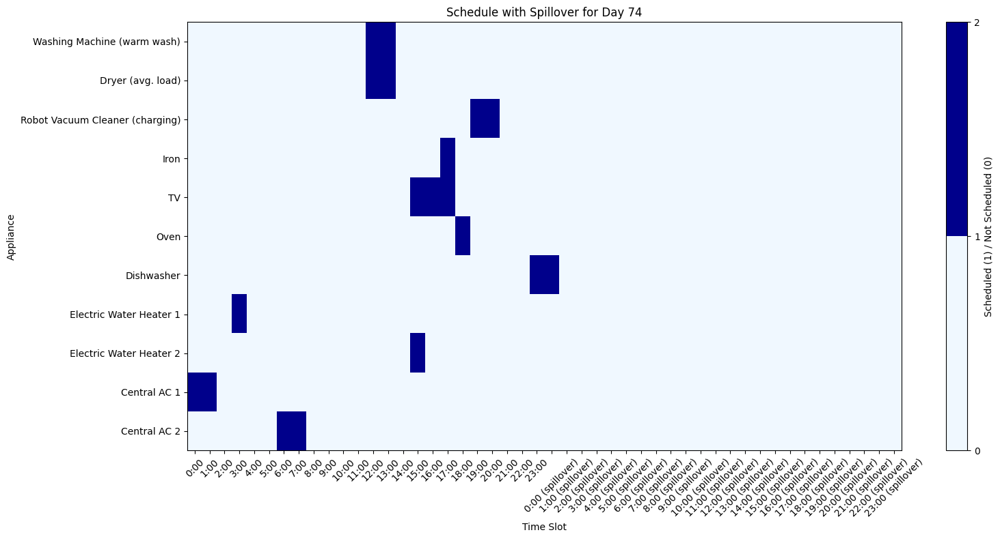

Best Fitness: 10.567764111521447
Updated Fitness: 10.567764111521447

===== Hourly Breakdown for Day 74 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              86.49
 1     0.00              3.00              83.49
 2     0.00              0.00              83.49
 3     0.00              0.70              82.79
 4     0.00              0.00              82.79
 5     0.00              0.00              82.79
 6     0.00              3.00              79.79
 7     3.62              3.00              80.41
 8     5.09              0.00              85.50
 9     5.79              0.00              91.29
10     5.67              0.00              96.96
11     4.68              0.00              100.00
12     4.51              5.00              99.51
13     4.41              5.00              98.92
14     3.33              0.00              100.00
15     3.58              

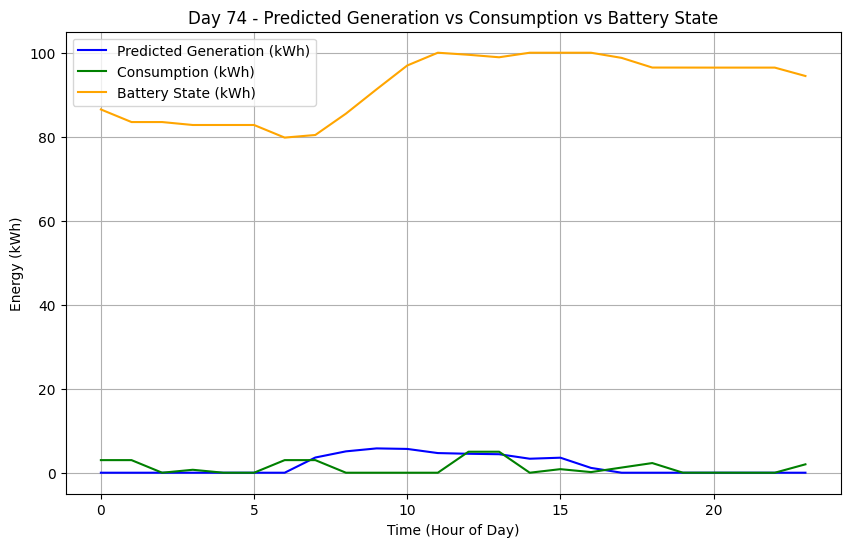

Simulating Day 75
[✔️] Appliance 0 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 21 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 17 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

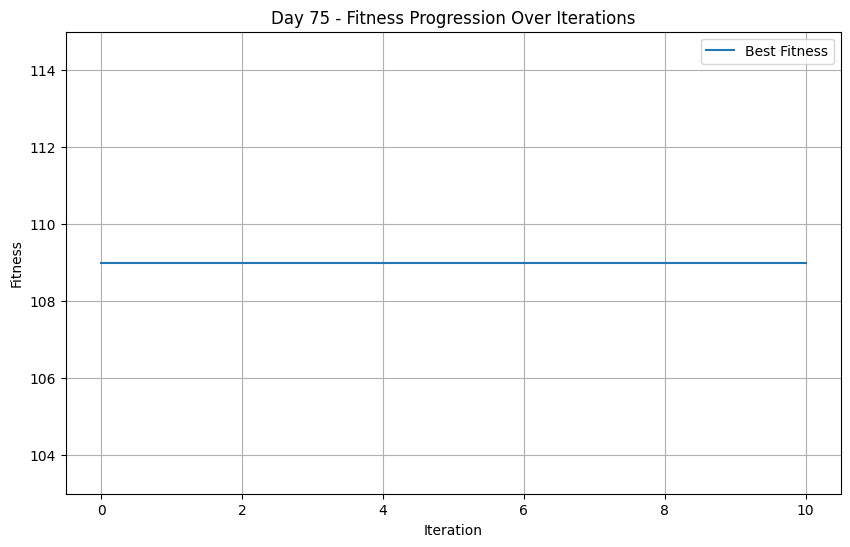

Appliance 0: Start Time = 18, Cost = 0.9999888763792014
Appliance 1: Start Time = 21, Cost = 0.9999975179847098
Appliance 2: Start Time = 2, Cost = 0.9217914612049088
Appliance 3: Start Time = 2, Cost = 0.9999999939241172
Appliance 4: Start Time = 10, Cost = 0.9999992566402426
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 0, Cost = 0.9999999939241172
Appliance 8: Start Time = 17, Cost = 0.6010577195985674
Appliance 9: Start Time = 5, Cost = 0.8239673366178503
Appliance 10: Start Time = 17, Cost = 0.8239673366178503
===== Optimized Day 75 Schedule =====
Appliance 1: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 

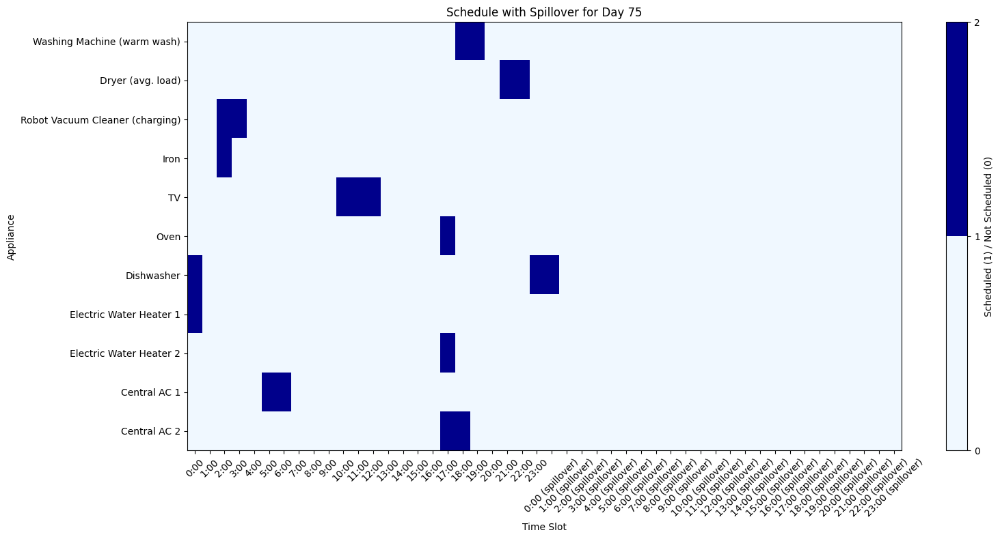

Best Fitness: 108.99473682950943
Updated Fitness: 108.99473682950943

===== Hourly Breakdown for Day 75 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.70              91.76
 1     0.00              0.00              91.76
 2     0.00              1.09              90.67
 3     0.00              0.01              90.66
 4     0.00              0.00              90.66
 5     0.00              3.00              87.66
 6     0.00              3.00              84.66
 7     3.52              0.00              88.19
 8     5.26              0.00              93.44
 9     5.81              0.00              99.25
10     6.11              0.15              100.00
11     6.01              0.15              100.00
12     5.95              0.15              100.00
13     5.23              0.00              100.00
14     4.70              0.00              100.00
15     4.20           

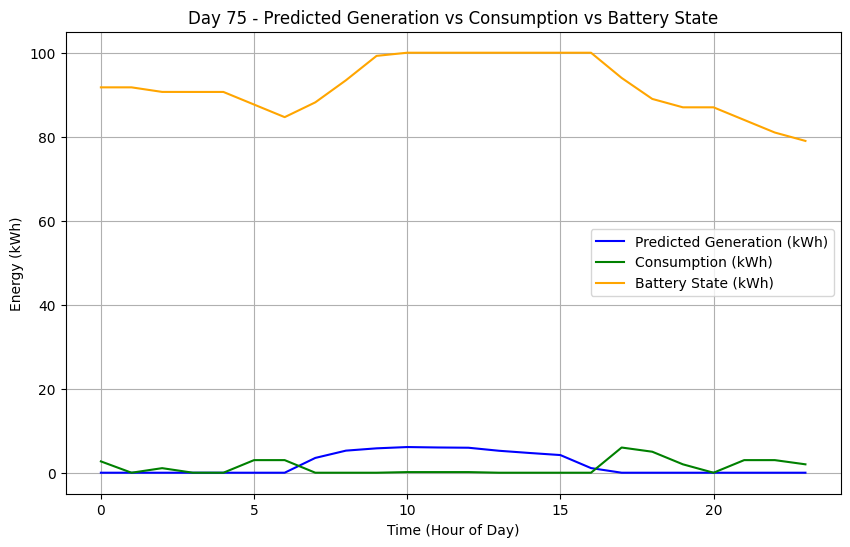

Simulating Day 76
[✔️] Appliance 0 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 11 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 9 (valid range: 0-23)
Initial_solution: [[0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

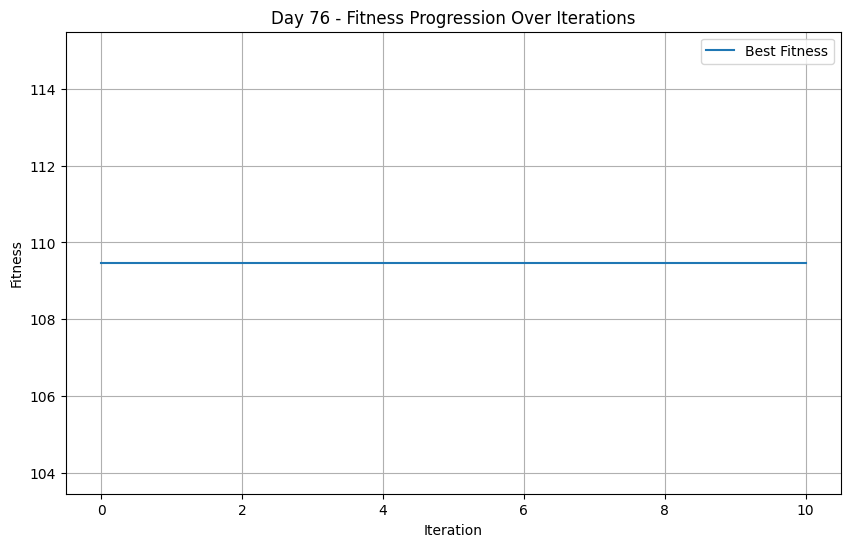

Appliance 0: Start Time = 1, Cost = 0.9453299751080021
Appliance 1: Start Time = 11, Cost = 0.9453299751080021
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 4, Cost = 0.9998661697742351
Appliance 4: Start Time = 6, Cost = 0.9999999999954327
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 22, Cost = 1.0
Appliance 8: Start Time = 16, Cost = 0.7580292754808566
Appliance 9: Start Time = 21, Cost = 0.9999999999998783
Appliance 10: Start Time = 9, Cost = 0.9999920081294466
===== Optimized Day 76 Schedule =====
Appliance 1: Start Time 1, Duration 2
Time Slots (first 24): [0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

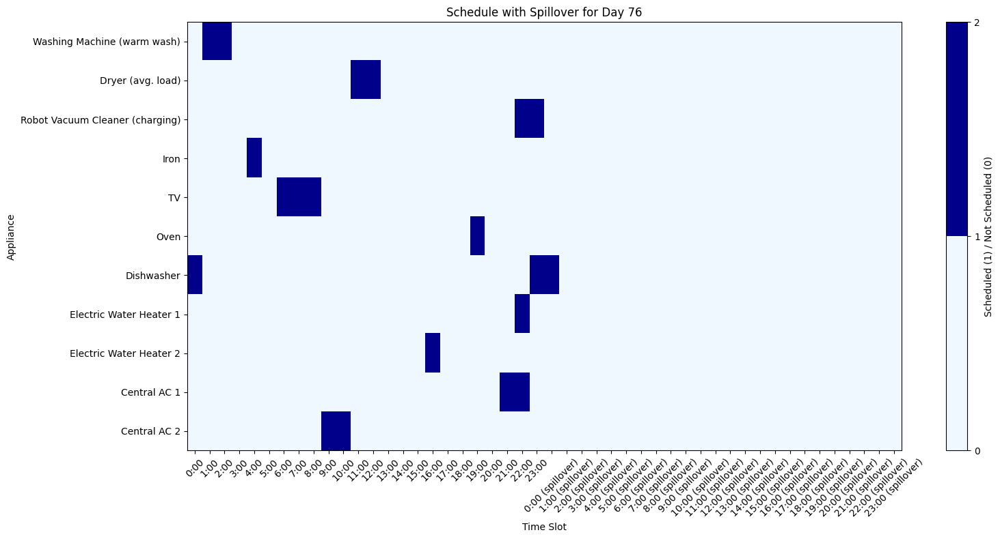

Best Fitness: 109.47245635082854
Updated Fitness: 109.47245635082854

===== Hourly Breakdown for Day 76 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              77.00
 1     0.00              2.00              75.00
 2     0.00              2.00              73.00
 3     0.00              0.00              73.00
 4     0.00              1.08              71.92
 5     0.00              0.00              71.92
 6     0.00              0.15              71.77
 7     3.63              0.15              75.25
 8     5.60              0.15              80.70
 9     5.74              3.00              83.44
10     6.00              3.00              86.44
11     6.04              3.00              89.48
12     5.96              3.00              92.44
13     5.49              0.00              97.93
14     5.30              0.00              100.00
15     3.77              0

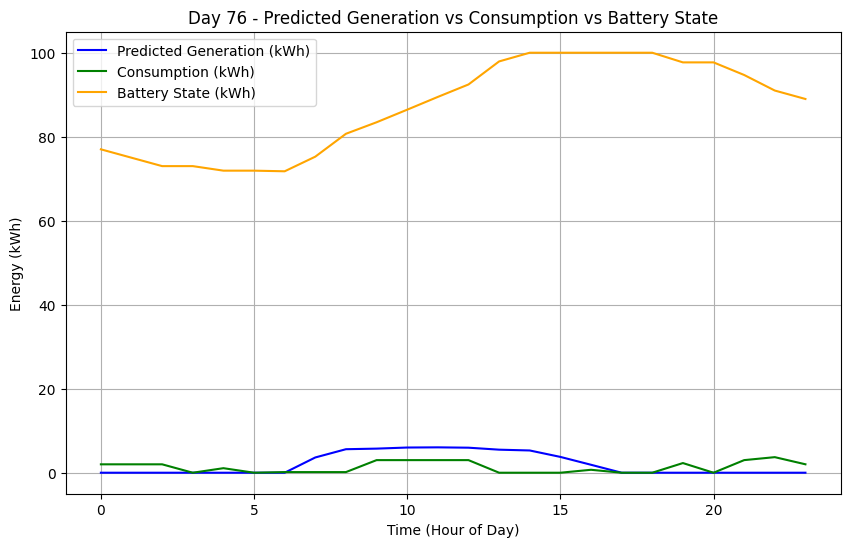

Simulating Day 77
[✔️] Appliance 0 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 14 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 19 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

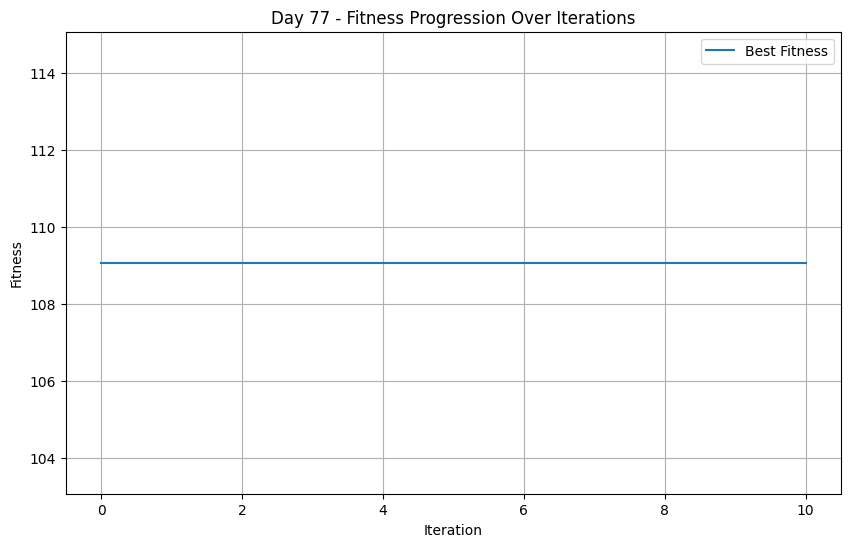

Appliance 0: Start Time = 10, Cost = 0.9668409537357504
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 7, Cost = 0.9420616894477034
Appliance 3: Start Time = 9, Cost = 0.7580292754808566
Appliance 4: Start Time = 4, Cost = 0.9999999999999974
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 5, Cost = 0.7580292754808566
Appliance 8: Start Time = 1, Cost = 1.0
Appliance 9: Start Time = 18, Cost = 0.9999999969620585
Appliance 10: Start Time = 19, Cost = 0.8239673366178503
===== Optimized Day 77 Schedule =====
Appliance 1: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

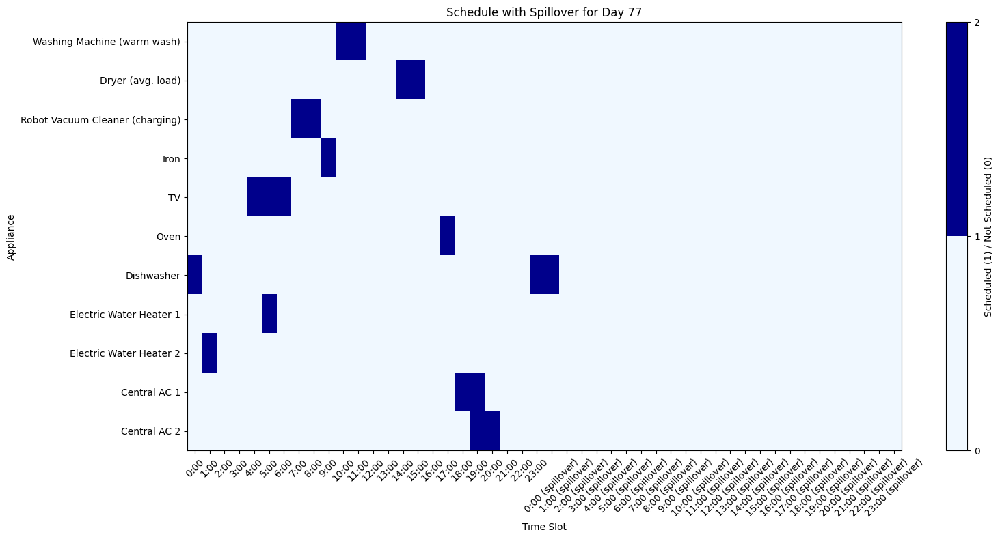

Best Fitness: 109.06415523464501
Updated Fitness: 109.06415523464501

===== Hourly Breakdown for Day 77 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              86.99
 1     0.00              0.70              86.29
 2     0.00              0.00              86.29
 3     0.00              0.00              86.29
 4     0.00              0.15              86.14
 5     0.00              0.85              85.29
 6     0.00              0.15              85.14
 7     3.87              0.01              89.00
 8     5.57              0.01              94.56
 9     5.91              1.08              99.39
10     5.79              2.00              100.00
11     5.56              2.00              100.00
12     5.93              0.00              100.00
13     5.16              0.00              100.00
14     4.60              3.00              100.00
15     3.07           

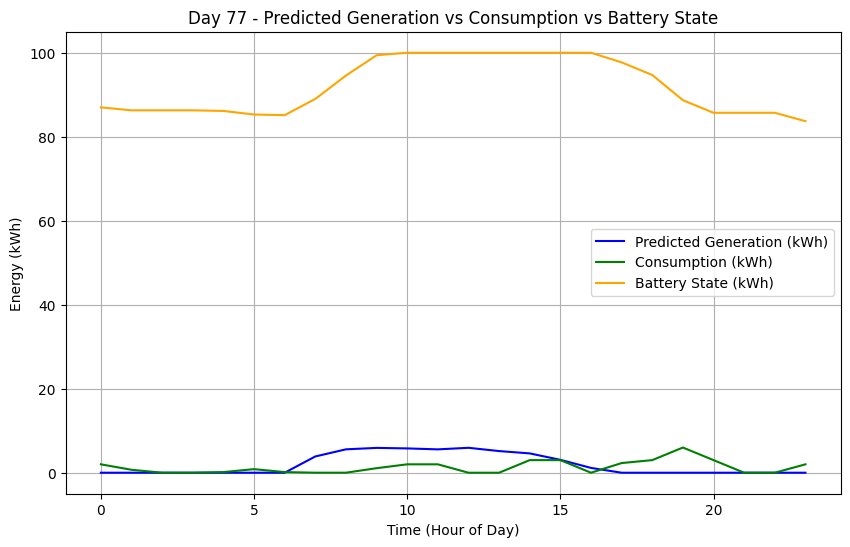

Simulating Day 78
[✔️] Appliance 0 scheduled at 21 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 9 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 18 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

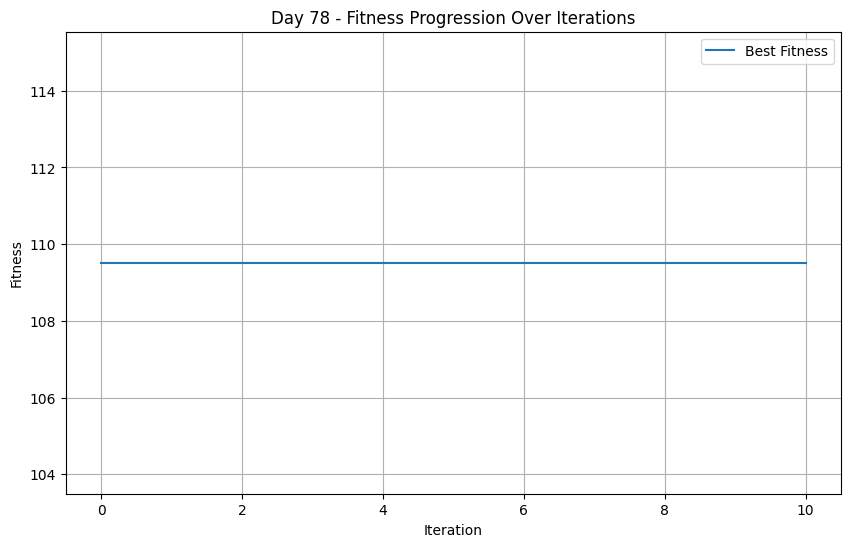

Appliance 0: Start Time = 21, Cost = 0.999999911456603
Appliance 1: Start Time = 9, Cost = 0.8935173314925493
Appliance 2: Start Time = 16, Cost = 0.9972834061532628
Appliance 3: Start Time = 18, Cost = 1.0
Appliance 4: Start Time = 7, Cost = 0.9999999998665222
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 10, Cost = 0.9998661697742351
Appliance 8: Start Time = 0, Cost = 1.0
Appliance 9: Start Time = 15, Cost = 0.9999920081294466
Appliance 10: Start Time = 18, Cost = 0.8005288597992837
===== Optimized Day 78 Schedule =====
Appliance 1: Start Time 21, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 9, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


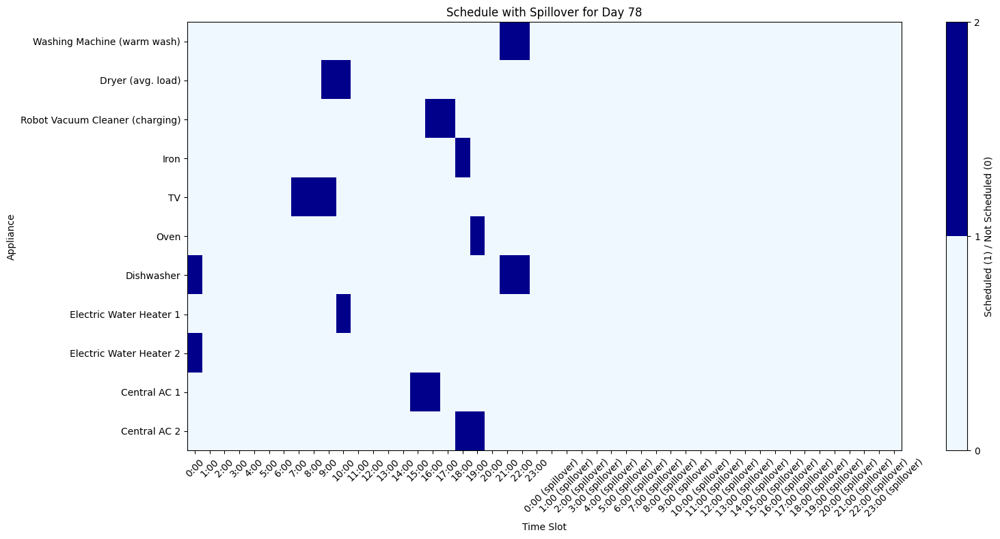

Best Fitness: 109.51515502328976
Updated Fitness: 109.51515502328976

===== Hourly Breakdown for Day 78 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.70              81.00
 1     0.00              0.00              81.00
 2     0.00              0.00              81.00
 3     0.00              0.00              81.00
 4     0.00              0.00              81.00
 5     0.00              0.00              81.00
 6     0.00              0.00              81.00
 7     3.81              0.15              84.66
 8     5.28              0.15              89.79
 9     5.57              3.15              92.21
10     5.57              3.70              94.08
11     5.54              0.00              99.62
12     5.49              0.00              100.00
13     4.31              0.00              100.00
14     3.21              0.00              100.00
15     1.96             

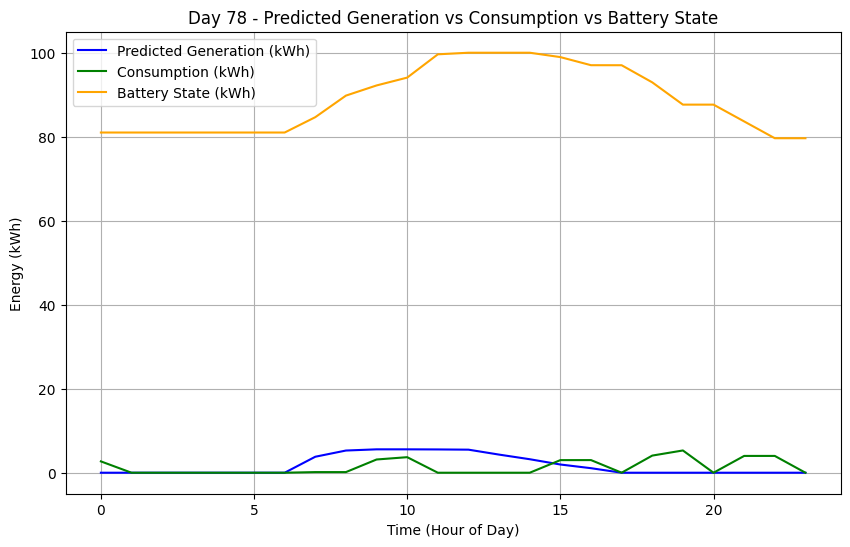

Simulating Day 79
[✔️] Appliance 0 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 14 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 7 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 17 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

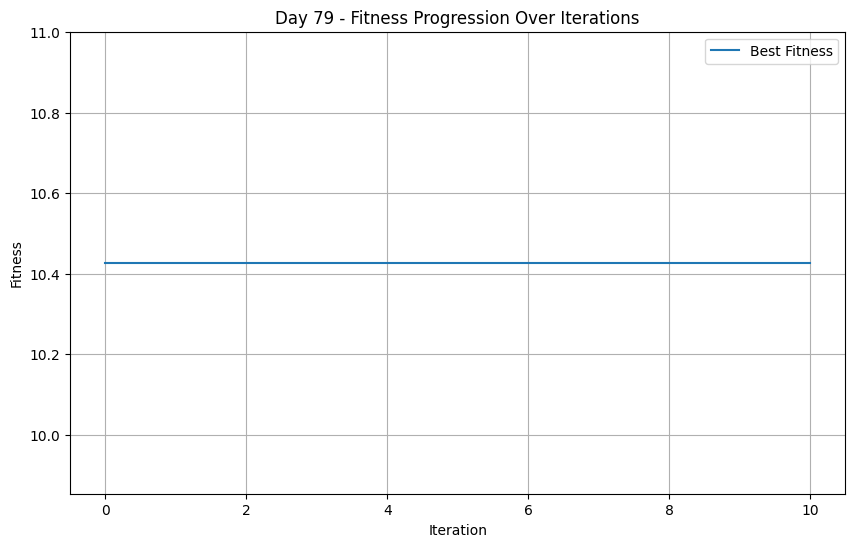

Appliance 0: Start Time = 10, Cost = 0.9668409537357504
Appliance 1: Start Time = 14, Cost = 0.9912593703020969
Appliance 2: Start Time = 20, Cost = 0.9997535561663053
Appliance 3: Start Time = 20, Cost = 1.0
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 23, Cost = 1.0
Appliance 8: Start Time = 7, Cost = 1.0
Appliance 9: Start Time = 12, Cost = 0.997784075794031
Appliance 10: Start Time = 17, Cost = 0.8239673366178503
===== Optimized Day 79 Schedule =====
Appliance 1: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 14, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 3: S

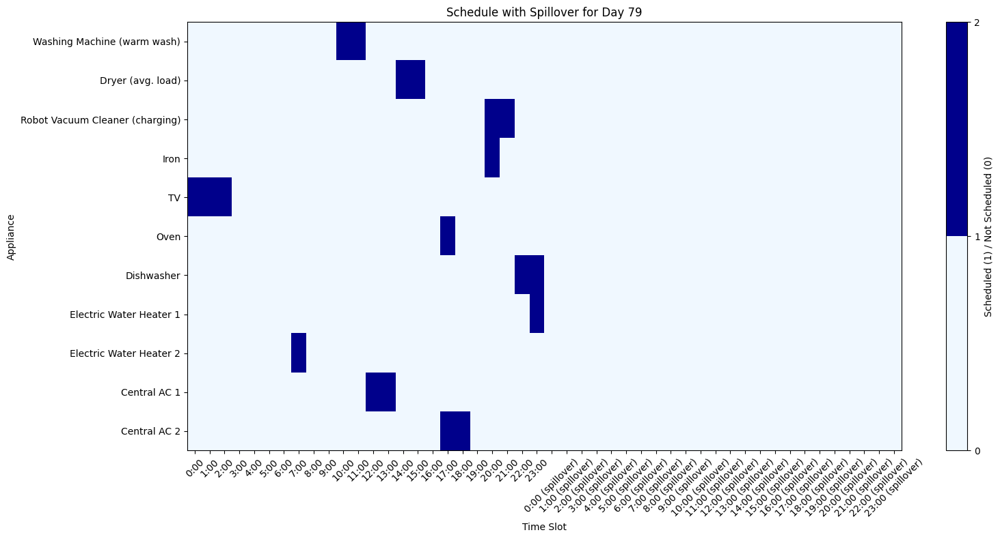

Best Fitness: 10.427539965851736
Updated Fitness: 10.427539965851736

===== Hourly Breakdown for Day 79 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              79.49
 1     0.00              0.15              79.34
 2     0.00              0.15              79.19
 3     0.00              0.00              79.19
 4     0.00              0.00              79.19
 5     0.00              0.00              79.19
 6     0.00              0.00              79.19
 7     3.74              0.70              82.24
 8     4.72              0.00              86.95
 9     4.91              0.00              91.86
10     5.67              2.00              95.53
11     5.59              2.00              99.11
12     5.74              3.00              100.00
13     4.05              3.00              100.00
14     2.96              3.00              99.96
15     2.04              

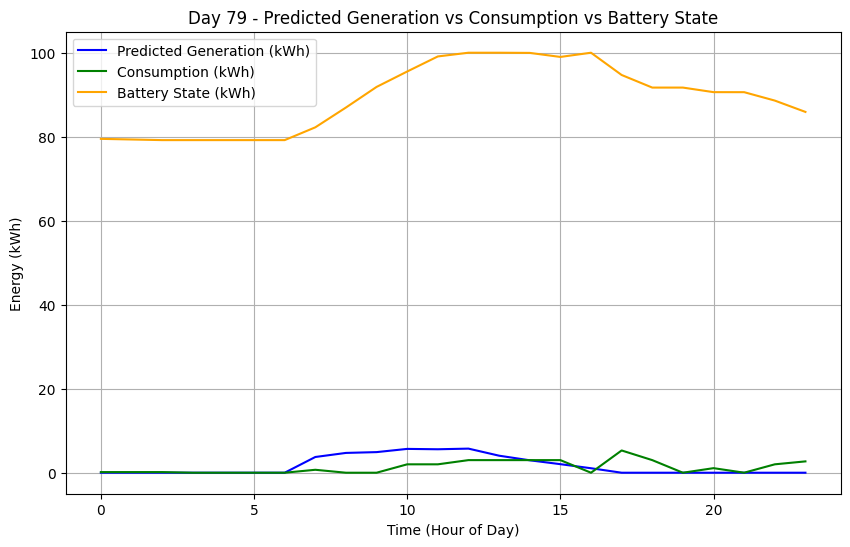

Simulating Day 80
[✔️] Appliance 0 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 19 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 13 (valid range: 0-23)
Initial_solution: [[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

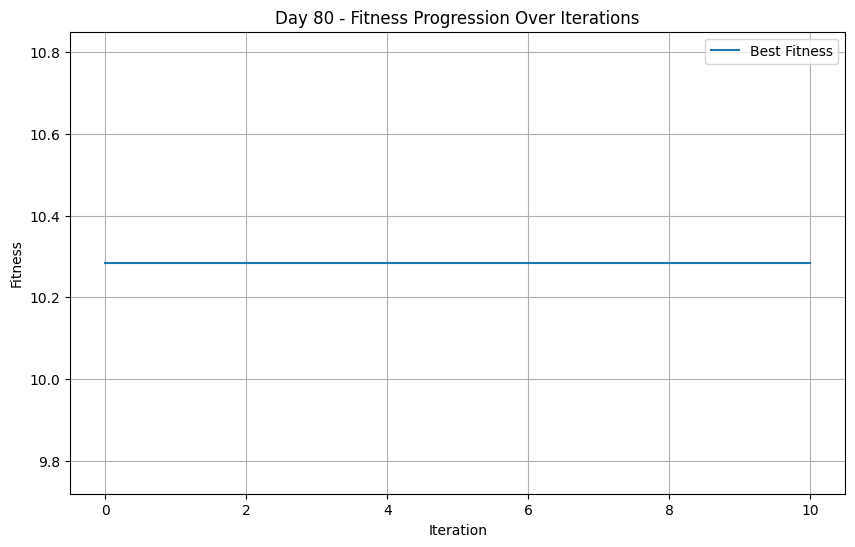

Appliance 0: Start Time = 0, Cost = 0.9668409537357504
Appliance 1: Start Time = 16, Cost = 0.9985227171960207
Appliance 2: Start Time = 5, Cost = 0.9263459719393353
Appliance 3: Start Time = 19, Cost = 1.0
Appliance 4: Start Time = 1, Cost = 1.0
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 11, Cost = 0.9999985132804853
Appliance 8: Start Time = 6, Cost = 1.0
Appliance 9: Start Time = 6, Cost = 0.8005288597992837
Appliance 10: Start Time = 13, Cost = 0.9912358497532158
===== Optimized Day 80 Schedule =====
Appliance 1: Start Time 0, Duration 2
Time Slots (first 24): [1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 16, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Ap

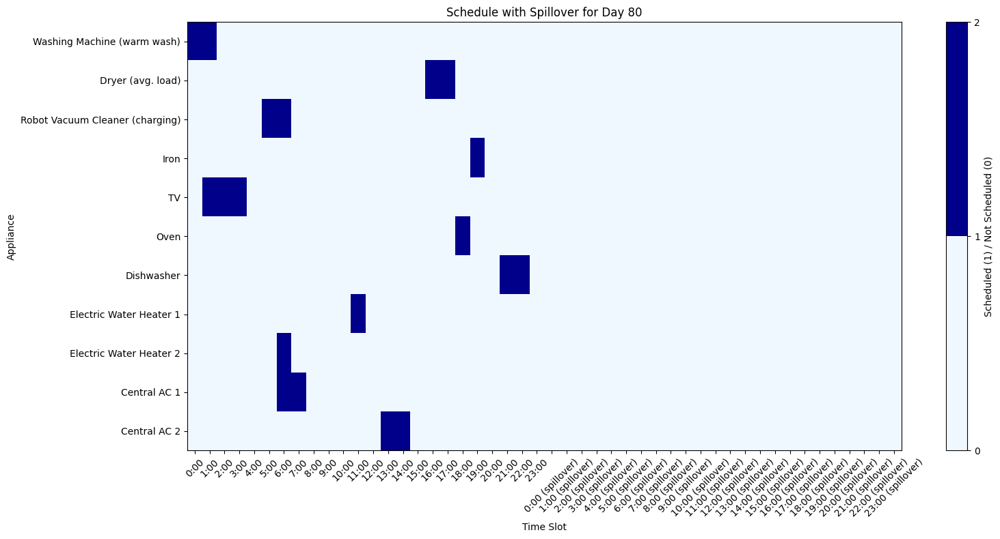

Best Fitness: 10.284530585302658
Updated Fitness: 10.284530585302658

===== Hourly Breakdown for Day 80 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              83.91
 1     0.00              2.15              81.76
 2     0.00              0.15              81.61
 3     0.00              0.15              81.46
 4     0.00              0.00              81.46
 5     0.00              0.01              81.45
 6     0.00              3.71              77.74
 7     2.48              3.00              77.22
 8     3.45              0.00              80.67
 9     5.23              0.00              85.89
10     5.28              0.00              91.17
11     5.42              0.70              95.90
12     5.61              0.00              100.00
13     4.48              3.00              100.00
14     3.14              3.00              100.00
15     1.64             

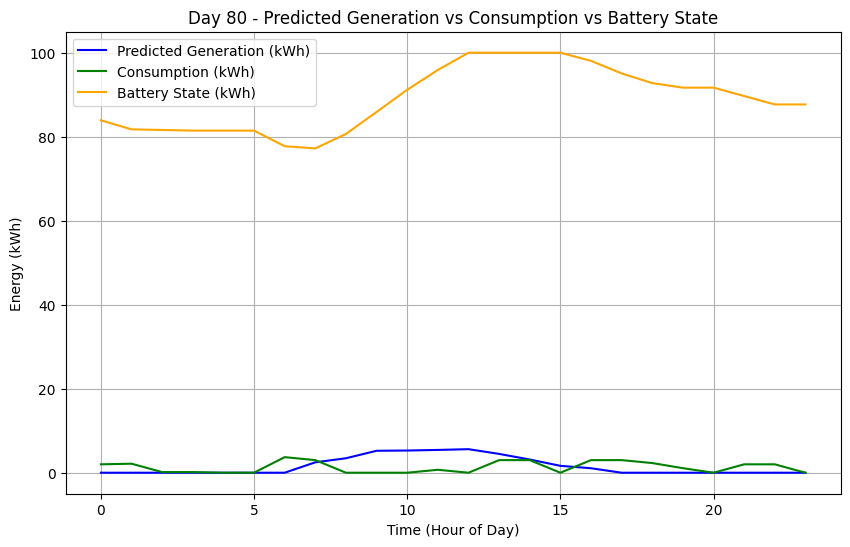

Simulating Day 81
[✔️] Appliance 0 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 23 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 15 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 19 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 12 (valid range: 0-23)
Initial_solution: [[0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0

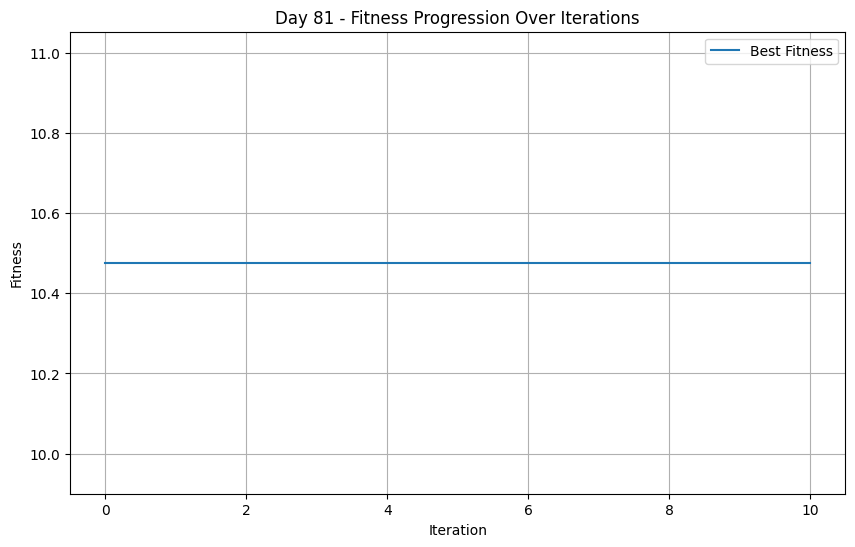

Appliance 0: Start Time = 3, Cost = 0.8935173314925493
Appliance 1: Start Time = 23, Cost = 0.999999911456603
Appliance 2: Start Time = 9, Cost = 0.9611627890033574
Appliance 3: Start Time = 15, Cost = 0.9999999999908653
Appliance 4: Start Time = 13, Cost = 0.9995636586524771
Appliance 5: Start Time = 19, Cost = 0.8239673366178503
Appliance 6: Start Time = 21, Cost = 0.8005288597992837
Appliance 7: Start Time = 18, Cost = 1.0
Appliance 8: Start Time = 12, Cost = 0.9999985132804853
Appliance 9: Start Time = 13, Cost = 0.9995636586524771
Appliance 10: Start Time = 12, Cost = 0.997784075794031
===== Optimized Day 81 Schedule =====
Appliance 1: Start Time 3, Duration 2
Time Slots (first 24): [0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 23, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Spillover into next day (next 24): [1 0 0 0 0 0 0 0 0 0 

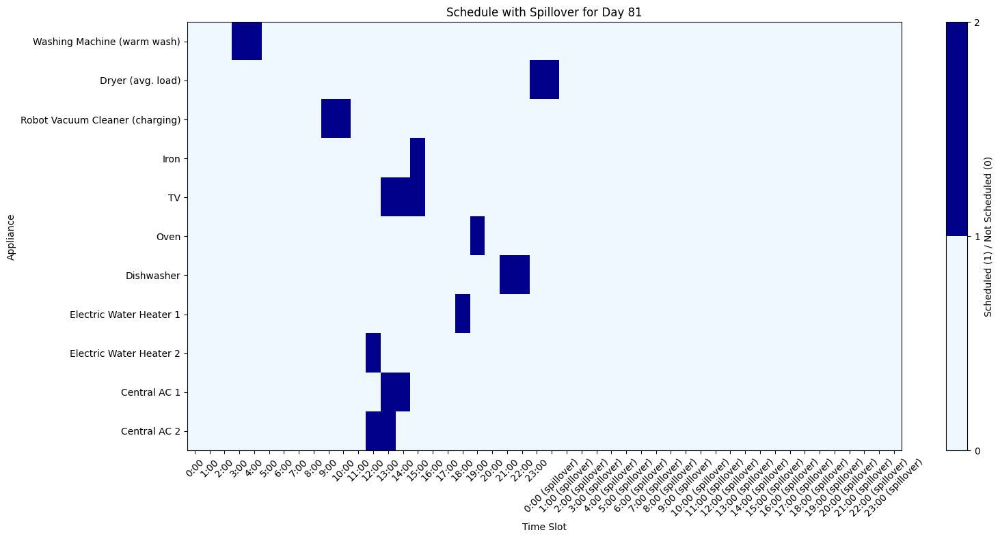

Best Fitness: 10.47608613473998
Updated Fitness: 10.47608613473998

===== Hourly Breakdown for Day 81 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              87.69
 1     0.00              0.00              87.69
 2     0.00              0.00              87.69
 3     0.00              2.00              85.69
 4     0.00              2.00              83.69
 5     0.00              0.00              83.69
 6     0.00              0.00              83.69
 7     2.89              0.00              86.58
 8     5.13              0.00              91.71
 9     5.91              0.01              97.62
10     5.85              0.01              100.00
11     6.02              0.00              100.00
12     5.90              3.70              100.00
13     5.35              6.15              99.20
14     4.93              3.15              100.00
15     3.01              

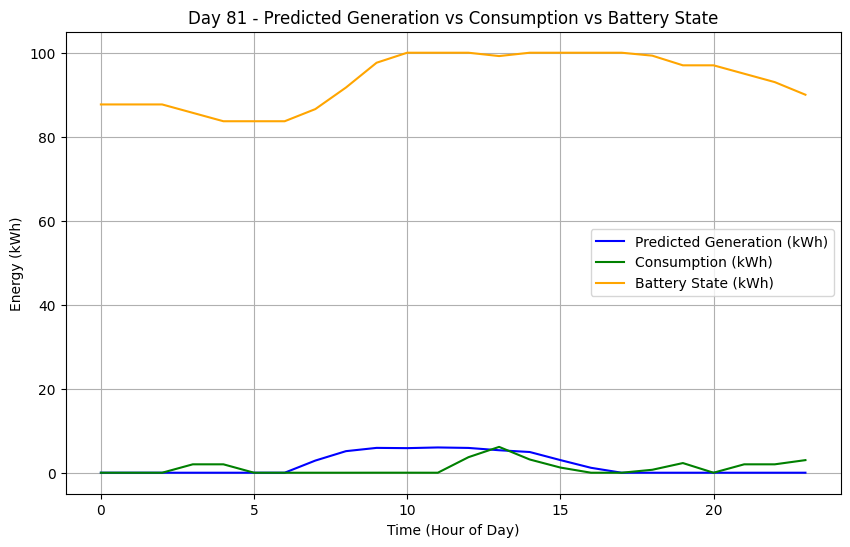

Simulating Day 82
[✔️] Appliance 0 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 9 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 13 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 17 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 1 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 20 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 

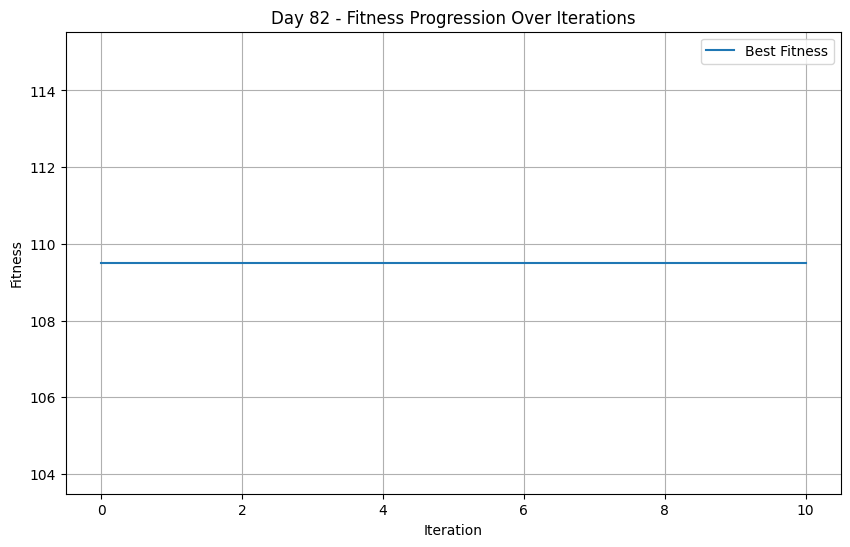

Appliance 0: Start Time = 11, Cost = 0.9820030111622706
Appliance 1: Start Time = 0, Cost = 100.0
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 12, Cost = 0.9998661697742351
Appliance 4: Start Time = 13, Cost = 0.9995636586524771
Appliance 5: Start Time = 17, Cost = 0.8239673366178503
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 4, Cost = 0.946009033486812
Appliance 8: Start Time = 1, Cost = 1.0
Appliance 9: Start Time = 22, Cost = 0.9999999999999974
Appliance 10: Start Time = 20, Cost = 0.8790146377404283
===== Optimized Day 82 Schedule =====
Appliance 1: Start Time 11, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 0, Duration 2
Time Slots (first 24): [1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

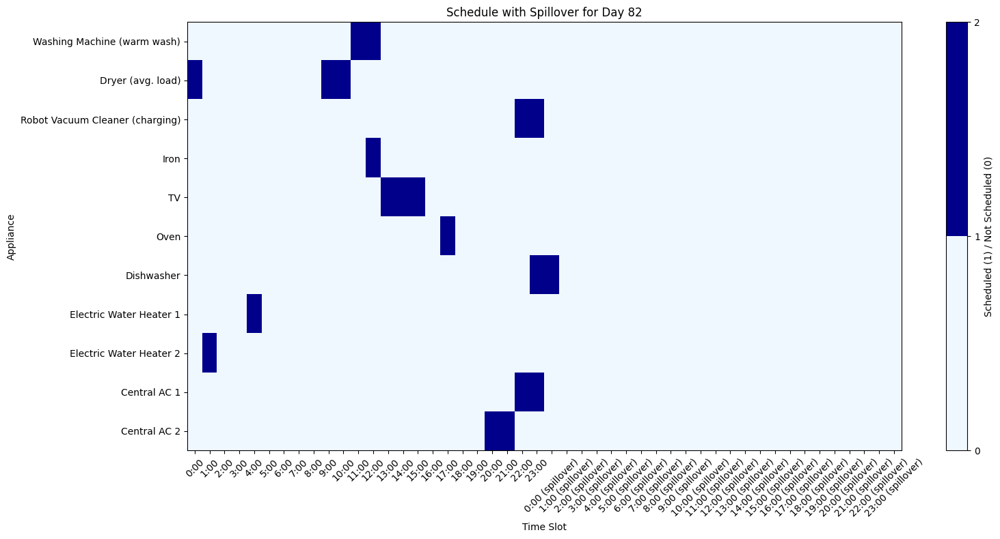

Best Fitness: 109.50938009578935
Updated Fitness: 109.50938009578935

===== Hourly Breakdown for Day 82 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              3.00              87.00
 1     0.00              0.70              86.30
 2     0.00              0.00              86.30
 3     0.00              0.00              86.30
 4     0.00              0.70              85.60
 5     0.00              0.00              85.60
 6     0.00              0.00              85.60
 7     3.51              0.00              89.11
 8     5.47              0.00              94.58
 9     5.71              3.00              97.29
10     6.04              3.00              100.00
11     6.04              2.00              100.00
12     6.08              3.08              100.00
13     5.16              0.15              100.00
14     4.38              0.15              100.00
15     3.02           

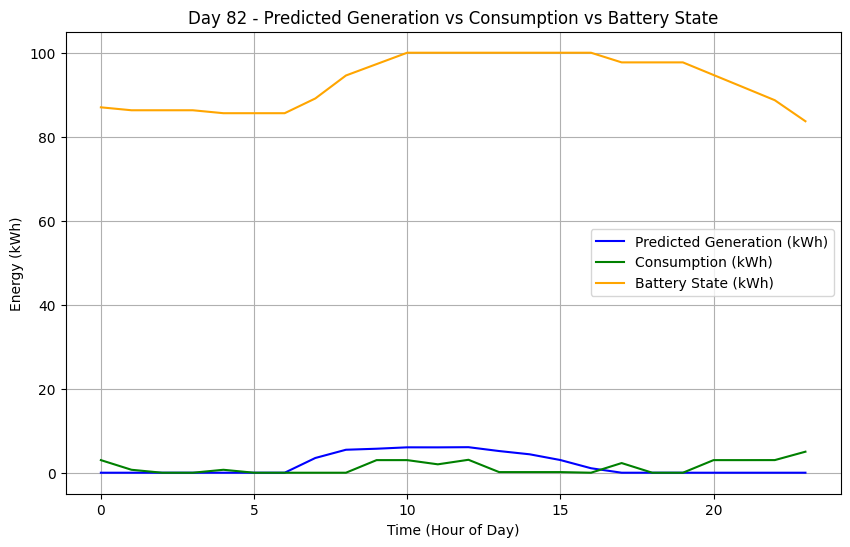

Simulating Day 83
[✔️] Appliance 0 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 9 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 10 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 6 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 21 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 16 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 0 (valid range: 0-23)
Initial_solution: [[0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0

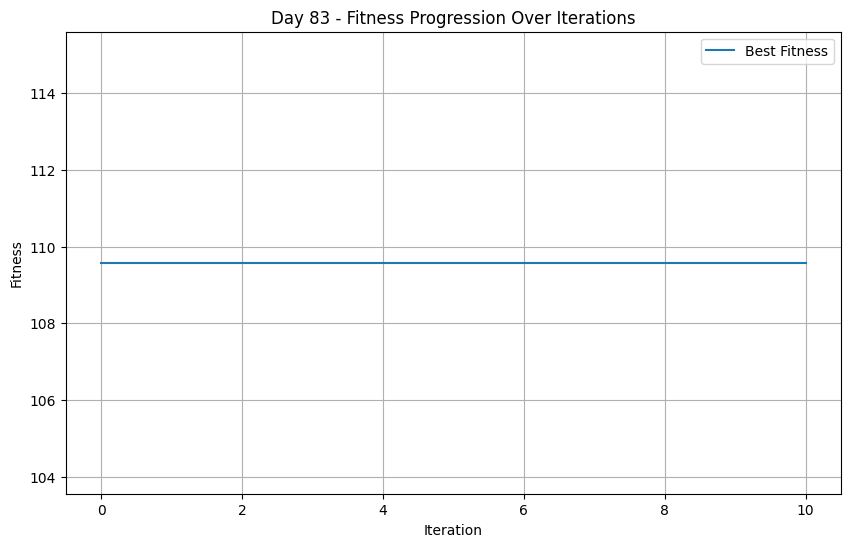

Appliance 0: Start Time = 4, Cost = 0.8742055907690023
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 9, Cost = 0.9611627890033574
Appliance 3: Start Time = 10, Cost = 0.946009033486812
Appliance 4: Start Time = 6, Cost = 0.9999999999954327
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 17, Cost = 1.0
Appliance 8: Start Time = 22, Cost = 0.9999985132804853
Appliance 9: Start Time = 16, Cost = 0.9999992566402426
Appliance 10: Start Time = 0, Cost = 1.0
===== Optimized Day 83 Schedule =====
Appliance 1: Start Time 4, Duration 2
Time Slots (first 24): [0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Ap

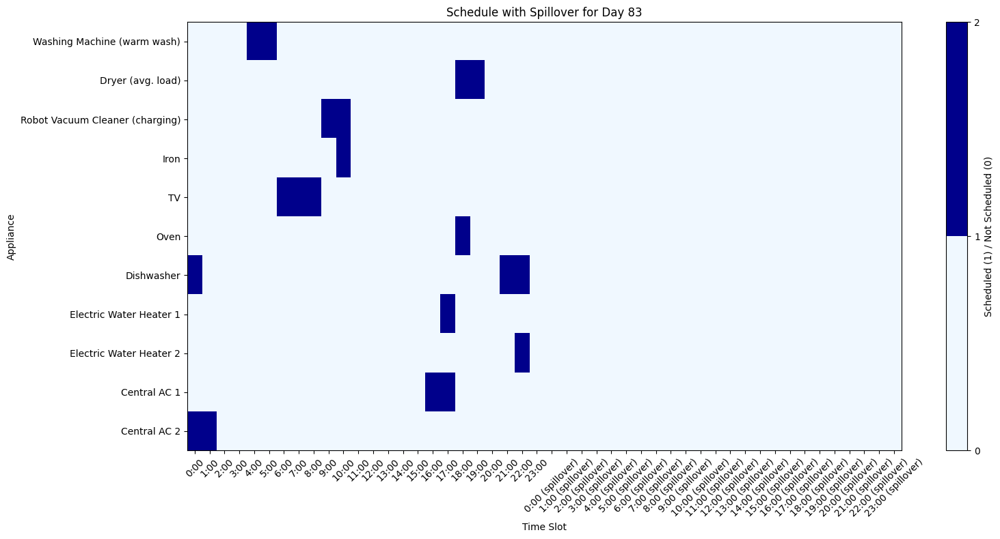

Best Fitness: 109.5817439527574
Updated Fitness: 109.5817439527574

===== Hourly Breakdown for Day 83 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              5.00              78.69
 1     0.00              3.00              75.69
 2     0.00              0.00              75.69
 3     0.00              0.00              75.69
 4     0.00              2.00              73.69
 5     0.00              2.00              71.69
 6     0.00              0.15              71.54
 7     4.71              0.15              76.10
 8     5.65              0.15              81.60
 9     5.89              0.01              87.48
10     5.81              1.09              92.20
11     5.75              0.00              97.95
12     5.74              0.00              100.00
13     2.60              0.00              100.00
14     2.12              0.00              100.00
15     1.21              0

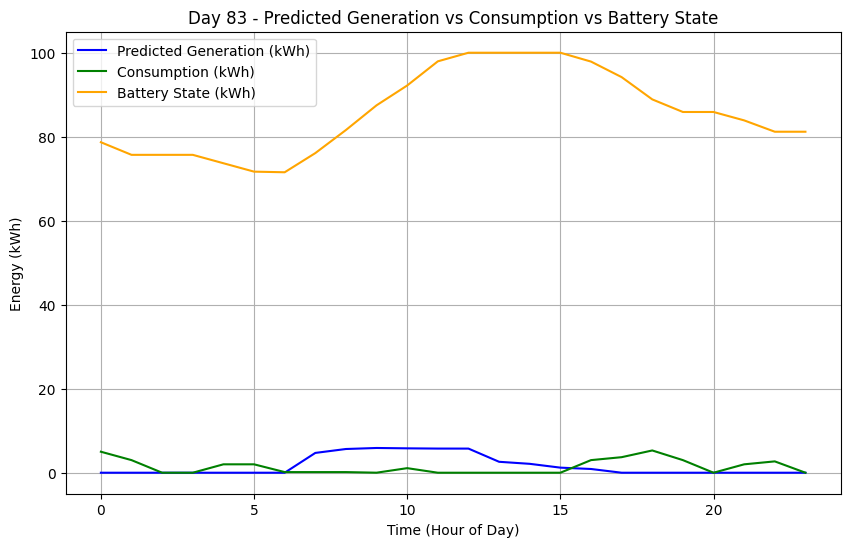

Simulating Day 84
[✔️] Appliance 0 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 8 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 0 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 22 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 14 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 5 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 4 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 

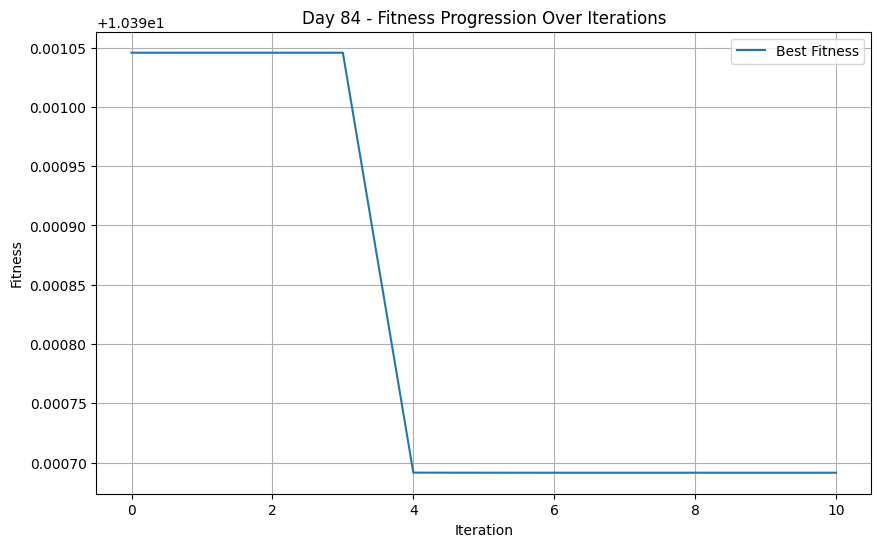

Appliance 0: Start Time = 22, Cost = 0.9999999858437042
Appliance 1: Start Time = 17, Cost = 0.9994859070012363
Appliance 2: Start Time = 8, Cost = 0.9516058550961713
Appliance 3: Start Time = 5, Cost = 0.995568151588062
Appliance 4: Start Time = 0, Cost = 1.0
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 22, Cost = 0.8239673366178503
Appliance 7: Start Time = 17, Cost = 1.0
Appliance 8: Start Time = 14, Cost = 0.995568151588062
Appliance 9: Start Time = 5, Cost = 0.8239673366178503
Appliance 10: Start Time = 7, Cost = 0.9999999461511998
===== Optimized Day 84 Schedule =====
Appliance 1: Start Time 22, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 17, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

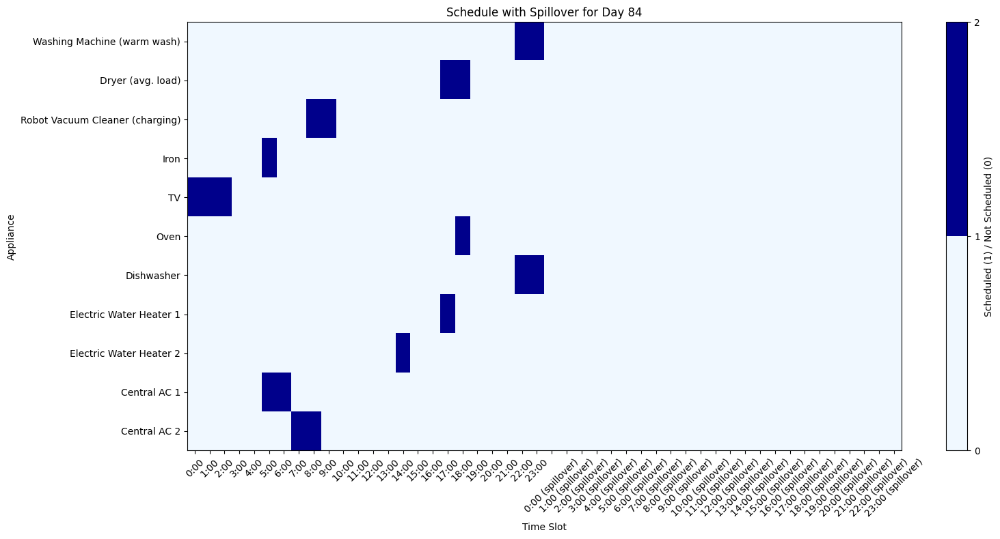

Best Fitness: 10.39069153030342
Updated Fitness: 10.39069153030342

===== Hourly Breakdown for Day 84 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.15              81.04
 1     0.00              0.15              80.89
 2     0.00              0.15              80.74
 3     0.00              0.00              80.74
 4     0.00              0.00              80.74
 5     0.00              4.08              76.66
 6     0.00              3.00              73.66
 7     3.16              3.00              73.82
 8     5.20              3.01              76.01
 9     5.12              0.01              81.12
10     3.41              0.00              84.53
11     2.89              0.00              87.42
12     3.87              0.00              91.29
13     1.67              0.00              92.96
14     1.47              0.70              93.73
15     1.23              0.00

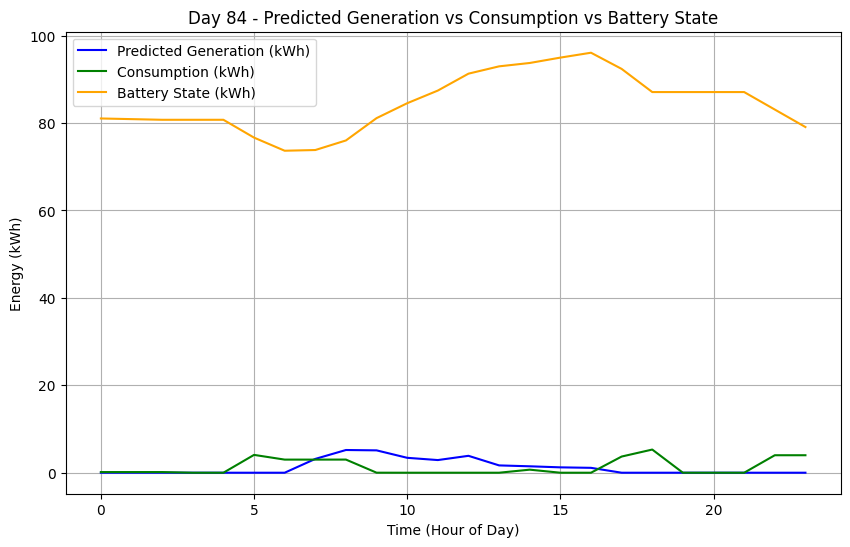

Simulating Day 85
[✔️] Appliance 0 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 18 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 12 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 2 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 3 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 4 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 9 (valid range: 0-23)
Initial_solution: [[0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0

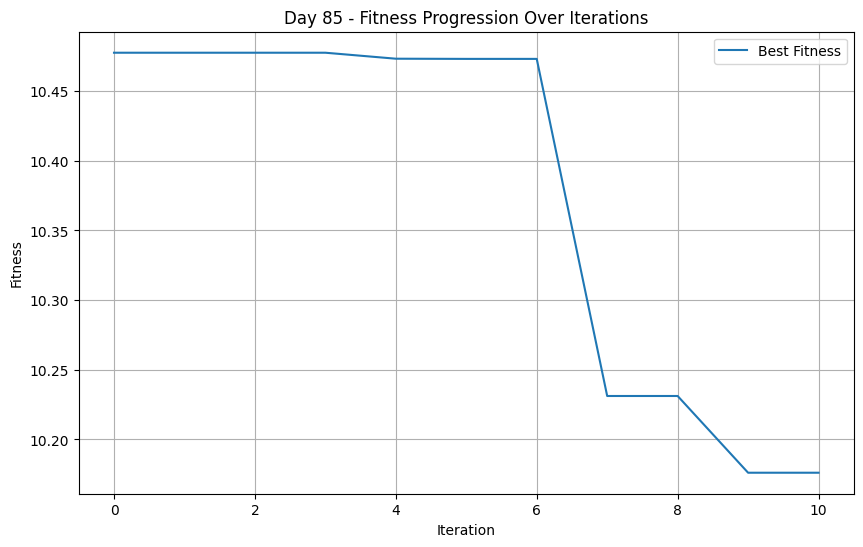

Appliance 0: Start Time = 2, Cost = 0.9193430918269522
Appliance 1: Start Time = 18, Cost = 0.999839909782793
Appliance 2: Start Time = 22, Cost = 0.9999416106148417
Appliance 3: Start Time = 5, Cost = 0.995568151588062
Appliance 4: Start Time = 12, Cost = 0.9999330848871175
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 23, Cost = 0.8790146377404283
Appliance 7: Start Time = 5, Cost = 0.7580292754808566
Appliance 8: Start Time = 3, Cost = 1.0
Appliance 9: Start Time = 7, Cost = 0.8239673366178503
Appliance 10: Start Time = 5, Cost = 0.9999999998665222
===== Optimized Day 85 Schedule =====
Appliance 1: Start Time 2, Duration 2
Time Slots (first 24): [0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 18, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 

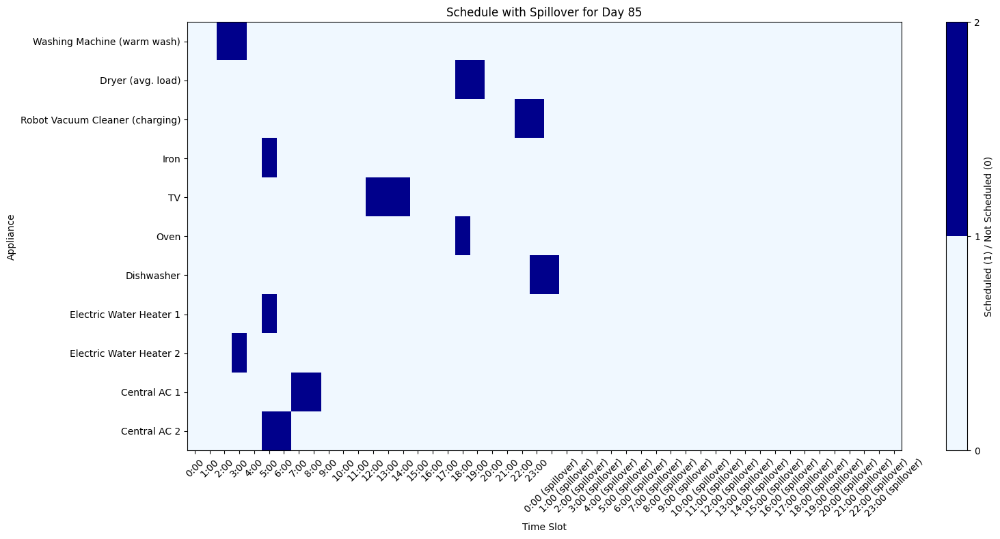

Best Fitness: 10.176165958204706
Updated Fitness: 10.176165958204706

===== Hourly Breakdown for Day 85 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              0.00              79.08
 1     0.00              0.00              79.08
 2     0.00              2.00              77.08
 3     0.00              2.70              74.38
 4     0.00              0.00              74.38
 5     0.00              4.78              69.60
 6     0.00              3.00              66.60
 7     1.37              3.00              64.97
 8     2.44              3.00              64.41
 9     1.96              0.00              66.37
10     1.68              0.00              68.05
11     1.51              0.00              69.56
12     2.16              0.15              71.56
13     1.88              0.15              73.29
14     1.72              0.15              74.86
15     2.25              0.

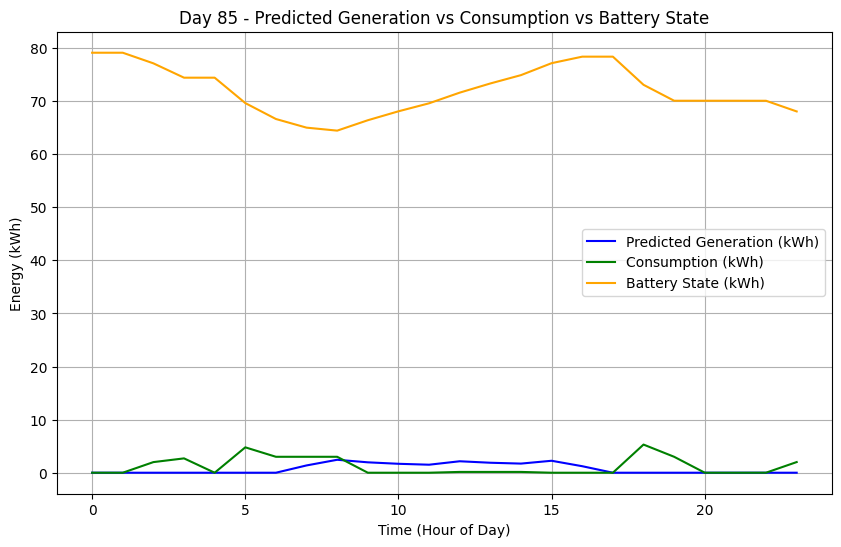

Simulating Day 86
[✔️] Appliance 0 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 1 scheduled at 16 (valid range: 7-23)
[✔️] Appliance 2 scheduled at 11 (valid range: 0-23)
[✔️] Appliance 3 scheduled at 17 (valid range: 0-23)
[✔️] Appliance 4 scheduled at 22 (valid range: 0-23)
[✔️] Appliance 5 scheduled at 18 (valid range: 17-19)
[✔️] Appliance 6 scheduled at 23 (valid range: 21-23)
[✔️] Appliance 7 scheduled at 18 (valid range: 0-23)
[✔️] Appliance 8 scheduled at 23 (valid range: 0-23)
[✔️] Appliance 9 scheduled at 20 (valid range: 0-23)
[✔️] Appliance 10 scheduled at 14 (valid range: 0-23)
Initial_solution: [[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 

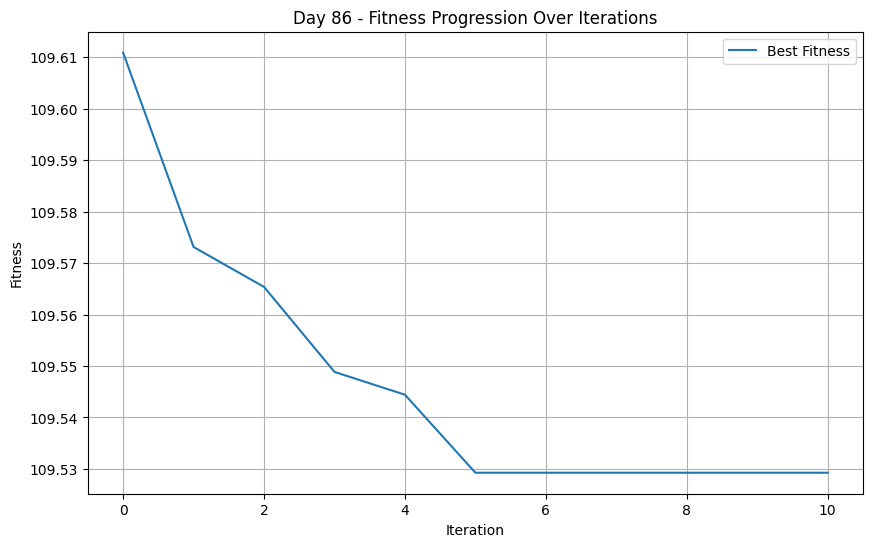

Appliance 0: Start Time = 10, Cost = 0.9668409537357504
Appliance 1: Start Time = 13, Cost = 0.9820030111622706
Appliance 2: Start Time = 10, Cost = 0.970054506872851
Appliance 3: Start Time = 17, Cost = 1.0
Appliance 4: Start Time = 22, Cost = 0.8790146377404283
Appliance 5: Start Time = 18, Cost = 0.8005288597992837
Appliance 6: Start Time = 0, Cost = 100.0
Appliance 7: Start Time = 18, Cost = 1.0
Appliance 8: Start Time = 20, Cost = 0.995568151588062
Appliance 9: Start Time = 20, Cost = 0.9999999999954327
Appliance 10: Start Time = 15, Cost = 0.9352412021670541
===== Optimized Day 86 Schedule =====
Appliance 1: Start Time 10, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Appliance 2: Start Time 13, Duration 2
Time Slots (first 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Spillover into next day (next 24): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

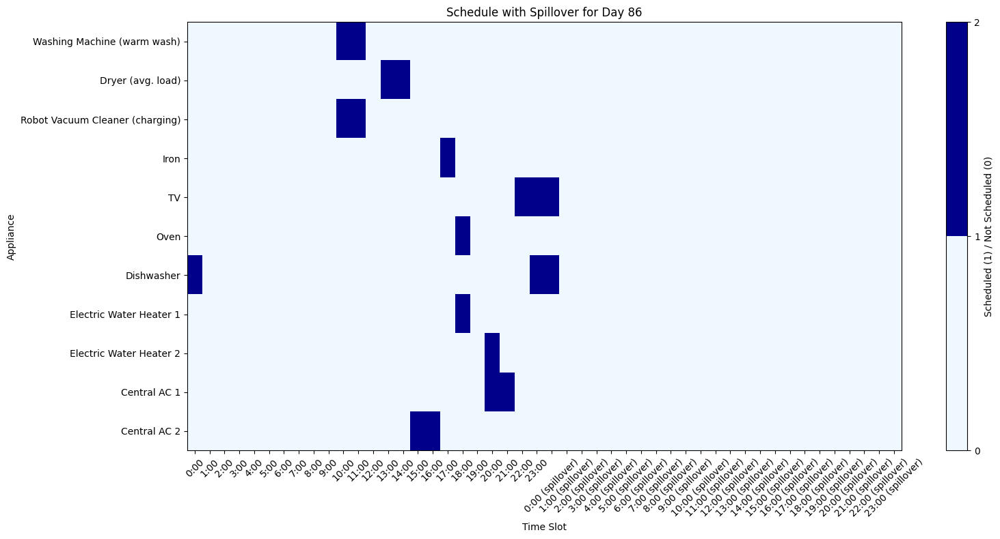

Best Fitness: 109.52925132306113
Updated Fitness: 109.52925132306113

===== Hourly Breakdown for Day 86 =====
Hour   Generation (kWh)   Consumption (kWh)   Battery State (kWh) 
------------------------------------------------------------
 0     0.00              2.00              66.03
 1     0.00              0.00              66.03
 2     0.00              0.00              66.03
 3     0.00              0.00              66.03
 4     0.00              0.00              66.03
 5     0.00              0.00              66.03
 6     0.00              0.00              66.03
 7     1.45              0.00              67.48
 8     2.09              0.00              69.57
 9     1.76              0.00              71.33
10     2.01              2.01              71.33
11     2.55              2.01              71.88
12     2.85              0.00              74.73
13     2.85              3.00              74.58
14     2.92              3.00              74.50
15     2.23              3.

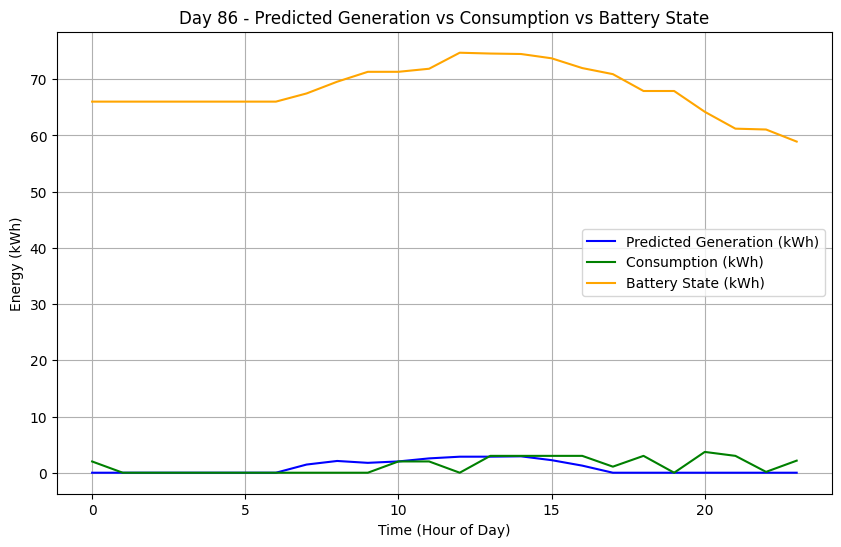

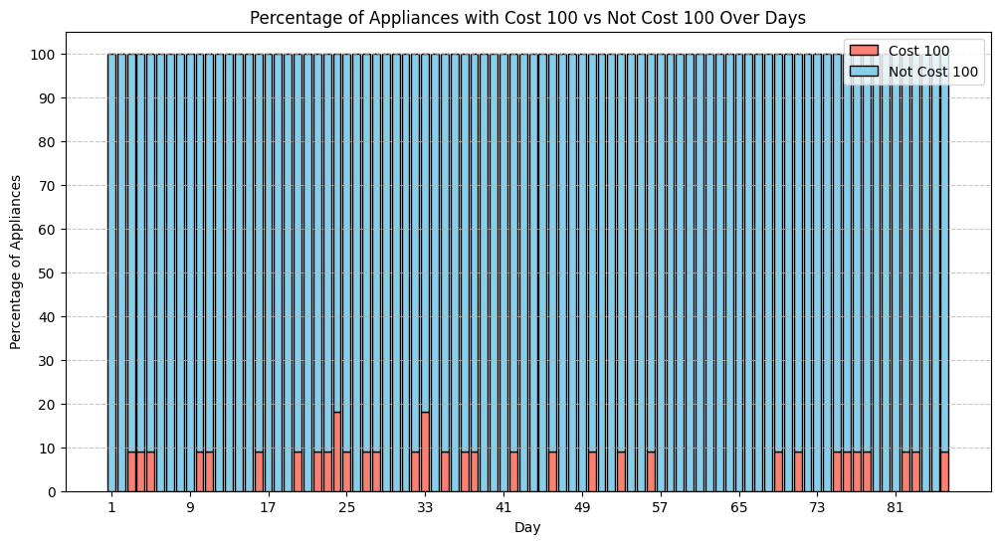

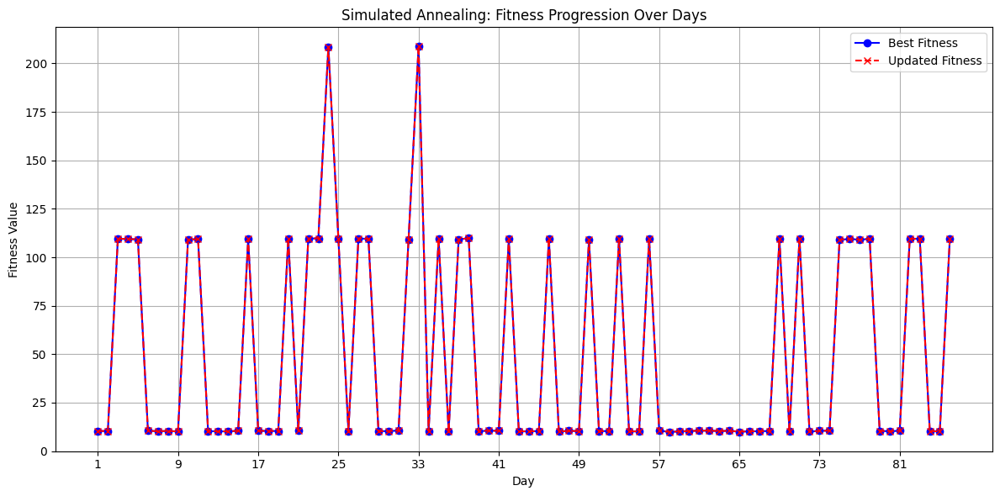

In [16]:
sa_results = []
total_days = 86
runs = 1 # Run the simulation once for now
best_fitness_values = []
sa_max_iterations = 10
cooling_rate = 0.995
initial_temperature = 100000
fitness_progression_all_days = []
# Initialize battery state and spillover for the first day
initial_battery_state = 0
battery_state_of_charge_sa = initial_battery_state
previous_day_spillover_sa = np.zeros((N, 2 * S))

deviations_per_day = []  # Store deviation per appliance per day
percentage_per_day = []  # Store daily percentage of appliances with a cost of 100
fitness_over_days = []  # Store best fitness values
updated_fitness_over_days = []  # Store updated fitness values

def calculate_deviation(actual_start_time, desired_start_time):
    return actual_start_time - desired_start_time

for rpt in range(1, runs + 1):
    print(f"\n===== Simulating Run {rpt} =====")
    battery_state_of_charge_sa = initial_battery_state
    previous_day_spillover_sa = np.zeros((N, 2 * S))

    for day in range(total_days):
        print(f"Simulating Day {day + 1}")

        # Reset temperature at the start of each day
        temperature = initial_temperature

        # Prepare input data for the day
        current_predicted_generation = predicted_generation_train[day % len(predicted_generation_train)]
        next_predicted_generation = predicted_generation_train[(day + 1) % len(predicted_generation_train)]
        predicted_generation_48h = np.concatenate([current_predicted_generation, next_predicted_generation])

        appliance_cost = generate_cost_matrix(N, S, appliance_info)
        start_time_sa = time.time()

        best_solution_sa, best_fitness_sa, fitness_progression_sa = simulated_annealing_with_spillover(
            previous_day_spillover_sa,
            day,
            initial_temperature,
            cooling_rate,
            sa_max_iterations,
            battery_state_of_charge_sa,
            predicted_generation_48h,
            appliance_cost,
            appliance_consumption,
            active_durations,
            Q_min,
            Q_max,
            Z_min,
            Z_max,
            Θ,
            valid_slot_dict
        )

        end_time_sa = time.time()
        fitness_progression_all_days.append(fitness_progression_sa)  # Store fitness progression
        daily_deviation = []
        daily_costs = []
        appliances_with_100_cost = 0

        for n in range(N):
            desired_start_time = desired_start_times[n]
            actual_start_time = find_new_start_time(
                best_solution_sa[n, :S],
                best_solution_sa[n, S:],
                np.any(previous_day_spillover_sa)
            )
            deviation = calculate_deviation(actual_start_time, desired_start_time)
            appliance_total_cost = appliance_cost[n, actual_start_time]

            if appliance_total_cost == 100:
                appliances_with_100_cost += 1

            #print(f"Appliance {n+1}: Desired Start = {desired_start_time}, Actual Start = {actual_start_time}, Deviation = {deviation}, Total Cost = {appliance_total_cost}")

            daily_deviation.append(deviation)
            daily_costs.append(appliance_total_cost)

        deviations_per_day.append(daily_deviation)
        percentage_per_day.append((appliances_with_100_cost / N) * 100)

        # Step 4: Initialize daily battery state
        battery_state_sa = np.zeros(48)

        # Step 5: Simulate hourly operations for the day
        for hour in range(48):
            generation = predicted_generation_48h[hour]
            required_consumption_sa = np.sum(best_solution_sa[:, hour] * appliance_consumption)
            available_energy_sa = battery_state_of_charge_sa if hour == 0 else battery_state_sa[hour - 1]
            actual_consumption_sa = min(required_consumption_sa, available_energy_sa)
            battery_state_sa[hour] = (battery_state_of_charge_sa + generation - actual_consumption_sa
                                      if hour == 0 else
                                      battery_state_sa[hour - 1] + generation - actual_consumption_sa)
            battery_state_sa[hour] = np.clip(battery_state_sa[hour], Z_min, Z_max)
            if actual_consumption_sa < required_consumption_sa:
                best_solution_sa[:, hour] = 0  # Disable usage if insufficient energy is available

        update_best_fitness_sa = fitness(
            best_solution_sa,
            appliance_cost,
            previous_day_spillover_sa,
            np.any(previous_day_spillover_sa),
            penalty=1000
        )

        # Track fitness values
        fitness_over_days.append(best_fitness_sa)
        updated_fitness_over_days.append(update_best_fitness_sa)

        sa_results.append([
            rpt,
            day + 1,
            "Simulated Annealing",
            best_fitness_sa,
            update_best_fitness_sa,
            end_time_sa - start_time_sa
        ])

        display_schedule(best_solution_sa, day, previous_day_spillover_sa)
        visualize_schedule_with_spillover(best_solution_sa, day, appliance_names)
        print(f"Best Fitness: {best_fitness_sa}")
        print(f"Updated Fitness: {update_best_fitness_sa}")
        display_hourly_breakdown(day, predicted_generation_48h, best_solution_sa, appliance_consumption, battery_state_sa)

        previous_day_spillover_sa = best_solution_sa
        battery_state_of_charge_sa = battery_state_sa[23]

        # Plot generation, consumption, battery
        plt.figure(figsize=(10, 6))
        plt.plot(range(24), predicted_generation_48h[:24], label='Predicted Generation (kWh)', color='blue')
        plt.plot(range(24), [np.sum(best_solution_sa[:, hour] * appliance_consumption) for hour in range(24)], label='Consumption (kWh)', color='green')
        plt.plot(range(24), battery_state_sa[:24], label='Battery State (kWh)', color='orange')
        plt.xlabel('Time (Hour of Day)')
        plt.ylabel('Energy (kWh)')
        plt.title(f'Day {day + 1} - Predicted Generation vs Consumption vs Battery State')
        plt.legend()
        plt.grid(True)
        plt.show()

    # === Stacked Bar Chart ===
    days = list(range(1, len(percentage_per_day) + 1))
    percentage_not_cost_100 = [100 - p for p in percentage_per_day]

    plt.figure(figsize=(12, 6))
    plt.bar(days, percentage_per_day, color='salmon', edgecolor='black', label='Cost 100')
    plt.bar(days, percentage_not_cost_100, bottom=percentage_per_day, color='skyblue', edgecolor='black', label='Not Cost 100')
    plt.xlabel('Day')
    plt.ylabel('Percentage of Appliances')
    plt.title('Percentage of Appliances with Cost 100 vs Not Cost 100 Over Days')
    plt.xticks(range(1, total_days + 1, max(1, total_days // 10)))
    plt.yticks(np.arange(0, 110, 10))
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # === Fitness Progression Plot ===
    plt.figure(figsize=(12, 6))
    plt.plot(days, fitness_over_days, marker='o', linestyle='-', color='blue', label='Best Fitness')
    plt.plot(days, updated_fitness_over_days, marker='x', linestyle='--', color='red', label='Updated Fitness')
    plt.xlabel('Day')
    plt.ylabel('Fitness Value')
    plt.title('Simulated Annealing: Fitness Progression Over Days')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(1, total_days + 1, max(1, total_days // 10)))
    plt.tight_layout()
    plt.show()

    # === Save to DataFrames ===
    sa_results_df = pd.DataFrame(sa_results, columns=["Run", "Day", "Method", "Best Fitness", "Updated Fitness", "Execution Time (s)"])
    deviations_df = pd.DataFrame(deviations_per_day, columns=[f"Appliance {i+1}" for i in range(N)])


=====  Simulated Annealing (SA) Grouped Summary by Run =====
   Run  Days Count  Best Fitness Mean  Best Fitness Std  Best Fitness Min  \
0    1          86          49.531581         53.288344          9.896939   

   Best Fitness Max  Best Fitness Median  Updated Fitness Mean  \
0        208.743038            10.476357             49.531692   

   Updated Fitness Std  Updated Fitness Min  Updated Fitness Max  \
0             53.28847             9.896939           208.743038   

   Updated Fitness Median  Total Execution Time (s)  
0               10.476357                 23.870849  

===== Best Fitness vs Updated Fitness per Day =====
    Run  Day  Best Fitness  Updated Fitness
0     1    1     10.405844        10.405844
1     1    2     10.364616        10.364616
2     1    3    109.614241       109.614241
3     1    4    109.380422       109.389966
4     1    5    109.259909       109.259909
..  ...  ...           ...              ...
81    1   82    109.509380       109.509380


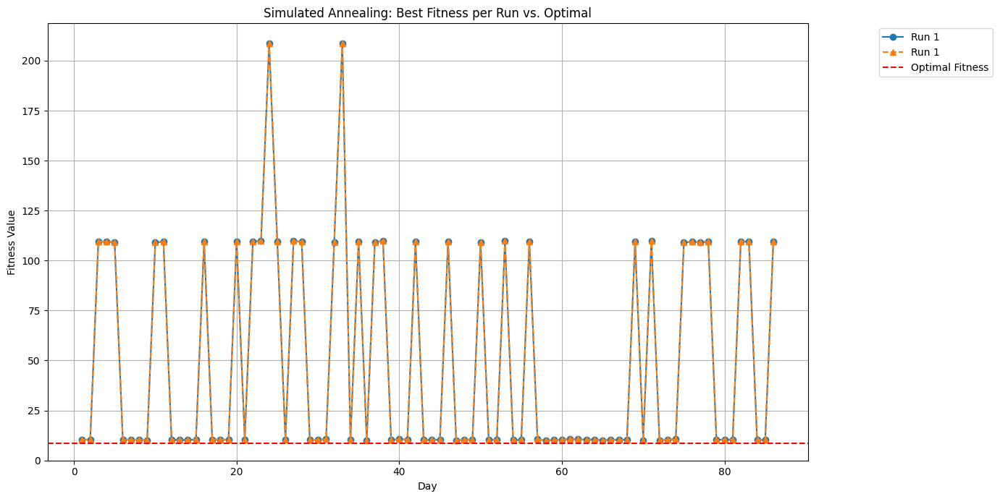

In [17]:
# Group SA results by 'Run' and calculate statistics
sa_summary = sa_results_df.groupby("Run").agg({
    "Day": "count",
    "Best Fitness": ["mean", "std", "min", "max", "median"],
    "Updated Fitness" : ["mean", "std", "min", "max", "median"],
    "Execution Time (s)": "sum"
})

# Rename columns for clarity
sa_summary.columns = [
    "Days Count",
    "Best Fitness Mean", "Best Fitness Std", "Best Fitness Min", "Best Fitness Max", "Best Fitness Median",
    "Updated Fitness Mean", "Updated Fitness Std", "Updated Fitness Min", "Updated Fitness Max", "Updated Fitness Median",
    "Total Execution Time (s)"
]
sa_summary.reset_index(inplace=True)



print("\n=====  Simulated Annealing (SA) Grouped Summary by Run =====")
print(sa_summary)
# Extract relevant columns (Run, Day, Best Fitness, and Updated Fitness)
fitness_comparison_SA30Run = sa_results_df[["Run", "Day", "Best Fitness", "Updated Fitness"]]

# Optionally, reset the index for a cleaner display
fitness_comparison_SA30Run.reset_index(drop=True, inplace=True)

# Display the comparison table
print("\n===== Best Fitness vs Updated Fitness per Day =====")
print(fitness_comparison_SA30Run)

# Save the DataFrame to an Excel file
fitness_comparison_SA30Run.to_excel("fitness_comparison_SA30Run.xlsx", index=False)

print(" Fitness comparison saved to 'fitness_comparison_SA30Runs.xlsx'")

import matplotlib.pyplot as plt
import numpy as np

# Compute Optimal Fitness once
optimal_fitness = sum(np.min(appliance_cost, axis=1))  # Minimum possible total cost



# Plot each run separately
plt.figure(figsize=(14, 7))
unique_runs = sa_results_df["Run"].unique()

for run_id in unique_runs:
    run_data = sa_results_df[sa_results_df["Run"] == run_id]
    plt.plot(run_data["Day"], run_data["Best Fitness"], label=f"Run {run_id}", marker='o', linestyle='-')
    plt.plot(run_data["Day"], run_data["Updated Fitness"], label=f"Run {run_id}", marker='^', linestyle='--')

plt.axhline(y=optimal_fitness, color='red', linestyle='--', label="Optimal Fitness")

plt.xlabel("Day")
plt.ylabel("Fitness Value")
plt.title("Simulated Annealing: Best Fitness per Run vs. Optimal")
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.grid(True)
plt.tight_layout()
plt.show()
